# Week 1
# Student: Roxana Soto


# Contenido


__1. Get Data__  
__2. Data exploration__  
__3. Data Cleaning o Prepare Data__  
__4. Feature Engineering__  
__5. Modeling & Evaluation__  
__6. Ensemble Methods__  

In [1]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.pipeline import Pipeline, make_pipeline
from scipy.stats import skew
from sklearn.decomposition import PCA, KernelPCA
from sklearn.preprocessing import Imputer

from sklearn.model_selection import cross_val_score, GridSearchCV, KFold
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.svm import SVR, LinearSVR
from sklearn.linear_model import ElasticNet, SGDRegressor, BayesianRidge
from sklearn.kernel_ridge import KernelRidge


C:\Users\Roxan\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


# Get Data

In [3]:
train = pd.read_csv(r'C:\Users\Roxan\Anaconda3\Tasks_SistemasInteligentes\HousePrices\input\train.csv')
test = pd.read_csv(r'C:\Users\Roxan\Anaconda3\Tasks_SistemasInteligentes\HousePrices\input\test.csv')


In [4]:
train.head()


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [6]:
train.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [7]:
test.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
count,1459.000000,1459.000000,1232.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1444.000000,1458.000000,...,1458.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000
mean,2190.000000,57.378341,68.580357,9819.161069,6.078821,5.553804,1971.357779,1983.662783,100.709141,439.203704,...,472.768861,93.174777,48.313914,24.243317,1.794380,17.064428,1.744345,58.167923,6.104181,2007.769705
std,421.321334,42.746880,22.376841,4955.517327,1.436812,1.113740,30.390071,21.130467,177.625900,455.268042,...,217.048611,127.744882,68.883364,67.227765,20.207842,56.609763,30.491646,630.806978,2.722432,1.301740
min,1461.000000,20.000000,21.000000,1470.000000,1.000000,1.000000,1879.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000
25%,1825.500000,20.000000,58.000000,7391.000000,5.000000,5.000000,1953.000000,1963.000000,0.000000,0.000000,...,318.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000
50%,2190.000000,50.000000,67.000000,9399.000000,6.000000,5.000000,1973.000000,1992.000000,0.000000,350.500000,...,480.000000,0.000000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000
75%,2554.500000,70.000000,80.000000,11517.500000,7.000000,6.000000,2001.000000,2004.000000,164.000000,753.500000,...,576.000000,168.000000,72.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000
max,2919.000000,190.000000,200.000000,56600.000000,10.000000,9.000000,2010.000000,2010.000000,1290.000000,4010.000000,...,1488.000000,1424.000000,742.000000,1012.000000,360.000000,576.000000,800.000000,17000.000000,12.000000,2010.000000


# Data Exploration


[10, 14, 0, 180]

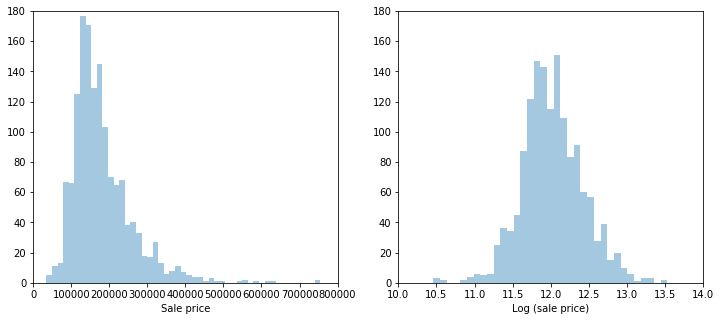

In [8]:
plt.figure(figsize=(12,5))
#f, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)
plt.subplot(121)
sns.distplot(train['SalePrice'],kde=False)
plt.xlabel('Sale price')
plt.axis([0,800000,0,180])
plt.subplot(122)
sns.distplot(np.log(train['SalePrice']),kde=False)
plt.xlabel('Log (sale price)')
plt.axis([10,14,0,180])


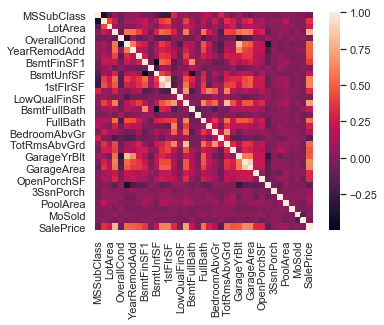

In [9]:
corr = train.select_dtypes(include = ['float64', 'int64']).iloc[:,1:].corr()
#fig = plt.figure()
sns.set(font_scale=1)  
sns.heatmap(corr, vmax=1, square=True)


In [10]:
corr_list = corr['SalePrice'].sort_values(axis=0,ascending=False).iloc[1:]
corr_list

OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
GarageYrBlt      0.486362
MasVnrArea       0.477493
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.351799
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   -0.128578
KitchenAbvGr    -0.135907
Name: SalePrice, dtype: float64

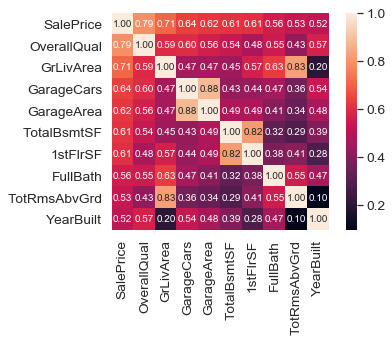

In [11]:
k = 10 #number of variables for heatmap
cols = corr.nlargest(k, 'SalePrice')['SalePrice'].index
cm = np.corrcoef(train[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()


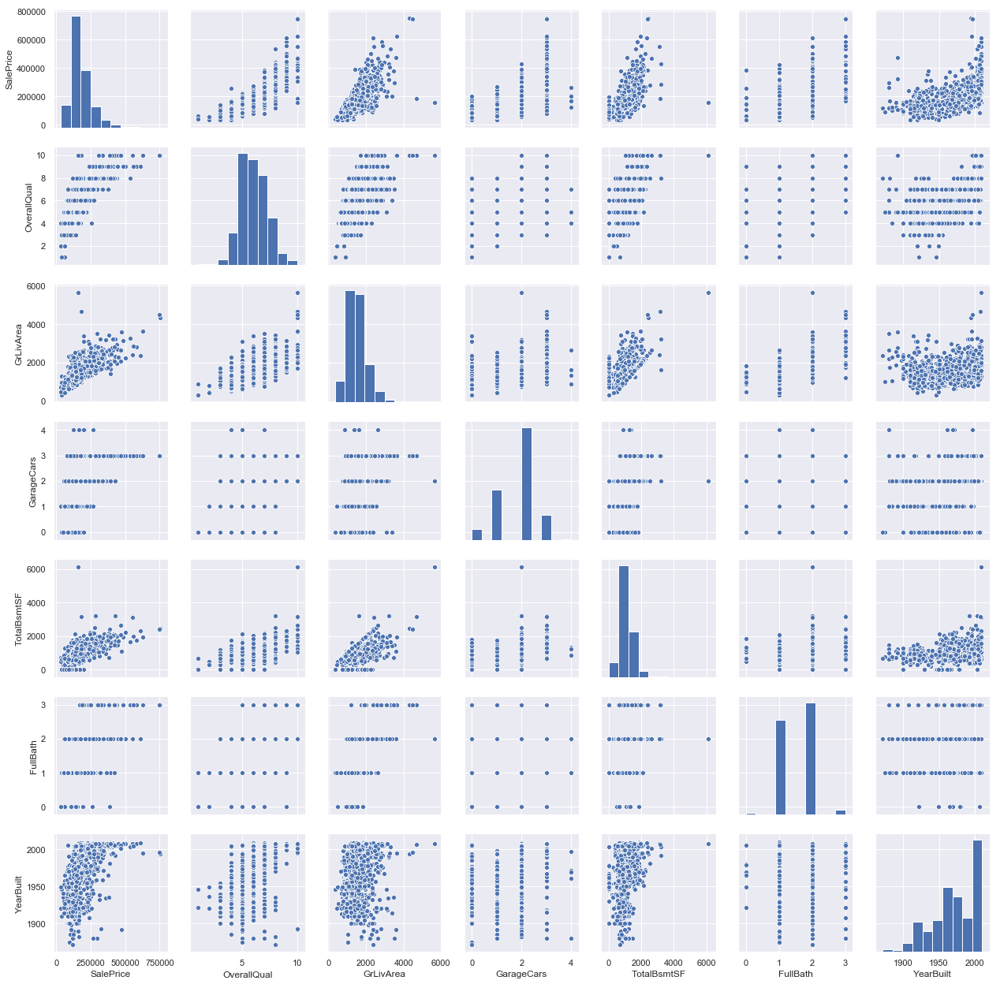

In [12]:
sns.set()
cols = ['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'TotalBsmtSF', 'FullBath', 'YearBuilt']
sns.pairplot(train[cols], size = 2.5)
plt.show()

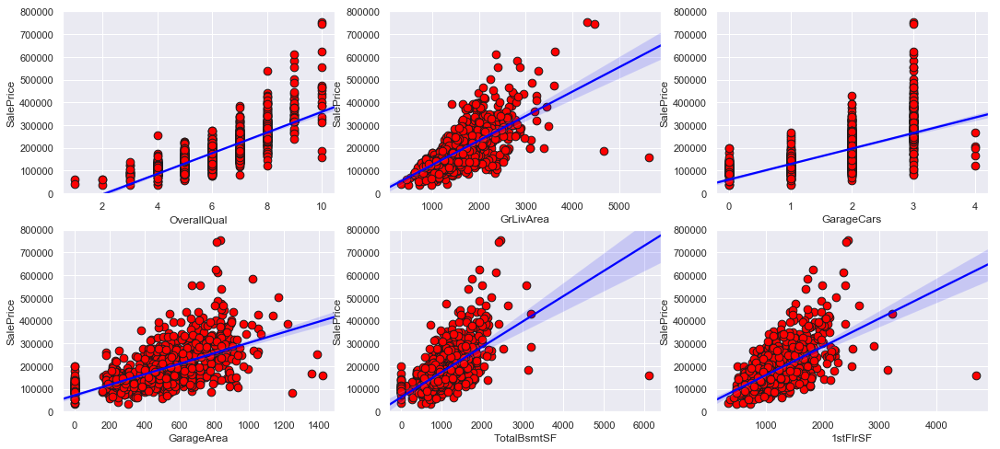

In [13]:
plt.figure(figsize=(18,8))
for i in range(6):
    ii = '23'+str(i+1)
    plt.subplot(ii)
    feature = corr_list.index.values[i]
    plt.scatter(train[feature], train['SalePrice'], facecolors='red',edgecolors='k',s = 75)
    sns.regplot(x = feature, y = 'SalePrice', data = train, scatter=False, color = 'Blue')
    ax=plt.gca() 
    ax.set_ylim([0,800000])


Como se ve en GRLivArea, hay dos puntos que estan outliers. Entonces eliminaremos estos


In [14]:
train.drop(train[(train["GrLivArea"]>4000)&(train["SalePrice"]<300000)].index,inplace=True)

In [15]:
full=pd.concat([train,test], ignore_index=True)

In [16]:
full.drop(['Id'],axis=1, inplace=True)
full.shape

(2917, 80)

También se puede obervar que el precio de las casas recientemente construidas son altas

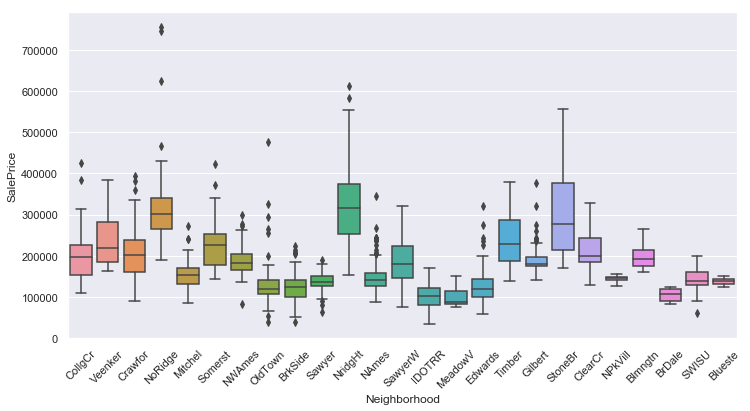

In [17]:
plt.figure(figsize = (12, 6))
sns.boxplot(x = 'Neighborhood', y = 'SalePrice',  data = train)
xt = plt.xticks(rotation=45)

# Data Cleaning o Prepare Data

### Missing Data

In [18]:
aa = full.isnull().sum()
aa[aa>0].sort_values(ascending=False)

PoolQC          2908
MiscFeature     2812
Alley           2719
Fence           2346
SalePrice       1459
FireplaceQu     1420
LotFrontage      486
GarageQual       159
GarageCond       159
GarageFinish     159
GarageYrBlt      159
GarageType       157
BsmtExposure      82
BsmtCond          82
BsmtQual          81
BsmtFinType2      80
BsmtFinType1      79
MasVnrType        24
MasVnrArea        23
MSZoning           4
BsmtFullBath       2
BsmtHalfBath       2
Utilities          2
Functional         2
Electrical         1
BsmtUnfSF          1
Exterior1st        1
Exterior2nd        1
TotalBsmtSF        1
GarageCars         1
BsmtFinSF2         1
BsmtFinSF1         1
KitchenQual        1
SaleType           1
GarageArea         1
dtype: int64

Primero apliquemos los valores faltantes de LotFrontage en base a la mediana de LotArea y Neighborhood. Ya que LotArea es una característica continua, usamos qcut para dividirlo en 10 partes

In [19]:
full.groupby(['Neighborhood'])[['LotFrontage']].agg(['mean','median','count'])

LotFrontage             
                    mean median count
Neighborhood                         
Blmngtn        46.900000   43.0    20
Blueste        27.300000   24.0    10
BrDale         21.500000   21.0    30
BrkSide        55.789474   51.0    95
ClearCr        88.150000   80.5    20
CollgCr        71.336364   70.0   220
Crawfor        69.951807   70.0    83
Edwards        65.153409   64.5   176
Gilbert        74.207207   64.0   111
IDOTRR         62.241379   60.0    87
MeadowV        25.606061   21.0    33
Mitchel        75.144444   74.0    90
NAmes          75.210667   73.0   375
NPkVill        28.142857   24.0    21
NWAmes         81.517647   80.0    85
NoRidge        91.629630   89.0    54
NridgHt        84.184049   92.0   163
OldTown        61.777293   60.0   229
SWISU          59.068182   60.0    44
Sawyer         74.551020   72.0    98
SawyerW        70.669811   67.0   106
Somerst        64.549383   72.5   162
StoneBr        62.173913   60.0    46
Timber         81.157895   82.0    57
Veenker        72.000000   80.0    16

In [20]:
full["LotAreaCut"] = pd.qcut(full.LotArea,10)

In [21]:
full.groupby(['LotAreaCut'])[['LotFrontage']].agg(['mean','median','count'])

LotFrontage             
                           mean median count
LotAreaCut                                  
(1299.999, 4921.8]    35.741036   34.0   251
(4921.8, 7007.2]      55.460674   52.0   267
(7007.2, 7949.0]      62.959839   62.0   249
(7949.0, 8740.4]      67.113725   65.0   255
(8740.4, 9452.0]      69.959184   70.0   245
(9452.0, 10148.8]     73.988235   75.0   255
(10148.8, 11000.0]    73.636364   75.0   253
(11000.0, 12196.8]    83.371681   82.0   226
(12196.8, 14285.8]    84.973684   85.0   228
(14285.8, 215245.0]   92.846535   90.0   202

In [22]:
full['LotFrontage']=full.groupby(['LotAreaCut','Neighborhood'])['LotFrontage'].transform(lambda x: x.fillna(x.median()))

Debido a que algunas combinaciones de LotArea y Neighborhood no están disponibles, solo dejaremos a LotAreaCut.

In [23]:
full['LotFrontage']=full.groupby(['LotAreaCut'])['LotFrontage'].transform(lambda x: x.fillna(x.median()))

Luego rellenamos otros valores perdidos de acuerdo con la descripción de datos.

In [24]:
cols=["MasVnrArea", "BsmtUnfSF", "TotalBsmtSF", "GarageCars", "BsmtFinSF2", "BsmtFinSF1", "GarageArea"]
for col in cols:
    full[col].fillna(0, inplace=True)

In [25]:
cols1 = ["PoolQC" , "MiscFeature", "Alley", "Fence", "FireplaceQu", "GarageQual", "GarageCond", "GarageFinish", "GarageYrBlt", "GarageType", "BsmtExposure", "BsmtCond", "BsmtQual", "BsmtFinType2", "BsmtFinType1", "MasVnrType"]
for col in cols1:
    full[col].fillna("None", inplace=True)

In [26]:
cols2 = ["MSZoning", "BsmtFullBath", "BsmtHalfBath", "Utilities", "Functional", "Electrical", "KitchenQual", "SaleType","Exterior1st", "Exterior2nd"]
for col in cols2:
    full[col].fillna(full[col].mode()[0], inplace=True)

Ahora ya no hay datos que predecir excepto el que se quiere predecir

In [27]:
full.isnull().sum()[full.isnull().sum()>0]

SalePrice    1459
dtype: int64

# Feature Engineering

Convertir algunas características numéricas en características categóricas. Es mejor usar LabelEncoder y get_dummies para estas características.

In [28]:
NumStr = ["MSSubClass","BsmtFullBath","BsmtHalfBath","HalfBath","BedroomAbvGr","KitchenAbvGr","MoSold","YrSold","YearBuilt","YearRemodAdd","LowQualFinSF","GarageYrBlt"]
for col in NumStr:
    full[col]=full[col].astype(str)

Ahora usando get_dumies

In [29]:
def map_values():
    full["oMSSubClass"] = full.MSSubClass.map({'180':1, 
                                        '30':2, '45':2, 
                                        '190':3, '50':3, '90':3, 
                                        '85':4, '40':4, '160':4, 
                                        '70':5, '20':5, '75':5, '80':5, '150':5,
                                        '120': 6, '60':6})
    
    full["oMSZoning"] = full.MSZoning.map({'C (all)':1, 'RH':2, 'RM':2, 'RL':3, 'FV':4})
    
    full["oNeighborhood"] = full.Neighborhood.map({'MeadowV':1,
                                               'IDOTRR':2, 'BrDale':2,
                                               'OldTown':3, 'Edwards':3, 'BrkSide':3,
                                               'Sawyer':4, 'Blueste':4, 'SWISU':4, 'NAmes':4,
                                               'NPkVill':5, 'Mitchel':5,
                                               'SawyerW':6, 'Gilbert':6, 'NWAmes':6,
                                               'Blmngtn':7, 'CollgCr':7, 'ClearCr':7, 'Crawfor':7,
                                               'Veenker':8, 'Somerst':8, 'Timber':8,
                                               'StoneBr':9,
                                               'NoRidge':10, 'NridgHt':10})
    
    full["oCondition1"] = full.Condition1.map({'Artery':1,
                                           'Feedr':2, 'RRAe':2,
                                           'Norm':3, 'RRAn':3,
                                           'PosN':4, 'RRNe':4,
                                           'PosA':5 ,'RRNn':5})
    
    full["oBldgType"] = full.BldgType.map({'2fmCon':1, 'Duplex':1, 'Twnhs':1, '1Fam':2, 'TwnhsE':2})
    
    full["oHouseStyle"] = full.HouseStyle.map({'1.5Unf':1, 
                                           '1.5Fin':2, '2.5Unf':2, 'SFoyer':2, 
                                           '1Story':3, 'SLvl':3,
                                           '2Story':4, '2.5Fin':4})
    
    full["oExterior1st"] = full.Exterior1st.map({'BrkComm':1,
                                             'AsphShn':2, 'CBlock':2, 'AsbShng':2,
                                             'WdShing':3, 'Wd Sdng':3, 'MetalSd':3, 'Stucco':3, 'HdBoard':3,
                                             'BrkFace':4, 'Plywood':4,
                                             'VinylSd':5,
                                             'CemntBd':6,
                                             'Stone':7, 'ImStucc':7})
    
    full["oMasVnrType"] = full.MasVnrType.map({'BrkCmn':1, 'None':1, 'BrkFace':2, 'Stone':3})
    
    full["oExterQual"] = full.ExterQual.map({'Fa':1, 'TA':2, 'Gd':3, 'Ex':4})
    
    full["oFoundation"] = full.Foundation.map({'Slab':1, 
                                           'BrkTil':2, 'CBlock':2, 'Stone':2,
                                           'Wood':3, 'PConc':4})
    
    full["oBsmtQual"] = full.BsmtQual.map({'Fa':2, 'None':1, 'TA':3, 'Gd':4, 'Ex':5})
    
    full["oBsmtExposure"] = full.BsmtExposure.map({'None':1, 'No':2, 'Av':3, 'Mn':3, 'Gd':4})
    
    full["oHeating"] = full.Heating.map({'Floor':1, 'Grav':1, 'Wall':2, 'OthW':3, 'GasW':4, 'GasA':5})
    
    full["oHeatingQC"] = full.HeatingQC.map({'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5})
    
    full["oKitchenQual"] = full.KitchenQual.map({'Fa':1, 'TA':2, 'Gd':3, 'Ex':4})
    
    full["oFunctional"] = full.Functional.map({'Maj2':1, 'Maj1':2, 'Min1':2, 'Min2':2, 'Mod':2, 'Sev':2, 'Typ':3})
    
    full["oFireplaceQu"] = full.FireplaceQu.map({'None':1, 'Po':1, 'Fa':2, 'TA':3, 'Gd':4, 'Ex':5})
    
    full["oGarageType"] = full.GarageType.map({'CarPort':1, 'None':1,
                                           'Detchd':2,
                                           '2Types':3, 'Basment':3,
                                           'Attchd':4, 'BuiltIn':5})
    
    full["oGarageFinish"] = full.GarageFinish.map({'None':1, 'Unf':2, 'RFn':3, 'Fin':4})
    
    full["oPavedDrive"] = full.PavedDrive.map({'N':1, 'P':2, 'Y':3})
    
    full["oSaleType"] = full.SaleType.map({'COD':1, 'ConLD':1, 'ConLI':1, 'ConLw':1, 'Oth':1, 'WD':1,
                                       'CWD':2, 'Con':3, 'New':3})
    
    full["oSaleCondition"] = full.SaleCondition.map({'AdjLand':1, 'Abnorml':2, 'Alloca':2, 'Family':2, 'Normal':3, 'Partial':4})            
                
                        
                        
    
    return "Done!"

In [30]:
map_values()

'Done!'

In [31]:
full.drop("LotAreaCut",axis=1,inplace=True)
full.drop(['SalePrice'],axis=1,inplace=True)

## Pipeline

In [32]:
class labelenc(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
    
    def fit(self,X,y=None):
        return self
    
    def transform(self,X):
        lab=LabelEncoder()
        X["YearBuilt"] = lab.fit_transform(X["YearBuilt"])
        X["YearRemodAdd"] = lab.fit_transform(X["YearRemodAdd"])
        X["GarageYrBlt"] = lab.fit_transform(X["GarageYrBlt"])
        return X

In [33]:
class skew_dummies(BaseEstimator, TransformerMixin):
    def __init__(self,skew=0.5):
        self.skew = skew
    
    def fit(self,X,y=None):
        return self
    
    def transform(self,X):
        X_numeric=X.select_dtypes(exclude=["object"])
        skewness = X_numeric.apply(lambda x: skew(x))
        skewness_features = skewness[abs(skewness) >= self.skew].index
        X[skewness_features] = np.log1p(X[skewness_features])
        X = pd.get_dummies(X)
        return X

In [34]:
pipe = Pipeline([
    ('labenc', labelenc()),
    ('skew_dummies', skew_dummies(skew=1)),
    ])

In [35]:
full2 = full.copy()

In [36]:
data_pipe = pipe.fit_transform(full2)

In [37]:
data_pipe.shape

(2917, 405)

In [38]:
data_pipe.head()

,1stFlrSF,2ndFlrSF,3SsnPorch,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,EnclosedPorch,Fireplaces,FullBath,GarageArea,...,SaleType_WD,Street_Grvl,Street_Pave,Utilities_AllPub,Utilities_NoSeWa,YrSold_2006,YrSold_2007,YrSold_2008,YrSold_2009,YrSold_2010
0,6.753438,854,0.0,706.0,0.0,150.0,0.000000,0,2,548.0,...,1,0,1,1,0,0,0,1,0,0
1,7.141245,0,0.0,978.0,0.0,284.0,0.000000,1,2,460.0,...,1,0,1,1,0,0,1,0,0,0
2,6.825460,866,0.0,486.0,0.0,434.0,0.000000,1,2,608.0,...,1,0,1,1,0,0,0,1,0,0
3,6.869014,756,0.0,216.0,0.0,540.0,5.609472,1,1,642.0,...,1,0,1,1,0,1,0,0,0,0
4,7.044033,1053,0.0,655.0,0.0,490.0,0.000000,1,2,836.0,...,1,0,1,1,0,0,0,1,0,0


In [39]:
scaler = RobustScaler()

In [40]:
n_train=train.shape[0]

X = data_pipe[:n_train]
test_X = data_pipe[n_train:]
y= train.SalePrice

X_scaled = scaler.fit(X).transform(X)
y_log = np.log(train.SalePrice)
test_X_scaled = scaler.transform(test_X)

# Modeling & Evaluation

In [41]:
def rmse_cv(model,X,y):
    rmse = np.sqrt(-cross_val_score(model, X, y, scoring="neg_mean_squared_error", cv=5))
    return rmse

### Excersise 1


### Form of linear regression
$$y=\theta_0+\theta_1x_1+\theta_2x_2+...+\theta_nx_n$$
- $y$  is the response
- $\theta_0$  is the intercept
- In this case:
$$y=\theta_0+\theta_1\times LotArea+\theta_2\times GrLivArea+\theta_3 \times GarageArea$$



In [42]:

feature_cols = ['LotArea','GrLivArea','GarageArea']

# use the list to select a subset of the original DataFrame
X = pd.DataFrame(train, columns=feature_cols) 

# equivalent command to do this in one line using double square brackets
# inner bracket is a list
# outer bracker accesses a subset of the original DataFrame
X = train[['LotArea','GrLivArea','GarageArea']]
# print the first 5 rows
X.head()

,LotArea,GrLivArea,GarageArea
0,8450,1710,548
1,9600,1262,460
2,11250,1786,608
3,9550,1717,642
4,14260,2198,836


In [43]:
y = train['SalePrice']
y.head()

0    208500
1    181500
2    223500
3    140000
4    250000
Name: SalePrice, dtype: int64

In [44]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

In [45]:
# import model
from sklearn.linear_model import LinearRegression

# instantiate
linreg = LinearRegression()

# fit the model to the training data (learn the coefficients)
linreg.fit(X_train, y_train)


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

Primero definimos la función de evaluación


In [46]:
import math
def evaluation_func(t,x):
    r = 0.0
    for i in range(len(t)):
        r = r + t[i] * x[i]
    return r

Entonces definimos la funcion "stochastic gradient descent" con 100 iteraciones por training

In [47]:
def gradient_descent(t,val_x,val_y):
    m = len(val_x)
    alfa = 0.00001
    keys = ['LotArea','GrLivArea','GarageArea']
    for i in range(100):
        if math.isnan(t[0]):
            return t
        for at in range(m-1):
            x = [1,val_x[keys[0]].iloc[at+1],val_x[keys[1]].iloc[at+1],val_x[keys[2]].iloc[at+1]]
            t_t = [0]*4
            print(x)
            print(t_t)
            for i in range(4):
                t_t[i] = t[i] + alfa*1/m * (val_y.iloc[at+1] - evaluation_func(t,x))*x[i]
            t = t_t
            print(t)
    return t

In [48]:
t = gradient_descent([1,1,1,1],X_train,y_train)
print(t)

[1, 11643, 2634, 968]
[0, 0, 0, 0]
[1.0016903385178408, 20.680611363220496, 5.452351655992682, 2.6362476852698995]
[1, 11333, 1062, 539]
[0, 0, 0, 0]
[1.0008231316996272, 10.852556492406325, 4.53137801504989, 2.168823210252796]
[1, 7000, 1310, 398]
[0, 0, 0, 0]
[1.0010905773253602, 12.72467587253804, 4.8817317847602535, 2.2752665692945704]
[1, 17217, 1140, 0]
[0, 0, 0, 0]
[0.9998083548201205, -9.351349000172661, 3.4199981287870758, 2.2752665692945704]
[1, 11040, 1258, 528]
[0, 0, 0, 0]
[1.0020291617255088, 15.166359235315031, 6.213773215765656, 3.447852615339634]
[1, 7685, 1501, 420]
[0, 0, 0, 0]
[1.0023793040452904, 17.857202962837086, 6.739336837757927, 3.594912389647931]
[1, 11600, 2274, 480]
[0, 0, 0, 0]
[1.0017398221910883, 10.439213454090893, 5.285155101301992, 3.2879610996308473]
[1, 7200, 804, 240]
[0, 0, 0, 0]
[1.0020947927860138, 12.995001737555022, 5.570551459622153, 3.3731540424129847]
[1, 6120, 1774, 468]
[0, 0, 0, 0]
[1.0024507744227031, 15.173609354094154, 6.202062883109

[1, 7314, 1232, 632]
[0, 0, 0, 0]
[1.641533034059945, -171.52768153738415, 1299.4625395012604, 294.82890054441623]
[1, 4224, 1060, 572]
[0, 0, 0, 0]
[1.6352051188019225, -198.25679558727143, 1292.7549493277565, 291.2093330168273]
[1, 8712, 1178, 384]
[0, 0, 0, 0]
[1.6369919244173354, -182.69014506579416, 1294.859806342713, 291.8954663731459]
[1, 15593, 2287, 667]
[0, 0, 0, 0]
[1.6362384673436148, -194.43880121632057, 1293.136650015114, 291.3929105049742]
[1, 2522, 1709, 380]
[0, 0, 0, 0]
[1.6207505732865368, -233.49927002827133, 1266.6678390715676, 285.5075107632846]
[1, 3378, 1389, 240]
[0, 0, 0, 0]
[1.6124782538204008, -261.44316518487886, 1255.1775873331046, 283.52215409141195]
[1, 10382, 1095, 264]
[0, 0, 0, 0]
[1.6253330756105313, -127.9844053597428, 1269.2536171932977, 286.91582704400645]
[1, 8049, 1339, 484]
[0, 0, 0, 0]
[1.6195851067147982, -174.24980700149874, 1261.557086841911, 284.1338100984716]
[1, 10402, 1226, 740]
[0, 0, 0, 0]
[1.6219137148108955, -150.02762558589495, 126

[1, 7540, 912, 470]
[0, 0, 0, 0]
[1.0099441180170918, -20.554577893930173, 253.01183911333578, 2.2067344255435515]
[1, 3013, 1506, 440]
[0, 0, 0, 0]
[1.0089689408935636, -23.492786567120557, 251.54322236530234, 1.7776564911911557]
[1, 11526, 2555, 672]
[0, 0, 0, 0]
[1.0073027865541149, -42.69688148360569, 247.28619802801103, 0.6580007750816634]
[1, 5395, 1337, 462]
[0, 0, 0, 0]
[1.0080294382026027, -38.77659584001346, 248.25773128203934, 0.993713836683074]
[1, 11764, 2270, 671]
[0, 0, 0, 0]
[1.0096941686091703, -19.19270733715245, 252.03666930494776, 2.11074793948992]
[1, 10918, 2080, 282]
[0, 0, 0, 0]
[1.0089504674741259, -27.312436329568477, 250.48977094405518, 1.9010242194073663]
[1, 12137, 1661, 598]
[0, 0, 0, 0]
[1.0102239323301205, -11.856393372360449, 252.60499606986244, 2.6625562032922145]
[1, 6371, 1358, 484]
[0, 0, 0, 0]
[1.0098141410225827, -14.467173792684296, 252.048499474226, 2.4642172104438798]
[1, 10800, 1768, 320]
[0, 0, 0, 0]
[1.0086506842116867, -27.032507350360248, 

[0, 0, 0, 0]
[-79.90133909706746, 6003.025788944771, -46955.293986702134, 7931.188466662134]
[1, 9560, 864, 288]
[0, 0, 0, 0]
[-80.07494527195183, 4343.350757050253, -47105.289721802226, 7881.1898882954365]
[1, 11900, 1392, 458]
[0, 0, 0, 0]
[-79.97941750992112, 5480.131125215707, -46972.31507705548, 7924.941603305502]
[1, 14115, 1472, 588]
[0, 0, 0, 0]
[-80.09543844974107, 3842.4955596571604, -47143.09790047044, 7856.721290691374]
[1, 14541, 2520, 796]
[0, 0, 0, 0]
[-79.5740934476893, 11423.373234492, -45829.30849529997, 8271.711912324585]
[1, 16381, 1844, 540]
[0, 0, 0, 0]
[-80.55177576193853, -4592.0407552248325, -47632.154682775574, 7743.763462629994]
[1, 11645, 1734, 660]
[0, 0, 0, 0]
[-79.35124815461039, 9388.103232111387, -45550.43981166858, 8536.111683466568]
[1, 10480, 1964, 483]
[0, 0, 0, 0]
[-79.46876069508868, 8156.571807898971, -45781.23444116793, 8479.353126415557]
[1, 7930, 1026, 440]
[0, 0, 0, 0]
[-79.66349906477635, 6612.296536275721, -45981.03600846748, 8393.668243752

[0, 0, 0, 0]
[-24.294865926827526, -12525.159197567167, 86944.38835594685, 35778.74295910504]
[1, 7800, 965, 300]
[0, 0, 0, 0]
[-24.265760635110514, -12298.137922174461, 86972.47496245377, 35787.47454662014]
[1, 9382, 1479, 577]
[0, 0, 0, 0]
[-24.57417334353931, -15191.665952653435, 86516.33256668758, 35609.52041385673]
[1, 11070, 1959, 766]
[0, 0, 0, 0]
[-24.834188178535726, -18070.030176063767, 86006.96350492959, 35410.349050249475]
[1, 5306, 1767, 504]
[0, 0, 0, 0]
[-25.50850213540813, -21647.940031228747, 84815.45074313605, 35070.49481598578]
[1, 6155, 1362, 502]
[0, 0, 0, 0]
[-25.5062417137161, -21634.0271357143, 84818.5294374806, 35071.629547675184]
[1, 10150, 912, 275]
[0, 0, 0, 0]
[-24.29214561160129, -9310.951699248964, 85925.7850826093, 35405.50597575676]
[1, 9600, 1242, 528]
[0, 0, 0, 0]
[-24.620171884454578, -12460.003918640556, 85518.37645172552, 35232.30810369022]
[1, 10304, 1868, 484]
[0, 0, 0, 0]
[-25.06130051516057, -17005.39332943512, 84694.34816956673, 35018.80184642

[-65.14973758146036, -1381.7144444784246, 6106.798770473765, 13475.94792451331]
[1, 6040, 1152, 0]
[0, 0, 0, 0]
[-65.13699660972384, -1304.758975189852, 6121.476369914235, 13475.94792451331]
[1, 2308, 1322, 440]
[0, 0, 0, 0]
[-65.23638874143543, -1534.1560151802207, 5990.079971791502, 13432.215386560207]
[1, 12003, 1968, 680]
[0, 0, 0, 0]
[-65.25686764318063, -1779.9642728277822, 5949.777493156961, 13418.289733373475]
[1, 8487, 1500, 570]
[0, 0, 0, 0]
[-65.26854622824376, -1879.0804242586582, 5932.25961556225, 13411.632939887484]
[1, 9937, 1486, 480]
[0, 0, 0, 0]
[-65.2357322680925, -1553.0081022355603, 5981.021160347026, 13427.38364076009]
[1, 8978, 948, 300]
[0, 0, 0, 0]
[-65.19590839960792, -1195.4694109808756, 6018.774187670421, 13439.330801305468]
[1, 6120, 800, 0]
[0, 0, 0, 0]
[-65.17247456025773, -1052.0543141577546, 6037.521259150568, 13439.330801305468]
[1, 6000, 1412, 280]
[0, 0, 0, 0]
[-65.22593386112565, -1372.810119365351, 5962.036726325046, 13424.362197062448]
[1, 13053, 

[-278.9640728307345, 20867.48468163802, -198107.71449942322, -68574.89775820838]
[1, 6240, 1324, 550]
[0, 0, 0, 0]
[-277.4082449961974, 30575.850369149382, -196047.79844649613, -67719.19244921298]
[1, 10680, 2136, 528]
[0, 0, 0, 0]
[-276.23622371018985, 43093.03770371046, -193544.36097958393, -67100.36521020097]
[1, 6820, 1502, 528]
[0, 0, 0, 0]
[-275.939330918614, 45117.84654225771, -193098.42800663703, -66943.60581624892]
[1, 9375, 2169, 647]
[0, 0, 0, 0]
[-275.57892865040566, 48496.617806711074, -192316.71548689308, -66710.4255487181]
[1, 11207, 1511, 413]
[0, 0, 0, 0]
[-277.63907830574476, 25408.520619325504, -195429.6016161105, -67561.26735637317]
[1, 7861, 1509, 393]
[0, 0, 0, 0]
[-276.523781471707, 34175.869031696246, -193746.61869354756, -67122.95570059633]
[1, 14200, 2157, 487]
[0, 0, 0, 0]
[-276.8391586700431, 29697.51281532402, -194426.88731035846, -67276.544396186]
[1, 10656, 1646, 870]
[0, 0, 0, 0]
[-276.2687128290861, 35776.18369656159, -193487.93345614328, -66780.2565145

[1, 12118, 1710, 550]
[0, 0, 0, 0]
[-4761.069176610016, 12214.476483561906, -561843.6209196844, 1234409.9462416412]
[1, 12493, 1100, 312]
[0, 0, 0, 0]
[-4760.333198694698, 21409.04857963437, -561034.0452128343, 1234639.5713512206]
[1, 9453, 1744, 457]
[0, 0, 0, 0]
[-4758.3932845606305, 39747.05688897552, -557650.8349630203, 1235526.1121104895]
[1, 8000, 1800, 0]
[0, 0, 0, 0]
[-4752.117522381171, 89953.15432465106, -546354.4630399933, 1235526.1121104895]
[1, 6435, 1577, 312]
[0, 0, 0, 0]
[-4753.056102021847, 83913.39433689372, -547834.6031333412, 1235233.2752625982]
[1, 8450, 1337, 531]
[0, 0, 0, 0]
[-4758.841394188964, 35027.67552476091, -555569.5387607757, 1232161.2851218595]
[1, 115149, 1824, 739]
[0, 0, 0, 0]
[-4794.800254217918, -4105599.0979492925, -621158.4994535883, 1205587.6875604624]
[1, 14191, 1908, 431]
[0, 0, 0, 0]
[-4255.657284250695, 3545378.7888555797, 407526.2872438746, 1437958.3076163358]
[1, 8320, 1582, 520]
[0, 0, 0, 0]
[-4538.272163244304, 1194022.9956287541, -39570

[1, 7200, 900, 576]
[0, 0, 0, 0]
[-3954.993745699639, -318934.63829014124, 1270432.6061836549, 1320181.8827037197]
[1, 9022, 792, 240]
[0, 0, 0, 0]
[-3940.7712801397024, -190619.55400839468, 1281696.7989071244, 1323595.2744381044]
[1, 10920, 1253, 352]
[0, 0, 0, 0]
[-3940.681116874285, -189634.97115003783, 1281809.7734786924, 1323627.0119075312]
[1, 1890, 1218, 264]
[0, 0, 0, 0]
[-3954.8819842035255, -216474.6104023017, 1264513.117071678, 1319877.9829326118]
[1, 15865, 2217, 621]
[0, 0, 0, 0]
[-3956.605938083073, -243825.13870132557, 1260691.1113207208, 1318807.4075734126]
[1, 10206, 1563, 758]
[0, 0, 0, 0]
[-3961.0102189590407, -288775.2293214516, 1253807.2203115833, 1315468.9626694291]
[1, 3182, 1504, 437]
[0, 0, 0, 0]
[-3975.1136796664887, -333652.4412925517, 1232595.6154075812, 1309305.7503402743]
[1, 7200, 1360, 297]
[0, 0, 0, 0]
[-3972.028288928934, -311437.62798216107, 1236791.746810655, 1310222.111389328]
[1, 9600, 1661, 377]
[0, 0, 0, 0]
[-3967.987064105414, -272641.869676367,

[0, 0, 0, 0]
[-8140.707815299529, 611040.4976929871, -2593338.966543073, 139091.8289080007]
[1, 10440, 1230, 440]
[0, 0, 0, 0]
[-8170.447413937027, 300559.0879175099, -2629918.672867195, 126006.40550750165]
[1, 6292, 790, 160]
[0, 0, 0, 0]
[-8168.924485154279, 310141.35581855854, -2628715.5591288246, 126250.07411274129]
[1, 8089, 1419, 567]
[0, 0, 0, 0]
[-8158.400877394992, 395266.81898342917, -2613782.5597183965, 132216.95971225688]
[1, 10708, 1867, 303]
[0, 0, 0, 0]
[-8152.8423105063575, 454787.9532269274, -2603404.715337316, 133901.20547951313]
[1, 3182, 1555, 430]
[0, 0, 0, 0]
[-8129.568914352034, 528843.8997899849, -2567214.584317343, 143908.76582587225]
[1, 20544, 2093, 542]
[0, 0, 0, 0]
[-8180.521927836187, -517934.80922846135, -2673859.2415396757, 116292.23251746115]
[1, 14112, 1152, 484]
[0, 0, 0, 0]
[-8085.981350397311, 816221.8195889675, -2564948.49633009, 162049.8719978775]
[1, 6768, 912, 288]
[0, 0, 0, 0]
[-8115.546551893003, 616124.5358661244, -2591911.960094161, 153535.0

[0, 0, 0, 0]
[-340584.6713342701, 2697698.293478077, -49809041.610508755, 87230024.56409773]
[1, 10927, 1904, 736]
[0, 0, 0, 0]
[-340574.07679191814, 2813464.857757934, -49788869.601870626, 87237822.14726877]
[1, 9571, 1144, 596]
[0, 0, 0, 0]
[-340775.0143743038, 890291.2567444365, -50018742.19611986, 87118063.3481669]
[1, 8880, 2110, 463]
[0, 0, 0, 0]
[-340250.78160103085, 5545478.283408392, -48912611.044513896, 87360783.12219228]
[1, 12508, 1750, 423]
[0, 0, 0, 0]
[-340440.3413819172, 3174464.5440818653, -49244340.66106502, 87280599.33487736]
[1, 8314, 816, 264]
[0, 0, 0, 0]
[-340524.9775166302, 2470799.7200777614, -49313403.74699085, 87258255.39531311]
[1, 11851, 1442, 500]
[0, 0, 0, 0]
[-340541.44710448163, 2275618.63445063, -49337152.89267259, 87250020.60138741]
[1, 7000, 1347, 0]
[0, 0, 0, 0]
[-340079.1574196992, 5511646.427927837, -48714448.68727062, 87250020.60138741]
[1, 9786, 1734, 440]
[0, 0, 0, 0]
[-340151.02958717797, 4808305.396980769, -48839075.025678776, 87218396.847696

[-224805.56282613773, -34614320.90676625, 174550415.77009848, 120409664.4432633]
[1, 7642, 1426, 216]
[0, 0, 0, 0]
[-224900.66186806667, -35341067.78518733, 174414804.53630778, 120389123.05020665]
[1, 11645, 1720, 565]
[0, 0, 0, 0]
[-224502.36509374506, -30702901.84821216, 175099874.98814094, 120614160.72769836]
[1, 11999, 2374, 656]
[0, 0, 0, 0]
[-225658.8643058233, -44579735.89393921, 172354345.85866714, 119855497.24457502]
[1, 6930, 1352, 288]
[0, 0, 0, 0]
[-225280.1226169257, -41955055.989878856, 172866404.6220567, 119964574.85097753]
[1, 7658, 1752, 576]
[0, 0, 0, 0]
[-225743.70150129343, -45505143.08636683, 172054214.41664445, 119697553.41358171]
[1, 11932, 1580, 830]
[0, 0, 0, 0]
[-224172.1260203542, -26753104.44779976, 174537303.67652845, 121001961.06276129]
[1, 10357, 1442, 719]
[0, 0, 0, 0]
[-224735.72066873196, -32590254.221048415, 173724600.1935677, 120596736.51057766]
[1, 12394, 1733, 433]
[0, 0, 0, 0]
[-224272.4000694011, -26847858.712941878, 174527534.79220805, 120797354

[-344942.100441779, -7719358.383451863, 14380880.837867, 62572110.6383523]
[1, 6342, 1020, 0]
[0, 0, 0, 0]
[-344628.39402498736, -5729832.288159192, 14700861.382994486, 62572110.6383523]
[1, 10859, 1097, 672]
[0, 0, 0, 0]
[-344591.38180943934, -5327916.6395234, 14741463.783450648, 62596982.84720056]
[1, 9375, 1992, 648]
[0, 0, 0, 0]
[-344774.16339822893, -7041494.03442613, 14377362.858581716, 62478540.37766488]
[1, 7301, 1922, 672]
[0, 0, 0, 0]
[-344940.75424295425, -8257773.791765613, 14057175.255019672, 62366591.33000947]
[1, 3196, 1456, 400]
[0, 0, 0, 0]
[-345114.78424042976, -8813973.663697403, 13803787.578695303, 62296979.33101926]
[1, 11616, 1386, 440]
[0, 0, 0, 0]
[-344603.8885258591, -2879409.043244618, 14511889.039090237, 62521773.44543035]
[1, 12257, 2531, 752]
[0, 0, 0, 0]
[-345047.18599650834, -8312906.140992495, 13389903.14087698, 62188413.74750212]
[1, 10690, 1344, 468]
[0, 0, 0, 0]
[-344665.07024866546, -4228088.796552174, 13903466.705977803, 62367243.91749258]
[1, 8125,

[1, 11362, 1836, 862]
[0, 0, 0, 0]
[-24312322.28959932, 193519485.21106738, -4216919303.0561247, 6178154491.596919]
[1, 12800, 1644, 569]
[0, 0, 0, 0]
[-24303720.088271543, 303627662.20663905, -4202777284.073256, 6183049144.152426]
[1, 12898, 1620, 912]
[0, 0, 0, 0]
[-24328849.151283342, -20486992.51952672, -4243486366.152368, 6160131438.685666]
[1, 11767, 1346, 384]
[0, 0, 0, 0]
[-24296028.13519723, 365717903.7657718, -4199309278.500459, 6172734708.862734]
[1, 9250, 1056, 260]
[0, 0, 0, 0]
[-24301090.409676764, 318891864.8300812, -4204655040.3508472, 6171418517.4980545]
[1, 11900, 1411, 544]
[0, 0, 0, 0]
[-24312245.690733228, 186144020.25816643, -4220395141.9215174, 6165350044.603338]
[1, 6442, 1370, 484]
[0, 0, 0, 0]
[-24297618.090924565, 280375018.22558403, -4200355330.1836467, 6172429802.910732]
[1, 11228, 2097, 678]
[0, 0, 0, 0]
[-24284121.187521063, 431918249.6401143, -4172052323.746501, 6181580703.418307]
[1, 10896, 3395, 0]
[0, 0, 0, 0]
[-24197589.06606487, 1374772245.026791, -

[1, 4426, 848, 420]
[0, 0, 0, 0]
[-10749101.745386407, -6766811215.0763, 24291764973.56454, 11757297099.356413]
[1, 12327, 2132, 612]
[0, 0, 0, 0]
[-10525597.77314943, -4011677749.3110857, 24768275442.373775, 11894081530.365442]
[1, 8248, 864, 0]
[0, 0, 0, 0]
[-10418657.803463204, -3129636879.339081, 24860671576.182674, 11894081530.365442]
[1, 10768, 1437, 528]
[0, 0, 0, 0]
[-10494640.598976713, -3947819621.4285355, 24751484299.029762, 11853962614.33431]
[1, 15578, 1456, 429]
[0, 0, 0, 0]
[-10308221.261107521, -1043779176.1022782, 25022910854.967304, 11933936510.280193]
[1, 3182, 1269, 430]
[0, 0, 0, 0]
[-10615305.89729961, -2020922488.4655042, 24633220451.639545, 11801890116.717596]
[1, 7200, 1262, 572]
[0, 0, 0, 0]
[-10828363.103516206, -3554934373.2250023, 24364342257.3942, 11680021394.761703]
[1, 4500, 1224, 402]
[0, 0, 0, 0]
[-10997805.99327713, -4317427377.149164, 24156944160.326828, 11611905353.077812]
[1, 4500, 1216, 402]
[0, 0, 0, 0]
[-11131515.011501445, -4919117959.158575, 2

[0, 0, 0, 0]
[-24175685.99625853, -442834429.69850934, 1579000425.9772513, 4660457976.569099]
[1, 3675, 1072, 525]
[0, 0, 0, 0]
[-24198668.503527682, -527295143.9126449, 1554363178.1847198, 4648392160.252794]
[1, 7000, 1134, 254]
[0, 0, 0, 0]
[-24191827.232820533, -479406248.9626051, 1562121179.1666262, 4650129843.01241]
[1, 12589, 1484, 390]
[0, 0, 0, 0]
[-24174411.577144783, -260160559.6606021, 1587966012.1894376, 4656921948.725952]
[1, 9554, 1911, 471]
[0, 0, 0, 0]
[-24199502.28996029, -499877229.8999607, 1540017659.9990027, 4645104222.989848]
[1, 9248, 1167, 400]
[0, 0, 0, 0]
[-24190649.163737033, -418003518.58724934, 1550349258.3015475, 4648645473.479153]
[1, 9084, 1111, 200]
[0, 0, 0, 0]
[-24180173.398615103, -322841668.2196424, 1561987833.3520112, 4650740626.503538]
[1, 16647, 1701, 611]
[0, 0, 0, 0]
[-24181309.484848402, -341754095.745381, 1560055350.6691685, 4650046477.814992]
[1, 1680, 987, 264]
[0, 0, 0, 0]
[-24201375.50258941, -375465005.55027026, 1540250191.158796, 4644749

[0, 0, 0, 0]
[-95146095.5232958, 12299267600.273695, -60355739367.81596, -21775337026.96944]
[1, 215245, 2036, 513]
[0, 0, 0, 0]
[-118140612.68571216, -4937155579024.034, -107172576310.49565, -33571524331.28903]
[1, 27650, 2069, 505]
[0, 0, 0, 0]
[1133012594.6205173, 29657230602993.207, 2481463409606.093, 598260845358.3568]
[1, 9600, 1096, 0]
[0, 0, 0, 0]
[-1496713835.5587754, 4411856873271.996, -400716757870.4121, 598260845358.3568]
[1, 7200, 1762, 576]
[0, 0, 0, 0]
[-1784032255.5976253, 2343164248992.2773, -906971813978.8655, 432765435415.9793]
[1, 13173, 1652, 840]
[0, 0, 0, 0]
[-2056051527.2963843, -1240145617095.4746, -1356347650825.2153, 204269247189.0218]
[1, 17755, 1466, 528]
[0, 0, 0, 0]
[-1837393348.1442752, 2642130353750.2256, -1035794760188.2231, 319720765781.33545]
[1, 10206, 944, 528]
[0, 0, 0, 0]
[-2076703529.8790815, 199730638964.79346, -1261703571745.8801, 193364989825.3578]
[1, 9245, 990, 672]
[0, 0, 0, 0]
[-2083358263.7996233, 138207623869.38568, -1268291758327.2163,

[-635926262.0359317, -433894897015.2083, 2350928775693.156, 929409927043.4517]
[1, 9150, 1431, 296]
[0, 0, 0, 0]
[-632899230.678579, -406197560095.4311, 2355260457565.5273, 930305928325.228]
[1, 11880, 1601, 478]
[0, 0, 0, 0]
[-627316710.8186697, -339877224159.7089, 2364198071861.242, 932974372818.2646]
[1, 2544, 1223, 480]
[0, 0, 0, 0]
[-649957091.9267452, -397474353698.6531, 2336508885766.066, 922106989886.3884]
[1, 5925, 1131, 672]
[0, 0, 0, 0]
[-658257286.3576143, -446653005701.5524, 2327121365864.753, 916529259228.8444]
[1, 9900, 1978, 486]
[0, 0, 0, 0]
[-663990258.6063521, -503409430964.0569, 2315781546756.7495, 913743034715.9578]
[1, 6600, 2372, 432]
[0, 0, 0, 0]
[-687460230.348747, -658311244463.8636, 2260110773783.7886, 903604006923.2432]
[1, 10267, 838, 275]
[0, 0, 0, 0]
[-645224015.3060571, -224672024620.56592, 2295504721989.563, 915218966059.9829]
[1, 8536, 1125, 430]
[0, 0, 0, 0]
[-654905496.734272, -307313150091.80804, 2284613055382.8213, 911055929045.8505]
[1, 10125, 173

[-1683334854.9584541, -36586641908.5943, 169029999516.856, 346944954242.90924]
[1, 8068, 2267, 390]
[0, 0, 0, 0]
[-1685378009.858784, -53070815644.45559, 164398167357.8082, 346148123831.7806]
[1, 11664, 1082, 240]
[0, 0, 0, 0]
[-1682102023.4692748, -14859710397.219376, 167942784631.25723, 346934360565.2628]
[1, 9742, 1795, 534]
[0, 0, 0, 0]
[-1685230616.9361844, -45338467951.85299, 162326959358.15445, 345263691653.9331]
[1, 5890, 816, 432]
[0, 0, 0, 0]
[-1685363896.460825, -46123484351.98637, 162218203266.0477, 345206114899.2883]
[1, 11616, 1092, 288]
[0, 0, 0, 0]
[-1682992346.225893, -18575556823.01802, 164807936122.59326, 345889121366.9487]
[1, 9450, 894, 400]
[0, 0, 0, 0]
[-1684000152.706776, -28099328067.362328, 163906957128.68387, 345485998774.5955]
[1, 10480, 1639, 240]
[0, 0, 0, 0]
[-1684522362.223507, -33572083802.703938, 163051055730.76166, 345360668490.5801]
[1, 9144, 1505, 240]
[0, 0, 0, 0]
[-1684717179.9760528, -35353497331.9821, 162757855013.18033, 345313912229.9691]
[1, 9

[1, 4426, 848, 420]
[0, 0, 0, 0]
[-7191023720.261583, 1115199570189.2273, -5231627581861.533, -1814685419381.5586]
[1, 3010, 1248, 438]
[0, 0, 0, 0]
[-7154727655.112693, 1224450726287.387, -5186330092555.718, -1798787742846.3447]
[1, 8499, 1412, 432]
[0, 0, 0, 0]
[-7175829440.768993, 1045106649994.491, -5216125813902.414, -1807903714249.8665]
[1, 7449, 1108, 280]
[0, 0, 0, 0]
[-7189546840.751119, 942925737527.6404, -5231324693082.608, -1811744586244.8616]
[1, 6911, 1301, 440]
[0, 0, 0, 0]
[-7179605683.740675, 1011629073626.819, -5218391247812.0205, -1807370477160.266]
[1, 6600, 894, 308]
[0, 0, 0, 0]
[-7192916139.584339, 923780065058.6343, -5230290795336.257, -1811470097560.1147]
[1, 7060, 1344, 784]
[0, 0, 0, 0]
[-7175278231.814645, 1048303693912.6731, -5206585447293.788, -1797641977868.6748]
[1, 9591, 1713, 856]
[0, 0, 0, 0]
[-7171587574.435811, 1083700788833.0676, -5200263351203.846, -1794482775152.393]
[1, 5684, 813, 270]
[0, 0, 0, 0]
[-7184830242.85493, 1008429461538.795, -5211029

[1, 5400, 833, 326]
[0, 0, 0, 0]
[-120483250883.16759, 787677657720.1986, -16578566091581.143, 30797608846462.457]
[1, 2160, 1252, 462]
[0, 0, 0, 0]
[-120439091631.54518, 883061641224.5999, -16523278708549.889, 30818010420712.008]
[1, 13560, 1392, 576]
[0, 0, 0, 0]
[-120500619220.34511, 48747537097.51611, -16608925112159.395, 30782570529563.246]
[1, 8121, 1664, 460]
[0, 0, 0, 0]
[-120380934767.50836, 1020704978584.7671, -16409770182639.041, 30837625377868.152]
[1, 9920, 2013, 455]
[0, 0, 0, 0]
[-120299722738.00821, 1826328311226.2231, -16246290367255.246, 30874576851290.72]
[1, 3196, 1557, 420]
[0, 0, 0, 0]
[-120240332739.45787, 2016138746593.1064, -16153820139512.37, 30899520650681.86]
[1, 6780, 754, 0]
[0, 0, 0, 0]
[-120253958723.68744, 1923754573516.6406, -16164094131621.463, 30899520650681.86]
[1, 15576, 1680, 308]
[0, 0, 0, 0]
[-120366727755.72993, 167264130422.635, -16353546105452.865, 30864787788812.77]
[1, 10421, 1714, 496]
[0, 0, 0, 0]
[-120266287644.61113, 1213950528391.6704,

[0, 0, 0, 0]
[-93163373685.904, -8371464194895.821, 43860718129824.75, 37288309101262.98]
[1, 11457, 1412, 576]
[0, 0, 0, 0]
[-93048986143.33466, -7060926119678.765, 44022233339932.67, 37354196325782.92]
[1, 9100, 935, 308]
[0, 0, 0, 0]
[-92942960158.91595, -6096089661468.569, 44121367635364.16, 37386852328983.88]
[1, 17423, 2234, 1166]
[0, 0, 0, 0]
[-93271852583.41522, -11826382373519.293, 43386621959032.8, 37003363762017.734]
[1, 35760, 3627, 807]
[0, 0, 0, 0]
[-91115525643.3588, 65283869002898.47, 51207619770617.45, 38743519602643.266]
[1, 7056, 1796, 483]
[0, 0, 0, 0]
[-96342651843.22057, 28401266536673.812, 41819701115665.71, 36218817648110.03]
[1, 12474, 2332, 846]
[0, 0, 0, 0]
[-100756576501.65996, -26658029652699.08, 31526428812185.062, 32484637387070.312]
[1, 7388, 1327, 624]
[0, 0, 0, 0]
[-99522874405.89082, -17543438569156.697, 33163551493270.707, 33254467494830.254]
[1, 9600, 2524, 542]
[0, 0, 0, 0]
[-98912733651.6745, -11686087328680.055, 34703546756912.69, 33585163783615.

[0, 0, 0, 0]
[-208807518447.74796, 7883997375293.008, -73768644347298.39, 1371509340588.0327]
[1, 10335, 1501, 577]
[0, 0, 0, 0]
[-208547184777.02658, 10574545862198.277, -73377883507545.62, 1521721868594.2583]
[1, 10542, 2418, 983]
[0, 0, 0, 0]
[-207957475574.89804, 16791260271037.277, -71951966656798.83, 2101406014286.6064]
[1, 14948, 2713, 858]
[0, 0, 0, 0]
[-208484400290.30432, 8914789625144.25, -73381513409696.06, 1649304608468.021]
[1, 6120, 1573, 240]
[0, 0, 0, 0]
[-207931106754.47568, 12300946064415.512, -72511182677837.61, 1782095057066.894]
[1, 5900, 869, 0]
[0, 0, 0, 0]
[-208018601320.82352, 11784728122963.283, -72587215455993.88, 1782095057066.894]
[1, 10171, 1535, 532]
[0, 0, 0, 0]
[-208104502149.41687, 10911030795340.314, -72719073227884.67, 1736395816255.2314]
[1, 15431, 2402, 672]
[0, 0, 0, 0]
[-208057508116.4158, 11636195718579.723, -72606193560616.12, 1767975806431.946]
[1, 9350, 1265, 502]
[0, 0, 0, 0]
[-208220718646.25735, 10110177264561.195, -72812654880865.69, 168

[-8566572590009.3, 134436105282142.5, -1298741056531220.0, 2189978686299319.2]
[1, 8640, 1372, 529]
[0, 0, 0, 0]
[-8571496152484.655, 91896525495069.34, -1305496184247408.0, 2187374121749856.0]
[1, 8393, 1712, 588]
[0, 0, 0, 0]
[-8569871682980.0, 105530698047641.56, -1302715092455438.0, 2188329309818593.2]
[1, 7879, 720, 0]
[0, 0, 0, 0]
[-8568897418876.411, 113206924919818.4, -1302013622300854.0, 2188329309818593.2]
[1, 8450, 1349, 539]
[0, 0, 0, 0]
[-8572371188942.132, 83853567864481.2, -1306699738119510.8, 2186456947753170.0]
[1, 12354, 1196, 528]
[0, 0, 0, 0]
[-8578112769789.792, 12922078072489.234, -1313566668813312.2, 2183425393065605.5]
[1, 8450, 1056, 304]
[0, 0, 0, 0]
[-8572493537391.116, 60404591841301.8, -1307632759400310.2, 2185133639714803.0]
[1, 15602, 1801, 484]
[0, 0, 0, 0]
[-8569245430816.149, 111081550623927.88, -1301782919458795.8, 2186705723297086.8]
[1, 3684, 1555, 660]
[0, 0, 0, 0]
[-8567673328353.85, 116873176095041.56, -1299338300129919.0, 2187743310922204.8]
[1,

[-4275681976040.977, 465200586490046.5, 7653334542309511.0, 3863596526132985.0]
[1, 13680, 1733, 452]
[0, 0, 0, 0]
[-4471231053251.738, -2209910789753169.0, 7314447991503262.0, 3775208343233721.0]
[1, 12090, 1422, 576]
[0, 0, 0, 0]
[-4341842573199.3433, -645604065919712.0, 7498438410137768.0, 3849736107743900.5]
[1, 21286, 1271, 312]
[0, 0, 0, 0]
[-4314297288623.785, -59275138444382.5, 7533448466833302.0, 3858330236531474.5]
[1, 8100, 2138, 360]
[0, 0, 0, 0]
[-4469973215170.392, -1320250143471891.2, 7200613335876658.0, 3802286902974696.5]
[1, 1890, 630, 0]
[0, 0, 0, 0]
[-4488647589923.064, -1355544711754442.5, 7188848479782474.0, 3802286902974696.5]
[1, 9525, 1855, 325]
[0, 0, 0, 0]
[-4503830474693.005, -1500161689188123.8, 7160684228534235.0, 3797352465424466.0]
[1, 14559, 1363, 288]
[0, 0, 0, 0]
[-4403307067344.55, -36641401601967.75, 7297697632750179.0, 3826303206740821.0]
[1, 8658, 1324, 440]
[0, 0, 0, 0]
[-4504208068427.351, -910242268976857.6, 7164104707316551.0, 3781906766264388

[1, 8849, 1684, 564]
[0, 0, 0, 0]
[-8622396670413.407, -190886673422848.66, 466456946318914.2, 1604730345839713.2]
[1, 12328, 1034, 888]
[0, 0, 0, 0]
[-8618316684111.904, -140588602297917.6, 470675652154668.44, 1608353373675448.0]
[1, 14720, 3238, 666]
[0, 0, 0, 0]
[-8623126732276.609, -211392511282370.75, 455100716197354.6, 1605149881597754.8]
[1, 9531, 1796, 546]
[0, 0, 0, 0]
[-8620189697267.311, -183399630608740.66, 460375631074055.9, 1606753502712832.0]
[1, 10800, 2414, 520]
[0, 0, 0, 0]
[-8619879852473.707, -180053306837827.78, 461123596405813.6, 1606914622005505.5]
[1, 10261, 1792, 451]
[0, 0, 0, 0]
[-8617167285025.772, -152219652254567.38, 465984517272513.06, 1608137989924524.2]
[1, 13125, 2127, 833]
[0, 0, 0, 0]
[-8620212449351.82, -192187434033947.1, 459507452751009.0, 1605601368040926.2]
[1, 1680, 987, 288]
[0, 0, 0, 0]
[-8625638465275.621, -201303140785932.9, 454151975034217.3, 1604038675454871.5]
[1, 8400, 1564, 476]
[0, 0, 0, 0]
[-8623651832981.289, -184615429513547.94, 45

[1, 4224, 1142, 528]
[0, 0, 0, 0]
[-718377968482504.0, 6.606679158859374e+16, -4.005114009031872e+17, 7.87546217441921e+16]
[1, 7500, 1128, 528]
[0, 0, 0, 0]
[-719158442394659.8, 6.021323724742566e+16, -4.013917754760989e+17, 7.834253151857386e+16]
[1, 10120, 2526, 844]
[0, 0, 0, 0]
[-716062035382167.1, 9.154887621385109e+16, -3.9357025136254246e+17, 8.095589903711763e+16]
[1, 9750, 1630, 451]
[0, 0, 0, 0]
[-718693256130271.5, 6.589447391983342e+16, -3.978591411819526e+17, 7.976921847972256e+16]
[1, 8072, 990, 480]
[0, 0, 0, 0]
[-720306322460443.2, 5.287380250268701e+16, -3.994560768488226e+17, 7.899494664124011e+16]
[1, 11340, 2290, 560]
[0, 0, 0, 0]
[-717827557174161.8, 8.098300084911851e+16, -3.937797043432381e+17, 8.038305520155771e+16]
[1, 9600, 1378, 360]
[0, 0, 0, 0]
[-720240599787259.2, 5.78177917633823e+16, -3.9710487706408646e+17, 7.951435986084261e+16]
[1, 8800, 1140, 0]
[0, 0, 0, 0]
[-720753832060123.9, 5.3301347762173416e+16, -3.976899618551522e+17, 7.951435986084261e+16]


[0, 0, 0, 0]
[-243267657646631.94, -1.2889169655163694e+17, 7.427986322798497e+17, 3.1230482191553696e+17]
[1, 11049, 1234, 484]
[0, 0, 0, 0]
[-240007314074571.2, -9.286816042393773e+16, 7.468218962477727e+17, 3.1388282820441434e+17]
[1, 12030, 1694, 818]
[0, 0, 0, 0]
[-243709676707761.06, -1.3740758290121184e+17, 7.40550093947149e+17, 3.10854295570465e+17]
[1, 8816, 1121, 480]
[0, 0, 0, 0]
[-241586906557914.94, -1.1869324126016829e+17, 7.429297192851265e+17, 3.118732252423912e+17]
[1, 8400, 1595, 240]
[0, 0, 0, 0]
[-243991289066109.2, -1.388900543289999e+17, 7.390947291845567e+17, 3.112961734404246e+17]
[1, 5400, 1616, 216]
[0, 0, 0, 0]
[-248672080634796.16, -1.641663287999096e+17, 7.315305700095585e+17, 3.1028512246158816e+17]
[1, 10289, 1073, 515]
[0, 0, 0, 0]
[-241861664660355.38, -9.409395883888848e+16, 7.388381463501335e+17, 3.1379248668842515e+17]
[1, 10240, 2098, 878]
[0, 0, 0, 0]
[-249748854541262.38, -1.7485878321937613e+17, 7.222908219799907e+17, 3.068675339729888e+17]
[1, 8

[0, 0, 0, 0]
[-599730747568055.5, 1.0607200353066836e+16, 4.99051940370133e+16, 1.1976328063693602e+17]
[1, 8600, 1376, 198]
[0, 0, 0, 0]
[-601410564584219.0, -3839225985939278.0, 4.759376582277232e+16, 1.1943067686773565e+17]
[1, 11844, 2046, 834]
[0, 0, 0, 0]
[-602796746060825.1, -2.025715939486271e+16, 4.4757638521636104e+16, 1.1827460151624611e+17]
[1, 8012, 1575, 529]
[0, 0, 0, 0]
[-602529221641843.2, -1.81137537499802e+16, 4.5178989481532504e+16, 1.184161219338875e+17]
[1, 4435, 848, 420]
[0, 0, 0, 0]
[-602599774742320.8, -1.8426656750597816e+16, 4.51191604523276e+16, 1.1838648963168696e+17]
[1, 1869, 987, 280]
[0, 0, 0, 0]
[-602995390519051.5, -1.91660626373077e+16, 4.472868768069429e+16, 1.1827571721420234e+17]
[1, 7207, 858, 0]
[0, 0, 0, 0]
[-602082735419395.2, -1.258855733408488e+16, 4.551174575619938e+16, 1.1827571721420234e+17]
[1, 8520, 720, 484]
[0, 0, 0, 0]
[-601924993365479.4, -1.124459503472193e+16, 4.562532003501878e+16, 1.183520643682976e+17]
[1, 9900, 1489, 240]
[0,

[-2453799836866739.0, 3.6079727386792915e+17, -1.6691217564969454e+18, -5.809236349850616e+17]
[1, 11500, 845, 290]
[0, 0, 0, 0]
[-2477315760538246.5, 9.03641516455937e+16, -1.6889927119993692e+18, -5.877432528497988e+17]
[1, 7917, 1113, 504]
[0, 0, 0, 0]
[-2463951982161035.0, 1.9616518505797536e+17, -1.6741188266655332e+18, -5.810079085476844e+17]
[1, 10264, 1588, 472]
[0, 0, 0, 0]
[-2455541191364179.5, 2.8249354179689936e+17, -1.6607624908801267e+18, -5.770380152915686e+17]
[1, 5604, 864, 0]
[0, 0, 0, 0]
[-2456897024489231.5, 2.7489545296410694e+17, -1.6619339307001718e+18, -5.770380152915686e+17]
[1, 13101, 1728, 576]
[0, 0, 0, 0]
[-2460531124611170.0, 2.2728510726658803e+17, -1.6682136557108818e+18, -5.791312569618053e+17]
[1, 12420, 1840, 622]
[0, 0, 0, 0]
[-2454978936170014.0, 2.962432877057474e+17, -1.6579976289791544e+18, -5.756777957514062e+17]
[1, 8892, 910, 414]
[0, 0, 0, 0]
[-2463094987491958.0, 2.2407535935102314e+17, -1.6653832356821233e+18, -5.79037840998691e+17]
[1, 500

[-1.8198141663830524e+16, 2.202005988879872e+17, 5.170699048422312e+19, 2.4718920724410737e+19]
[1, 9100, 925, 429]
[0, 0, 0, 0]
[-1.8751089426322908e+16, -4.811624039792712e+18, 5.1195513803917664e+19, 2.4481706134301503e+19]
[1, 46589, 2448, 711]
[0, 0, 0, 0]
[-1.800602391591565e+16, 2.9900233024571023e+19, 5.301943417339463e+19, 2.5011447712201064e+19]
[1, 26142, 1188, 312]
[0, 0, 0, 0]
[-2.580513217947019e+16, -1.7398405520127184e+20, 4.375409355629184e+19, 2.2578125933972046e+19]
[1, 11988, 1660, 240]
[0, 0, 0, 0]
[-7436693624754900.0, 4.621678619265509e+19, 7.424570155711922e+19, 2.6986551187103715e+19]
[1, 6000, 1387, 256]
[0, 0, 0, 0]
[-1.097912779568683e+16, 2.496218116706351e+19, 6.933234536203664e+19, 2.607968803934514e+19]
[1, 10846, 1719, 473]
[0, 0, 0, 0]
[-1.465943703702987e+16, -1.495445286454311e+19, 6.300589377616795e+19, 2.4338901768189882e+19]
[1, 9750, 1442, 301]
[0, 0, 0, 0]
[-1.4223705821739174e+16, -1.070607351545883e+19, 6.363421818861714e+19, 2.447005686399238

[1, 10012, 1181, 588]
[0, 0, 0, 0]
[-3.602834149022597e+16, -1.850565495214748e+18, 9.85647519347622e+18, 1.1418962986271973e+19]
[1, 11214, 1886, 431]
[0, 0, 0, 0]
[-3.6053580353632184e+16, -2.1335941094520842e+18, 9.808874697092092e+18, 1.1408085036143892e+19]
[1, 17120, 1588, 680]
[0, 0, 0, 0]
[-3.593287425698223e+16, -6.710573480487526e+16, 1.0000555978572218e+19, 1.1490165181865861e+19]
[1, 21872, 1446, 406]
[0, 0, 0, 0]
[-3.6094429960955944e+16, -3.6006520921178557e+18, 9.766946430626234e+18, 1.1424573566052534e+19]
[1, 6897, 1040, 260]
[0, 0, 0, 0]
[-3.598733279573415e+16, -2.862002943583156e+18, 9.878327482456898e+18, 1.14524188290102e+19]
[1, 1680, 1218, 264]
[0, 0, 0, 0]
[-3.6081084310024536e+16, -3.019505487590997e+18, 9.764138138051213e+18, 1.142766842923754e+19]
[1, 39104, 1363, 439]
[0, 0, 0, 0]
[-3.516846297475241e+16, 3.266763920689029e+19, 1.1008041018027123e+19, 1.1828309195422005e+19]
[1, 12464, 1040, 576]
[0, 0, 0, 0]
[-3.906078583533364e+16, -1.5846272927394218e+19

[1, 8814, 1274, 508]
[0, 0, 0, 0]
[-7.243382193901394e+16, 3.432494629034184e+18, -2.310891538235547e+19, 1.3502276013689764e+18]
[1, 8480, 970, 624]
[0, 0, 0, 0]
[-7.250275493190285e+16, 2.8479428493362647e+18, -2.3175780385457705e+19, 1.3072134138062994e+18]
[1, 7945, 1150, 300]
[0, 0, 0, 0]
[-7.246951476736568e+16, 3.1120359565840876e+18, -2.313755419623996e+19, 1.3171854631674506e+18]
[1, 12205, 2087, 444]
[0, 0, 0, 0]
[-7.238057680870774e+16, 4.1975237420041994e+18, -2.2951940676520845e+19, 1.3566739168115743e+18]
[1, 11500, 1680, 528]
[0, 0, 0, 0]
[-7.247598864900045e+16, 3.1002875786380585e+18, -2.3112232568212595e+19, 1.3062964651370245e+18]
[1, 9819, 1567, 714]
[0, 0, 0, 0]
[-7.243168378624086e+16, 3.535317026074443e+18, -2.304280684826832e+19, 1.3379301371473697e+18]
[1, 8246, 1060, 270]
[0, 0, 0, 0]
[-7.247823472533685e+16, 3.15145798228893e+18, -2.3092150843710067e+19, 1.3253613835914532e+18]
[1, 2628, 1626, 474]
[0, 0, 0, 0]
[-7.221622505583246e+16, 3.840019393746462e+18, 

[0, 0, 0, 0]
[-3.033273609466087e+18, 7.150018715372113e+19, -4.2846264670249537e+20, 7.759031593685751e+20]
[1, 10400, 1779, 546]
[0, 0, 0, 0]
[-3.036979071402561e+18, 3.296338301439297e+19, -4.3505466348748236e+20, 7.738799771512604e+20]
[1, 7800, 912, 288]
[0, 0, 0, 0]
[-3.0377404522886743e+18, 2.702461210271e+19, -4.357490428556176e+20, 7.736606994560597e+20]
[1, 9600, 1641, 546]
[0, 0, 0, 0]
[-3.037436589534992e+18, 2.994169453806191e+19, -4.352504040768247e+20, 7.738266085195704e+20]
[1, 14963, 1288, 500]
[0, 0, 0, 0]
[-3.0399464277943265e+18, -7.61301533636089e+18, -4.384830757548476e+20, 7.72571689389903e+20]
[1, 1680, 987, 264]
[0, 0, 0, 0]
[-3.037735844304092e+18, -3.8992350727671854e+18, -4.363012298499863e+20, 7.731552834313249e+20]
[1, 7162, 904, 408]
[0, 0, 0, 0]
[-3.0367578176300626e+18, 3.105391966631145e+18, -4.3541709373666374e+20, 7.73554318314329e+20]
[1, 10574, 1953, 1043]
[0, 0, 0, 0]
[-3.0366597476193715e+18, 4.1423842596770867e+18, -4.3522556300578436e+20, 7.736

[0, 0, 0, 0]
[-2.0404278166665375e+18, -4.987280428301787e+20, 1.475555773969659e+21, 1.0510329904870169e+21]
[1, 18800, 1574, 566]
[0, 0, 0, 0]
[-1.9813365103098012e+18, 6.121885166764644e+20, 1.568565490175162e+21, 1.0844786698849296e+21]
[1, 8593, 907, 352]
[0, 0, 0, 0]
[-2.0459747475820127e+18, 5.675214379635114e+19, 1.5099386089692662e+21, 1.0617260103651112e+21]
[1, 9500, 1394, 514]
[0, 0, 0, 0]
[-2.0751579581064538e+18, -2.2048835618583934e+20, 1.4692572134981954e+21, 1.0467258401555485e+21]
[1, 8450, 1710, 548]
[0, 0, 0, 0]
[-2.0863464934272118e+18, -3.150314796462448e+20, 1.4501248180996992e+21, 1.040594522799773e+21]
[1, 14226, 1973, 895]
[0, 0, 0, 0]
[-2.0800408067686804e+18, -2.2532678124197878e+20, 1.4625659378769815e+21, 1.0462381123591585e+21]
[1, 10678, 2872, 541]
[0, 0, 0, 0]
[-2.1016369892227182e+18, -4.5593081748619526e+20, 1.4005417018689847e+21, 1.034554577651524e+21]
[1, 19900, 2207, 576]
[0, 0, 0, 0]
[-2.052358614137081e+18, 5.247088467179855e+20, 1.5092990756829

[-4.659732786732601e+18, 5.810104963651759e+20, -2.497093491002633e+21, -1.7544487770291293e+20]
[1, 10320, 1469, 216]
[0, 0, 0, 0]
[-4.680683356091148e+18, 3.648006205849761e+20, -2.527869877390338e+21, -1.79970200684359e+20]
[1, 13651, 2223, 516]
[0, 0, 0, 0]
[-4.67398225114998e+18, 4.562774041368649e+20, -2.512973321106121e+21, -1.7651243053471613e+20]
[1, 10395, 1032, 564]
[0, 0, 0, 0]
[-4.692738495100733e+18, 2.6130624826878178e+20, -2.5323297648632985e+21, -1.870909521229411e+20]
[1, 6000, 1158, 208]
[0, 0, 0, 0]
[-4.679897507096351e+18, 3.3835217629508056e+20, -2.517459900754223e+21, -1.844200266180294e+20]
[1, 12537, 1078, 500]
[0, 0, 0, 0]
[-4.693034604699204e+18, 1.7365238364811038e+20, -2.531621691970099e+21, -1.90988575419456e+20]
[1, 3635, 1569, 660]
[0, 0, 0, 0]
[-4.661315069722519e+18, 2.8895289328835966e+20, -2.48185374159168e+21, -1.7005368233484403e+20]
[1, 9571, 1276, 350]
[0, 0, 0, 0]
[-4.657099143988389e+18, 3.293035184897135e+20, -2.4764742203549307e+21, -1.685781

[-2.165973632958488e+20, 2.2566102603916934e+21, -3.583664235054502e+22, 5.465698754616758e+22]
[1, 10237, 1316, 397]
[0, 0, 0, 0]
[-2.1657575767243414e+20, 2.4777870272875594e+21, -3.5808209350131332e+22, 5.4665564978663205e+22]
[1, 9400, 980, 0]
[0, 0, 0, 0]
[-2.164677881968405e+20, 3.492700097867644e+21, -3.5702399264049578e+22, 5.4665564978663205e+22]
[1, 12461, 1624, 757]
[0, 0, 0, 0]
[-2.16714114415832e+20, 4.232290830144362e+20, -3.610243304369179e+22, 5.447909603088663e+22]
[1, 7700, 882, 461]
[0, 0, 0, 0]
[-2.1668237758647062e+20, 6.676026690971923e+20, -3.607444116019504e+22, 5.449372670922223e+22]
[1, 7018, 1224, 528]
[0, 0, 0, 0]
[-2.1658450558804188e+20, 1.354468354070192e+21, -3.5954645834118243e+22, 5.454540312439262e+22]
[1, 4923, 1593, 682]
[0, 0, 0, 0]
[-2.164618344557424e+20, 1.958378338380508e+21, -3.575923072036518e+22, 5.462906483662086e+22]
[1, 6762, 1294, 662]
[0, 0, 0, 0]
[-2.1649051088970387e+20, 1.7644682919332744e+21, -3.5796338025911275e+22, 5.4610081037338

[1, 9100, 1525, 541]
[0, 0, 0, 0]
[-9.976168334435513e+19, -3.850706088102337e+22, 2.0989216948177983e+23, 1.0208367232729845e+23]
[1, 5105, 1102, 480]
[0, 0, 0, 0]
[-1.0052767316985117e+20, -4.241743894018064e+22, 2.090480486940832e+23, 1.0171599721106036e+23]
[1, 15384, 1490, 388]
[0, 0, 0, 0]
[-9.7768271690333e+19, 3.3193420726992896e+19, 2.131595568985653e+23, 1.0278664498511341e+23]
[1, 8212, 864, 200]
[0, 0, 0, 0]
[-9.964384051704957e+19, -1.536897778426951e+22, 2.1153906543228215e+23, 1.0241153121977009e+23]
[1, 6060, 1123, 264]
[0, 0, 0, 0]
[-1.0121254051435935e+20, -2.487529976796675e+22, 2.0977741533530328e+23, 1.019973944204803e+23]
[1, 5001, 1314, 626]
[0, 0, 0, 0]
[-1.0318048577790616e+20, -3.4716994030964375e+22, 2.0719153525900277e+23, 1.007654606855e+23]
[1, 14331, 1800, 765]
[0, 0, 0, 0]
[-1.0274591117820237e+20, -2.8489105442609434e+22, 2.079737695384696e+23, 1.010979102542734e+23]
[1, 10142, 2084, 618]
[0, 0, 0, 0]
[-1.0463940828808759e+20, -4.769295313106543e+22, 2.

[1, 13478, 2296, 842]
[0, 0, 0, 0]
[-2.160065699353504e+20, -6.362105832149564e+21, 1.28815409719203e+22, 4.110043046846232e+22]
[1, 7800, 1118, 410]
[0, 0, 0, 0]
[-2.1583848299849168e+20, -5.051027724651406e+21, 1.306946216732837e+22, 4.116934611257441e+22]
[1, 9180, 884, 504]
[0, 0, 0, 0]
[-2.1570979228161953e+20, -3.869646943764974e+21, 1.318322476104336e+22, 4.123420623387798e+22]
[1, 10712, 974, 0]
[0, 0, 0, 0]
[-2.1544802272211226e+20, -1.0655714223229166e+21, 1.3438188312003458e+22, 4.123420623387798e+22]
[1, 7200, 1048, 420]
[0, 0, 0, 0]
[-2.1566512481068007e+20, -2.628706460011084e+21, 1.3210665323184402e+22, 4.11430233566795e+22]
[1, 17400, 1126, 484]
[0, 0, 0, 0]
[-2.155649301573335e+20, -8.853194917809137e+20, 1.332348450285263e+22, 4.119151756889924e+22]
[1, 7892, 918, 264]
[0, 0, 0, 0]
[-2.1571239916390023e+20, -2.0491448916055037e+21, 1.3188107954824378e+22, 4.115258575116562e+22]
[1, 5362, 1250, 552]
[0, 0, 0, 0]
[-2.1597052937119197e+20, -3.4332390631037563e+21, 1.2865

[0, 0, 0, 0]
[-1.8494744197835906e+22, 1.1953244688608297e+24, -1.1094927414907813e+25, 1.7424386542979852e+24]
[1, 3964, 2521, 576]
[0, 0, 0, 0]
[-1.829137347827244e+22, 2.0014860012104086e+24, -1.0582229830888316e+25, 1.8595801887665415e+24]
[1, 9120, 1820, 240]
[0, 0, 0, 0]
[-1.8286251566037788e+22, 2.0481978407904225e+24, -1.057290795062125e+25, 1.8608094477028576e+24]
[1, 9158, 1496, 474]
[0, 0, 0, 0]
[-1.8321222571744914e+22, 1.7279333705245613e+24, -1.0625224575159112e+25, 1.84423319099768e+24]
[1, 10237, 1484, 393]
[0, 0, 0, 0]
[-1.83454292137153e+22, 1.480129976673707e+24, -1.0661147231843167e+25, 1.8347199807033178e+24]
[1, 12220, 2020, 900]
[0, 0, 0, 0]
[-1.832898731567169e+22, 1.6810499707666386e+24, -1.0627934597795071e+25, 1.849517688942568e+24]
[1, 10721, 1252, 528]
[0, 0, 0, 0]
[-1.83810723077204e+22, 1.1226467710124127e+24, -1.0693145007840058e+25, 1.822016813140849e+24]
[1, 10994, 1844, 620]
[0, 0, 0, 0]
[-1.8323925475598975e+22, 1.7509190433553423e+24, -1.05877662494

[0, 0, 0, 0]
[-5.99527895411163e+21, -4.200830197000403e+24, 1.971479624893685e+25, 7.934545894909059e+24]
[1, 10655, 1629, 880]
[0, 0, 0, 0]
[-5.943476133733953e+21, -3.648871145876249e+24, 1.9799183043332086e+25, 7.980132376841415e+24]
[1, 13600, 1986, 486]
[0, 0, 0, 0]
[-5.884691763485181e+21, -2.849403710492964e+24, 1.9915928802646145e+25, 8.008701580782318e+24]
[1, 7032, 943, 600]
[0, 0, 0, 0]
[-5.917161379518908e+21, -3.077730050442136e+24, 1.988530995472634e+25, 7.989219811162082e+24]
[1, 7128, 1646, 240]
[0, 0, 0, 0]
[-6.033452022002399e+21, -3.906649750064458e+24, 1.9693895557198516e+25, 7.961310056966044e+24]
[1, 6120, 1539, 576]
[0, 0, 0, 0]
[-6.133963617167033e+21, -4.521780712472015e+24, 1.9539208212240144e+25, 7.903415378151215e+24]
[1, 7200, 1904, 240]
[0, 0, 0, 0]
[-6.193823131010578e+21, -4.952769212145534e+24, 1.9425235697882037e+25, 7.889049094828764e+24]
[1, 7134, 1360, 572]
[0, 0, 0, 0]
[-6.153546780398431e+21, -4.6654377268784723e+24, 1.9480011534714557e+25, 7.912

[-1.5048936535525067e+22, -3.400039835832463e+23, 1.3971558160822746e+24, 3.063160510545387e+24]
[1, 13346, 2295, 590]
[0, 0, 0, 0]
[-1.5053291787906512e+22, -3.981291818660259e+23, 1.387160511866856e+24, 3.0605909116403336e+24]
[1, 7438, 1252, 576]
[0, 0, 0, 0]
[-1.5058216997585844e+22, -4.3476289146088774e+23, 1.380994149348334e+24, 3.057753990865039e+24]
[1, 9480, 1644, 312]
[0, 0, 0, 0]
[-1.505000845556766e+22, -3.569459131284905e+23, 1.3944889924262308e+24, 3.060315055974713e+24]
[1, 5000, 1691, 308]
[0, 0, 0, 0]
[-1.5063877744751393e+22, -4.262923590471574e+23, 1.3710360244165375e+24, 3.056043314906123e+24]
[1, 6173, 902, 288]
[0, 0, 0, 0]
[-1.505916866124216e+22, -3.972231865446621e+23, 1.3752836177418658e+24, 3.057399530956782e+24]
[1, 12803, 1494, 530]
[0, 0, 0, 0]
[-1.504626318969425e+22, -2.3199443431677435e+23, 1.3945643922344427e+24, 3.064239430877174e+24]
[1, 7599, 845, 360]
[0, 0, 0, 0]
[-1.5051007858989012e+22, -2.6804917628767375e+23, 1.3905551466803686e+24, 3.06253134

[-6.273332538414555e+22, 9.686628385148704e+24, -4.479906439200859e+25, -1.5702136230426154e+25]
[1, 10215, 948, 248]
[0, 0, 0, 0]
[-6.3214434289838125e+22, 4.7721009134990165e+24, -4.525515563460516e+25, -1.5821451239037913e+25]
[1, 14303, 1987, 691]
[0, 0, 0, 0]
[-6.29161788378638e+22, 9.038048643087759e+24, -4.466252205153218e+25, -1.5615356721723656e+25]
[1, 9991, 1620, 490]
[0, 0, 0, 0]
[-6.3010362466041156e+22, 8.097060013967866e+24, -4.481509952917949e+25, -1.5661506699530557e+25]
[1, 9000, 1959, 1025]
[0, 0, 0, 0]
[-6.272699240904817e+22, 1.0647390526904718e+25, -4.425997758753023e+25, -1.5371052391112748e+25]
[1, 11426, 2082, 484]
[0, 0, 0, 0]
[-6.292889688058417e+22, 8.340430035134424e+24, -4.468034269726818e+25, -1.546877415533617e+25]
[1, 10084, 1552, 782]
[0, 0, 0, 0]
[-6.295327346146034e+22, 8.094616593579111e+24, -4.4718175150788e+25, -1.5487836641581336e+25]
[1, 9247, 1716, 490]
[0, 0, 0, 0]
[-6.286658936424557e+22, 8.896184440524099e+24, -4.456942523996745e+25, -1.5445

[1, 13474, 2243, 746]
[0, 0, 0, 0]
[-1.0726238513367952e+24, 5.579584359905628e+24, -1.4377336665895237e+26, 2.7649667116039028e+26]
[1, 12168, 3194, 380]
[0, 0, 0, 0]
[-1.0700048935307544e+24, 3.744706294381073e+25, -1.3540841542645789e+26, 2.774918751266858e+26]
[1, 7750, 1419, 527]
[0, 0, 0, 0]
[-1.0722400933890458e+24, 2.012426404205172e+25, -1.3858016402537351e+26, 2.763139248013662e+26]
[1, 12936, 1395, 497]
[0, 0, 0, 0]
[-1.0741095819454847e+24, -4.059439924041753e+24, -1.4118810056160577e+26, 2.753847889888161e+26]
[1, 2500, 1826, 164]
[0, 0, 0, 0]
[-1.0720711918251644e+24, 1.0365353767590849e+24, -1.3746600020190084e+26, 2.757190849685486e+26]
[1, 9735, 1394, 400]
[0, 0, 0, 0]
[-1.0714193128638426e+24, 7.382577065226781e+24, -1.3655728092981825e+26, 2.7597983655307735e+26]
[1, 32463, 1622, 1356]
[0, 0, 0, 0]
[-1.0750093611396609e+24, -1.0916116011266617e+26, -1.4238033923319571e+26, 2.711117310910676e+26]
[1, 9317, 1314, 440]
[0, 0, 0, 0]
[-1.0650838880577632e+24, -1.668552740

[1, 8400, 1537, 462]
[0, 0, 0, 0]
[-8.777272466756984e+23, -6.936058307139782e+25, 3.1124286032335784e+26, 2.9861499402823432e+26]
[1, 4920, 1338, 582]
[0, 0, 0, 0]
[-8.800052149025836e+23, -8.05681867476734e+25, 3.0819493883578533e+26, 2.9728921652018707e+26]
[1, 4400, 1118, 440]
[0, 0, 0, 0]
[-8.811110547488079e+23, -8.543388207106019e+25, 3.069586098877066e+26, 2.968026469878484e+26]
[1, 7200, 768, 396]
[0, 0, 0, 0]
[-8.78715384378984e+23, -6.818505540832882e+25, 3.087984847317313e+26, 2.9775133245429863e+26]
[1, 8414, 1068, 264]
[0, 0, 0, 0]
[-8.77202970824916e+23, -5.545960776440014e+25, 3.10413742407476e+26, 2.981506096325726e+26]
[1, 8750, 1716, 512]
[0, 0, 0, 0]
[-8.790332603854067e+23, -7.1474641418693805e+25, 3.0727296552167393e+26, 2.9721350137760136e+26]
[1, 4060, 864, 0]
[0, 0, 0, 0]
[-8.788072395164e+23, -7.055699669052665e+25, 3.0746824755249572e+26, 2.9721350137760136e+26]
[1, 6120, 875, 180]
[0, 0, 0, 0]
[-8.778074540479932e+23, -6.443830962387718e+25, 3.08343059837351

[0, 0, 0, 0]
[-1.8529026745431967e+24, 1.0132385508249192e+26, -6.427878620512625e+26, 1.708230355778618e+25]
[1, 21535, 4316, 832]
[0, 0, 0, 0]
[-1.84761399595441e+24, 2.1521554849201258e+26, -6.199619252620592e+26, 2.148248414365668e+25]
[1, 8500, 1422, 626]
[0, 0, 0, 0]
[-1.8564080718182653e+24, 1.4046590364924194e+26, -6.324671011404615e+26, 1.5977392652883217e+25]
[1, 9000, 1566, 750]
[0, 0, 0, 0]
[-1.8590222606612553e+24, 1.1693820406233207e+26, -6.365609208685839e+26, 1.4016751020640727e+25]
[1, 5100, 1666, 228]
[0, 0, 0, 0]
[-1.854805136294936e+24, 1.3844553833056155e+26, -6.295351916742955e+26, 1.4978255376161574e+25]
[1, 2887, 1291, 431]
[0, 0, 0, 0]
[-1.8510852470906432e+24, 1.4918485846335465e+26, -6.247328147115536e+26, 1.658152762321174e+25]
[1, 3072, 1414, 398]
[0, 0, 0, 0]
[-1.8472565305499851e+24, 1.6094667567625604e+26, -6.193190095230632e+26, 1.8105356806393626e+25]
[1, 8935, 1660, 493]
[0, 0, 0, 0]
[-1.8510892211722e+24, 1.2670158496676626e+26, -6.256812759559399e+2

[0, 0, 0, 0]
[-7.63241591470558e+25, 1.548014360796431e+27, -1.132735515349581e+28, 1.9545365741656013e+28]
[1, 7200, 988, 276]
[0, 0, 0, 0]
[-7.637309529643017e+25, 1.1956740853009858e+27, -1.1375704069077686e+28, 1.9531859364428689e+28]
[1, 8816, 1052, 440]
[0, 0, 0, 0]
[-7.6438674105237095e+25, 6.1753130685911975e+26, -1.1444692975942572e+28, 1.950300468855364e+28]
[1, 6993, 1236, 288]
[0, 0, 0, 0]
[-7.6400152099951006e+25, 8.869156898247608e+26, -1.1397079777408963e+28, 1.9514099026076034e+28]
[1, 16770, 1839, 486]
[0, 0, 0, 0]
[-7.64312419639421e+25, 3.6553867069404745e+26, -1.1454254037288593e+28, 1.949898935217636e+28]
[1, 9340, 672, 234]
[0, 0, 0, 0]
[-7.643379969082583e+25, 3.416495016000021e+26, -1.145597282975446e+28, 1.9498390844085568e+28]
[1, 1953, 987, 264]
[0, 0, 0, 0]
[-7.638354987419908e+25, 4.39787393472048e+26, -1.1406376260743856e+28, 1.951165679567503e+28]
[1, 4712, 1230, 305]
[0, 0, 0, 0]
[-7.632859483610628e+25, 6.987355329653476e+26, -1.1338781563889705e+28, 1.

[-4.720208384943151e+25, -8.278605906057599e+27, 4.269262921837807e+28, 2.756290747458099e+28]
[1, 7200, 1111, 288]
[0, 0, 0, 0]
[-4.716332464255684e+25, -7.99953961655999e+27, 4.273569069721583e+28, 2.7574070126160894e+28]
[1, 11625, 1039, 504]
[0, 0, 0, 0]
[-4.684589572006972e+25, -4.309428392647222e+27, 4.306549934767995e+28, 2.77340543030944e+28]
[1, 12150, 1795, 352]
[0, 0, 0, 0]
[-4.716341956844315e+25, -8.167343150384325e+27, 4.249554403984965e+28, 2.7622285908466956e+28]
[1, 10007, 1053, 312]
[0, 0, 0, 0]
[-4.690390731783096e+25, -5.57040405850816e+27, 4.276881043974428e+28, 2.7703253730657957e+28]
[1, 25000, 1632, 576]
[0, 0, 0, 0]
[-4.641438878553371e+25, 6.667559248923148e+27, 4.356770468445339e+28, 2.7985216405261176e+28]
[1, 7200, 1125, 352]
[0, 0, 0, 0]
[-4.739216412059794e+25, -3.7242316353927896e+26, 4.246770743250614e+28, 2.764103948731857e+28]
[1, 4388, 840, 0]
[0, 0, 0, 0]
[-4.7703588036513135e+25, -1.7389513065751492e+27, 4.220611134313737e+28, 2.764103948731857e+28

[-7.689551972180189e+25, -1.1837625362991671e+27, 3.8198036739557006e+27, 1.4160568439109506e+28]
[1, 1680, 1302, 280]
[0, 0, 0, 0]
[-7.695910202363115e+25, -1.2905808033723323e+27, 3.7370195169739973e+27, 1.4142765394597312e+28]
[1, 11839, 2329, 514]
[0, 0, 0, 0]
[-7.696544819725996e+25, -1.3657131529637554e+27, 3.72223927859251e+27, 1.4139503461352106e+28]
[1, 8125, 1553, 615]
[0, 0, 0, 0]
[-7.699637167296999e+25, -1.6169663931078027e+27, 3.674215120814823e+27, 1.4120485523790433e+28]
[1, 16196, 1494, 514]
[0, 0, 0, 0]
[-7.687339584726624e+25, 3.747500799901539e+26, 3.8579410044162274e+27, 1.418369509820216e+28]
[1, 7590, 1812, 264]
[0, 0, 0, 0]
[-7.699763519621095e+25, -5.682265785002085e+26, 3.6328193041284095e+27, 1.4150895910080757e+28]
[1, 11000, 2285, 648]
[0, 0, 0, 0]
[-7.710029030415723e+25, -1.6974327659092736e+27, 3.3982523824711627e+27, 1.4084375400131569e+28]
[1, 11888, 2134, 441]
[0, 0, 0, 0]
[-7.703884403072843e+25, -9.669594673876529e+26, 3.5293787299682305e+27, 1.4111

[1, 7000, 1310, 398]
[0, 0, 0, 0]
[-5.446996659399687e+27, 7.885292973111104e+28, -9.579458476583324e+29, 1.3815053923626867e+30]
[1, 17217, 1140, 0]
[0, 0, 0, 0]
[-5.449426185272088e+27, 3.702378278599072e+28, -9.607155071528691e+29, 1.3815053923626867e+30]
[1, 11040, 1258, 528]
[0, 0, 0, 0]
[-5.448782011911616e+27, 4.4135456685608554e+28, -9.599051370653946e+29, 1.3818455158970163e+30]
[1, 7685, 1501, 420]
[0, 0, 0, 0]
[-5.444012872312242e+27, 8.078629450679368e+28, -9.52746658526735e+29, 1.383848554528753e+30]
[1, 11600, 2274, 480]
[0, 0, 0, 0]
[-5.43884193889001e+27, 1.407691222046957e+29, -9.409879559245774e+29, 1.3863306025714249e+30]
[1, 7200, 804, 240]
[0, 0, 0, 0]
[-5.444237156356484e+27, 1.0192355644608001e+29, -9.453257107676228e+29, 1.385035750379471e+30]
[1, 6120, 1774, 468]
[0, 0, 0, 0]
[-5.440531352527469e+27, 1.2460307587965054e+29, -9.387516147749506e+29, 1.38677006657145e+30]
[1, 3880, 866, 0]
[0, 0, 0, 0]
[-5.437516673620667e+27, 1.3630003003804078e+29, -9.3614090284

[1, 10921, 960, 432]
[0, 0, 0, 0]
[-2.1932789824960286e+27, -6.42508265286184e+29, 6.3663352088669e+30, 2.738364960914457e+30]
[1, 7200, 936, 672]
[0, 0, 0, 0]
[-2.2223092597686217e+27, -8.515262616488544e+29, 6.339162869339753e+30, 2.718856614587274e+30]
[1, 11777, 1320, 564]
[0, 0, 0, 0]
[-2.2211446038894622e+27, -8.378101093599942e+29, 6.340700215100243e+30, 2.71951348050312e+30]
[1, 8294, 872, 480]
[0, 0, 0, 0]
[-2.2200984720507843e+27, -8.291334918900004e+29, 6.34161244206357e+30, 2.7200156237856855e+30]
[1, 11670, 1905, 788]
[0, 0, 0, 0]
[-2.2617101275239724e+27, -1.314741511262104e+30, 6.262342238387147e+30, 2.687225639272813e+30]
[1, 6000, 928, 288]
[0, 0, 0, 0]
[-2.2497881078721068e+27, -1.2432093933509104e+30, 6.273405872624078e+30, 2.6906591809325505e+30]
[1, 12342, 861, 539]
[0, 0, 0, 0]
[-2.1720934616902855e+27, -2.8430207017487167e+29, 6.340300962986626e+30, 2.732536595224552e+30]
[1, 14000, 2260, 533]
[0, 0, 0, 0]
[-2.2801016138134584e+27, -1.7964161998992926e+30, 6.0962

[0, 0, 0, 0]
[-5.397542008293e+27, -1.739445304203443e+29, 3.6071203944593e+29, 1.0398290209102198e+30]
[1, 25419, 3112, 795]
[0, 0, 0, 0]
[-5.374922598613975e+27, 4.0101824421078024e+29, 4.311036423670544e+29, 1.0578114516050443e+30]
[1, 13710, 1558, 282]
[0, 0, 0, 0]
[-5.434098417986049e+27, -4.1028223938035485e+29, 3.3890771578536305e+29, 1.0411238705421194e+30]
[1, 9600, 893, 576]
[0, 0, 0, 0]
[-5.406318152729679e+27, -1.4359169291920345e+29, 3.637154926593014e+29, 1.0571253033297885e+30]
[1, 8400, 1052, 288]
[0, 0, 0, 0]
[-5.401568886113001e+27, -1.0369785333910884e+29, 3.6871172114004656e+29, 1.0584930921153918e+30]
[1, 9464, 1080, 288]
[0, 0, 0, 0]
[-5.399022251015016e+27, -7.959649877178153e+28, 3.714620870458701e+29, 1.0592265230236114e+30]
[1, 11394, 1856, 834]
[0, 0, 0, 0]
[-5.4051146631626e+27, -1.4901344278135006e+29, 3.601545700999548e+29, 1.0541454512925266e+30]
[1, 11345, 1920, 400]
[0, 0, 0, 0]
[-5.399831882207795e+27, -8.908029284909051e+28, 3.7029750953317986e+29, 1.

[0, 0, 0, 0]
[-2.1665760390441894e+28, 2.944884854532357e+30, -1.427068680078184e+31, -5.005193500384354e+30]
[1, 9473, 2031, 577]
[0, 0, 0, 0]
[-2.1629393611110835e+28, 3.2893873551355056e+30, -1.4196825871960453e+31, -4.984209868710331e+30]
[1, 7018, 2240, 528]
[0, 0, 0, 0]
[-2.1525572440617487e+28, 4.018004329657833e+30, -1.396426645005535e+31, -4.9293922906898423e+30]
[1, 15306, 1776, 712]
[0, 0, 0, 0]
[-2.1829225580762964e+28, -6.297106334088728e+29, -1.450355442695372e+31, -5.145593326473424e+30]
[1, 6000, 616, 205]
[0, 0, 0, 0]
[-2.1703266552504873e+28, 1.2604353613967411e+29, -1.4425963665546736e+31, -5.119771725680515e+30]
[1, 6951, 923, 264]
[0, 0, 0, 0]
[-2.1577093841778074e+28, 1.003070048401644e+30, -1.4309506253545901e+31, -5.08646213004864e+30]
[1, 13006, 2236, 642]
[0, 0, 0, 0]
[-2.1373839887542007e+28, 3.646590977195908e+30, -1.385503041187406e+31, -4.955973091429086e+30]
[1, 10440, 2792, 520]
[0, 0, 0, 0]
[-2.13446545033754e+28, 3.9512863878952813e+30, -1.377354481928

[-1.3404287862462498e+29, -6.195143077470802e+31, 5.528633536610973e+32, 2.1273221511246067e+32]
[1, 10380, 2730, 576]
[0, 0, 0, 0]
[-1.4308949093857946e+29, -1.5585526659355557e+32, 5.2816610204400155e+32, 2.075213664196229e+32]
[1, 13031, 1498, 409]
[0, 0, 0, 0]
[-1.3252333300314877e+29, -1.8167662536958364e+31, 5.439942066312767e+32, 2.1184292501521403e+32]
[1, 12108, 1440, 0]
[0, 0, 0, 0]
[-1.376777471571123e+29, -8.057730911314876e+31, 5.365718502495692e+32, 2.1184292501521403e+32]
[1, 9600, 1668, 271]
[0, 0, 0, 0]
[-1.3931424279966882e+29, -9.628766728169148e+31, 5.338421755177849e+32, 2.1139943469608123e+32]
[1, 5400, 1073, 326]
[0, 0, 0, 0]
[-1.4042838120228666e+29, -1.0230401465582776e+32, 5.32646705011776e+32, 2.110362255768278e+32]
[1, 6380, 1048, 280]
[0, 0, 0, 0]
[-1.401045398123625e+29, -1.002379065881117e+32, 5.3298609078841645e+32, 2.111269011660066e+32]
[1, 8791, 1728, 673]
[0, 0, 0, 0]
[-1.4176873736448031e+29, -1.1486786726877934e+32, 5.301103574183569e+32, 2.1000689

[-3.809396485800073e+29, -5.073314528717382e+31, 3.415818323549123e+31, 7.647725024407413e+31]
[1, 4403, 1478, 484]
[0, 0, 0, 0]
[-3.796964863137778e+29, -4.525950182896522e+31, 3.599557706497847e+31, 7.707894078092922e+31]
[1, 7577, 1362, 460]
[0, 0, 0, 0]
[-3.773318995220776e+29, -2.734302770825309e+31, 3.9216144275274088e+31, 7.816665070511129e+31]
[1, 8400, 913, 240]
[0, 0, 0, 0]
[-3.7572972683965605e+29, -1.3884777175912216e+31, 4.067892793432494e+31, 7.855117214889246e+31]
[1, 6300, 1484, 0]
[0, 0, 0, 0]
[-3.7548172187274446e+29, -1.232234588436927e+31, 4.104696730522173e+31, 7.855117214889246e+31]
[1, 8544, 1040, 400]
[0, 0, 0, 0]
[-3.7519651433513434e+29, -9.885532683028466e+30, 4.134358314433625e+31, 7.86652551639365e+31]
[1, 14006, 1776, 474]
[0, 0, 0, 0]
[-3.749426844051896e+29, -6.330390684221941e+30, 4.179438509991817e+31, 7.878557055073032e+31]
[1, 10593, 1720, 527]
[0, 0, 0, 0]
[-3.753667295524123e+29, -1.0822300928752544e+31, 4.106502744669504e+31, 7.856209875814393e+31

[1, 10175, 1425, 576]
[0, 0, 0, 0]
[-6.313946492055324e+29, 2.42873910467046e+31, -1.779629995056522e+32, 1.568079747118216e+31]
[1, 7407, 1236, 923]
[0, 0, 0, 0]
[-6.311604971722772e+29, 2.602175515702586e+31, -1.776735875925488e+32, 1.5896919797876707e+31]
[1, 9350, 1302, 309]
[0, 0, 0, 0]
[-6.313149703354038e+29, 2.457743108179193e+31, -1.7787471165093966e+32, 1.584918759047058e+31]
[1, 7950, 1426, 440]
[0, 0, 0, 0]
[-6.308457502943319e+29, 2.8307730408313445e+31, -1.7720560387237114e+32, 1.6055644408542212e+31]
[1, 10793, 1620, 462]
[0, 0, 0, 0]
[-6.310824322055366e+29, 2.5753222540680303e+31, -1.7758902856852287e+32, 1.5946297365565606e+31]
[1, 8737, 1635, 440]
[0, 0, 0, 0]
[-6.3054870469763914e+29, 3.0416399777180575e+31, -1.767163840931105e+32, 1.6181137469040496e+31]
[1, 13693, 2643, 694]
[0, 0, 0, 0]
[-6.301887727474621e+29, 3.5344947970954473e+31, -1.7576508394879264e+32, 1.6430930242463346e+31]
[1, 7200, 864, 720]
[0, 0, 0, 0]
[-6.312359111961805e+29, 2.7805551140182315e+31,

[1, 5389, 1616, 608]
[0, 0, 0, 0]
[-2.7000594533576883e+31, 2.748868525137612e+32, -3.73230350633673e+33, 6.928776429212343e+33]
[1, 8760, 1962, 868]
[0, 0, 0, 0]
[-2.7010652907671575e+31, 1.8677549544427293e+32, -3.7520380363105126e+33, 6.920045760498152e+33]
[1, 11952, 1969, 534]
[0, 0, 0, 0]
[-2.6997293852351426e+31, 3.464429246307001e+32, -3.725734056385138e+33, 6.927179496039112e+33]
[1, 9849, 1689, 954]
[0, 0, 0, 0]
[-2.7031400474358567e+31, 1.0526804482348818e+31, -3.7833401409552024e+33, 6.894641778644298e+33]
[1, 7446, 788, 0]
[0, 0, 0, 0]
[-2.7004841311720893e+31, 2.082863294824583e+32, -3.7624115207967165e+33, 6.894641778644298e+33]
[1, 6600, 816, 264]
[0, 0, 0, 0]
[-2.700598239496275e+31, 2.0075518008620714e+32, -3.763342644722071e+33, 6.894340532668448e+33]
[1, 12095, 1445, 645]
[0, 0, 0, 0]
[-2.7019129022767947e+31, 4.174671678234881e+31, -3.7823395219005807e+33, 6.885860957734095e+33]
[1, 17600, 1478, 498]
[0, 0, 0, 0]
[-2.7006078484248484e+31, 2.7143619472487446e+32, -3

[0, 0, 0, 0]
[-1.9495361410055026e+31, -3.156541289362445e+33, 1.1537176669927094e+34, 8.885713022721502e+33]
[1, 9945, 988, 572]
[0, 0, 0, 0]
[-1.9358943622139323e+31, -1.799866388540786e+33, 1.1671957444387808e+34, 8.963743997409284e+33]
[1, 34650, 1056, 572]
[0, 0, 0, 0]
[-1.8948032907646273e+31, 1.243818986864335e+34, 1.2105879158892468e+34, 9.198784926099308e+33]
[1, 8731, 1167, 495]
[0, 0, 0, 0]
[-2.011252308433373e+31, 2.2710261359851774e+33, 1.0746919122698207e+34, 8.622362288639017e+33]
[1, 7922, 1057, 246]
[0, 0, 0, 0]
[-2.0400461268894103e+31, -1.0020162102092516e+31, 1.0442568461617894e+34, 8.551529495237165e+33]
[1, 9477, 892, 264]
[0, 0, 0, 0]
[-2.0505469442524506e+31, -1.0051826235974154e+33, 1.0348901170739575e+34, 8.523807337398739e+33]
[1, 6000, 1176, 624]
[0, 0, 0, 0]
[-2.061030061643368e+31, -1.6341696670524543e+33, 1.0225619710222387e+34, 8.458392684879416e+33]
[1, 9600, 1262, 460]
[0, 0, 0, 0]
[-2.062043367494549e+31, -1.7314470287658457e+33, 1.0212831790380481e+3

[0, 0, 0, 0]
[-4.565179782228189e+31, 1.9050919701626215e+34, -1.7669022457067658e+34, 9.432060781129221e+30]
[1, 8640, 1314, 552]
[0, 0, 0, 0]
[-4.694537523819421e+31, 7.874410828143742e+33, -1.936878318157645e+34, -7.046226728024732e+32]
[1, 21384, 1576, 528]
[0, 0, 0, 0]
[-4.82032811040519e+31, -1.9024648207357266e+34, -2.1351242826168183e+34, -1.3687969699753377e+33]
[1, 6204, 2230, 440]
[0, 0, 0, 0]
[-4.668228835152794e+31, -9.588409170698562e+33, -1.795942898803973e+34, -6.995601588647912e+32]
[1, 16737, 1980, 770]
[0, 0, 0, 0]
[-4.48837560396257e+31, 2.051362613360922e+34, -1.4398335010473295e+34, 6.853097212999332e+32]
[1, 8777, 796, 0]
[0, 0, 0, 0]
[-4.642618034907305e+31, 6.975767969589828e+33, -1.5626104760793386e+34, 6.853097212999332e+32]
[1, 9200, 2630, 696]
[0, 0, 0, 0]
[-4.664170952509487e+31, 4.992899550189143e+33, -1.6192946493730756e+34, 5.35301414788751e+32]
[1, 11475, 1776, 888]
[0, 0, 0, 0]
[-4.690712718639567e+31, 1.9472318867624594e+33, -1.6664328260200976e+34, 

[-1.922089622166701e+33, 2.1013988795573844e+34, -3.0819397053329192e+35, 4.888902047129653e+35]
[1, 24682, 1675, 502]
[0, 0, 0, 0]
[-1.9243573562150576e+33, -3.495822298596368e+34, -3.1199242506428922e+35, 4.877518022206903e+35]
[1, 10667, 1661, 550]
[0, 0, 0, 0]
[-1.9186587540580674e+33, 2.5828766222651442e+34, -3.0252704688152838e+35, 4.9088603340703495e+35]
[1, 9120, 1261, 433]
[0, 0, 0, 0]
[-1.9192683009532134e+33, 2.0269698538919245e+34, -3.032956855163076e+35, 4.906220996014367e+35]
[1, 10475, 1694, 776]
[0, 0, 0, 0]
[-1.919993488793588e+33, 1.2673355910992996e+34, -3.0452415371790254e+35, 4.9005935383730584e+35]
[1, 6120, 1513, 180]
[0, 0, 0, 0]
[-1.9172947207908188e+33, 2.9189816087941037e+34, -3.004409177297126e+35, 4.905451320778043e+35]
[1, 12546, 1440, 467]
[0, 0, 0, 0]
[-1.9187829474193106e+33, 1.051852480688495e+34, -3.0258396407474058e+35, 4.8985013024229875e+35]
[1, 14364, 2062, 454]
[0, 0, 0, 0]
[-1.916491547572568e+33, 4.343219220549529e+34, -2.978590975907574e+35, 4

[-9.26661769222193e+32, -2.8504111162672823e+35, 1.766979914967344e+36, 8.839935892617503e+35]
[1, 4224, 1060, 572]
[0, 0, 0, 0]
[-9.374085986892564e+32, -3.304357192956043e+35, 1.7555882757322568e+36, 8.7784640280659e+35]
[1, 8712, 1178, 384]
[0, 0, 0, 0]
[-9.330757449251066e+32, -2.926878973023311e+35, 1.7606923774664253e+36, 8.795102186520236e+35]
[1, 15593, 2287, 667]
[0, 0, 0, 0]
[-9.335282011684334e+32, -2.997430475045261e+35, 1.759657610037937e+36, 8.792084303377245e+35]
[1, 2522, 1709, 380]
[0, 0, 0, 0]
[-9.571823746336535e+32, -3.5939887298381115e+35, 1.7192326275858757e+36, 8.702198444209409e+35]
[1, 3378, 1389, 240]
[0, 0, 0, 0]
[-9.698339440047068e+32, -4.02135874319229e+35, 1.701659597729483e+36, 8.671834677718882e+35]
[1, 10382, 1095, 264]
[0, 0, 0, 0]
[-9.50778848652368e+32, -2.0430587437124883e+35, 1.7225249271402938e+36, 8.722140129449056e+35]
[1, 8049, 1339, 484]
[0, 0, 0, 0]
[-9.606979111053704e+32, -2.8414440805546476e+35, 1.7092433025157236e+36, 8.674131867176524e+

[1, 3013, 1506, 440]
[0, 0, 0, 0]
[-1.9262555682889314e+33, -4.515506813295913e+34, 1.0810527471174692e+35, 3.6165843398902406e+35]
[1, 11526, 2555, 672]
[0, 0, 0, 0]
[-1.9262444448028662e+33, -4.502685883257255e+34, 1.0813369521864331e+35, 3.616659089716598e+35]
[1, 5395, 1337, 462]
[0, 0, 0, 0]
[-1.926873379576938e+33, -4.8419961938690475e+34, 1.0729280942570918e+35, 3.6137534110603854e+35]
[1, 11764, 2270, 671]
[0, 0, 0, 0]
[-1.9261087242444438e+33, -3.9424556607227995e+34, 1.0902857703047114e+35, 3.618884248341422e+35]
[1, 10918, 2080, 282]
[0, 0, 0, 0]
[-1.9251791061372176e+33, -2.927498611253156e+34, 1.1096218269350179e+35, 3.6215057714038e+35]
[1, 12137, 1661, 598]
[0, 0, 0, 0]
[-1.925595956996842e+33, -3.433430499579347e+34, 1.1026979341566559e+35, 3.619013003263246e+35]
[1, 6371, 1358, 484]
[0, 0, 0, 0]
[-1.9265672362840538e+33, -4.052232533462032e+34, 1.0895079614363186e+35, 3.614312011513141e+35]
[1, 10800, 1768, 320]
[0, 0, 0, 0]
[-1.9253837042782828e+33, -2.774017967229315

[1, 9560, 864, 288]
[0, 0, 0, 0]
[-1.6395115040558555e+35, 8.67120713619112e+36, -9.443483329382277e+37, 1.6062512412175534e+37]
[1, 11900, 1392, 458]
[0, 0, 0, 0]
[-1.63759847054344e+35, 1.094771701596552e+37, -9.416853902889455e+37, 1.6150129347044162e+37]
[1, 14115, 1472, 588]
[0, 0, 0, 0]
[-1.6399229946537817e+35, 7.666651234218123e+36, -9.451070897793685e+37, 1.6013447329356067e+37]
[1, 14541, 2520, 796]
[0, 0, 0, 0]
[-1.6294985050887526e+35, 2.2824901510726817e+37, -9.188373760754953e+37, 1.6843236698732376e+37]
[1, 16381, 1844, 540]
[0, 0, 0, 0]
[-1.649037048946608e+35, -9.181187182826135e+36, -9.548664509493806e+37, 1.5788155330408184e+37]
[1, 11645, 1734, 660]
[0, 0, 0, 0]
[-1.625060036163052e+35, 1.8740044203624972e+37, -9.132903107826943e+37, 1.7370638174122888e+37]
[1, 10480, 1964, 483]
[0, 0, 0, 0]
[-1.627385315389801e+35, 1.6303151573992048e+37, -9.178571591840293e+37, 1.7258327187470911e+37]
[1, 7930, 1026, 440]
[0, 0, 0, 0]
[-1.6312924836124387e+35, 1.320476717344027e+3

[0, 0, 0, 0]
[-5.28827855939895e+34, -2.4447919471142633e+37, 1.7251035815119872e+38, 7.15664710029587e+37]
[1, 9382, 1479, 577]
[0, 0, 0, 0]
[-5.349638339923455e+34, -3.020469407995172e+37, 1.716028469972413e+38, 7.12124250693323e+37]
[1, 11070, 1959, 766]
[0, 0, 0, 0]
[-5.401196142219205e+34, -3.5912142794091298e+37, 1.7059282965026753e+38, 7.081749230374685e+37]
[1, 5306, 1767, 504]
[0, 0, 0, 0]
[-5.5353037931210365e+34, -4.302789475094245e+37, 1.6822314745883217e+38, 7.014158974320162e+37]
[1, 6155, 1362, 502]
[0, 0, 0, 0]
[-5.53484108254915e+34, -4.299941491524283e+37, 1.6822944957682125e+38, 7.014391255027249e+37]
[1, 10150, 912, 275]
[0, 0, 0, 0]
[-5.293551711302362e+34, -1.8508543733693815e+37, 1.7043000864259198e+38, 7.0807458321201165e+37]
[1, 9600, 1242, 528]
[0, 0, 0, 0]
[-5.358856684722963e+34, -2.477782118207141e+37, 1.6961892087270812e+38, 7.046264806154039e+37]
[1, 10304, 1868, 484]
[0, 0, 0, 0]
[-5.446360200554046e+34, -3.37941834533062e+37, 1.679843551969835e+38, 7.00

[0, 0, 0, 0]
[-1.341195639563424e+35, -2.581995127929774e+36, 1.18076321498747e+37, 2.71596602366761e+37]
[1, 2308, 1322, 440]
[0, 0, 0, 0]
[-1.3431719031802077e+35, -3.038116770683455e+36, 1.1546370099735894e+37, 2.7072704637537616e+37]
[1, 12003, 1968, 680]
[0, 0, 0, 0]
[-1.3435988057963195e+35, -3.5505279808024505e+36, 1.146235566488509e+37, 2.7043675259642013e+37]
[1, 8487, 1500, 570]
[0, 0, 0, 0]
[-1.3438252434049539e+35, -3.742705579250358e+36, 1.142839002358995e+37, 2.7030768315949857e+37]
[1, 9937, 1486, 480]
[0, 0, 0, 0]
[-1.343163391313753e+35, -3.0850231562241404e+36, 1.1526741244342385e+37, 2.7062537216327496e+37]
[1, 8978, 948, 300]
[0, 0, 0, 0]
[-1.3423718670366823e+35, -2.3743926602699108e+36, 1.1601777745808705e+37, 2.708628294463962e+37]
[1, 6120, 800, 0]
[0, 0, 0, 0]
[-1.3418915381143226e+35, -2.0804313597857704e+36, 1.1640204059597481e+37, 2.708628294463962e+37]
[1, 6000, 1412, 280]
[0, 0, 0, 0]
[-1.3429471103932596e+35, -2.71377472714802e+36, 1.1491157253811565e+37,

[-5.574703066599793e+35, 6.097096606017567e+37, -3.913143886304136e+38, -1.3481522420883178e+38]
[1, 10680, 2136, 528]
[0, 0, 0, 0]
[-5.551294044418232e+35, 8.597180175008237e+37, -3.8631422149243226e+38, -1.3357922783764538e+38]
[1, 6820, 1502, 528]
[0, 0, 0, 0]
[-5.5453977351617134e+35, 8.999308466302832e+37, -3.854285958421031e+38, -1.3326790270890118e+38]
[1, 9375, 2169, 647]
[0, 0, 0, 0]
[-5.538212525348533e+35, 9.672921886288511e+37, -3.838701238336242e+38, -1.328030196339884e+38]
[1, 11207, 1511, 413]
[0, 0, 0, 0]
[-5.579307529717577e+35, 5.067404746649681e+37, -3.9007957899378685e+38, -1.3450024331442994e+38]
[1, 7861, 1509, 393]
[0, 0, 0, 0]
[-5.5570622825885e+35, 6.816103623466463e+37, -3.867227712020091e+38, -1.336260051022572e+38]
[1, 14200, 2157, 487]
[0, 0, 0, 0]
[-5.563343094743896e+35, 5.924228297400252e+37, -3.88077542383928e+38, -1.3393188065422498e+38]
[1, 10656, 1646, 870]
[0, 0, 0, 0]
[-5.55199715147798e+35, 7.133252011816242e+37, -3.8621000012235825e+38, -1.329447

[-9.500011063325252e+36, 2.433452559209466e+37, -1.120838787460322e+39, 2.4622015406323274e+39]
[1, 12493, 1100, 312]
[0, 0, 0, 0]
[-9.498540669388216e+36, 4.270415704749204e+37, -1.1192213541295818e+39, 2.4626603035406827e+39]
[1, 9453, 1744, 457]
[0, 0, 0, 0]
[-9.494672294412419e+36, 7.927190569370229e+37, -1.1124749081717917e+39, 2.464428150904622e+39]
[1, 8000, 1800, 0]
[0, 0, 0, 0]
[-9.482153638567663e+36, 1.7942115245175547e+38, -1.0899413276512298e+39, 2.464428150904622e+39]
[1, 6435, 1577, 312]
[0, 0, 0, 0]
[-9.484025822860889e+36, 1.673736465248427e+38, -1.092893762281648e+39, 2.4638440294051353e+39]
[1, 8450, 1337, 531]
[0, 0, 0, 0]
[-9.495566536937309e+36, 6.985461257909715e+37, -1.108323697001821e+39, 2.4577159102305566e+39]
[1, 115149, 1824, 739]
[0, 0, 0, 0]
[-9.56728061674182e+36, -8.187949962830466e+39, -1.2391301785652478e+39, 2.4047192052550235e+39]
[1, 14191, 1908, 431]
[0, 0, 0, 0]
[-8.492047003813683e+36, 7.070690238232723e+39, 8.12415554901637e+38, 2.8681448924270

[1, 9022, 792, 240]
[0, 0, 0, 0]
[-7.864153808787428e+36, -3.801626868188743e+38, 2.5557118972276608e+39, 2.639958537799636e+39]
[1, 10920, 1253, 352]
[0, 0, 0, 0]
[-7.863972546283457e+36, -3.781833002754955e+38, 2.5559390191451383e+39, 2.6400223422010344e+39]
[1, 1890, 1218, 264]
[0, 0, 0, 0]
[-7.892292082625328e+36, -4.317072239616337e+38, 2.521445823880738e+39, 2.63254598460678e+39]
[1, 15865, 2217, 621]
[0, 0, 0, 0]
[-7.895730449025521e+36, -4.862569069006827e+38, 2.513822965571512e+39, 2.630410759072261e+39]
[1, 10206, 1563, 758]
[0, 0, 0, 0]
[-7.904515542923108e+36, -5.75917575219453e+38, 2.5000918638095842e+39, 2.6237516578978902e+39]
[1, 3182, 1504, 437]
[0, 0, 0, 0]
[-7.932641252061325e+36, -6.654135816972604e+38, 2.4577907972657055e+39, 2.6114607230044893e+39]
[1, 7200, 1360, 297]
[0, 0, 0, 0]
[-7.926485841248444e+36, -6.210946238445211e+38, 2.466162155971223e+39, 2.6132888800159147e+39]
[1, 9600, 1661, 377]
[0, 0, 0, 0]
[-7.918425355735553e+36, -5.437139629207625e+38, 2.4795

[1, 10440, 1230, 440]
[0, 0, 0, 0]
[-1.6299775262526452e+37, 5.994496155147778e+38, -5.2454806789599863e+39, 2.5149871951927697e+38]
[1, 6292, 790, 160]
[0, 0, 0, 0]
[-1.6296738032332386e+37, 6.1855986789585096e+38, -5.2430812671066727e+39, 2.519846763503278e+38]
[1, 8089, 1419, 567]
[0, 0, 0, 0]
[-1.6275754111638312e+37, 7.882988023902109e+38, -5.213305083641783e+39, 2.6388255938386742e+38]
[1, 10708, 1867, 303]
[0, 0, 0, 0]
[-1.626466356383021e+37, 9.070563883193751e+38, -5.192599030884055e+39, 2.6724299536972254e+38]
[1, 3182, 1555, 430]
[0, 0, 0, 0]
[-1.6218246913857227e+37, 1.0547541685334069e+39, -5.1204211401760664e+39, 2.8720215485810523e+38]
[1, 20544, 2093, 542]
[0, 0, 0, 0]
[-1.6319870660807346e+37, -1.0330040888098333e+39, -5.333119642542665e+39, 2.3212208401114086e+38]
[1, 14112, 1152, 484]
[0, 0, 0, 0]
[-1.6131314606272095e+37, 1.6278989527916103e+39, -5.115903067718057e+39, 3.233832144062017e+38]
[1, 6768, 912, 288]
[0, 0, 0, 0]
[-1.619028107241271e+37, 1.228813909951933

[0, 0, 0, 0]
[-6.792593100019519e+38, 5.611271889006038e+39, -9.930121329320306e+40, 1.7399084889832278e+41]
[1, 9571, 1144, 596]
[0, 0, 0, 0]
[-6.79660067201644e+38, 1.7756247307532703e+39, -9.975967952965078e+40, 1.7375199760730632e+41]
[1, 8880, 2110, 463]
[0, 0, 0, 0]
[-6.7861451476828295e+38, 1.1060130338999048e+40, -9.755356389525906e+40, 1.7423608838395248e+41]
[1, 12508, 1750, 423]
[0, 0, 0, 0]
[-6.789925802782134e+38, 6.331286940789472e+39, -9.821517853763727e+40, 1.740761666732519e+41]
[1, 8314, 816, 264]
[0, 0, 0, 0]
[-6.791613832329085e+38, 4.927859175454756e+39, -9.835292174866843e+40, 1.7403160269321242e+41]
[1, 11851, 1442, 500]
[0, 0, 0, 0]
[-6.791942310655888e+38, 4.538579510360453e+39, -9.840028832339344e+40, 1.7401517877687227e+41]
[1, 7000, 1347, 0]
[0, 0, 0, 0]
[-6.782722199860525e+38, 1.0992657067114634e+40, -9.715833939925803e+40, 1.7401517877687227e+41]
[1, 9786, 1734, 440]
[0, 0, 0, 0]
[-6.784155647429608e+38, 9.589885276010277e+39, -9.740689920773697e+40, 1.73

[0, 0, 0, 0]
[-4.485556743041563e+38, -7.048562486605807e+40, 3.4785950303338946e+41, 2.401090790555382e+41]
[1, 11645, 1720, 565]
[0, 0, 0, 0]
[-4.477612957566987e+38, -6.123508668091476e+40, 3.492258341350165e+41, 2.405579029348517e+41]
[1, 11999, 2374, 656]
[0, 0, 0, 0]
[-4.5006786356745994e+38, -8.891159384223848e+40, 3.4375004215226937e+41, 2.3904479445099236e+41]
[1, 6930, 1352, 288]
[0, 0, 0, 0]
[-4.493124853643234e+38, -8.367682289450236e+40, 3.4477131348290994e+41, 2.3926234337349567e+41]
[1, 7658, 1752, 576]
[0, 0, 0, 0]
[-4.502370680904589e+38, -9.07572774112478e+40, 3.431514445467206e+41, 2.3872978372324165e+41]
[1, 11932, 1580, 830]
[0, 0, 0, 0]
[-4.471026556345214e+38, -5.335746798700166e+40, 3.4810381622710184e+41, 2.413313460616698e+41]
[1, 10357, 1442, 719]
[0, 0, 0, 0]
[-4.482267105089385e+38, -6.499930432133962e+40, 3.4648292909819236e+41, 2.4052315060696388e+41]
[1, 12394, 1733, 433]
[0, 0, 0, 0]
[-4.473026447665286e+38, -5.35464335099103e+40, 3.4808433502978885e+41

[-6.873454022035276e+38, -1.1427808364736849e+40, 2.931969771869774e+40, 1.2479648170327624e+41]
[1, 10859, 1097, 672]
[0, 0, 0, 0]
[-6.872715841406176e+38, -1.0626218019596803e+40, 2.9400676133710044e+40, 1.2484608744155179e+41]
[1, 9375, 1992, 648]
[0, 0, 0, 0]
[-6.876361306210858e+38, -1.4043841273985969e+40, 2.8674499544617436e+40, 1.246098613222084e+41]
[1, 7301, 1922, 672]
[0, 0, 0, 0]
[-6.879683853526117e+38, -1.6469633068856277e+40, 2.8035905950624733e+40, 1.2438658614262301e+41]
[1, 3196, 1456, 400]
[0, 0, 0, 0]
[-6.883154784748872e+38, -1.7578942687648678e+40, 2.753053836459165e+40, 1.2424774889371283e+41]
[1, 11616, 1386, 440]
[0, 0, 0, 0]
[-6.872965274146068e+38, -5.742807171431536e+39, 2.8942804534140285e+40, 1.246960873602362e+41]
[1, 12257, 2531, 752]
[0, 0, 0, 0]
[-6.881806575259888e+38, -1.6579589946639624e+40, 2.6705071222232666e+40, 1.24031221516477e+41]
[1, 10690, 1344, 468]
[0, 0, 0, 0]
[-6.8741855068868e+38, -8.432667855809399e+39, 2.7729342811575586e+40, 1.243878

[-4.848949933197458e+40, 3.8596319534882784e+41, -8.410397423479827e+42, 1.232196535502256e+43]
[1, 12800, 1644, 569]
[0, 0, 0, 0]
[-4.847234274765412e+40, 6.055674746508397e+41, -8.382191998856975e+42, 1.2331727451500907e+43]
[1, 12898, 1620, 912]
[0, 0, 0, 0]
[-4.852246118510448e+40, -4.086013158389926e+40, -8.463383867526558e+42, 1.2286019436546178e+43]
[1, 11767, 1346, 384]
[0, 0, 0, 0]
[-4.845700159761257e+40, 7.294028344334249e+41, -8.375275262762445e+42, 1.2311155918143073e+43]
[1, 9250, 1056, 260]
[0, 0, 0, 0]
[-4.846709800770176e+40, 6.360110411084874e+41, -8.385937071816622e+42, 1.2308530851519886e+43]
[1, 11900, 1411, 544]
[0, 0, 0, 0]
[-4.848934655753695e+40, 3.7125329806969485e+41, -8.417329775634079e+42, 1.229642764040954e+43]
[1, 6442, 1370, 484]
[0, 0, 0, 0]
[-4.846017267320171e+40, 5.591914609573299e+41, -8.377361554094796e+42, 1.23105478004278e+43]
[1, 11228, 2097, 678]
[0, 0, 0, 0]
[-4.843325389454854e+40, 8.614355076750232e+41, -8.320912875259117e+42, 1.232879873235

[1, 12327, 2132, 612]
[0, 0, 0, 0]
[-2.0992689457698058e+40, -8.001054948171403e+42, 4.939886600167869e+43, 2.372204507943032e+43]
[1, 8248, 864, 0]
[0, 0, 0, 0]
[-2.0779403986703028e+40, -6.241876383404393e+42, 4.95831446486184e+43, 2.372204507943032e+43]
[1, 10768, 1437, 528]
[0, 0, 0, 0]
[-2.093094719792079e+40, -7.873693681797251e+42, 4.936537705409847e+43, 2.364203026390734e+43]
[1, 15578, 1456, 429]
[0, 0, 0, 0]
[-2.0559144808789948e+40, -2.0817560639169782e+42, 4.990672133267298e+43, 2.3801533488844473e+43]
[1, 3182, 1269, 430]
[0, 0, 0, 0]
[-2.1171607026693301e+40, -4.030610841285448e+42, 4.912950677815362e+43, 2.353817473514603e+43]
[1, 7200, 1262, 572]
[0, 0, 0, 0]
[-2.159653707494281e+40, -7.090107188681901e+42, 4.859324505726274e+43, 2.3295114747547313e+43]
[1, 4500, 1224, 402]
[0, 0, 0, 0]
[-2.1934480937092835e+40, -8.610854568357025e+42, 4.817960176999111e+43, 2.3159261314963004e+43]
[1, 4500, 1216, 402]
[0, 0, 0, 0]
[-2.2201155697466457e+40, -9.810890990038319e+42, 4.785

[1, 3675, 1072, 525]
[0, 0, 0, 0]
[-4.82628235584459e+40, -1.0516591036707686e+42, 3.100085515913325e+42, 9.2709444277929e+42]
[1, 7000, 1134, 254]
[0, 0, 0, 0]
[-4.824917904674586e+40, -9.56147521770523e+41, 3.115558392181165e+42, 9.274410133764709e+42]
[1, 12589, 1484, 390]
[0, 0, 0, 0]
[-4.821444454725288e+40, -5.188749076533563e+41, 3.1671043894287525e+42, 9.287956588566972e+42]
[1, 9554, 1911, 471]
[0, 0, 0, 0]
[-4.826448649564491e+40, -9.969756825907932e+41, 3.071474226051587e+42, 9.264386830874327e+42]
[1, 9248, 1167, 400]
[0, 0, 0, 0]
[-4.824682945792365e+40, -8.336833977445383e+41, 3.092079989072303e+42, 9.271449645962833e+42]
[1, 9084, 1111, 200]
[0, 0, 0, 0]
[-4.82259361602577e+40, -6.438886817469974e+41, 3.115292442779179e+42, 9.275628305496024e+42]
[1, 16647, 1701, 611]
[0, 0, 0, 0]
[-4.822820201779518e+40, -6.816084121734974e+41, 3.1114382191079187e+42, 9.274243866540622e+42]
[1, 1680, 987, 264]
[0, 0, 0, 0]
[-4.826822250766136e+40, -7.488428351486687e+41, 3.0719379956100

[0, 0, 0, 0]
[-2.3562449891076185e+41, -9.846866051187727e+45, -2.1374939223895377e+44, -6.695642823946383e+43]
[1, 27650, 2069, 505]
[0, 0, 0, 0]
[2.2597268921209718e+42, 5.914959991083971e+46, 4.9491326358057036e+45, 1.1931960242315617e+45]
[1, 9600, 1096, 0]
[0, 0, 0, 0]
[-2.9851076071711713e+42, 8.799188717635137e+45, -7.992059754184846e+44, 1.1931960242315617e+45]
[1, 7200, 1762, 576]
[0, 0, 0, 0]
[-3.558147275635356e+42, 4.673303104693006e+45, -1.8089018712523782e+45, 8.631251751961913e+44]
[1, 13173, 1652, 840]
[0, 0, 0, 0]
[-4.1006736937124794e+42, -2.4733974006369393e+45, -2.705155513915786e+45, 4.074029840114077e+44]
[1, 17755, 1466, 528]
[0, 0, 0, 0]
[-3.664572832259368e+42, 5.2695733944630525e+45, -2.0658316510255247e+45, 6.376642388586505e+44]
[1, 10206, 944, 528]
[0, 0, 0, 0]
[-4.1418628966588773e+42, 3.983509972016616e+44, -2.5163934718186612e+45, 3.856550848557097e+44]
[1, 9245, 990, 672]
[0, 0, 0, 0]
[-4.155135371564541e+42, 2.75646966698802e+44, -2.529533221975268e+45

[0, 0, 0, 0]
[-1.2622802483336264e+42, -8.10137112392407e+44, 4.69742827966037e+45, 1.8554403878232827e+45]
[1, 11880, 1601, 478]
[0, 0, 0, 0]
[-1.2511462412303669e+42, -6.778651080056843e+44, 4.7152538250326884e+45, 1.8607624432186407e+45]
[1, 2544, 1223, 480]
[0, 0, 0, 0]
[-1.2963011480450717e+42, -7.927391909422931e+44, 4.6600293739983045e+45, 1.8390880879475826e+45]
[1, 5925, 1131, 672]
[0, 0, 0, 0]
[-1.3128553970337142e+42, -8.908231161999999e+44, 4.64130651839215e+45, 1.8279636326272148e+45]
[1, 9900, 1978, 486]
[0, 0, 0, 0]
[-1.3242894725652888e+42, -1.0040204639625882e+45, 4.6186899169906956e+45, 1.8224066719188697e+45]
[1, 6600, 2372, 432]
[0, 0, 0, 0]
[-1.3710989490422176e+42, -1.3129630087103187e+45, 4.50765783878742e+45, 1.8021849780808365e+45]
[1, 10267, 838, 275]
[0, 0, 0, 0]
[-1.286861305458945e+42, -4.4809512204085784e+44, 4.5782489841102025e+45, 1.8253503300662365e+45]
[1, 8536, 1125, 430]
[0, 0, 0, 0]
[-1.3061704500193328e+42, -6.129179800083285e+44, 4.556526196479766

[-3.3613871923168285e+42, -1.0584661641804973e+44, 3.278824630114273e+44, 6.903720481222232e+44]
[1, 11664, 1082, 240]
[0, 0, 0, 0]
[-3.3548534303885613e+42, -2.963681728673881e+43, 3.3495199341781263e+44, 6.919401509850074e+44]
[1, 9742, 1795, 534]
[0, 0, 0, 0]
[-3.3610932258135396e+42, -9.04249043168774e+43, 3.237515606299766e+44, 6.886081002280689e+44]
[1, 5890, 816, 432]
[0, 0, 0, 0]
[-3.3613590439768783e+42, -9.199057329894413e+43, 3.2353465300869196e+44, 6.884932667815065e+44]
[1, 11616, 1092, 288]
[0, 0, 0, 0]
[-3.356629126695259e+42, -3.7047854155651796e+43, 3.286997226802205e+44, 6.8985548295861294e+44]
[1, 9450, 894, 400]
[0, 0, 0, 0]
[-3.358639137371009e+42, -5.604245504149371e+43, 3.2690277313609956e+44, 6.8905147868831276e+44]
[1, 10480, 1639, 240]
[0, 0, 0, 0]
[-3.3596806534970955e+42, -6.69575440428818e+43, 3.2519572820544354e+44, 6.888015148180519e+44]
[1, 9144, 1505, 240]
[0, 0, 0, 0]
[-3.36006920603229e+42, -7.051046842470043e+43, 3.2461095663997578e+44, 6.88708262209

[-1.4342073332365583e+43, 2.224199868271806e+45, -1.0434173119963873e+46, -3.6192832016157654e+45]
[1, 3010, 1248, 438]
[0, 0, 0, 0]
[-1.4269682967913636e+43, 2.4420948652721667e+45, -1.0343829945127843e+46, -3.5875762219858123e+45]
[1, 8499, 1412, 432]
[0, 0, 0, 0]
[-1.4311769236713698e+43, 2.0844036667404385e+45, -1.040325575667353e+46, -3.605757490107439e+45]
[1, 7449, 1108, 280]
[0, 0, 0, 0]
[-1.4339127783156112e+43, 1.8806098542908908e+45, -1.0433569026131726e+46, -3.6134178831113154e+45]
[1, 6911, 1301, 440]
[0, 0, 0, 0]
[-1.4319300730935712e+43, 2.0176346121860798e+45, -1.0407774031192985e+46, -3.604693980134339e+45]
[1, 6600, 894, 308]
[0, 0, 0, 0]
[-1.434584765125922e+43, 1.842424938050923e+45, -1.0431506977962201e+46, -3.61287043159398e+45]
[1, 7060, 1344, 784]
[0, 0, 0, 0]
[-1.4310669882915587e+43, 2.0907799825569673e+45, -1.0384228057308359e+46, -3.585291061212572e+45]
[1, 9591, 1713, 856]
[0, 0, 0, 0]
[-1.4303309084118395e+43, 2.1613774038208448e+45, -1.0371619008968767e+4

[1, 2160, 1252, 462]
[0, 0, 0, 0]
[-2.4020867556534957e+44, 1.7612144396272744e+45, -3.295470632304789e+46, 6.146470690122083e+46]
[1, 13560, 1392, 576]
[0, 0, 0, 0]
[-2.403313887178298e+44, 9.722409199514879e+43, -3.312552303130039e+46, 6.13940241253922e+46]
[1, 8121, 1664, 460]
[0, 0, 0, 0]
[-2.4009268512490483e+44, 2.0357359701388543e+45, -3.272832025267323e+46, 6.150382777813768e+46]
[1, 9920, 2013, 455]
[0, 0, 0, 0]
[-2.3993071251467164e+44, 3.642504263651971e+45, -3.240226938827385e+46, 6.157752531579377e+46]
[1, 3196, 1557, 420]
[0, 0, 0, 0]
[-2.3981226266006058e+44, 4.0210699989889467e+45, -3.2217842964644415e+46, 6.162727425473043e+46]
[1, 6780, 754, 0]
[0, 0, 0, 0]
[-2.3983943888316708e+44, 3.836815206326873e+45, -3.2238333836866716e+46, 6.162727425473043e+46]
[1, 15576, 1680, 308]
[0, 0, 0, 0]
[-2.40064350076569e+44, 3.335984578986359e+44, -3.2616184641781935e+46, 6.155800160716264e+46]
[1, 10421, 1714, 496]
[0, 0, 0, 0]
[-2.3986402818989517e+44, 2.4211528389266507e+45, -3.2

[1, 11457, 1412, 576]
[0, 0, 0, 0]
[-1.8558072318151152e+44, -1.408260132542131e+46, 8.779975191236396e+46, 7.450074477072047e+46]
[1, 9100, 935, 308]
[0, 0, 0, 0]
[-1.853692605994931e+44, -1.2158291829053557e+46, 8.79974694265512e+46, 7.456587524598215e+46]
[1, 17423, 2234, 1166]
[0, 0, 0, 0]
[-1.860252171715779e+44, -2.3587023184487214e+46, 8.653206244451373e+46, 7.380102988293126e+46]
[1, 35760, 3627, 807]
[0, 0, 0, 0]
[-1.817245500764205e+44, 1.302048321383412e+47, 1.021305819986496e+47, 7.727166822872328e+46]
[1, 7056, 1796, 483]
[0, 0, 0, 0]
[-1.9214974545489837e+44, 5.664465354780119e+46, 8.340693109890332e+46, 7.223629886091846e+46]
[1, 12474, 2332, 846]
[0, 0, 0, 0]
[-2.0095305824871817e+44, -5.316787024230724e+46, 6.287760566371549e+46, 6.478869623734689e+46]
[1, 7388, 1327, 624]
[0, 0, 0, 0]
[-1.9849251207181635e+44, -3.498935508735657e+46, 6.614275044046422e+46, 6.632407705173363e+46]
[1, 9600, 2524, 542]
[0, 0, 0, 0]
[-1.9727562226891275e+44, -2.330721297948198e+46, 6.9214

[0, 0, 0, 0]
[-4.159350786294582e+44, 2.1090308983674196e+46, -1.4634786740834658e+47, 3.034984652067796e+45]
[1, 10542, 2418, 983]
[0, 0, 0, 0]
[-4.147589383539817e+44, 3.3489179767747765e+46, -1.4350396022224434e+47, 4.191130542861224e+45]
[1, 14948, 2713, 858]
[0, 0, 0, 0]
[-4.158098586680913e+44, 1.778002291243719e+46, -1.4635510703442374e+47, 3.2894409133551716e+45]
[1, 6120, 1573, 240]
[0, 0, 0, 0]
[-4.147063472945169e+44, 2.453351251871277e+46, -1.4461928364379114e+47, 3.554283643013038e+45]
[1, 5900, 869, 0]
[0, 0, 0, 0]
[-4.1488085005451325e+44, 2.350394623473417e+46, -1.4477092654222799e+47, 3.554283643013038e+45]
[1, 10171, 1535, 532]
[0, 0, 0, 0]
[-4.150521741984144e+44, 2.1761408367115716e+46, -1.4503390910311622e+47, 3.4631391984576335e+45]
[1, 15431, 2402, 672]
[0, 0, 0, 0]
[-4.1495844736709204e+44, 2.3207707101250955e+46, -1.4480877725427994e+47, 3.526123629106255e+45]
[1, 9350, 1265, 502]
[0, 0, 0, 0]
[-4.152839611573335e+44, 2.01641531624929e+46, -1.4522055219893544e+

[0, 0, 0, 0]
[-1.709534429791831e+46, 1.832822082834154e+47, -2.6037352583837152e+48, 4.362588870651392e+48]
[1, 8393, 1712, 588]
[0, 0, 0, 0]
[-1.7092104389156812e+46, 2.104747625186499e+47, -2.5981885345840344e+48, 4.364493937003152e+48]
[1, 7879, 720, 0]
[0, 0, 0, 0]
[-1.7090161276776935e+46, 2.2578454495969325e+47, -2.5967894936705237e+48, 4.364493937003152e+48]
[1, 8450, 1349, 539]
[0, 0, 0, 0]
[-1.709708950660156e+46, 1.6724100294162889e+47, -2.60613567570394e+48, 4.3607596211276806e+48]
[1, 12354, 1196, 528]
[0, 0, 0, 0]
[-1.710854075147864e+46, 2.577232373017857e+46, -2.619831364576928e+48, 4.354713363832582e+48]
[1, 8450, 1056, 304]
[0, 0, 0, 0]
[-1.7097333523377919e+46, 1.2047340118127633e+47, -2.607996531702566e+48, 4.3581203611752016e+48]
[1, 15602, 1801, 484]
[0, 0, 0, 0]
[-1.709085536609621e+46, 2.2154561109049735e+47, -2.5963293704382083e+48, 4.3612557892995486e+48]
[1, 3684, 1555, 660]
[0, 0, 0, 0]
[-1.7087719900316782e+46, 2.3309666702191703e+47, -2.591453721151195e+48

[-8.917607023453023e+45, -4.407536927792468e+48, 1.458823576881494e+49, 7.52943071732355e+48]
[1, 12090, 1422, 576]
[0, 0, 0, 0]
[-8.659549319718486e+45, -1.287619289641931e+48, 1.4955193823525448e+49, 7.678071954674643e+48]
[1, 21286, 1271, 312]
[0, 0, 0, 0]
[-8.604611871783371e+45, -1.1822077289506103e+47, 1.5025019319850981e+49, 7.695212438430398e+48]
[1, 8100, 2138, 360]
[0, 0, 0, 0]
[-8.915098339474263e+45, -2.6331611611912852e+48, 1.4361199251927854e+49, 7.583437310061677e+48]
[1, 1890, 630, 0]
[0, 0, 0, 0]
[-8.952343280178423e+45, -2.7035540991221476e+48, 1.4337734939284232e+49, 7.583437310061677e+48]
[1, 9525, 1855, 325]
[0, 0, 0, 0]
[-8.98262464972701e+45, -2.9919841440724396e+48, 1.4281562998771604e+49, 7.573595864958387e+48]
[1, 14559, 1363, 288]
[0, 0, 0, 0]
[-8.782136633626904e+45, -7.307911767099589e+46, 1.455482816471605e+49, 7.631336413595217e+48]
[1, 8658, 1324, 440]
[0, 0, 0, 0]
[-8.983377738193546e+45, -1.8154246010089714e+48, 1.4288384942269816e+49, 7.54279032758589

[-1.719686238337902e+46, -3.807122287631528e+47, 9.303209096305166e+47, 3.2005401716814056e+48]
[1, 12328, 1034, 888]
[0, 0, 0, 0]
[-1.71887250909724e+46, -2.803956879743501e+47, 9.38734869978961e+47, 3.207766087338483e+48]
[1, 14720, 3238, 666]
[0, 0, 0, 0]
[-1.7198318448771592e+46, -4.2160991477846925e+47, 9.076715774251745e+47, 3.201376911044221e+48]
[1, 9531, 1796, 546]
[0, 0, 0, 0]
[-1.7192460705408497e+46, -3.65779762784811e+47, 9.181920845052931e+47, 3.2045752389204706e+48]
[1, 10800, 2414, 520]
[0, 0, 0, 0]
[-1.7191842738214514e+46, -3.591057170898045e+47, 9.196838573115658e+47, 3.204896581861341e+48]
[1, 10261, 1792, 451]
[0, 0, 0, 0]
[-1.7186432682183594e+46, -3.0359313215654607e+47, 9.293786777189725e+47, 3.2073365171312855e+48]
[1, 13125, 2127, 833]
[0, 0, 0, 0]
[-1.7192506083101171e+46, -3.833065191997562e+47, 9.164605539672843e+47, 3.2022773741669434e+48]
[1, 1680, 987, 288]
[0, 0, 0, 0]
[-1.7203327952321338e+46, -4.0148725948963464e+47, 9.057793690469807e+47, 3.199160675

[1, 7500, 1128, 528]
[0, 0, 0, 0]
[-1.4343191618799535e+48, 1.2009175571272917e+50, -8.005522580939657e+50, 1.5624956549645675e+50]
[1, 10120, 2526, 844]
[0, 0, 0, 0]
[-1.42814356044196e+48, 1.825888422652235e+50, -7.84952688861594e+50, 1.6146177311012327e+50]
[1, 9750, 1630, 451]
[0, 0, 0, 0]
[-1.4333913752706027e+48, 1.3142264768595818e+50, -7.935066270322815e+50, 1.5909500862240546e+50]
[1, 8072, 990, 480]
[0, 0, 0, 0]
[-1.4366085410721258e+48, 1.054536853360637e+50, -7.966916211757893e+50, 1.5755076903767437e+50]
[1, 11340, 2290, 560]
[0, 0, 0, 0]
[-1.431664789683937e+48, 1.6151582607812497e+50, -7.85370430496837e+50, 1.6031926981506012e+50]
[1, 9600, 1378, 360]
[0, 0, 0, 0]
[-1.4364774610708903e+48, 1.1531418076337376e+50, -7.920022916680585e+50, 1.5858670811575696e+50]
[1, 8800, 1140, 0]
[0, 0, 0, 0]
[-1.4375010726147022e+48, 1.0630639917782899e+50, -7.93169208828004e+50, 1.5858670811575696e+50]
[1, 8973, 1053, 750]
[0, 0, 0, 0]
[-1.4396750775233254e+48, 8.679905313275297e+49, -7

[1, 11049, 1234, 484]
[0, 0, 0, 0]
[-4.786804538124044e+47, -1.8522007692916269e+50, 1.4894922914801335e+51, 6.260208161911552e+50]
[1, 12030, 1694, 818]
[0, 0, 0, 0]
[-4.860645980509536e+47, -2.7405133211890988e+50, 1.4769835511400312e+51, 6.199805862040219e+50]
[1, 8816, 1121, 480]
[0, 0, 0, 0]
[-4.818308579977148e+47, -2.3672667980955647e+50, 1.481729573739712e+51, 6.2201278142957654e+50]
[1, 8400, 1595, 240]
[0, 0, 0, 0]
[-4.866262573154349e+47, -2.770080340784053e+50, 1.4740809118279483e+51, 6.208618855933237e+50]
[1, 5400, 1616, 216]
[0, 0, 0, 0]
[-4.959618204458326e+47, -3.274200749825533e+50, 1.4589946418092255e+51, 6.188454039571578e+50]
[1, 10289, 1073, 515]
[0, 0, 0, 0]
[-4.823788468524376e+47, -1.8766485968011185e+50, 1.4735691724749384e+51, 6.2584063535775625e+50]
[1, 10240, 2098, 878]
[0, 0, 0, 0]
[-4.981093825907115e+47, -3.4874554564003673e+50, 1.4405665084960396e+51, 6.120292249795518e+50]
[1, 8925, 1466, 610]
[0, 0, 0, 0]
[-4.9236971045664024e+47, -2.975189718434506e+

[0, 0, 0, 0]
[-1.1994779537981179e+48, -7.657110135680284e+48, 9.492296312106382e+49, 2.381974517010242e+50]
[1, 11844, 2046, 834]
[0, 0, 0, 0]
[-1.2022426111205279e+48, -4.040171146230288e+49, 8.926647423941321e+49, 2.3589172749413433e+50]
[1, 8012, 1575, 529]
[0, 0, 0, 0]
[-1.2017090494214691e+48, -3.6126815129445083e+49, 9.010683391543056e+49, 2.3617398163293633e+50]
[1, 4435, 848, 420]
[0, 0, 0, 0]
[-1.2018497634254762e+48, -3.675088173721673e+49, 8.998750844003251e+49, 2.3611488175125332e+50]
[1, 1869, 987, 280]
[0, 0, 0, 0]
[-1.2026387957942232e+48, -3.822558323440478e+49, 8.920873349207926e+49, 2.3589395268800417e+50]
[1, 7207, 858, 0]
[0, 0, 0, 0]
[-1.2008185589445165e+48, -2.510713625856828e+49, 9.077049670912764e+49, 2.3589395268800417e+50]
[1, 8520, 720, 484]
[0, 0, 0, 0]
[-1.2005039517074626e+48, -2.2426682598868778e+49, 9.099701391980648e+49, 2.360462225907383e+50]
[1, 9900, 1489, 240]
[0, 0, 0, 0]
[-1.200230578321512e+48, -1.972028607795938e+49, 9.140406689148669e+49, 2.3

[0, 0, 0, 0]
[-4.940860394457103e+48, 1.802259788826535e+50, -3.368596498748813e+51, -1.1722193054162889e+51]
[1, 7917, 1113, 504]
[0, 0, 0, 0]
[-4.9142071254810406e+48, 3.912399093661428e+50, -3.3389314103784547e+51, -1.1587860578523531e+51]
[1, 10264, 1588, 472]
[0, 0, 0, 0]
[-4.897432298550937e+48, 5.634167329767269e+50, -3.3122929852134503e+51, -1.1508683395413442e+51]
[1, 5604, 864, 0]
[0, 0, 0, 0]
[-4.900136427873397e+48, 5.482627922536621e+50, -3.3146293529480555e+51, -1.1508683395413442e+51]
[1, 13101, 1728, 576]
[0, 0, 0, 0]
[-4.9073844265532575e+48, 4.5330676154881065e+50, -3.327153894666854e+51, -1.1550431867809438e+51]
[1, 12420, 1840, 622]
[0, 0, 0, 0]
[-4.896310913677567e+48, 5.908397914648851e+50, -3.306778630975584e+51, -1.1481554617722643e+51]
[1, 8892, 910, 414]
[0, 0, 0, 0]
[-4.912497900082264e+48, 4.469051083543224e+50, -3.321508788603858e+51, -1.1548568741438087e+51]
[1, 5000, 334, 0]
[0, 0, 0, 0]
[-4.922791922899099e+48, 3.954349942701493e+50, -3.324946992224681e+

[-3.739794360300443e+49, -9.596500789251067e+51, 1.0210643736133947e+53, 4.882732114917253e+52]
[1, 46589, 2448, 711]
[0, 0, 0, 0]
[-3.5911954319649066e+49, 5.963425393299183e+52, 1.057441391269934e+53, 4.988385952963819e+52]
[1, 26142, 1188, 312]
[0, 0, 0, 0]
[-5.146681645926877e+49, -3.470009521209465e+53, 8.726496290512518e+52, 4.503074254207684e+52]
[1, 11988, 1660, 240]
[0, 0, 0, 0]
[-1.4832047485251234e+49, 9.217665833957576e+52, 1.480786794019943e+53, 5.382308709584105e+52]
[1, 6000, 1387, 256]
[0, 0, 0, 0]
[-2.18972238240665e+49, 4.978560030668416e+52, 1.3827927982005752e+53, 5.201440195310434e+52]
[1, 10846, 1719, 473]
[0, 0, 0, 0]
[-2.923738387130868e+49, -2.9825775565704495e+52, 1.2566154469884822e+53, 4.854250625075879e+52]
[1, 9750, 1442, 301]
[0, 0, 0, 0]
[-2.8368343622765357e+49, -2.1352633142407096e+52, 1.269147007372477e+53, 4.880408736557033e+52]
[1, 4282, 1391, 530]
[0, 0, 0, 0]
[-2.9383645649710766e+49, -2.570015642178733e+52, 1.2550241561776663e+53, 4.8265977291289

[-7.185640538142686e+49, -3.6908438997977515e+51, 1.9658159322336234e+52, 2.2774449209649563e+52]
[1, 11214, 1886, 431]
[0, 0, 0, 0]
[-7.190674280816563e+49, -4.2553278032463356e+51, 1.956322293550691e+52, 2.2752753778725152e+52]
[1, 17120, 1588, 680]
[0, 0, 0, 0]
[-7.166600160681886e+49, -1.3383843618962796e+50, 1.9945519963245582e+52, 2.2916457795640956e+52]
[1, 21872, 1446, 406]
[0, 0, 0, 0]
[-7.198821494432611e+49, -7.181288554148153e+51, 1.9479599477210101e+52, 2.2785639180613015e+52]
[1, 6897, 1040, 260]
[0, 0, 0, 0]
[-7.177461595527838e+49, -5.7080963266859596e+51, 1.9701742425819741e+52, 2.2841174917765425e+52]
[1, 1680, 1218, 264]
[0, 0, 0, 0]
[-7.196159782947316e+49, -6.0222258753332e+51, 1.9473998503050493e+52, 2.2791811702978e+52]
[1, 39104, 1363, 439]
[0, 0, 0, 0]
[-7.014142832084222e+49, 6.515368259017123e+52, 2.1954889543314468e+52, 2.3590866117266985e+52]
[1, 12464, 1040, 576]
[0, 0, 0, 0]
[-7.79044370461035e+49, -3.1604458161485484e+52, 1.3881360469042726e+52, 1.911937

[1, 8480, 970, 624]
[0, 0, 0, 0]
[-1.4460247500069873e+50, 5.680054296714102e+51, -4.622272914949859e+52, 2.607160171610612e+51]
[1, 7945, 1150, 300]
[0, 0, 0, 0]
[-1.4453617945005352e+50, 6.20677244659031e+51, -4.6146489266256596e+52, 2.6270488368041756e+51]
[1, 12205, 2087, 444]
[0, 0, 0, 0]
[-1.4435879792909577e+50, 8.37171390987955e+51, -4.577629403201779e+52, 2.705806232109413e+51]
[1, 11500, 1680, 528]
[0, 0, 0, 0]
[-1.4454909122572507e+50, 6.18334099864278e+51, -4.6095986770354986e+52, 2.6053313714891508e+51]
[1, 9819, 1567, 714]
[0, 0, 0, 0]
[-1.4446072778607895e+50, 7.05098161252802e+51, -4.595752126042952e+52, 2.6684228673964797e+51]
[1, 8246, 1060, 270]
[0, 0, 0, 0]
[-1.4455357089270584e+50, 6.285397355282614e+51, -4.6055934953454034e+52, 2.643355228607217e+51]
[1, 2628, 1626, 474]
[0, 0, 0, 0]
[-1.4403100803671458e+50, 7.658692540827643e+51, -4.5206247749612247e+52, 2.8910500223470737e+51]
[1, 10004, 1516, 472]
[0, 0, 0, 0]
[-1.441174611032248e+50, 6.793816063459374e+51, -4

[1, 10400, 1779, 546]
[0, 0, 0, 0]
[-6.0570759092203e+51, 6.57435261977858e+52, -8.676909058141741e+53, 1.5434580403828957e+54]
[1, 7800, 912, 288]
[0, 0, 0, 0]
[-6.058594438559683e+51, 5.389899735059803e+52, -8.690758045716914e+53, 1.5430207039331534e+54]
[1, 9600, 1641, 546]
[0, 0, 0, 0]
[-6.057988402192041e+51, 5.971694647996745e+52, -8.680812988923899e+53, 1.5433515997898862e+54]
[1, 14963, 1288, 500]
[0, 0, 0, 0]
[-6.062994126795087e+51, -1.5183710755405427e+52, -8.745286721811127e+53, 1.5408487374883635e+54]
[1, 1680, 987, 264]
[0, 0, 0, 0]
[-6.058585248205801e+51, -7.776794725403742e+51, -8.701771090134868e+53, 1.5420126814359353e+54]
[1, 7162, 904, 408]
[0, 0, 0, 0]
[-6.05663463160076e+51, 6.193521399895892e+51, -8.684137516025303e+53, 1.5428085330107918e+54]
[1, 10574, 1953, 1043]
[0, 0, 0, 0]
[-6.056439036739813e+51, 8.261741459560224e+51, -8.680317548390989e+53, 1.5430125384507606e+54]
[1, 7630, 1812, 672]
[0, 0, 0, 0]
[-6.052112064342447e+51, 4.127654085146451e+52, -8.60191

[0, 0, 0, 0]
[-3.951658988256928e+51, 1.2209739445289781e+54, 3.1284114968189606e+54, 2.162928841781471e+54]
[1, 8593, 907, 352]
[0, 0, 0, 0]
[-4.080576145929393e+51, 1.1318880864948867e+53, 3.011483634810035e+54, 2.1175500022807632e+54]
[1, 9500, 1394, 514]
[0, 0, 0, 0]
[-4.138780340711566e+51, -4.397510417811539e+53, 2.930346987283686e+54, 2.0876330461627262e+54]
[1, 8450, 1710, 548]
[0, 0, 0, 0]
[-4.161095215512309e+51, -6.283117338474304e+53, 2.892188551374416e+54, 2.0754044947719192e+54]
[1, 14226, 1973, 895]
[0, 0, 0, 0]
[-4.1485188948158204e+51, -4.494009956191879e+53, 2.9170016321085875e+54, 2.0866603017952763e+54]
[1, 10678, 2872, 541]
[0, 0, 0, 0]
[-4.191591208914142e+51, -9.093271655610636e+53, 2.7932979460182086e+54, 2.0633581798680846e+54]
[1, 19900, 2207, 576]
[0, 0, 0, 0]
[-4.093308391825485e+51, 1.0465008945032045e+54, 3.0102081233328738e+54, 2.1199690825111507e+54]
[1, 5664, 1659, 499]
[0, 0, 0, 0]
[-4.2029074478359155e+51, 4.2573184126012586e+53, 2.8283832894115693e+5

[0, 0, 0, 0]
[-9.335347306748082e+51, 7.275733545287211e+53, -5.041687603370105e+54, -3.5893996676089894e+53]
[1, 13651, 2223, 516]
[0, 0, 0, 0]
[-9.321982347573186e+51, 9.100184122252227e+53, -5.0119772991243115e+54, -3.5204364782665272e+53]
[1, 10395, 1032, 564]
[0, 0, 0, 0]
[-9.359390571571615e+51, 5.211599237615503e+53, -5.05058258629069e+54, -3.7314188616176682e+53]
[1, 6000, 1158, 208]
[0, 0, 0, 0]
[-9.333779977206862e+51, 6.748234899500701e+53, -5.020925518016306e+54, -3.6781488253389816e+53]
[1, 12537, 1078, 500]
[0, 0, 0, 0]
[-9.359981144727772e+51, 3.463394527404143e+53, -5.0491703766038476e+54, -3.8091546629435345e+53]
[1, 3635, 1569, 660]
[0, 0, 0, 0]
[-9.296718400190577e+51, 5.7629952913311935e+53, -4.949911130424988e+54, -3.391620548998045e+53]
[1, 9571, 1276, 350]
[0, 0, 0, 0]
[-9.288309984591102e+51, 6.56776474835687e+53, -4.939181992120059e+54, -3.3621910943998857e+53]
[1, 7558, 1913, 342]
[0, 0, 0, 0]
[-9.24622640931337e+51, 9.748441367847788e+53, -4.858676112613759e+

[-4.31947594460375e+53, 4.941800308235546e+54, -7.141736479166145e+55, 1.0902725007691974e+56]
[1, 9400, 980, 0]
[0, 0, 0, 0]
[-4.317322556996613e+53, 6.965984658944424e+54, -7.120633280616201e+55, 1.0902725007691974e+56]
[1, 12461, 1624, 757]
[0, 0, 0, 0]
[-4.322235388372082e+53, 8.44105481972989e+53, -7.200417662153811e+55, 1.0865534874179676e+56]
[1, 7700, 882, 461]
[0, 0, 0, 0]
[-4.321602416000391e+53, 1.3314942081745306e+54, -7.194834845835503e+55, 1.0868452876813168e+56]
[1, 7018, 1224, 528]
[0, 0, 0, 0]
[-4.31965041662887e+53, 2.7014073671080475e+54, -7.170942373528085e+55, 1.0878759433494798e+56]
[1, 4923, 1593, 682]
[0, 0, 0, 0]
[-4.317203813136588e+53, 3.905870266358222e+54, -7.131967979896041e+55, 1.0895445269312158e+56]
[1, 6762, 1294, 662]
[0, 0, 0, 0]
[-4.317775747724303e+53, 3.5191280981453545e+54, -7.139368813461073e+55, 1.0891659062341485e+56]
[1, 3136, 1405, 478]
[0, 0, 0, 0]
[-4.3143713151924715e+53, 4.5867581401279546e+54, -7.091536536388829e+55, 1.0907932249843644e

[-1.9896880243211598e+53, -7.680006523377463e+55, 4.186175714128082e+56, 2.035998727159015e+56]
[1, 5105, 1102, 480]
[0, 0, 0, 0]
[-2.0049652402967612e+53, -8.459908398931924e+55, 4.169340222122969e+56, 2.0286656634907262e+56]
[1, 15384, 1490, 388]
[0, 0, 0, 0]
[-1.9499306028083397e+53, 6.62023228686391e+52, 4.251341831980717e+56, 2.050019102836234e+56]
[1, 8212, 864, 200]
[0, 0, 0, 0]
[-1.987337718528577e+53, -3.065252110659038e+55, 4.219022083998432e+56, 2.0425376796921865e+56]
[1, 6060, 1123, 264]
[0, 0, 0, 0]
[-2.0186245161623544e+53, -4.961232047265955e+55, 4.1838870102557e+56, 2.0342779651168694e+56]
[1, 5001, 1314, 626]
[0, 0, 0, 0]
[-2.057874025514385e+53, -6.924100009960999e+55, 4.132313154967132e+56, 2.0097077722624985e+56]
[1, 14331, 1800, 765]
[0, 0, 0, 0]
[-2.049206691045698e+53, -5.681984307253469e+55, 4.147914357010768e+56, 2.016338283131044e+56]
[1, 10142, 2084, 618]
[0, 0, 0, 0]
[-2.0869713758157094e+53, -9.512078636628045e+55, 4.069212753950064e+56, 1.992999707943177e

[1, 7800, 1118, 410]
[0, 0, 0, 0]
[-4.3047714354154405e+53, -1.0073977340140316e+55, 2.6066272627828814e+55, 8.2109836345255e+55]
[1, 9180, 884, 504]
[0, 0, 0, 0]
[-4.30220477485381e+53, -7.717782944563426e+54, 2.629316542147696e+55, 8.223919603756118e+55]
[1, 10712, 974, 0]
[0, 0, 0, 0]
[-4.296983935146388e+53, -2.125219449972989e+54, 2.680167520897986e+55, 8.223919603756118e+55]
[1, 7200, 1048, 420]
[0, 0, 0, 0]
[-4.301313908450742e+53, -5.24280022910776e+54, 2.6347894006683574e+55, 8.205733715877832e+55]
[1, 17400, 1126, 484]
[0, 0, 0, 0]
[-4.299315585094705e+53, -1.7657175896022575e+54, 2.657290521657341e+55, 8.215405600921055e+55]
[1, 7892, 918, 264]
[0, 0, 0, 0]
[-4.302256767585697e+53, -4.086898811493425e+54, 2.630290466390031e+55, 8.207640879144835e+55]
[1, 5362, 1250, 552]
[0, 0, 0, 0]
[-4.307405022556406e+53, -6.84739312678764e+54, 2.5659372792561676e+55, 8.179222511706521e+55]
[1, 5000, 1664, 420]
[0, 0, 0, 0]
[-4.311321997350692e+53, -8.805880523930804e+54, 2.50075881867924

[1, 3964, 2521, 576]
[0, 0, 0, 0]
[-3.6481067217439725e+55, 3.9918459612480525e+57, -2.1105634206726273e+58, 3.7088231752085306e+57]
[1, 9120, 1820, 240]
[0, 0, 0, 0]
[-3.6470851865118804e+55, 4.085009974414859e+57, -2.1087042265502196e+58, 3.711274859765552e+57]
[1, 9158, 1496, 474]
[0, 0, 0, 0]
[-3.654059947654769e+55, 3.4462613489491406e+57, -2.1191384692199805e+58, 3.6782144919482606e+57]
[1, 10237, 1484, 393]
[0, 0, 0, 0]
[-3.658887819842055e+55, 2.952032073136632e+57, -2.1263030315459136e+58, 3.659240954252225e+57]
[1, 12220, 2020, 900]
[0, 0, 0, 0]
[-3.655608580104133e+55, 3.35275516911073e+57, -2.1196789672753107e+58, 3.688754111893525e+57]
[1, 10721, 1252, 528]
[0, 0, 0, 0]
[-3.665996625038024e+55, 2.2390528717482407e+57, -2.1326847995325427e+58, 3.633905234642579e+57]
[1, 10994, 1844, 620]
[0, 0, 0, 0]
[-3.654599025910972e+55, 3.492104919776332e+57, -2.111667626742259e+58, 3.704570349230301e+57]
[1, 6882, 1355, 0]
[0, 0, 0, 0]
[-3.650408296880371e+55, 3.780510891662309e+57, -

[0, 0, 0, 0]
[-1.1853913135476502e+55, -7.27745861723333e+57, 3.948830459955181e+58, 1.591590407300097e+58]
[1, 13600, 1986, 486]
[0, 0, 0, 0]
[-1.1736671170846145e+55, -5.68296789826047e+57, 3.97211471413077e+58, 1.5972883667811322e+58]
[1, 7032, 943, 600]
[0, 0, 0, 0]
[-1.1801429907879093e+55, -6.1383513370761566e+57, 3.966007965228563e+58, 1.5934028425591553e+58]
[1, 7128, 1646, 240]
[0, 0, 0, 0]
[-1.2033364745918392e+55, -7.791582862620279e+57, 3.9278314908872946e+58, 1.5878364064462122e+58]
[1, 6120, 1539, 576]
[0, 0, 0, 0]
[-1.2233829203313495e+55, -9.018425341878312e+57, 3.8969800108941884e+58, 1.5762896537002543e+58]
[1, 7200, 1904, 240]
[0, 0, 0, 0]
[-1.2353215478528068e+55, -9.878006523423243e+57, 3.874248864093334e+58, 1.5734243830951045e+58]
[1, 7134, 1360, 572]
[0, 0, 0, 0]
[-1.2272886669119618e+55, -9.304940797103363e+57, 3.885173582172883e+58, 1.5780191909932677e+58]
[1, 6000, 936, 576]
[0, 0, 0, 0]
[-1.2177964054423851e+55, -8.735405108928755e+57, 3.894058338908407e+58,

[0, 0, 0, 0]
[-3.002290397769614e+55, -7.940452072738748e+56, 2.766609950581563e+57, 6.104168334065563e+57]
[1, 7438, 1252, 576]
[0, 0, 0, 0]
[-3.003272701835435e+55, -8.671089836896728e+56, 2.7543115036774787e+57, 6.098510262646431e+57]
[1, 9480, 1644, 312]
[0, 0, 0, 0]
[-3.001635556470281e+55, -7.119076030730447e+56, 2.7812261734806157e+57, 6.1036181561857125e+57]
[1, 5000, 1691, 308]
[0, 0, 0, 0]
[-3.0044017045212783e+55, -8.502150056229135e+56, 2.73445060993825e+57, 6.095098420188641e+57]
[1, 6173, 902, 288]
[0, 0, 0, 0]
[-3.003462505547309e+55, -7.922382529597764e+56, 2.742922184683455e+57, 6.0978033132336726e+57]
[1, 12803, 1494, 530]
[0, 0, 0, 0]
[-3.000888585247823e+55, -4.626992370165901e+56, 2.781376553957775e+57, 6.111445090820948e+57]
[1, 7599, 845, 360]
[0, 0, 0, 0]
[-3.001834881597151e+55, -5.3460829660198575e+56, 2.773380349805958e+57, 6.1080384239633696e+57]
[1, 7910, 1507, 404]
[0, 0, 0, 0]
[-3.004047461712401e+55, -7.0962338371826125e+56, 2.7400367674691405e+57, 6.099

[-1.2607746647234353e+56, 9.517674241388092e+57, -9.025874282228323e+58, -3.1554952765815923e+58]
[1, 14303, 1987, 691]
[0, 0, 0, 0]
[-1.2548261353774198e+56, 1.80258557649939e+58, -8.907677004122998e+58, -3.114390938800626e+58]
[1, 9991, 1620, 490]
[0, 0, 0, 0]
[-1.25670457237637e+56, 1.614910935934283e+58, -8.938107683505989e+58, -3.123595280095481e+58]
[1, 9000, 1959, 1025]
[0, 0, 0, 0]
[-1.2510529234671996e+56, 2.1235593377596215e+58, -8.82739188137534e+58, -3.065665878776484e+58]
[1, 11426, 2082, 484]
[0, 0, 0, 0]
[-1.2550797892497805e+56, 1.6634496534419276e+58, -8.911231226968675e+58, -3.085155909164176e+58]
[1, 10084, 1552, 782]
[0, 0, 0, 0]
[-1.2555659657999074e+56, 1.614423610127128e+58, -8.918776687026645e+58, -3.0889578097861687e+58]
[1, 9247, 1716, 490]
[0, 0, 0, 0]
[-1.2538371025295075e+56, 1.7742915967410034e+58, -8.889109393306584e+58, -3.080486379761209e+58]
[1, 11050, 2153, 736]
[0, 0, 0, 0]
[-1.2521906424255036e+56, 1.9562254382334344e+58, -8.85366110726738e+58, -3.0

[-2.139285104321337e+57, 1.1128152422281419e+58, -2.867475129406306e+59, 5.514563276498787e+59]
[1, 12168, 3194, 380]
[0, 0, 0, 0]
[-2.1340617472084717e+57, 7.468596177162938e+58, -2.7006411032213803e+59, 5.534412033527676e+59]
[1, 7750, 1419, 527]
[0, 0, 0, 0]
[-2.1385197216941825e+57, 4.013665950737176e+58, -2.7638997611736147e+59, 5.51091850798798e+59]
[1, 12936, 1395, 497]
[0, 0, 0, 0]
[-2.1422483065252065e+57, -8.096313866754652e+57, -2.8159135195663994e+59, 5.492387441377791e+59]
[1, 2500, 1826, 164]
[0, 0, 0, 0]
[-2.1381828574716894e+57, 2.0673087670381656e+57, -2.741678419849177e+59, 5.499054777825559e+59]
[1, 9735, 1394, 400]
[0, 0, 0, 0]
[-2.1368827232726986e+57, 1.472411519421355e+58, -2.723554549115245e+59, 5.504255314621522e+59]
[1, 32463, 1622, 1356]
[0, 0, 0, 0]
[-2.1440428631396997e+57, -2.1771550530824217e+59, -2.8396920177580024e+59, 5.407163818024987e+59]
[1, 9317, 1314, 440]
[0, 0, 0, 0]
[-2.1242470915922153e+57, -3.3278301800328926e+58, -2.579575579624056e+59, 5.49

[1, 4920, 1338, 582]
[0, 0, 0, 0]
[-1.7551185773278874e+57, -1.6068850378132961e+59, 6.1467665580708635e+59, 5.929258348901868e+59]
[1, 4400, 1118, 440]
[0, 0, 0, 0]
[-1.7573241097779112e+57, -1.7039284656143336e+59, 6.1221087052796e+59, 5.919554006121764e+59]
[1, 7200, 768, 396]
[0, 0, 0, 0]
[-1.7525460863071104e+57, -1.359910775716671e+59, 6.15880392553535e+59, 5.938474979066135e+59]
[1, 8414, 1068, 264]
[0, 0, 0, 0]
[-1.7495296665400513e+57, -1.1061092165163087e+59, 6.191019288647542e+59, 5.946438327251171e+59]
[1, 8750, 1716, 512]
[0, 0, 0, 0]
[-1.7531800712820982e+57, -1.425519631445425e+59, 6.128378343274015e+59, 5.92774825497189e+59]
[1, 4060, 864, 0]
[0, 0, 0, 0]
[-1.7527292859693072e+57, -1.4072177477461168e+59, 6.132273128376528e+59, 5.92774825497189e+59]
[1, 6120, 875, 180]
[0, 0, 0, 0]
[-1.7507352727302635e+57, -1.2851841375166463e+59, 6.149720744218159e+59, 5.931337478802169e+59]
[1, 12376, 3222, 594]
[0, 0, 0, 0]
[-1.7575350516021946e+57, -2.1267247707068348e+59, 5.930631

[1, 21535, 4316, 832]
[0, 0, 0, 0]
[-3.6849573083377296e+57, 4.292347373531826e+59, -1.2364775501743522e+60, 4.284554951399778e+58]
[1, 8500, 1422, 626]
[0, 0, 0, 0]
[-3.702496574762181e+57, 2.8015097274534263e+59, -1.2614183870299226e+60, 3.186596873229098e+58]
[1, 9000, 1566, 750]
[0, 0, 0, 0]
[-3.707710420459088e+57, 2.3322636147318513e+59, -1.2695832693912779e+60, 2.7955584459611185e+58]
[1, 5100, 1666, 228]
[0, 0, 0, 0]
[-3.6992996142582986e+57, 2.761214730972098e+59, -1.2555708662607632e+60, 2.987324827339111e+58]
[1, 2887, 1291, 431]
[0, 0, 0, 0]
[-3.69188051430583e+57, 2.9754041465998574e+59, -1.2459928082221267e+60, 3.307088035290494e+58]
[1, 3072, 1414, 398]
[0, 0, 0, 0]
[-3.684244364639859e+57, 3.2099866643384976e+59, -1.2351952925944433e+60, 3.611006791996154e+58]
[1, 8935, 1660, 493]
[0, 0, 0, 0]
[-3.69188844037746e+57, 2.5269884971838004e+59, -1.2478844583188618e+60, 3.234153858132398e+58]
[1, 9600, 1472, 250]
[0, 0, 0, 0]
[-3.697351429649262e+57, 2.002541527090794e+59, -

[0, 0, 0, 0]
[-1.5232164093213455e+59, 2.384701549494334e+60, -2.2688171846837122e+61, 3.895514326475805e+61]
[1, 8816, 1052, 440]
[0, 0, 0, 0]
[-1.5245243400434245e+59, 1.2316298249096057e+60, -2.2825766158799818e+61, 3.889759431298658e+61]
[1, 6993, 1236, 288]
[0, 0, 0, 0]
[-1.5237560413337285e+59, 1.7689011126000372e+60, -2.273080443828139e+61, 3.8919721315825824e+61]
[1, 16770, 1839, 486]
[0, 0, 0, 0]
[-1.5243761103621081e+59, 7.290453520072422e+59, -2.2844835132600422e+61, 3.888958596104657e+61]
[1, 9340, 672, 234]
[0, 0, 0, 0]
[-1.5244271227185503e+59, 6.813998110901613e+59, -2.2848263162953344e+61, 3.8888392271905816e+61]
[1, 1953, 987, 264]
[0, 0, 0, 0]
[-1.5234249197182113e+59, 8.771300570563633e+59, -2.2749345726819888e+61, 3.8914850431114764e+61]
[1, 4712, 1230, 305]
[0, 0, 0, 0]
[-1.5223288738466522e+59, 1.3935868717350062e+60, -2.261453208461812e+61, 3.8948279830197315e+61]
[1, 7226, 1640, 595]
[0, 0, 0, 0]
[-1.5219772087398327e+59, 1.647700077922738e+60, -2.25568590070997

[0, 0, 0, 0]
[-9.406447353594431e+58, -1.595461066972105e+61, 8.523381837677602e+61, 5.499485902060742e+61]
[1, 11625, 1039, 504]
[0, 0, 0, 0]
[-9.343138024353695e+58, -8.594901145485503e+60, 8.589160230758727e+61, 5.531393803998073e+61]
[1, 12150, 1795, 352]
[0, 0, 0, 0]
[-9.406466286003432e+58, -1.628928493592863e+61, 8.475486001097447e+61, 5.509102255897365e+61]
[1, 10007, 1053, 312]
[0, 0, 0, 0]
[-9.354708095894974e+58, -1.110984285177522e+61, 8.529987375281653e+61, 5.525250811211204e+61]
[1, 25000, 1632, 576]
[0, 0, 0, 0]
[-9.257076507418956e+58, 1.329805426722944e+61, 8.689322127674515e+61, 5.58148660617339e+61]
[1, 7200, 1125, 352]
[0, 0, 0, 0]
[-9.452088039846545e+58, -7.427760675570181e+59, 8.469934153693477e+61, 5.512842546758879e+61]
[1, 4388, 840, 0]
[0, 0, 0, 0]
[-9.514199705890191e+58, -3.4682359735521866e+60, 8.417760354216815e+61, 5.512842546758879e+61]
[1, 17500, 1902, 567]
[0, 0, 0, 0]
[-9.633750844497846e+58, -2.4389685229891723e+61, 8.190374088585055e+61, 5.44505705

[-1.5349039683940923e+59, -2.5739874095999505e+60, 7.453265352301534e+60, 2.8206912707438293e+61]
[1, 11839, 2329, 514]
[0, 0, 0, 0]
[-1.5350305390898363e+59, -2.7238344562913787e+60, 7.423787037262735e+60, 2.8200406973677044e+61]
[1, 8125, 1553, 615]
[0, 0, 0, 0]
[-1.535647289601937e+59, -3.2249442473730786e+60, 7.328005682733518e+60, 2.816247681718286e+61]
[1, 16196, 1494, 514]
[0, 0, 0, 0]
[-1.5331946091791422e+59, 7.474169653854264e+59, 7.694436137899066e+60, 2.828854459091451e+61]
[1, 7590, 1812, 264]
[0, 0, 0, 0]
[-1.535672489828885e+59, -1.1332944477693734e+60, 7.245444164165668e+60, 2.82231285417613e+61]
[1, 11000, 2285, 648]
[0, 0, 0, 0]
[-1.537719885502944e+59, -3.3854296892345674e+60, 6.777614252643125e+60, 2.809045730208226e+61]
[1, 11888, 2134, 441]
[0, 0, 0, 0]
[-1.5364943757653181e+59, -1.9285437131449743e+60, 7.039138030652479e+60, 2.814450228151156e+61]
[1, 8197, 1285, 528]
[0, 0, 0, 0]
[-1.53723519581179e+59, -2.5357939052381212e+60, 6.94394265468082e+60, 2.8105386983

[-1.0863714061755549e+61, 1.5726752467384553e+62, -1.9105665794098567e+63, 2.7553311477623906e+63]
[1, 17217, 1140, 0]
[0, 0, 0, 0]
[-1.0868559608032477e+61, 7.384175442396518e+61, -1.9160905021655556e+63, 2.7553311477623906e+63]
[1, 11040, 1258, 528]
[0, 0, 0, 0]
[-1.0867274842200595e+61, 8.802556920794817e+61, -1.9144742667490473e+63, 2.7560095041216246e+63]
[1, 7685, 1501, 420]
[0, 0, 0, 0]
[-1.0857763074125837e+61, 1.611235068624598e+62, -1.900197102868836e+63, 2.7600044467130225e+63]
[1, 11600, 2274, 480]
[0, 0, 0, 0]
[-1.0847449951933156e+61, 2.8075572429755835e+62, -1.8767450630026796e+63, 2.7649547453655095e+63]
[1, 7200, 804, 240]
[0, 0, 0, 0]
[-1.0858210395443916e+61, 2.0328053102008846e+62, -1.8853964595853303e+63, 2.7623722389229274e+63]
[1, 6120, 1774, 468]
[0, 0, 0, 0]
[-1.0850819387942948e+61, 2.4851349692601807e+62, -1.8722848122786116e+63, 2.7658312304333808e+63]
[1, 3880, 866, 0]
[0, 0, 0, 0]
[-1.084480678839876e+61, 2.7184238315746634e+62, -1.867077901073345e+63, 2.7

[1, 7200, 936, 672]
[0, 0, 0, 0]
[-4.4322649460884085e+60, -1.6983189821982256e+63, 1.2643087027520752e+64, 5.422599403437889e+63]
[1, 11777, 1320, 564]
[0, 0, 0, 0]
[-4.4299421085243915e+60, -1.6709629242067942e+63, 1.2646153173105255e+64, 5.423909483823995e+63]
[1, 8294, 872, 480]
[0, 0, 0, 0]
[-4.427855660179195e+60, -1.6536579216317357e+63, 1.2647972556062267e+64, 5.424910979029689e+63]
[1, 11670, 1905, 788]
[0, 0, 0, 0]
[-4.5108476564964505e+60, -2.6221745186541043e+63, 1.2489872803077896e+64, 5.3595132859316915e+63]
[1, 6000, 928, 288]
[0, 0, 0, 0]
[-4.487069890392446e+60, -2.4795079220300786e+63, 1.2511938570022412e+64, 5.366361282569645e+63]
[1, 12342, 861, 539]
[0, 0, 0, 0]
[-4.3321124940459614e+60, -5.670237363217638e+62, 1.2645356888276735e+64, 5.4498833192004004e+63]
[1, 14000, 2260, 533]
[0, 0, 0, 0]
[-4.5475283928201795e+60, -3.582846319160818e+63, 1.2158516957047001e+64, 5.335066645153742e+63]
[1, 18000, 894, 1248]
[0, 0, 0, 0]
[-4.117854459062895e+60, 4.151284488470309e

[1, 25419, 3112, 795]
[0, 0, 0, 0]
[-1.0719966591983495e+61, 7.9980727198267055e+62, 8.598108268664108e+62, 2.109742645363452e+63]
[1, 13710, 1558, 282]
[0, 0, 0, 0]
[-1.0837989278837714e+61, -8.18283764788678e+62, 6.759314807475369e+62, 2.076460247670562e+63]
[1, 9600, 893, 576]
[0, 0, 0, 0]
[-1.0782583175772803e+61, -2.863851753655305e+62, 7.254091307845026e+62, 2.108374163035951e+63]
[1, 8400, 1052, 288]
[0, 0, 0, 0]
[-1.0773111043191705e+61, -2.068192616843096e+62, 7.353738142598174e+62, 2.111102137219307e+63]
[1, 9464, 1080, 288]
[0, 0, 0, 0]
[-1.076803192946095e+61, -1.5875052933643871e+62, 7.4085925708903345e+62, 2.1125649219737644e+63]
[1, 11394, 1856, 834]
[0, 0, 0, 0]
[-1.0780182886705158e+61, -2.9719853617695707e+62, 7.183070804437814e+62, 2.102431023632094e+63]
[1, 11345, 1920, 400]
[0, 0, 0, 0]
[-1.07696466911955e+61, -1.776653981198925e+62, 7.385365758223239e+62, 2.106645501835957e+63]
[1, 8556, 1240, 826]
[0, 0, 0, 0]
[-1.0780037895427666e+61, -2.665725415303006e+62, 7.2

[0, 0, 0, 0]
[-4.3138551795287447e+61, 6.560489366719194e+63, -2.831473314590026e+64, -9.940713061391331e+63]
[1, 7018, 2240, 528]
[0, 0, 0, 0]
[-4.293148658480119e+61, 8.013673013911733e+63, -2.7850907074411047e+64, -9.83138263025459e+63]
[1, 15306, 1776, 712]
[0, 0, 0, 0]
[-4.353710489058848e+61, -1.2559207744685746e+63, -2.8926485185489276e+64, -1.0262582863975142e+64]
[1, 6000, 616, 205]
[0, 0, 0, 0]
[-4.3285887026496143e+61, 2.5138641008545866e+62, -2.8771734981208394e+64, -1.0211083201836213e+64]
[1, 6951, 923, 264]
[0, 0, 0, 0]
[-4.30342429853038e+61, 2.0005641404134364e+63, -2.853946753118786e+64, -1.0144649174961434e+64]
[1, 13006, 2236, 642]
[0, 0, 0, 0]
[-4.2628864943271895e+61, 7.272910955080383e+63, -2.763304222920452e+64, -9.884396471976951e+63]
[1, 10440, 2792, 520]
[0, 0, 0, 0]
[-4.257065641328843e+61, 7.880608008107762e+63, -2.7470524013490683e+64, -9.854128036385549e+63]
[1, 7094, 894, 384]
[0, 0, 0, 0]
[-4.2822828023579627e+61, 6.091702604702044e+63, -2.7695965433091

[0, 0, 0, 0]
[-2.8538356309001753e+62, -3.108441508531554e+65, 1.0533961866520409e+66, 4.1388914432270844e+65]
[1, 13031, 1498, 409]
[0, 0, 0, 0]
[-2.643099833323022e+62, -3.623433303036689e+64, 1.0849644091290984e+66, 4.22508238443614e+65]
[1, 12108, 1440, 0]
[0, 0, 0, 0]
[-2.745901588172449e+62, -1.60706697802053e+65, 1.070160956430781e+66, 4.22508238443614e+65]
[1, 9600, 1668, 271]
[0, 0, 0, 0]
[-2.7785405300255955e+62, -1.9204008198107394e+65, 1.064716780929676e+66, 4.216237231193937e+65]
[1, 5400, 1073, 326]
[0, 0, 0, 0]
[-2.800761364346054e+62, -2.0403933251412157e+65, 1.062332485407091e+66, 4.2089932392054674e+65]
[1, 6380, 1048, 280]
[0, 0, 0, 0]
[-2.794302538535272e+62, -1.9991860164684263e+65, 1.0630093703520609e+66, 4.2108017104324865e+65]
[1, 8791, 1728, 673]
[0, 0, 0, 0]
[-2.8274939786608733e+62, -2.2909719666125857e+65, 1.0572738894983571e+66, 4.188463871227957e+65]
[1, 10010, 1389, 418]
[0, 0, 0, 0]
[-2.768058297142296e+62, -1.6960207946116273e+65, 1.0655295056612875e+66

[-7.572822815024074e+62, -9.026741105098615e+64, 7.17910586647779e+64, 1.5372940818349818e+65]
[1, 7577, 1362, 460]
[0, 0, 0, 0]
[-7.52566252397652e+62, -5.453405852425437e+64, 7.821429030545477e+64, 1.5589878157168568e+65]
[1, 8400, 913, 240]
[0, 0, 0, 0]
[-7.493708133350362e+62, -2.769237039828184e+64, 8.113172616962297e+64, 1.5666568694671347e+65]
[1, 6300, 1484, 0]
[0, 0, 0, 0]
[-7.488761820336248e+62, -2.457619319938988e+64, 8.186575902091753e+64, 1.5666568694671347e+65]
[1, 8544, 1040, 400]
[0, 0, 0, 0]
[-7.483073523958267e+62, -1.971611277404313e+64, 8.245734184422752e+64, 1.568932188018327e+65]
[1, 14006, 1776, 474]
[0, 0, 0, 0]
[-7.478011035486796e+62, -1.2625591420900124e+64, 8.335643979676086e+64, 1.5713318075538045e+65]
[1, 10593, 1720, 527]
[0, 0, 0, 0]
[-7.486468366226578e+62, -2.1584441873551037e+64, 8.190177890951838e+64, 1.5668747942539395e+65]
[1, 10197, 1362, 504]
[0, 0, 0, 0]
[-7.48376236531841e+62, -1.882513274749234e+64, 8.227033623321084e+64, 1.5682386187116562e+

[-1.2592794448027723e+63, 4.8439771150239696e+64, -3.5493672221470124e+65, 3.127442710897455e+64]
[1, 7407, 1236, 923]
[0, 0, 0, 0]
[-1.2588124423617347e+63, 5.189885823100499e+64, -3.543595071975788e+65, 3.170547036205223e+64]
[1, 9350, 1302, 309]
[0, 0, 0, 0]
[-1.2591205299886156e+63, 4.9018238919668707e+64, -3.547606372877777e+65, 3.161027128534604e+64]
[1, 7950, 1426, 440]
[0, 0, 0, 0]
[-1.2581846982492196e+63, 5.645810124786688e+64, -3.53426141227399e+65, 3.202203725068028e+64]
[1, 10793, 1620, 462]
[0, 0, 0, 0]
[-1.2586567463828424e+63, 5.13632857416775e+64, -3.541908592038677e+65, 3.180395101294661e+64]
[1, 8737, 1635, 440]
[0, 0, 0, 0]
[-1.2575922582997285e+63, 6.066371812384268e+64, -3.5245042118797664e+65, 3.227232576951668e+64]
[1, 13693, 2643, 694]
[0, 0, 0, 0]
[-1.2568743952216109e+63, 7.049341725250754e+64, -3.505531090725117e+65, 3.277052274573032e+64]
[1, 7200, 864, 720]
[0, 0, 0, 0]
[-1.2589628511912535e+63, 5.545653427108092e+64, -3.523575350302829e+65, 3.126683444758

[1, 8760, 1962, 868]
[0, 0, 0, 0]
[-5.38711565581554e+64, 3.725127263935104e+65, -7.483218904672609e+66, 1.3801623745552476e+67]
[1, 11952, 1969, 534]
[0, 0, 0, 0]
[-5.38445127090385e+64, 6.909600110386442e+65, -7.430757165761443e+66, 1.38158515609809e+67]
[1, 9849, 1689, 954]
[0, 0, 0, 0]
[-5.391253635808162e+64, 2.099509161308286e+64, -7.54564910899525e+66, 1.3750956999793774e+67]
[1, 7446, 788, 0]
[0, 0, 0, 0]
[-5.385956567227856e+64, 4.154148181026092e+65, -7.503908208582444e+66, 1.3750956999793774e+67]
[1, 6600, 816, 264]
[0, 0, 0, 0]
[-5.386184149560568e+64, 4.003943841436405e+65, -7.505765280417372e+66, 1.3750356182435416e+67]
[1, 12095, 1445, 645]
[0, 0, 0, 0]
[-5.388806167055393e+64, 8.326136814457315e+64, -7.543653433217591e+66, 1.3733444169593794e+67]
[1, 17600, 1478, 498]
[0, 0, 0, 0]
[-5.386203314002735e+64, 5.41363505412362e+65, -7.505183265099307e+66, 1.3746406377796032e+67]
[1, 6240, 1576, 225]
[0, 0, 0, 0]
[-5.381301966354929e+64, 8.472075986354819e+65, -7.427938026169

[1, 9945, 988, 572]
[0, 0, 0, 0]
[-3.8610272999826936e+64, -3.5897275172235444e+66, 2.3279031757435204e+67, 1.787765952501325e+67]
[1, 34650, 1056, 572]
[0, 0, 0, 0]
[-3.7790735778437095e+64, 2.4807237203934457e+67, 2.4144463063222876e+67, 1.8346434815648237e+67]
[1, 8731, 1167, 495]
[0, 0, 0, 0]
[-4.0113242858632367e+64, 4.529427886749558e+66, 2.1434097300634996e+67, 1.7196793810951577e+67]
[1, 7922, 1057, 246]
[0, 0, 0, 0]
[-4.068751861096404e+64, -1.9984623221996786e+64, 2.0827087830420413e+67, 1.7055521975877984e+67]
[1, 9477, 892, 264]
[0, 0, 0, 0]
[-4.089695122930415e+64, -2.0047775472311587e+66, 2.0640273934861042e+67, 1.7000231764636197e+67]
[1, 6000, 1176, 624]
[0, 0, 0, 0]
[-4.1106030832123833e+64, -3.259255164149259e+66, 2.0394396321945094e+67, 1.6869766092476715e+67]
[1, 9600, 1262, 460]
[0, 0, 0, 0]
[-4.112624062058651e+64, -3.4532691333909305e+66, 2.03688915689052e+67, 1.6860469589783886e+67]
[1, 11310, 1375, 451]
[0, 0, 0, 0]
[-4.109471987646341e+64, -3.0967695173586658e

[0, 0, 0, 0]
[-9.362978628405651e+64, 1.5705048670100257e+67, -3.862989742166965e+67, -1.4053284254446303e+66]
[1, 21384, 1576, 528]
[0, 0, 0, 0]
[-9.61386054550213e+64, -3.7943540481810804e+67, -4.258379643511016e+67, -2.7299849477140392e+66]
[1, 6204, 2230, 440]
[0, 0, 0, 0]
[-9.310507498187354e+64, -1.9123517426402137e+67, -3.581902347999067e+67, -1.3952315395290273e+66]
[1, 16737, 1980, 770]
[0, 0, 0, 0]
[-8.951800820194137e+64, 4.091321926932263e+67, -2.8716631255724966e+67, 1.3668098810187458e+66]
[1, 8777, 796, 0]
[0, 0, 0, 0]
[-9.25942826532614e+64, 1.391275841008671e+67, -3.116534571897571e+67, 1.3668098810187458e+66]
[1, 9200, 2630, 696]
[0, 0, 0, 0]
[-9.302414290225315e+64, 9.958044119362632e+66, -3.229587817382401e+67, 1.0676271477204896e+66]
[1, 11475, 1776, 888]
[0, 0, 0, 0]
[-9.355350279718461e+64, 3.883639325024227e+66, -3.3236021347222265e+67, 5.975555610213606e+65]
[1, 5925, 968, 0]
[0, 0, 0, 0]
[-9.346967846766178e+64, 4.380298477447e+66, -3.315487939624416e+67, 5.97

[0, 0, 0, 0]
[-3.838017420936022e+66, -6.972211704430466e+67, -6.222505184546399e+68, 9.727922456658028e+68]
[1, 10667, 1661, 550]
[0, 0, 0, 0]
[-3.826651894526452e+66, 5.1513953166576904e+67, -6.033723790883444e+68, 9.790432851910661e+68]
[1, 9120, 1261, 433]
[0, 0, 0, 0]
[-3.827867599912405e+66, 4.042672004668944e+67, -6.049053835800306e+68, 9.785168847589487e+68]
[1, 10475, 1694, 776]
[0, 0, 0, 0]
[-3.829313944353483e+66, 2.5276262026395567e+67, -6.07355491063217e+68, 9.77394521472672e+68]
[1, 6120, 1513, 180]
[0, 0, 0, 0]
[-3.823931410503291e+66, 5.821736918956974e+67, -5.992117173478768e+68, 9.783633775657066e+68]
[1, 12546, 1440, 467]
[0, 0, 0, 0]
[-3.826899590871664e+66, 2.0978578287961503e+67, -6.03485897078334e+68, 9.769772373336764e+68]
[1, 14364, 2062, 454]
[0, 0, 0, 0]
[-3.822329528818624e+66, 8.662294961783801e+67, -5.940624291249641e+68, 9.790520455057569e+68]
[1, 8892, 1065, 461]
[0, 0, 0, 0]
[-3.8277175796112345e+66, 3.8712401969943306e+67, -5.998007032190945e+68, 9.765

[-1.8696062457863537e+66, -6.590345826673606e+68, 3.501417428779498e+69, 1.7508129537356023e+69]
[1, 8712, 1178, 384]
[0, 0, 0, 0]
[-1.860964624116934e+66, -5.837487746833764e+68, 3.5115972591060744e+69, 1.7541313364566594e+69]
[1, 15593, 2287, 667]
[0, 0, 0, 0]
[-1.861867021448953e+66, -5.9781985628154795e+68, 3.509533476407747e+69, 1.7535294374362027e+69]
[1, 2522, 1709, 380]
[0, 0, 0, 0]
[-1.909043877423313e+66, -7.167998870488831e+68, 3.4289082295475663e+69, 1.735602232165946e+69]
[1, 3378, 1389, 240]
[0, 0, 0, 0]
[-1.9342766874788152e+66, -8.020363194163696e+68, 3.3938598563804736e+69, 1.7295463577526256e+69]
[1, 10382, 1095, 264]
[0, 0, 0, 0]
[-1.896272421959381e+66, -4.074760347936068e+68, 3.4354745271242536e+69, 1.739579483849756e+69]
[1, 8049, 1339, 484]
[0, 0, 0, 0]
[-1.916055407885058e+66, -5.667092885093808e+68, 3.408985108969772e+69, 1.7300045186617283e+69]
[1, 10402, 1226, 740]
[0, 0, 0, 0]
[-1.9120728566707547e+66, -5.252827907781962e+68, 3.413867716758508e+69, 1.7329516

[-3.8418032931310345e+66, -9.005912419443691e+67, 2.1560960405754795e+68, 7.213064484074932e+68]
[1, 11526, 2555, 672]
[0, 0, 0, 0]
[-3.841781107993143e+66, -8.980341829510355e+67, 2.1566628708485985e+68, 7.21321356820156e+68]
[1, 5395, 1337, 462]
[0, 0, 0, 0]
[-3.843035481361855e+66, -9.657076261930264e+67, 2.1398918989089244e+68, 7.207418363238113e+68]
[1, 11764, 2270, 671]
[0, 0, 0, 0]
[-3.841510421331998e+66, -7.862995642806656e+67, 2.174510761586675e+68, 7.217651516038452e+68]
[1, 10918, 2080, 282]
[0, 0, 0, 0]
[-3.83965635276265e+66, -5.838723578792481e+67, 2.2130753878291144e+68, 7.222879989404013e+68]
[1, 12137, 1661, 598]
[0, 0, 0, 0]
[-3.840487737253687e+66, -6.847774935564481e+67, 2.1992660914329846e+68, 7.21790831014761e+68]
[1, 6371, 1358, 484]
[0, 0, 0, 0]
[-3.842424896593076e+66, -8.081939150689071e+67, 2.172959467604085e+68, 7.208532458944969e+68]
[1, 10800, 1768, 320]
[0, 0, 0, 0]
[-3.840064411706153e+66, -5.532615472812319e+67, 2.2146928404048823e+68, 7.21608601058312

[1, 11900, 1392, 458]
[0, 0, 0, 0]
[-3.2660937107886664e+68, 2.183457687370289e+70, -1.8781360547702752e+71, 3.221048189627342e+70]
[1, 14115, 1472, 588]
[0, 0, 0, 0]
[-3.270729837234757e+68, 1.5290684395046116e+70, -1.8849604328989204e+71, 3.19378776612433e+70]
[1, 14541, 2520, 796]
[0, 0, 0, 0]
[-3.249938806698911e+68, 4.552292189721974e+70, -1.8325670359485886e+71, 3.3592843691896635e+70]
[1, 16381, 1844, 540]
[0, 0, 0, 0]
[-3.288907281792157e+68, -1.831133715302677e+70, -1.9044249040205344e+71, 3.1488546036861344e+70]
[1, 11645, 1734, 660]
[0, 0, 0, 0]
[-3.2410865418094893e+68, 3.737591455678968e+70, -1.8215037408905888e+71, 3.464471487571741e+70]
[1, 10480, 1964, 483]
[0, 0, 0, 0]
[-3.245724174290785e+68, 3.2515675716391834e+70, -1.8306120510838536e+71, 3.442071722687083e+70]
[1, 7930, 1026, 440]
[0, 0, 0, 0]
[-3.25351679121642e+68, 2.6336130494363344e+70, -1.838607276049555e+71, 3.407784208214289e+70]
[1, 11957, 1574, 824]
[0, 0, 0, 0]
[-3.258419274619431e+68, 2.047423108938321e+

[1, 9382, 1479, 577]
[0, 0, 0, 0]
[-1.0669538627023607e+68, -6.024148357813752e+70, 3.422517725881392e+71, 1.420289880777497e+71]
[1, 11070, 1959, 766]
[0, 0, 0, 0]
[-1.0772367627446619e+68, -7.162465392496497e+70, 3.4023735246985237e+71, 1.4124131793450944e+71]
[1, 5306, 1767, 504]
[0, 0, 0, 0]
[-1.103983743952684e+68, -8.58166021539415e+70, 3.3551116089039484e+71, 1.3989327008162513e+71]
[1, 6155, 1362, 502]
[0, 0, 0, 0]
[-1.1038914590540388e+68, -8.575980079882545e+70, 3.355237300935903e+71, 1.398979027835371e+71]
[1, 10150, 912, 275]
[0, 0, 0, 0]
[-1.0557677149198762e+68, -3.6914200502650407e+70, 3.3991261555862595e+71, 1.4122130574722659e+71]
[1, 9600, 1242, 528]
[0, 0, 0, 0]
[-1.0687924072854878e+68, -4.941790517363745e+70, 3.38294948766817e+71, 1.405336019903223e+71]
[1, 10304, 1868, 484]
[0, 0, 0, 0]
[-1.0862444682069268e+68, -6.740050874708828e+70, 3.3503490378669215e+71, 1.3968892224172465e+71]
[1, 11302, 1826, 758]
[0, 0, 0, 0]
[-1.0822094525518205e+68, -6.284013405368718e+7

[0, 0, 0, 0]
[-2.678877261059674e+68, -6.059344983436563e+69, 2.3028555194406576e+70, 5.3994915079127153e+70]
[1, 12003, 1968, 680]
[0, 0, 0, 0]
[-2.679728693187074e+68, -7.08131896595494e+69, 2.286099335173423e+70, 5.393701769446394e+70]
[1, 8487, 1500, 570]
[0, 0, 0, 0]
[-2.68018030966251e+68, -7.464605868657582e+69, 2.2793250880418812e+70, 5.391127555536408e+70]
[1, 9937, 1486, 480]
[0, 0, 0, 0]
[-2.6788602846432967e+68, -6.152897007065065e+69, 2.298940659827395e+70, 5.3974636756286333e+70]
[1, 8978, 948, 300]
[0, 0, 0, 0]
[-2.6772816360858026e+68, -4.7355863321469856e+69, 2.3139062481524376e+70, 5.402199621301115e+70]
[1, 6120, 800, 0]
[0, 0, 0, 0]
[-2.6763236483368835e+68, -4.149297829808614e+69, 2.321570150143789e+70, 5.402199621301115e+70]
[1, 6000, 1412, 280]
[0, 0, 0, 0]
[-2.6784289250842263e+68, -5.4124638782142994e+69, 2.2918436424713084e+70, 5.396304846408555e+70]
[1, 13053, 1848, 370]
[0, 0, 0, 0]
[-2.6776668427053934e+68, -4.417717749123868e+69, 2.3059269248321383e+70, 5.

[0, 0, 0, 0]
[-1.1071729054067905e+69, 1.714656956829792e+71, -7.70480964595638e+71, -2.6641590339770973e+71]
[1, 6820, 1502, 528]
[0, 0, 0, 0]
[-1.105996921249136e+69, 1.7948590763818222e+71, -7.687146363908412e+71, -2.657949837624682e+71]
[1, 9375, 2169, 647]
[0, 0, 0, 0]
[-1.104563873465833e+69, 1.9292073060664755e+71, -7.65606355748857e+71, -2.648678018466712e+71]
[1, 11207, 1511, 413]
[0, 0, 0, 0]
[-1.1127600300774125e+69, 1.0106640346067731e+71, -7.779907483889535e+71, -2.6825281452725347e+71]
[1, 7861, 1509, 393]
[0, 0, 0, 0]
[-1.1083233465405068e+69, 1.359431727442926e+71, -7.712957929317628e+71, -2.6650919789724957e+71]
[1, 14200, 2157, 487]
[0, 0, 0, 0]
[-1.1095760175369921e+69, 1.1815524459420234e+71, -7.739978042711814e+71, -2.6711924867253787e+71]
[1, 10656, 1646, 870]
[0, 0, 0, 0]
[-1.1073131359692366e+69, 1.4226851058020434e+71, -7.702731012106559e+71, -2.6515054170859065e+71]
[1, 15256, 1464, 754]
[0, 0, 0, 0]
[-1.1150244256442392e+69, 2.4625075298364688e+70, -7.8156242

[-1.894427999292407e+70, 8.51709263694288e+70, -2.2322210794993656e+72, 4.911630948540115e+72]
[1, 9453, 1744, 457]
[0, 0, 0, 0]
[-1.8936564746844714e+70, 1.581031475576012e+71, -2.218765690336965e+72, 4.915156815998382e+72]
[1, 8000, 1800, 0]
[0, 0, 0, 0]
[-1.891159702499009e+70, 3.5784492239459845e+71, -2.1738237909986406e+72, 4.915156815998382e+72]
[1, 6435, 1577, 312]
[0, 0, 0, 0]
[-1.8915330986309384e+70, 3.3381688130494036e+71, -2.1797122479991675e+72, 4.913991820066762e+72]
[1, 8450, 1337, 531]
[0, 0, 0, 0]
[-1.893834826089837e+70, 1.3932091102799676e+71, -2.2104863441246437e+72, 4.9017696472600095e+72]
[1, 115149, 1824, 739]
[0, 0, 0, 0]
[-1.908137776980282e+70, -1.6330384009810466e+73, -2.47137216836636e+72, 4.796070840179621e+72]
[1, 14191, 1908, 431]
[0, 0, 0, 0]
[-1.6936887649677258e+70, 1.4102075284891358e+73, 1.6203149808332088e+72, 5.7203460819537374e+72]
[1, 8320, 1582, 520]
[0, 0, 0, 0]
[-1.806101544195267e+70, 4.7493320531599276e+72, -1.5805518654649337e+71, 5.1357996

[-1.5684591649033306e+70, -7.582120909551127e+71, 5.09721687230992e+72, 5.2652418356185166e+72]
[1, 10920, 1253, 352]
[0, 0, 0, 0]
[-1.5684230131643743e+70, -7.542643210610652e+71, 5.0976698535990445e+72, 5.265369089739643e+72]
[1, 1890, 1218, 264]
[0, 0, 0, 0]
[-1.5740711779130838e+70, -8.610146348116725e+71, 5.028875206959764e+72, 5.25045793480305e+72]
[1, 15865, 2217, 621]
[0, 0, 0, 0]
[-1.5747569398429498e+70, -9.69810764984912e+71, 5.013671864974635e+72, 5.246199353218582e+72]
[1, 10206, 1563, 758]
[0, 0, 0, 0]
[-1.5765090750851177e+70, -1.1486336878005786e+72, 4.9862859911395494e+72, 5.232918168082949e+72]
[1, 3182, 1504, 437]
[0, 0, 0, 0]
[-1.582118582139513e+70, -1.3271282022714335e+72, 4.901919005041446e+72, 5.208404622255242e+72]
[1, 7200, 1360, 297]
[0, 0, 0, 0]
[-1.5808909217022997e+70, -1.238736650792087e+72, 4.918615186987545e+72, 5.2120507737537645e+72]
[1, 9600, 1661, 377]
[0, 0, 0, 0]
[-1.5792833053352168e+70, -1.0844054795521145e+72, 4.945317694844795e+72, 5.218111487

[1, 6292, 790, 160]
[0, 0, 0, 0]
[-3.250288428524711e+70, 1.2336812293250748e+72, -1.0457016820471331e+73, 5.02568597520643e+71]
[1, 8089, 1419, 567]
[0, 0, 0, 0]
[-3.246103309117274e+70, 1.5722155381926336e+72, -1.0397629976079803e+73, 5.262982245608093e+71]
[1, 10708, 1867, 303]
[0, 0, 0, 0]
[-3.243891364669547e+70, 1.8090705496552237e+72, -1.0356332973240743e+73, 5.330004162374216e+71]
[1, 3182, 1555, 430]
[0, 0, 0, 0]
[-3.2346338371816076e+70, 2.103645074321462e+72, -1.0212378420803282e+73, 5.72807784435562e+71]
[1, 20544, 2093, 542]
[0, 0, 0, 0]
[-3.2549020950452347e+70, -2.0602658211821147e+72, -1.0636593057888999e+73, 4.629538268147024e+71]
[1, 14112, 1152, 484]
[0, 0, 0, 0]
[-3.217295700380959e+70, 3.2467485938403985e+72, -1.0203367391356548e+73, 6.449687769897942e+71]
[1, 6768, 912, 288]
[0, 0, 0, 0]
[-3.2290562147972545e+70, 2.4507969781455363e+72, -1.0310623282833161e+73, 6.110984954708639e+71]
[1, 10603, 1610, 480]
[0, 0, 0, 0]
[-3.2379116510837866e+70, 1.5118550686845367e+

[1, 9571, 1144, 596]
[0, 0, 0, 0]
[-1.3555419786297295e+72, 3.541378958365505e+72, -1.9896480594168949e+74, 3.465381269157288e+74]
[1, 8880, 2110, 463]
[0, 0, 0, 0]
[-1.3534566858743161e+72, 2.205877862643574e+73, -1.945648382277674e+74, 3.475036174614852e+74]
[1, 12508, 1750, 423]
[0, 0, 0, 0]
[-1.3542107152694707e+72, 1.2627378951843164e+73, -1.9588438966928777e+74, 3.471846630273348e+74]
[1, 8314, 816, 264]
[0, 0, 0, 0]
[-1.3545473828217488e+72, 9.828324922203797e+72, -1.9615911039194662e+74, 3.4709578279353343e+74]
[1, 11851, 1442, 500]
[0, 0, 0, 0]
[-1.35461289588961e+72, 9.051929554980184e+72, -1.9625358023580253e+74, 3.470630262596028e+74]
[1, 7000, 1347, 0]
[0, 0, 0, 0]
[-1.3527739990890092e+72, 2.192420715918535e+73, -1.9377658624539333e+74, 3.470630262596028e+74]
[1, 9786, 1734, 440]
[0, 0, 0, 0]
[-1.3530598917650431e+72, 1.91264614315179e+73, -1.9427232414563606e+74, 3.469372334821479e+74]
[1, 8339, 882, 294]
[0, 0, 0, 0]
[-1.353884645338372e+72, 1.224884138352914e+73, -1.94

[0, 0, 0, 0]
[-8.93033535577385e+71, -1.2212977423077516e+74, 6.965103601585457e+74, 4.797785708698744e+74]
[1, 11999, 2374, 656]
[0, 0, 0, 0]
[-8.976338492414146e+71, -1.773289378854645e+74, 6.855892155201398e+74, 4.767607651062712e+74]
[1, 6930, 1352, 288]
[0, 0, 0, 0]
[-8.961272918997286e+71, -1.6688849550758031e+74, 6.876260810460994e+74, 4.771946536206767e+74]
[1, 7658, 1752, 576]
[0, 0, 0, 0]
[-8.979713176980262e+71, -1.8101004507094379e+74, 6.843953478474819e+74, 4.761324947608573e+74]
[1, 11932, 1580, 830]
[0, 0, 0, 0]
[-8.917199166412349e+71, -1.0641832766131033e+74, 6.942725615172121e+74, 4.813211576379941e+74]
[1, 10357, 1442, 719]
[0, 0, 0, 0]
[-8.939617778923002e+71, -1.2963728463859294e+74, 6.91039797593176e+74, 4.797092593984782e+74]
[1, 12394, 1733, 433]
[0, 0, 0, 0]
[-8.921187831875977e+71, -1.0679520826851008e+74, 6.942337074164254e+74, 4.805072761056143e+74]
[1, 4608, 747, 220]
[0, 0, 0, 0]
[-8.93328215652037e+71, -1.1236827306464688e+74, 6.933302613654892e+74, 4.802

[0, 0, 0, 0]
[-1.370722700919787e+72, -2.119336605862651e+73, 5.863791713323858e+73, 2.4899816917519754e+74]
[1, 9375, 1992, 648]
[0, 0, 0, 0]
[-1.3714497674068193e+72, -2.8009614374552984e+73, 5.718960069107053e+73, 2.485270300916007e+74]
[1, 7301, 1922, 672]
[0, 0, 0, 0]
[-1.3721124299022577e+72, -3.284771325374857e+73, 5.591596337483797e+73, 2.4808172089466613e+74]
[1, 3196, 1456, 400]
[0, 0, 0, 0]
[-1.3728046866942085e+72, -3.506016596082326e+73, 5.4908037485757635e+73, 2.4780481817788584e+74]
[1, 11616, 1386, 440]
[0, 0, 0, 0]
[-1.3707724488108409e+72, -1.1453690707625094e+73, 5.772471919210514e+73, 2.4869900284656757e+74]
[1, 12257, 2531, 752]
[0, 0, 0, 0]
[-1.3725357942512802e+72, -3.3067015771090924e+73, 5.3261691882352994e+73, 2.4737296707535715e+74]
[1, 10690, 1344, 468]
[0, 0, 0, 0]
[-1.3710158170449893e+72, -1.68184594358401e+73, 5.5304541247608103e+73, 2.4808431640790133e+74]
[1, 8125, 1481, 343]
[0, 0, 0, 0]
[-1.3712934711363306e+72, -1.907439892798785e+73, 5.489333553833

[-9.667523305805708e+73, 1.2077686661241955e+75, -1.6717788311688266e+76, 2.4594904182550263e+76]
[1, 12898, 1620, 912]
[0, 0, 0, 0]
[-9.677519133006062e+73, -8.14931261775513e+73, -1.687972071233401e+76, 2.450374223848303e+76]
[1, 11767, 1346, 384]
[0, 0, 0, 0]
[-9.664463603774455e+73, 1.4547509985056683e+75, -1.6703993288876577e+76, 2.45538754707324e+76]
[1, 9250, 1056, 260]
[0, 0, 0, 0]
[-9.666477273308653e+73, 1.2684865665923753e+75, -1.6725257639157707e+76, 2.4548639929943486e+76]
[1, 11900, 1411, 544]
[0, 0, 0, 0]
[-9.670914615550843e+73, 7.404428397717003e+74, -1.6787868538195017e+76, 2.452450078814597e+76]
[1, 6442, 1370, 484]
[0, 0, 0, 0]
[-9.665096056126139e+73, 1.115274437911127e+75, -1.6708154274076572e+76, 2.4552662615761536e+76]
[1, 11228, 2097, 678]
[0, 0, 0, 0]
[-9.659727264249335e+73, 1.7180823898386707e+75, -1.6595570708419995e+76, 2.4589063024686268e+76]
[1, 10896, 3395, 0]
[0, 0, 0, 0]
[-9.62530655662566e+73, 5.468562692514258e+75, -1.542698768459624e+76, 2.45890630

[-4.1868682857021586e+73, -1.5957632909381658e+76, 9.852312912495145e+76, 4.731222191191998e+76]
[1, 8248, 864, 0]
[0, 0, 0, 0]
[-4.144329754557323e+73, -1.244905486055566e+76, 9.889066203404283e+76, 4.731222191191998e+76]
[1, 10768, 1437, 528]
[0, 0, 0, 0]
[-4.1745541555917716e+73, -1.5703618363945093e+76, 9.84563373911778e+76, 4.715263707445809e+76]
[1, 15578, 1456, 429]
[0, 0, 0, 0]
[-4.100400358636071e+73, -4.151939874186041e+75, 9.95360166748528e+76, 4.747075686339805e+76]
[1, 3182, 1269, 430]
[0, 0, 0, 0]
[-4.222552341186836e+73, -8.038815958951373e+75, 9.79859080162836e+76, 4.694550333842976e+76]
[1, 7200, 1262, 572]
[0, 0, 0, 0]
[-4.30730213688323e+73, -1.4140801249091728e+76, 9.691636559459511e+76, 4.646073450704639e+76]
[1, 4500, 1224, 402]
[0, 0, 0, 0]
[-4.374703050026581e+73, -1.7173842340542534e+76, 9.609137841772049e+76, 4.618978283621012e+76]
[1, 4500, 1216, 402]
[0, 0, 0, 0]
[-4.4278897605267025e+73, -1.9567244313047996e+76, 9.544462801803901e+76, 4.597597225999963e+76]

[1, 7000, 1134, 254]
[0, 0, 0, 0]
[-9.623014619877905e+73, -1.9069799243306152e+75, 6.2137977369513325e+75, 1.8497264838743418e+76]
[1, 12589, 1484, 390]
[0, 0, 0, 0]
[-9.616087028506634e+73, -1.0348654466013782e+75, 6.316603192900986e+75, 1.8524282445091373e+76]
[1, 9554, 1911, 471]
[0, 0, 0, 0]
[-9.626067600414752e+73, -1.9884092867028844e+75, 6.125874463736868e+75, 1.847727395140414e+76]
[1, 9248, 1167, 400]
[0, 0, 0, 0]
[-9.622546008224119e+73, -1.662732440913159e+75, 6.166971444601554e+75, 1.8491360320166673e+76]
[1, 9084, 1111, 200]
[0, 0, 0, 0]
[-9.618378963045958e+73, -1.2841980569290485e+75, 6.213267316530919e+75, 1.8499694410522994e+76]
[1, 16647, 1701, 611]
[0, 0, 0, 0]
[-9.6188308749881e+73, -1.3594278379374172e+75, 6.205580294395084e+75, 1.8496933228556508e+76]
[1, 1680, 987, 264]
[0, 0, 0, 0]
[-9.626812726009932e+73, -1.4935229351042083e+75, 6.126799424809594e+75, 1.847586114185887e+76]
[1, 14536, 1629, 808]
[0, 0, 0, 0]
[-9.629739630321767e+73, -1.9189777458724256e+75, 6

[1, 27650, 2069, 505]
[0, 0, 0, 0]
[4.5068922102785394e+75, 1.1797039368285956e+80, 9.870753586072711e+78, 2.3797592026252107e+78]
[1, 9600, 1096, 0]
[0, 0, 0, 0]
[-5.953621328538292e+75, 1.7549463710217973e+79, -1.593969252470536e+78, 2.3797592026252107e+78]
[1, 7200, 1762, 576]
[0, 0, 0, 0]
[-7.096515200796363e+75, 9.320627829959864e+78, -3.607748255389256e+78, 1.721452332204562e+78]
[1, 13173, 1652, 840]
[0, 0, 0, 0]
[-8.178552192092748e+75, -4.9330454563874185e+78, -5.3952733650108846e+78, 8.125412595155984e+77]
[1, 17755, 1466, 528]
[0, 0, 0, 0]
[-7.30877470604707e+75, 1.0509853808353584e+79, -4.120179570467921e+78, 1.271783772147716e+78]
[1, 10206, 944, 528]
[0, 0, 0, 0]
[-8.260701631723688e+75, 7.944876048980299e+77, -5.0187985883066484e+78, 7.691663553904623e+77]
[1, 9245, 990, 672]
[0, 0, 0, 0]
[-8.28717280130264e+75, 5.497616421406178e+77, -5.045005046189811e+78, 7.513777294334064e+77]
[1, 12000, 1122, 528]
[0, 0, 0, 0]
[-8.299371915646926e+75, 4.0337227000918327e+77, -5.0586

[0, 0, 0, 0]
[-2.4953374977220626e+75, -1.3519620382191274e+78, 9.404296071185705e+78, 3.711181112089897e+78]
[1, 2544, 1223, 480]
[0, 0, 0, 0]
[-2.5853963001767407e+75, -1.5810716316638283e+78, 9.294154155783634e+78, 3.6679528869116515e+78]
[1, 5925, 1131, 672]
[0, 0, 0, 0]
[-2.6184127748994437e+75, -1.7766942443958436e+78, 9.256812522872256e+78, 3.6457658158979952e+78]
[1, 9900, 1978, 486]
[0, 0, 0, 0]
[-2.6412173651907166e+75, -2.0024596882794447e+78, 9.211705043276118e+78, 3.6346827850164367e+78]
[1, 6600, 2372, 432]
[0, 0, 0, 0]
[-2.7345761093985516e+75, -2.618627400051155e+78, 8.990258102015134e+78, 3.594351807518652e+78]
[1, 10267, 838, 275]
[0, 0, 0, 0]
[-2.5665690900541325e+75, -8.936993324420041e+77, 9.131047984225757e+78, 3.640553737838367e+78]
[1, 8536, 1125, 430]
[0, 0, 0, 0]
[-2.605080041757979e+75, -1.2224288161860389e+78, 9.08772316355893e+78, 3.623994028605713e+78]
[1, 10125, 1734, 539]
[0, 0, 0, 0]
[-2.6538847112736787e+75, -1.7165760950324988e+78, 9.003095866618707e+

[0, 0, 0, 0]
[-6.691057598492744e+75, -5.910888675652444e+76, 6.680420254392378e+77, 1.3800338825574954e+78]
[1, 9742, 1795, 534]
[0, 0, 0, 0]
[-6.7035025030042666e+75, -1.803471465077825e+77, 6.457034218410538e+77, 1.373388303548342e+78]
[1, 5890, 816, 432]
[0, 0, 0, 0]
[-6.7040326616769276e+75, -1.8346978108975548e+77, 6.452708123641625e+77, 1.3731592750017525e+78]
[1, 11616, 1092, 288]
[0, 0, 0, 0]
[-6.694599120205115e+75, -7.388976335318308e+76, 6.555722396513816e+77, 1.3758761349456346e+78]
[1, 9450, 894, 400]
[0, 0, 0, 0]
[-6.6986079681277126e+75, -1.1177337622172789e+77, 6.519883296085795e+77, 1.3742725957765957e+78]
[1, 10480, 1639, 240]
[0, 0, 0, 0]
[-6.700685210705967e+75, -1.335428784418304e+77, 6.485837290228211e+77, 1.3737740575578147e+78]
[1, 9144, 1505, 240]
[0, 0, 0, 0]
[-6.701460155855426e+75, -1.4062897688848723e+77, 6.474174365728847e+77, 1.3735880707219444e+78]
[1, 9765, 1470, 420]
[0, 0, 0, 0]
[-6.702881582760176e+75, -1.5450921061336638e+77, 6.45327939022903e+77, 

[-2.846004233320044e+76, 4.8706143930189325e+78, -2.0630159674024412e+79, -7.155209501212059e+78]
[1, 8499, 1412, 432]
[0, 0, 0, 0]
[-2.8543980917848013e+76, 4.157220362099228e+78, -2.0748680955546782e+79, -7.191470969779809e+78]
[1, 7449, 1108, 280]
[0, 0, 0, 0]
[-2.859854592757365e+76, 3.750765604652963e+78, -2.0809138986322787e+79, -7.206749172502987e+78]
[1, 6911, 1301, 440]
[0, 0, 0, 0]
[-2.855900203954166e+76, 4.024053414842049e+78, -2.075769238799317e+79, -7.189349861768911e+78]
[1, 6600, 894, 308]
[0, 0, 0, 0]
[-2.8611948308770067e+76, 3.67460803793457e+78, -2.0805026352683364e+79, -7.20565731269126e+78]
[1, 7060, 1344, 784]
[0, 0, 0, 0]
[-2.854178832143899e+76, 4.1699375484919686e+78, -2.0710731329710398e+79, -7.150651882623697e+78]
[1, 9591, 1713, 856]
[0, 0, 0, 0]
[-2.852710764171784e+76, 4.310739947697514e+78, -2.068558332534807e+79, -7.138085220782393e+78]
[1, 5684, 813, 270]
[0, 0, 0, 0]
[-2.8579784266443236e+76, 4.011326012758362e+78, -2.0728409421249815e+79, -7.15230790

[-4.790820574475161e+77, 3.5126384813414676e+78, -6.572622104787111e+79, 1.225877382377659e+80]
[1, 13560, 1392, 576]
[0, 0, 0, 0]
[-4.793268016035202e+77, 1.93907725925711e+77, -6.606690491302884e+79, 1.2244676560390754e+80]
[1, 8121, 1664, 460]
[0, 0, 0, 0]
[-4.788507213447641e+77, 4.0601555072839775e+78, -6.52747073624587e+79, 1.2266576252293535e+80]
[1, 9920, 2013, 455]
[0, 0, 0, 0]
[-4.785276765122741e+77, 7.264760245584873e+78, -6.462441811465631e+79, 1.228127479217183e+80]
[1, 3196, 1557, 420]
[0, 0, 0, 0]
[-4.78291435252803e+77, 8.01978731085434e+78, -6.42565904736599e+79, 1.2291196925069615e+80]
[1, 6780, 754, 0]
[0, 0, 0, 0]
[-4.783456366293723e+77, 7.652301977714912e+78, -6.42974583115931e+79, 1.2291196925069615e+80]
[1, 15576, 1680, 308]
[0, 0, 0, 0]
[-4.787942087595186e+77, 6.653424785563908e+77, -6.505105949023886e+79, 1.2277380903461109e+80]
[1, 10421, 1714, 496]
[0, 0, 0, 0]
[-4.783946785535692e+77, 4.8288467547556136e+78, -6.43662647172415e+79, 1.2297197601676202e+80]


[1, 9100, 935, 308]
[0, 0, 0, 0]
[-3.6970807380922186e+77, -2.4248997047259846e+79, 1.7550577057146436e+80, 1.4871724696929802e+80]
[1, 17423, 2234, 1166]
[0, 0, 0, 0]
[-3.7101634056274765e+77, -4.704292869393998e+79, 1.725831026440877e+80, 1.4719180793468694e+80]
[1, 35760, 3627, 807]
[0, 0, 0, 0]
[-3.6243891330914986e+77, 2.5968586989471623e+80, 2.036934312928868e+80, 1.5411379172834033e+80]
[1, 7056, 1796, 483]
[0, 0, 0, 0]
[-3.8323135154835406e+77, 1.1297442567889148e+80, 1.6635021221527606e+80, 1.4407104405880472e+80]
[1, 12474, 2332, 846]
[0, 0, 0, 0]
[-4.0078904048565425e+77, -1.0604018612499137e+80, 1.2540568161349197e+80, 1.2921723921784873e+80]
[1, 7388, 1327, 624]
[0, 0, 0, 0]
[-3.9588162603819373e+77, -6.978420818715301e+79, 1.319178205852721e+80, 1.322794658330641e+80]
[1, 9600, 2524, 542]
[0, 0, 0, 0]
[-3.934546109893415e+77, -4.648486371817171e+79, 1.380436065685751e+80, 1.33594907989542e+80]
[1, 3180, 1200, 480]
[0, 0, 0, 0]
[-3.942044337124785e+77, -4.8869299977747346e

[1, 10542, 2418, 983]
[0, 0, 0, 0]
[-8.272122772573051e+77, 6.67921968580092e+79, -2.8621019766805306e+80, 8.358963050685503e+78]
[1, 14948, 2713, 858]
[0, 0, 0, 0]
[-8.293082759347553e+77, 3.5461208627483936e+79, -2.918966420799754e+80, 6.560596185433249e+78]
[1, 6120, 1573, 240]
[0, 0, 0, 0]
[-8.271073874863072e+77, 4.893064593198599e+79, -2.8843464455056665e+80, 7.088809413060781e+78]
[1, 5900, 869, 0]
[0, 0, 0, 0]
[-8.274554229645954e+77, 4.68772366100863e+79, -2.88737087381199e+80, 7.088809413060781e+78]
[1, 10171, 1535, 532]
[0, 0, 0, 0]
[-8.277971188802713e+77, 4.3401847451747014e+79, -2.8926159061176146e+80, 6.907027185921217e+78]
[1, 15431, 2402, 672]
[0, 0, 0, 0]
[-8.276101862348026e+77, 4.6286405103973646e+79, -2.888125783973458e+80, 7.032645923676146e+78]
[1, 9350, 1265, 502]
[0, 0, 0, 0]
[-8.282594043198256e+77, 4.02162160090089e+79, -2.8963383927489984e+80, 6.706738444994616e+78]
[1, 12416, 1651, 616]
[0, 0, 0, 0]
[-8.284905991226409e+77, 3.7345701337254707e+79, -2.900155

[0, 0, 0, 0]
[-3.408919564454842e+79, 4.197795189157552e+80, -5.181934024054191e+81, 8.704726130875539e+81]
[1, 7879, 720, 0]
[0, 0, 0, 0]
[-3.408532022133728e+79, 4.5031397839631463e+80, -5.179143719342171e+81, 8.704726130875539e+81]
[1, 8450, 1349, 539]
[0, 0, 0, 0]
[-3.4099138167716764e+79, 3.3355233148964674e+80, -5.197784129008099e+81, 8.697278257776996e+81]
[1, 12354, 1196, 528]
[0, 0, 0, 0]
[-3.412197700125654e+79, 5.140138193925642e+79, -5.225099373921671e+81, 8.685219353667995e+81]
[1, 8450, 1056, 304]
[0, 0, 0, 0]
[-3.4099624844806985e+79, 2.402771039380068e+80, -5.2014954967109395e+81, 8.69201440922866e+81]
[1, 15602, 1801, 484]
[0, 0, 0, 0]
[-3.408670454160942e+79, 4.418596744264072e+80, -5.178226030652126e+81, 8.698267835976281e+81]
[1, 3684, 1555, 660]
[0, 0, 0, 0]
[-3.408045103976095e+79, 4.6489757523615713e+80, -5.168501835277761e+81, 8.702395147196269e+81]
[1, 7200, 1022, 280]
[0, 0, 0, 0]
[-3.408504106928346e+79, 4.31849362674083e+80, -5.173192845449767e+81, 8.7011099

[0, 0, 0, 0]
[-1.7270961154483306e+79, -2.5680808448691843e+81, 2.982725336475955e+82, 1.531346234942669e+82]
[1, 21286, 1271, 312]
[0, 0, 0, 0]
[-1.7161391649861017e+79, -2.357843694791576e+80, 2.996651620513448e+82, 1.5347648034868842e+82]
[1, 8100, 2138, 360]
[0, 0, 0, 0]
[-1.778063862502074e+79, -5.251684868272896e+81, 2.8642566172242998e+82, 1.5124719123811343e+82]
[1, 1890, 630, 0]
[0, 0, 0, 0]
[-1.785492146588843e+79, -5.392079437512833e+81, 2.859576798249635e+82, 1.5124719123811343e+82]
[1, 9525, 1855, 325]
[0, 0, 0, 0]
[-1.7915315874173316e+79, -5.967336176426388e+81, 2.8483736355127884e+82, 1.5105090941118754e+82]
[1, 14559, 1363, 288]
[0, 0, 0, 0]
[-1.751545433286658e+79, -1.4575199654163047e+80, 2.9028747635928966e+82, 1.5220251065015094e+82]
[1, 8658, 1324, 440]
[0, 0, 0, 0]
[-1.7916817864770195e+79, -3.620757455763106e+81, 2.8497342319688582e+82, 1.5043651110977504e+82]
[1, 2016, 1302, 440]
[0, 0, 0, 0]
[-1.825005923019955e+79, -4.292572048468683e+81, 2.8063462061899563e+

[-3.428189994429485e+79, -5.592326870709509e+80, 1.8722514157691214e+81, 6.397700554801222e+81]
[1, 14720, 3238, 666]
[0, 0, 0, 0]
[-3.4301033331469355e+79, -8.408761462797036e+80, 1.8102975080980656e+81, 6.384957718943e+81]
[1, 9531, 1796, 546]
[0, 0, 0, 0]
[-3.428935040729609e+79, -7.295261959842871e+80, 1.8312800399132549e+81, 6.391336595541604e+81]
[1, 10800, 2414, 520]
[0, 0, 0, 0]
[-3.4288117908119984e+79, -7.162152048823333e+80, 1.8342552929243768e+81, 6.39197749511318e+81]
[1, 10261, 1792, 451]
[0, 0, 0, 0]
[-3.427732786996629e+79, -6.054986233872558e+80, 1.8535910412958005e+81, 6.396843802320497e+81]
[1, 13125, 2127, 833]
[0, 0, 0, 0]
[-3.428944091043183e+79, -7.644822794974703e+80, 1.8278266042255966e+81, 6.386753639612702e+81]
[1, 1680, 987, 288]
[0, 0, 0, 0]
[-3.431102449128803e+79, -8.007426953358832e+80, 1.806523609920529e+81, 6.380537568326117e+81]
[1, 8400, 1564, 476]
[0, 0, 0, 0]
[-3.430312207460544e+79, -7.343623952021362e+80, 1.8188829896120981e+81, 6.384299118667029

[-2.8606651008444027e+81, 2.3951593452621592e+83, -1.5966543339837648e+84, 3.1163055679460094e+83]
[1, 10120, 2526, 844]
[0, 0, 0, 0]
[-2.8483482274595157e+81, 3.6416269318127173e+83, -1.5655419118135404e+84, 3.2202599793144553e+83]
[1, 9750, 1630, 451]
[0, 0, 0, 0]
[-2.8588146850897093e+81, 2.621147312868821e+83, -1.5826022377507564e+84, 3.1730562554022815e+83]
[1, 8072, 990, 480]
[0, 0, 0, 0]
[-2.8652311328208996e+81, 2.1032116520071488e+83, -1.5889545210046348e+84, 3.1422573062925686e+83]
[1, 11340, 2290, 560]
[0, 0, 0, 0]
[-2.855371111816295e+81, 3.2213380339292825e+83, -1.5663750729040909e+84, 3.197473423918353e+83]
[1, 9600, 1378, 360]
[0, 0, 0, 0]
[-2.8649697014777793e+81, 2.2998734264267994e+83, -1.5796019294576161e+84, 3.16291850113701e+83]
[1, 8800, 1140, 0]
[0, 0, 0, 0]
[-2.867011234421093e+81, 2.120218527415184e+83, -1.5819292770129938e+84, 3.16291850113701e+83]
[1, 8973, 1053, 750]
[0, 0, 0, 0]
[-2.871347159183481e+81, 1.7311559984861128e+83, -1.5864950057877884e+84, 3.130

[1, 12030, 1694, 818]
[0, 0, 0, 0]
[-9.694272163092616e+80, -5.465792429384707e+83, 2.945756712703783e+84, 1.2365147683241665e+84]
[1, 8816, 1121, 480]
[0, 0, 0, 0]
[-9.60983271099415e+80, -4.721374219684631e+83, 2.9552223752840207e+84, 1.2405678620248928e+84]
[1, 8400, 1595, 240]
[0, 0, 0, 0]
[-9.705474126359716e+80, -5.524762108755377e+83, 2.9399675695332133e+84, 1.2382724680561193e+84]
[1, 5400, 1616, 216]
[0, 0, 0, 0]
[-9.8916664352518e+80, -6.530200576772631e+83, 2.9098788924162526e+84, 1.2342507141840502e+84]
[1, 10289, 1073, 515]
[0, 0, 0, 0]
[-9.620762025989168e+80, -3.7428651098693995e+83, 2.938946935530133e+84, 1.2482022912610758e+84]
[1, 10240, 2098, 878]
[0, 0, 0, 0]
[-9.934498297525031e+80, -6.95552453039663e+83, 2.873125065761909e+84, 1.220656246620227e+84]
[1, 8925, 1466, 610]
[0, 0, 0, 0]
[-9.820023916922697e+80, -5.933840683520787e+83, 2.8899070099582114e+84, 1.2276391838369696e+84]
[1, 9492, 1376, 240]
[0, 0, 0, 0]
[-9.695480723054723e+80, -4.751676687325982e+83, 2.90

[1, 11844, 2046, 834]
[0, 0, 0, 0]
[-2.3978020874188048e+81, -8.057883424154415e+82, 1.780367259386092e+83, 4.7047215874596584e+83]
[1, 8012, 1575, 529]
[0, 0, 0, 0]
[-2.3967379300316554e+81, -7.20528052557043e+82, 1.7971277382336927e+83, 4.710350980037678e+83]
[1, 4435, 848, 420]
[0, 0, 0, 0]
[-2.397018575825954e+81, -7.329746935341794e+82, 1.7947478618980417e+83, 4.7091722677016246e+83]
[1, 1869, 987, 280]
[0, 0, 0, 0]
[-2.398592254419045e+81, -7.62386746439054e+82, 1.7792156541842316e+83, 4.704765967640969e+83]
[1, 7207, 858, 0]
[0, 0, 0, 0]
[-2.394961899216649e+81, -5.0074704700238035e+82, 1.8103641018207885e+83, 4.704765967640969e+83]
[1, 8520, 720, 484]
[0, 0, 0, 0]
[-2.3943344336096685e+81, -4.4728697728761136e+82, 1.8148818541910507e+83, 4.7078029011787564e+83]
[1, 9900, 1489, 240]
[0, 0, 0, 0]
[-2.3937892064904387e+81, -3.933094924838484e+82, 1.8230002859963843e+83, 4.709111446264908e+83]
[1, 11316, 1894, 510]
[0, 0, 0, 0]
[-2.395073465616178e+81, -5.38636255152498e+82, 1.7986

[0, 0, 0, 0]
[-9.801096712504989e+81, 7.803049589843843e+83, -6.659302067235626e+84, -2.3111305510960875e+84]
[1, 10264, 1588, 472]
[0, 0, 0, 0]
[-9.767640308067948e+81, 1.1237014941261672e+84, -6.606173296989605e+84, -2.2953391282018045e+84]
[1, 5604, 864, 0]
[0, 0, 0, 0]
[-9.773033534754533e+81, 1.0934778517745462e+84, -6.610833044846815e+84, -2.2953391282018045e+84]
[1, 13101, 1728, 576]
[0, 0, 0, 0]
[-9.787489241284498e+81, 9.040936405254644e+83, -6.635812505730596e+84, -2.3036656151630646e+84]
[1, 12420, 1840, 622]
[0, 0, 0, 0]
[-9.765403771976733e+81, 1.1783951693279036e+84, -6.595175242204309e+84, -2.2899284532536347e+84]
[1, 8892, 910, 414]
[0, 0, 0, 0]
[-9.79768776310397e+81, 8.913259202245108e+83, -6.624553674130094e+84, -2.303294025580311e+84]
[1, 5000, 334, 0]
[0, 0, 0, 0]
[-9.818218585393773e+81, 7.886718087755016e+83, -6.631410968774888e+84, -2.303294025580311e+84]
[1, 8780, 833, 0]
[0, 0, 0, 0]
[-9.831032522501191e+81, 6.761654409723676e+83, -6.642084978385367e+84, -2.30

[0, 0, 0, 0]
[-7.162427802378878e+82, 1.1893700758860974e+86, 2.109004581818075e+86, 9.949042015504002e+85]
[1, 26142, 1188, 312]
[0, 0, 0, 0]
[-1.0264753453033515e+83, -6.920729640055255e+86, 1.740448294520304e+86, 8.981116412499755e+85]
[1, 11988, 1660, 240]
[0, 0, 0, 0]
[-2.9581645245198786e+82, 1.8384091674468915e+86, 2.953342056653568e+86, 1.0734697755343028e+86]
[1, 6000, 1387, 256]
[0, 0, 0, 0]
[-4.367272338241762e+82, 9.929444792137617e+85, 2.7578988028903425e+86, 1.0373966155030225e+86]
[1, 10846, 1719, 473]
[0, 0, 0, 0]
[-5.831224033221328e+82, -5.948575291610758e+85, 2.506245506523355e+86, 9.681517003304891e+85]
[1, 9750, 1442, 301]
[0, 0, 0, 0]
[-5.657899073455844e+82, -4.2586569338972925e+85, 2.5312389657215383e+86, 9.733687816194301e+85]
[1, 4282, 1391, 530]
[0, 0, 0, 0]
[-5.8603950835832215e+82, -5.125744849262721e+85, 2.50307177071282e+86, 9.626364930826791e+85]
[1, 9187, 1766, 478]
[0, 0, 0, 0]
[-5.8760897415626536e+82, -5.269931672119762e+85, 2.500300094113653e+86, 9.

[-1.4341376391925367e+83, -8.487000705926998e+84, 3.901769606026358e+85, 4.537902749454617e+85]
[1, 17120, 1588, 680]
[0, 0, 0, 0]
[-1.429336197704957e+83, -2.669328791908556e+83, 3.97801649684912e+85, 4.570552551570158e+85]
[1, 21872, 1446, 406]
[0, 0, 0, 0]
[-1.4357625529690495e+83, -1.4322657112813959e+85, 3.8850913997303424e+85, 4.544461549197943e+85]
[1, 6897, 1040, 260]
[0, 0, 0, 0]
[-1.4315024469216365e+83, -1.1384461971913284e+85, 3.9293965026234364e+85, 4.5555378249212164e+85]
[1, 1680, 1218, 264]
[0, 0, 0, 0]
[-1.4352316902882136e+83, -1.2010974857498218e+85, 3.883974318418529e+85, 4.545692622433453e+85]
[1, 39104, 1363, 439]
[0, 0, 0, 0]
[-1.3989294813423533e+83, 1.299451830043935e+86, 4.378773426350603e+85, 4.705059319705779e+85]
[1, 12464, 1040, 576]
[0, 0, 0, 0]
[-1.5537581187064306e+83, -6.303323060619236e+85, 2.7685555977642e+85, 3.8132463684886944e+85]
[1, 6000, 1183, 308]
[0, 0, 0, 0]
[-1.523227219577751e+83, -4.471469112898447e+85, 3.1297361344564826e+85, 3.907281537

[-2.884011207017863e+83, 1.1328533794538692e+85, -9.218851121701862e+85, 5.19982742576087e+84]
[1, 7945, 1150, 300]
[0, 0, 0, 0]
[-2.882688981301911e+83, 1.2379042125862454e+85, -9.203645525968416e+85, 5.239494197239426e+84]
[1, 12205, 2087, 444]
[0, 0, 0, 0]
[-2.8791512113269676e+83, 1.669689038028111e+85, -9.129812266591343e+85, 5.396571184126921e+84]
[1, 11500, 1680, 528]
[0, 0, 0, 0]
[-2.882946499063893e+83, 1.2332309482816745e+85, -9.193573100571692e+85, 5.196179991617253e+84]
[1, 9819, 1567, 714]
[0, 0, 0, 0]
[-2.88118414229767e+83, 1.4062767591570982e+85, -9.165956970044979e+85, 5.322012264725566e+84]
[1, 8246, 1060, 270]
[0, 0, 0, 0]
[-2.883035843383734e+83, 1.253585487600263e+85, -9.185585001557257e+85, 5.272016335401839e+84]
[1, 2628, 1626, 474]
[0, 0, 0, 0]
[-2.872613634959966e+83, 1.5274811249768997e+85, -9.016119892586782e+85, 5.7660290146884665e+84]
[1, 10004, 1516, 472]
[0, 0, 0, 0]
[-2.874337890459018e+83, 1.354986604851696e+85, -9.042259605952416e+85, 5.684644155133192

[1, 7800, 912, 288]
[0, 0, 0, 0]
[-1.20835098150968e+85, 1.0749837608616344e+86, -1.7333205120595108e+87, 3.077463925000127e+87]
[1, 9600, 1641, 546]
[0, 0, 0, 0]
[-1.2082301111251218e+85, 1.1910193300376128e+86, -1.7313370290489089e+87, 3.0781238772998153e+87]
[1, 14963, 1288, 500]
[0, 0, 0, 0]
[-1.2092284734183231e+85, -3.028301692795762e+85, -1.7441959353853422e+87, 3.0731320658338087e+87]
[1, 1680, 987, 264]
[0, 0, 0, 0]
[-1.2083491485477202e+85, -1.5510359101829812e+85, -1.7355169989124922e+87, 3.0754534834922003e+87]
[1, 7162, 904, 408]
[0, 0, 0, 0]
[-1.20796010955309e+85, 1.2352613693588865e+85, -1.7320000864010347e+87, 3.0770407625902916e+87]
[1, 10574, 1953, 1043]
[0, 0, 0, 0]
[-1.2079210993099385e+85, 1.6477556804432724e+85, -1.7312382163522851e+87, 3.077447639426362e+87]
[1, 7630, 1812, 672]
[0, 0, 0, 0]
[-1.207058110146966e+85, 8.232362993923826e+85, -1.7156008527192226e+87, 3.0832469266015376e+87]
[1, 13350, 894, 440]
[0, 0, 0, 0]
[-1.2079015592544512e+85, -3.0276825910047

[1, 8593, 907, 352]
[0, 0, 0, 0]
[-8.138468816590694e+84, 2.257484131253971e+86, 6.006226762371175e+87, 4.223328776335903e+87]
[1, 9500, 1394, 514]
[0, 0, 0, 0]
[-8.254553655419646e+84, -8.770575557496535e+86, 5.844404497043616e+87, 4.163661169177822e+87]
[1, 8450, 1710, 548]
[0, 0, 0, 0]
[-8.299059359079443e+84, -1.2531307516749373e+87, 5.7682997437853625e+87, 4.139272043572253e+87]
[1, 14226, 1973, 895]
[0, 0, 0, 0]
[-8.273976628073941e+84, -8.963038203906707e+86, 5.817787972059217e+87, 4.161721087822177e+87]
[1, 10678, 2872, 541]
[0, 0, 0, 0]
[-8.359881822000361e+84, -1.8135994811369788e+87, 5.57106825510254e+87, 4.115246377907984e+87]
[1, 19900, 2207, 576]
[0, 0, 0, 0]
[-8.16386253122432e+84, 2.087184405306257e+87, 6.003682829845265e+87, 4.228153489394984e+87]
[1, 5664, 1659, 499]
[0, 0, 0, 0]
[-8.382451394112824e+84, 8.490970859057694e+86, 5.641043906313236e+87, 4.119077646813621e+87]
[1, 8544, 1228, 271]
[0, 0, 0, 0]
[-8.522416161530635e+84, -3.4676188691200036e+86, 5.46916717192

[0, 0, 0, 0]
[-1.859214481764159e+85, 1.814978131900901e+87, -9.99609356611899e+87, -7.021303236245542e+86]
[1, 10395, 1032, 564]
[0, 0, 0, 0]
[-1.8666753317423898e+85, 1.039422776663834e+87, -1.007308953789433e+88, -7.442095175017746e+86]
[1, 6000, 1158, 208]
[0, 0, 0, 0]
[-1.8615674495179688e+85, 1.345895710129103e+87, -1.0013940261735533e+88, -7.335851224749786e+86]
[1, 12537, 1078, 500]
[0, 0, 0, 0]
[-1.8667931180804807e+85, 6.907536424469667e+86, -1.0070272968839412e+88, -7.597134652875388e+86]
[1, 3635, 1569, 660]
[0, 0, 0, 0]
[-1.8541757362389112e+85, 1.1493954723880117e+87, -9.87230624774519e+87, -6.764387451331812e+86]
[1, 9571, 1276, 350]
[0, 0, 0, 0]
[-1.852498727265031e+85, 1.309902001278096e+87, -9.850907613238476e+87, -6.705692137246002e+86]
[1, 7558, 1913, 342]
[0, 0, 0, 0]
[-1.8441054060074405e+85, 1.9442692219267875e+87, -9.69034337758077e+87, -6.418640550236406e+86]
[1, 14115, 1811, 470]
[0, 0, 0, 0]
[-1.8528816673649725e+85, 7.054999313111213e+86, -9.849281470765677e

[0, 0, 0, 0]
[-8.61064559139055e+86, 1.3893246173146896e+88, -1.4201683741763284e+89, 2.1744842962795584e+89]
[1, 12461, 1624, 757]
[0, 0, 0, 0]
[-8.620443944250673e+86, 1.6835186741468515e+87, -1.4360808992211692e+89, 2.1670669431644448e+89]
[1, 7700, 882, 461]
[0, 0, 0, 0]
[-8.619181518131287e+86, 2.6555867860741354e+87, -1.4349674393838706e+89, 2.1676489216054818e+89]
[1, 7018, 1224, 528]
[0, 0, 0, 0]
[-8.61528837033867e+86, 5.387797906932491e+87, -1.430202226485708e+89, 2.1697045036399834e+89]
[1, 4923, 1593, 682]
[0, 0, 0, 0]
[-8.610408763754596e+86, 7.79002822827239e+87, -1.422429013197277e+89, 2.1730323953303222e+89]
[1, 6762, 1294, 662]
[0, 0, 0, 0]
[-8.611549453608379e+86, 7.0186937491447555e+87, -1.4239050658680713e+89, 2.1722772586471183e+89]
[1, 3136, 1405, 478]
[0, 0, 0, 0]
[-8.604759513411786e+86, 9.148018994796254e+87, -1.4143651998918586e+89, 2.1755228500610897e+89]
[1, 5000, 1440, 352]
[0, 0, 0, 0]
[-8.597316608566018e+86, 1.2869471417680397e+88, -1.4036474169139522e+8

[-3.9987850987123e+86, -1.6872789094893762e+89, 8.31550353921326e+89, 4.046054197046997e+89]
[1, 15384, 1490, 388]
[0, 0, 0, 0]
[-3.889021755249467e+86, 1.3203663428499378e+86, 8.479050920972881e+89, 4.088642374310576e+89]
[1, 8212, 864, 200]
[0, 0, 0, 0]
[-3.963628044636186e+86, -6.113464821008885e+88, 8.414591086942755e+89, 4.073721116433232e+89]
[1, 6060, 1123, 264]
[0, 0, 0, 0]
[-4.026027720026997e+86, -9.894885149692043e+88, 8.344516251478875e+89, 4.0572476021300576e+89]
[1, 5001, 1314, 626]
[0, 0, 0, 0]
[-4.104308555013163e+86, -1.3809709707350207e+89, 8.241655234307053e+89, 4.0082437994287175e+89]
[1, 14331, 1800, 765]
[0, 0, 0, 0]
[-4.087022066837532e+86, -1.1332383086900525e+89, 8.272770913023189e+89, 4.021467962883075e+89]
[1, 10142, 2084, 618]
[0, 0, 0, 0]
[-4.162341506636667e+86, -1.8971280671328825e+89, 8.11580520048179e+89, 3.9749205490872096e+89]
[1, 11241, 1004, 480]
[0, 0, 0, 0]
[-4.059236378730568e+86, -7.381233243404191e+88, 8.219322748899514e+89, 4.0244110104821374e

[-8.585613118536573e+86, -2.0091954545085347e+88, 5.1987645704873994e+88, 1.637632331154589e+89]
[1, 9180, 884, 504]
[0, 0, 0, 0]
[-8.580494065197882e+86, -1.5392663580166771e+88, 5.24401700200143e+88, 1.6402123340372893e+89]
[1, 10712, 974, 0]
[0, 0, 0, 0]
[-8.570081407858389e+86, -4.2386250381018165e+87, 5.3454362844880924e+88, 1.6402123340372893e+89]
[1, 7200, 1048, 420]
[0, 0, 0, 0]
[-8.578717284620377e+86, -1.045645630673309e+88, 5.25493229602246e+88, 1.6365852657972545e+89]
[1, 17400, 1126, 484]
[0, 0, 0, 0]
[-8.574731746368676e+86, -3.5216197487745717e+87, 5.299809456736605e+88, 1.6385142663110775e+89]
[1, 7892, 918, 264]
[0, 0, 0, 0]
[-8.580597761639761e+86, -8.151079000714267e+87, 5.245959436548052e+88, 1.6369656382795112e+89]
[1, 5362, 1250, 552]
[0, 0, 0, 0]
[-8.590865652996419e+86, -1.365672234615437e+88, 5.117610794589825e+88, 1.631297762250636e+89]
[1, 5000, 1664, 420]
[0, 0, 0, 0]
[-8.598677828551694e+86, -1.7562810123792257e+88, 4.987616193350036e+88, 1.6280166485174202

[1, 9120, 1820, 240]
[0, 0, 0, 0]
[-7.273896626456997e+88, 8.1473118263953245e+90, -4.205686397571974e+91, 7.401919149610559e+90]
[1, 9158, 1496, 474]
[0, 0, 0, 0]
[-7.287807376810521e+88, 6.873365309019675e+90, -4.2264968801008444e+91, 7.335982192934859e+90]
[1, 10237, 1484, 393]
[0, 0, 0, 0]
[-7.29743628357309e+88, 5.887654123735524e+90, -4.240786177736496e+91, 7.298140589357965e+90]
[1, 12220, 2020, 900]
[0, 0, 0, 0]
[-7.290896033031305e+88, 6.686872739941515e+90, -4.227574871642093e+91, 7.35700284423402e+90]
[1, 10721, 1252, 528]
[0, 0, 0, 0]
[-7.311614376896584e+88, 4.465659094145024e+90, -4.253514238161421e+91, 7.24760998862535e+90]
[1, 10994, 1844, 620]
[0, 0, 0, 0]
[-7.288882536646024e+88, 6.96479761129161e+90, -4.211596724739388e+91, 7.3885473981788235e+90]
[1, 6882, 1355, 0]
[0, 0, 0, 0]
[-7.280524374387895e+88, 7.540006337896061e+90, -4.200271414879623e+91, 7.3885473981788235e+90]
[1, 4058, 767, 367]
[0, 0, 0, 0]
[-7.281524180478419e+88, 7.499434206742573e+90, -4.20103826615

[1, 13600, 1986, 486]
[0, 0, 0, 0]
[-2.340809947384394e+88, -1.1334344801239963e+91, 7.922148878197549e+91, 3.1856975827099814e+91]
[1, 7032, 943, 600]
[0, 0, 0, 0]
[-2.353725696119292e+88, -1.2242580252278015e+91, 7.90996932714054e+91, 3.1779481334690425e+91]
[1, 7128, 1646, 240]
[0, 0, 0, 0]
[-2.3999837336943737e+88, -1.5539853170629841e+91, 7.833828597291955e+91, 3.1668462044510228e+91]
[1, 6120, 1539, 576]
[0, 0, 0, 0]
[-2.4399651891800728e+88, -1.7986718246354626e+91, 7.772297137299464e+91, 3.1438168860912602e+91]
[1, 7200, 1904, 240]
[0, 0, 0, 0]
[-2.463776078701935e+88, -1.970110229192872e+91, 7.726961203649838e+91, 3.138102272606013e+91]
[1, 7134, 1360, 572]
[0, 0, 0, 0]
[-2.4477549707244087e+88, -1.8558156448812003e+91, 7.748749910499273e+91, 3.147266346369158e+91]
[1, 6000, 936, 576]
[0, 0, 0, 0]
[-2.4288232142257242e+88, -1.742225105889093e+91, 7.766470034582041e+91, 3.1581710381124003e+91]
[1, 10650, 894, 308]
[0, 0, 0, 0]
[-2.331487817008093e+88, -7.056031255213206e+90, 7.

[0, 0, 0, 0]
[-5.989850540097877e+88, -1.7293978036370472e+90, 5.493312091778313e+90, 1.216311957558184e+91]
[1, 9480, 1644, 312]
[0, 0, 0, 0]
[-5.986585350079103e+88, -1.4198577898573113e+90, 5.546991815686951e+90, 1.2173306968440414e+91]
[1, 5000, 1691, 308]
[0, 0, 0, 0]
[-5.992102269467453e+88, -1.6957037592747963e+90, 5.4537007088299575e+90, 1.2156314856724298e+91]
[1, 6173, 902, 288]
[0, 0, 0, 0]
[-5.990229092423606e+88, -1.5800725403581198e+90, 5.470596765765458e+90, 1.2161709606610577e+91]
[1, 12803, 1494, 530]
[0, 0, 0, 0]
[-5.98509555996529e+88, -9.228263797199993e+89, 5.54729174069269e+90, 1.2188917328639649e+91]
[1, 7599, 845, 360]
[0, 0, 0, 0]
[-5.986982892306322e+88, -1.0662447643150033e+90, 5.531343782410972e+90, 1.2182122932211934e+91]
[1, 7910, 1507, 404]
[0, 0, 0, 0]
[-5.991395753046621e+88, -1.4153020488726215e+90, 5.464841971054672e+90, 1.2164294974821128e+91]
[1, 7200, 894, 600]
[0, 0, 0, 0]
[-5.993220008345043e+88, -1.5466484303589991e+90, 5.44853312868678e+90, 1.2

[0, 0, 0, 0]
[-2.5026768298882282e+89, 3.5951507774731326e+91, -1.77658372087075e+92, -6.211469319935575e+91]
[1, 9991, 1620, 490]
[0, 0, 0, 0]
[-2.5064232618608641e+89, 3.2208447590870665e+91, -1.7826529406664204e+92, -6.229826836601492e+91]
[1, 9000, 1959, 1025]
[0, 0, 0, 0]
[-2.4951513809389788e+89, 4.235314042056752e+91, -1.760571325940447e+92, -6.114290057152167e+91]
[1, 11426, 2082, 484]
[0, 0, 0, 0]
[-2.503182727598892e+89, 3.317652372695095e+91, -1.7772925896863857e+92, -6.1531617749861455e+91]
[1, 10084, 1552, 782]
[0, 0, 0, 0]
[-2.5041523780970238e+89, 3.2198728164634722e+91, -1.7787974872594864e+92, -6.160744441881537e+91]
[1, 9247, 1716, 490]
[0, 0, 0, 0]
[-2.5007042621175354e+89, 3.538720101086762e+91, -1.7728805202386842e+92, -6.143848673582044e+91]
[1, 11050, 2153, 736]
[0, 0, 0, 0]
[-2.4974204944006744e+89, 3.901576433799911e+91, -1.7658105683442822e+92, -6.119680143185947e+91]
[1, 9600, 1520, 364]
[0, 0, 0, 0]
[-2.505094075900511e+89, 3.164912609815595e+91, -1.77747441

[-4.256260479212149e+90, 1.4895675247276818e+92, -5.386269638736076e+92, 1.1038058877533878e+93]
[1, 7750, 1419, 527]
[0, 0, 0, 0]
[-4.265151646792321e+90, 8.005020372643087e+91, -5.512435306698724e+92, 1.0991202424386368e+93]
[1, 12936, 1395, 497]
[0, 0, 0, 0]
[-4.272588089660217e+90, -1.6147621212667128e+91, -5.616173684705868e+92, 1.0954243303332927e+93]
[1, 2500, 1826, 164]
[0, 0, 0, 0]
[-4.264479790938603e+90, 4.1231255913673875e+90, -5.4681161500492e+92, 1.0967540913236374e+93]
[1, 9735, 1394, 400]
[0, 0, 0, 0]
[-4.261886749844045e+90, 2.93663806468934e+91, -5.431969157191056e+92, 1.0977913077614608e+93]
[1, 32463, 1622, 1356]
[0, 0, 0, 0]
[-4.276167227145797e+90, -4.3422075399988435e+92, -5.663598499025475e+92, 1.078426980540285e+93]
[1, 9317, 1314, 440]
[0, 0, 0, 0]
[-4.236685726573809e+90, -6.637161317066502e+91, -5.1448115815095425e+92, 1.0957988407919602e+93]
[1, 16259, 2596, 840]
[0, 0, 0, 0]
[-4.2230145247849505e+90, 1.5590845671438024e+92, -4.789907183070784e+92, 1.107282

[-3.5004806429726953e+90, -3.2048375779325355e+92, 1.225936391497686e+93, 1.1825556600918918e+93]
[1, 4400, 1118, 440]
[0, 0, 0, 0]
[-3.504879447559739e+90, -3.3983849797624626e+92, 1.221018527969371e+93, 1.1806201860735925e+93]
[1, 7200, 768, 396]
[0, 0, 0, 0]
[-3.4953499611265937e+90, -2.712261956575988e+92, 1.2283371735500267e+93, 1.1843938627011182e+93]
[1, 8414, 1068, 264]
[0, 0, 0, 0]
[-3.489333889539142e+90, -2.2060696932077996e+92, 1.234762338005425e+93, 1.1859821056002055e+93]
[1, 8750, 1716, 512]
[0, 0, 0, 0]
[-3.4966144068236243e+90, -2.8431149555999886e+92, 1.2222689703452537e+93, 1.1822544807505507e+93]
[1, 4060, 864, 0]
[0, 0, 0, 0]
[-3.4957153420641577e+90, -2.8066129263656435e+92, 1.2230457622974328e+93, 1.1822544807505507e+93]
[1, 6120, 875, 180]
[0, 0, 0, 0]
[-3.4917384000869776e+90, -2.5632240773622334e+92, 1.2265255865274653e+93, 1.182970330306443e+93]
[1, 12376, 3222, 594]
[0, 0, 0, 0]
[-3.5053001586058395e+90, -4.2416273116565985e+92, 1.1828296005796918e+93, 1.174

[1, 8500, 1422, 626]
[0, 0, 0, 0]
[-7.384411377127418e+90, 5.587446169580586e+92, -2.515824687589287e+93, 6.355479803921815e+91]
[1, 9000, 1566, 750]
[0, 0, 0, 0]
[-7.394810085324817e+90, 4.651562431814651e+92, -2.532109064626414e+93, 5.575576689116869e+91]
[1, 5100, 1666, 228]
[0, 0, 0, 0]
[-7.378035227672475e+90, 5.507080172084118e+92, -2.5041621517776117e+93, 5.9580434435902774e+91]
[1, 2887, 1291, 431]
[0, 0, 0, 0]
[-7.363238269730503e+90, 5.934268347868857e+92, -2.4850592790745256e+93, 6.595792330889281e+91]
[1, 3072, 1414, 398]
[0, 0, 0, 0]
[-7.348008418917077e+90, 6.402129364857285e+92, -2.463524270024342e+93, 7.201940393263612e+91]
[1, 8935, 1660, 493]
[0, 0, 0, 0]
[-7.363254077813599e+90, 5.0399297424529686e+92, -2.48883206379257e+93, 6.450329409665036e+91]
[1, 9600, 1472, 250]
[0, 0, 0, 0]
[-7.374149688198981e+90, 3.9939511454562796e+92, -2.5048704022798527e+93, 6.1779391500304814e+91]
[1, 2522, 1709, 380]
[0, 0, 0, 0]
[-7.3444142788303465e+90, 4.7438781697332453e+92, -2.4540

[1, 8816, 1052, 440]
[0, 0, 0, 0]
[-3.040574016478984e+92, 2.4564131546984973e+93, -4.552464638688233e+94, 7.757896116518466e+94]
[1, 6993, 1236, 288]
[0, 0, 0, 0]
[-3.039041689947858e+92, 3.527969097914989e+93, -4.5335250827635135e+94, 7.762309216928109e+94]
[1, 16770, 1839, 486]
[0, 0, 0, 0]
[-3.040278381108893e+92, 1.4540380208589217e+93, -4.5562678332149515e+94, 7.756298897885477e+94]
[1, 9340, 672, 234]
[0, 0, 0, 0]
[-3.040380122249683e+92, 1.3590117953613128e+93, -4.5569515336810585e+94, 7.75606082361603e+94]
[1, 1953, 987, 264]
[0, 0, 0, 0]
[-3.03838128738557e+92, 1.7493842443226214e+93, -4.537223033572261e+94, 7.761337747657289e+94]
[1, 4712, 1230, 305]
[0, 0, 0, 0]
[-3.0361952884412453e+92, 2.7794269468882327e+93, -4.510335246557072e+94, 7.768005044437478e+94]
[1, 7226, 1640, 595]
[0, 0, 0, 0]
[-3.0354939130953673e+92, 3.2862407718197362e+93, -4.4988326908846716e+94, 7.772178227745452e+94]
[1, 11361, 1523, 478]
[0, 0, 0, 0]
[-3.03603997603276e+92, 2.6658586686478664e+93, -4.50

[0, 0, 0, 0]
[-1.8634338569115608e+92, -1.7142024178127726e+94, 1.713057426178951e+95, 1.103203919648164e+95]
[1, 12150, 1795, 352]
[0, 0, 0, 0]
[-1.8760643057553942e+92, -3.2488019523385362e+94, 1.69038577050427e+95, 1.0987580016551347e+95]
[1, 10007, 1053, 312]
[0, 0, 0, 0]
[-1.8657414395439389e+92, -2.2157927305581896e+94, 1.7012557486249326e+95, 1.1019787359131087e+95]
[1, 25000, 1632, 576]
[0, 0, 0, 0]
[-1.8462693941780187e+92, 2.652218610921848e+94, 1.7330341266621142e+95, 1.1131946340438787e+95]
[1, 7200, 1125, 352]
[0, 0, 0, 0]
[-1.8851632958914008e+92, -1.481423124416616e+93, 1.6892784872345593e+95, 1.0995039806407682e+95]
[1, 4388, 840, 0]
[0, 0, 0, 0]
[-1.8975511019061706e+92, -6.917192403697579e+93, 1.6788727301821527e+95, 1.0995039806407682e+95]
[1, 17500, 1902, 567]
[0, 0, 0, 0]
[-1.921394872460897e+92, -4.864379087446873e+94, 1.633521878587063e+95, 1.0859845627362384e+95]
[1, 4750, 1625, 538]
[0, 0, 0, 0]
[-1.9298866451921317e+92, -5.267738292180514e+94, 1.61972274789880

[0, 0, 0, 0]
[-3.061528011763547e+92, -5.432527415570014e+93, 1.480630605657071e+94, 5.624405097779718e+94]
[1, 8125, 1553, 615]
[0, 0, 0, 0]
[-3.0627580843392917e+92, -6.431961383362766e+93, 1.4615275785557525e+94, 5.616840151438886e+94]
[1, 16196, 1494, 514]
[0, 0, 0, 0]
[-3.057866357675181e+92, 1.490679121831373e+93, 1.5346099749175705e+94, 5.641983626492417e+94]
[1, 7590, 1812, 264]
[0, 0, 0, 0]
[-3.06280834470789e+92, -2.260289035994852e+93, 1.4450611698848811e+94, 5.628936780726065e+94]
[1, 11000, 2285, 648]
[0, 0, 0, 0]
[-3.0668917548079993e+92, -6.752040146115278e+93, 1.3517552490973796e+94, 5.602476283277356e+94]
[1, 11888, 2134, 441]
[0, 0, 0, 0]
[-3.064447547806974e+92, -3.846366863296818e+93, 1.4039146264992521e+94, 5.613255236151876e+94]
[1, 8197, 1285, 528]
[0, 0, 0, 0]
[-3.0659250697625273e+92, -5.057491610263927e+93, 1.384928469370391e+94, 5.605453920226554e+94]
[1, 9600, 1855, 512]
[0, 0, 0, 0]
[-3.0664592071026316e+92, -5.570263456764058e+93, 1.3750202217114563e+94, 5

[-2.1676702085186244e+94, 1.472730306334986e+95, -3.8215296673720494e+96, 5.495345711858485e+96]
[1, 11040, 1258, 528]
[0, 0, 0, 0]
[-2.1674139695394834e+94, 1.7556181393065538e+95, -3.818306181014457e+96, 5.4966986536683495e+96]
[1, 7685, 1501, 420]
[0, 0, 0, 0]
[-2.1655169034120867e+94, 3.213513458210923e+95, -3.7898312184422324e+96, 5.504666331403416e+96]
[1, 11600, 2274, 480]
[0, 0, 0, 0]
[-2.163460011925071e+94, 5.599507583149348e+95, -3.7430575060274912e+96, 5.514539410541092e+96]
[1, 7200, 804, 240]
[0, 0, 0, 0]
[-2.1656061190146875e+94, 4.054310478625247e+95, -3.7603122070280103e+96, 5.509388753526011e+96]
[1, 6120, 1774, 468]
[0, 0, 0, 0]
[-2.1641320260945044e+94, 4.9564553457772636e+95, -3.734161798623963e+96, 5.516287508392468e+96]
[1, 3880, 866, 0]
[0, 0, 0, 0]
[-2.1629328485238117e+94, 5.421736243206001e+95, -3.723776920861765e+96, 5.516287508392468e+96]
[1, 10364, 1572, 373]
[0, 0, 0, 0]
[-2.164600610403195e+94, 3.6932678314131836e+95, -3.74999413760567e+96, 5.51006675658

[-8.839891417439137e+93, -3.387197195433343e+96, 2.5215892520854807e+97, 1.0815055171502234e+97]
[1, 11777, 1320, 564]
[0, 0, 0, 0]
[-8.83525865471037e+93, -3.3326371487766476e+96, 2.522200776765678e+97, 1.0817668049681258e+97]
[1, 8294, 872, 480]
[0, 0, 0, 0]
[-8.831097356357502e+93, -3.298123340237962e+96, 2.5225636419820483e+97, 1.0819665472890635e+97]
[1, 11670, 1905, 788]
[0, 0, 0, 0]
[-8.996620005586427e+93, -5.229772656739513e+96, 2.4910315773039383e+97, 1.0689233625298242e+97]
[1, 6000, 928, 288]
[0, 0, 0, 0]
[-8.949196651372423e+93, -4.945232531455488e+96, 2.4954324645749977e+97, 1.0702891551311876e+97]
[1, 12342, 861, 539]
[0, 0, 0, 0]
[-8.640143249851175e+93, -1.1308954498802387e+96, 2.522041962445977e+97, 1.086947133473183e+97]
[1, 14000, 2260, 533]
[0, 0, 0, 0]
[-9.069777574043531e+93, -7.145775988573229e+96, 2.4249446051785046e+97, 1.0640476239937302e+97]
[1, 18000, 894, 1248]
[0, 0, 0, 0]
[-8.2128182168032925e+93, 8.27949244175107e+96, 2.501556771715782e+97, 1.1709961517

[1, 13710, 1558, 282]
[0, 0, 0, 0]
[-2.161573136390398e+94, -1.6320187798721421e+96, 1.3481055325247093e+96, 4.1413776805549653e+96]
[1, 9600, 893, 576]
[0, 0, 0, 0]
[-2.1505227154224565e+94, -5.711783669497895e+95, 1.4467857917684241e+96, 4.2050281053303064e+96]
[1, 8400, 1052, 288]
[0, 0, 0, 0]
[-2.1486335543608553e+94, -4.124888377753068e+95, 1.4666597661364665e+96, 4.2104688891877174e+96]
[1, 9464, 1080, 288]
[0, 0, 0, 0]
[-2.1476205550383232e+94, -3.1661858189086754e+95, 1.4776001588198133e+96, 4.2133863272366097e+96]
[1, 11394, 1856, 834]
[0, 0, 0, 0]
[-2.1500439919032956e+94, -5.927449782858205e+95, 1.432621170605926e+96, 4.19317486378274e+96]
[1, 11345, 1920, 400]
[0, 0, 0, 0]
[-2.147942609756895e+94, -3.5434317377664936e+95, 1.4729677078168214e+96, 4.201580392368343e+96]
[1, 8556, 1240, 826]
[0, 0, 0, 0]
[-2.1500150742468584e+94, -5.316632355379182e+95, 1.4472691481412752e+96, 4.1844618356812454e+96]
[1, 12182, 1541, 532]
[0, 0, 0, 0]
[-2.148166613513459e+94, -3.06483748995204

[1, 7018, 2240, 528]
[0, 0, 0, 0]
[-8.562432174408203e+94, 1.5982798898418877e+97, -5.554699401087473e+97, -1.960811368270011e+97]
[1, 15306, 1776, 712]
[0, 0, 0, 0]
[-8.683219178991443e+94, -2.5048600230918745e+96, -5.769217121227307e+97, -2.0468117155332778e+97]
[1, 6000, 616, 205]
[0, 0, 0, 0]
[-8.633115255428455e+94, 5.013753906874381e+95, -5.738353104312506e+97, -2.036540411202865e+97]
[1, 6951, 923, 264]
[0, 0, 0, 0]
[-8.582926333352641e+94, 3.9900073641772357e+96, -5.6920287292365304e+97, -2.0232905357748505e+97]
[1, 13006, 2236, 642]
[0, 0, 0, 0]
[-8.502076070153943e+94, 1.450539259579998e+97, -5.5112475407242405e+97, -1.971384666801286e+97]
[1, 10440, 2792, 520]
[0, 0, 0, 0]
[-8.49046672164068e+94, 1.5717408580584632e+97, -5.47883423967521e+97, -1.9653478055743892e+97]
[1, 7094, 894, 384]
[0, 0, 0, 0]
[-8.540760864266388e+94, 1.2149542102716952e+97, -5.523797203182592e+97, -1.9846607563426607e+97]
[1, 8740, 860, 528]
[0, 0, 0, 0]
[-8.584862646360879e+94, 8.295046347658492e+96,

[0, 0, 0, 0]
[-5.271506964547992e+95, -7.226724337732902e+97, 2.1638976200986405e+99, 8.426677999272663e+98]
[1, 12108, 1440, 0]
[0, 0, 0, 0]
[-5.476539010566166e+95, -3.205200446961346e+98, 2.1343730054720235e+99, 8.426677999272663e+98]
[1, 9600, 1668, 271]
[0, 0, 0, 0]
[-5.541635457974294e+95, -3.8301263420793676e+98, 2.123514918044348e+99, 8.40903686202506e+98]
[1, 5400, 1073, 326]
[0, 0, 0, 0]
[-5.585953603434239e+95, -4.06944432756307e+98, 2.1187595810364958e+99, 8.394589146605118e+98]
[1, 6380, 1048, 280]
[0, 0, 0, 0]
[-5.573071855717001e+95, -3.9872587771270933e+98, 2.1201095881972623e+99, 8.398196035965944e+98]
[1, 8791, 1728, 673]
[0, 0, 0, 0]
[-5.639270228392735e+95, -4.569208671319464e+98, 2.1086705093988957e+99, 8.353644531155176e+98]
[1, 10010, 1389, 418]
[0, 0, 0, 0]
[-5.52072926179068e+95, -3.3826135956329e+98, 2.125135849659921e+99, 8.403194655194834e+98]
[1, 11194, 1936, 504]
[0, 0, 0, 0]
[-5.58946538297449e+95, -4.152045736164458e+98, 2.1118285365987356e+99, 8.3685516

[0, 0, 0, 0]
[-1.5009490715340628e+96, -1.0876496819806061e+98, 1.5599379594906065e+98, 3.10930938914427e+98]
[1, 8400, 913, 240]
[0, 0, 0, 0]
[-1.4945759565041285e+96, -5.5230801946611965e+97, 1.6181244997139074e+98, 3.1246048652161126e+98]
[1, 6300, 1484, 0]
[0, 0, 0, 0]
[-1.4935894435024628e+96, -4.901577003611765e+97, 1.6327643526586273e+98, 3.1246048652161126e+98]
[1, 8544, 1040, 400]
[0, 0, 0, 0]
[-1.4924549462884383e+96, -3.932262583949129e+97, 1.6445631236844833e+98, 3.129142854072211e+98]
[1, 14006, 1776, 474]
[0, 0, 0, 0]
[-1.4914452627759638e+96, -2.518099856377199e+97, 1.6624951028660324e+98, 3.133928753921341e+98]
[1, 10593, 1720, 527]
[0, 0, 0, 0]
[-1.4931320275865155e+96, -4.304889820194731e+97, 1.6334827481245413e+98, 3.125039503369733e+98]
[1, 10197, 1362, 504]
[0, 0, 0, 0]
[-1.4925923316411094e+96, -3.754561864664126e+97, 1.6408334069009724e+98, 3.12775957093458e+98]
[1, 9600, 1050, 338]
[0, 0, 0, 0]
[-1.4918381353887956e+96, -3.0305334624428916e+97, 1.648752467550267

[-2.510627284413519e+96, 1.0350921640098284e+98, -7.067491687581492e+98, 6.3234693491580384e+97]
[1, 9350, 1302, 309]
[0, 0, 0, 0]
[-2.511241747041952e+96, 9.776399082513718e+97, -7.075491991003687e+98, 6.304482453939468e+97]
[1, 7950, 1426, 440]
[0, 0, 0, 0]
[-2.509375285749164e+96, 1.1260235810279962e+98, -7.048876252968534e+98, 6.386606750822128e+97]
[1, 10793, 1620, 462]
[0, 0, 0, 0]
[-2.510316757952605e+96, 1.0244104861105843e+98, -7.064128102664282e+98, 6.343110735023144e+97]
[1, 8737, 1635, 440]
[0, 0, 0, 0]
[-2.5081936991588864e+96, 1.209902132917783e+98, -7.029416091386983e+98, 6.436525321946764e+97]
[1, 13693, 2643, 694]
[0, 0, 0, 0]
[-2.5067619635247725e+96, 1.405949693296998e+98, -6.991575318577353e+98, 6.535887774954268e+97]
[1, 7200, 864, 720]
[0, 0, 0, 0]
[-2.510927265966369e+96, 1.106047917502073e+98, -7.027563531672745e+98, 6.235985999159343e+97]
[1, 12665, 1416, 720]
[0, 0, 0, 0]
[-2.515049894325913e+96, 5.839170357657825e+97, -7.085939949243893e+98, 5.939156757272151

[-1.0744284926519013e+98, 7.429546953954015e+98, -1.492483941615765e+100, 2.752652577836244e+100]
[1, 11952, 1969, 534]
[0, 0, 0, 0]
[-1.0738970967719148e+98, 1.37807905115525e+99, -1.4820207567388312e+100, 2.7554902318353717e+100]
[1, 9849, 1689, 954]
[0, 0, 0, 0]
[-1.0752537883927299e+98, 4.187347381446498e+97, -1.5049352782143982e+100, 2.742547393772796e+100]
[1, 7446, 788, 0]
[0, 0, 0, 0]
[-1.0741973192589983e+98, 8.285203907909738e+98, -1.4966103014405936e+100, 2.742547393772796e+100]
[1, 6600, 816, 264]
[0, 0, 0, 0]
[-1.0742427092150178e+98, 7.985630198180855e+98, -1.496980683481713e+100, 2.7424275642889043e+100]
[1, 12095, 1445, 645]
[0, 0, 0, 0]
[-1.0747656551632137e+98, 1.660598954751095e+98, -1.5045372524331442e+100, 2.7390545629230405e+100]
[1, 17600, 1478, 498]
[0, 0, 0, 0]
[-1.0742465314501478e+98, 1.0797176304708414e+99, -1.4968646039540322e+100, 2.741639799014108e+100]
[1, 6240, 1576, 225]
[0, 0, 0, 0]
[-1.0732689865259897e+98, 1.6897056631455455e+99, -1.4814584959492993

[1, 34650, 1056, 572]
[0, 0, 0, 0]
[-7.537139700128799e+97, 4.947657369692421e+100, 4.815470970426104e+100, 3.6590883812256106e+100]
[1, 8731, 1167, 495]
[0, 0, 0, 0]
[-8.00035005995349e+97, 9.0336771806304e+99, 4.2749044805106885e+100, 3.4297992531123884e+100]
[1, 7922, 1057, 246]
[0, 0, 0, 0]
[-8.11488597682733e+97, -3.985815411526137e+97, 4.153840016375039e+100, 3.4016234175614236e+100]
[1, 9477, 892, 264]
[0, 0, 0, 0]
[-8.156656079199715e+97, -3.99841075594624e+99, 4.116581085058871e+100, 3.3905961105351136e+100]
[1, 6000, 1176, 624]
[0, 0, 0, 0]
[-8.198355774705474e+97, -6.500392486291704e+99, 4.0675422431440995e+100, 3.3645755005395207e+100]
[1, 9600, 1262, 460]
[0, 0, 0, 0]
[-8.202386497998248e+97, -6.887341922398029e+99, 4.062455470348618e+100, 3.3627213678248446e+100]
[1, 11310, 1375, 451]
[0, 0, 0, 0]
[-8.19609987120959e+97, -6.176324432600814e+99, 4.071099582183023e+100, 3.3655566365065295e+100]
[1, 9650, 1334, 630]
[0, 0, 0, 0]
[-8.210656012564316e+97, -7.580992073331923e+9

[1, 21384, 1576, 528]
[0, 0, 0, 0]
[-1.9174278694608117e+98, -7.567615698344651e+100, -8.493087421610935e+100, -5.444794208507715e+99]
[1, 6204, 2230, 440]
[0, 0, 0, 0]
[-1.85692589062991e+98, -3.814072931675505e+100, -7.143893293681826e+100, -2.782707139948037e+99]
[1, 16737, 1980, 770]
[0, 0, 0, 0]
[-1.7853839561395367e+98, 8.15990064397825e+100, -5.727362990772438e+100, 2.726021815810695e+99]
[1, 8777, 796, 0]
[0, 0, 0, 0]
[-1.846738438443016e+98, 2.7748177322018878e+100, -6.215744669908132e+100, 2.726021815810695e+99]
[1, 9200, 2630, 696]
[0, 0, 0, 0]
[-1.855311747963048e+98, 1.98607325635894e+100, -6.441222710284975e+100, 2.1293194732164648e+99]
[1, 11475, 1776, 888]
[0, 0, 0, 0]
[-1.86586951932568e+98, 7.745689924969087e+99, -6.62872872968532e+100, 1.191789376214736e+99]
[1, 5925, 968, 0]
[0, 0, 0, 0]
[-1.8641976924377692e+98, 8.736247356056179e+99, -6.612545445410345e+100, 1.191789376214736e+99]
[1, 8846, 914, 576]
[0, 0, 0, 0]
[-1.86580139445072e+98, 7.317612555399853e+99, -6.6

[0, 0, 0, 0]
[-7.632031850849756e+99, 1.027415459171654e+101, -1.2033906772946988e+102, 1.9526441761338854e+102]
[1, 9120, 1261, 433]
[0, 0, 0, 0]
[-7.63445650364875e+99, 8.062871239033923e+100, -1.2064481644742304e+102, 1.951594301471921e+102]
[1, 10475, 1694, 776]
[0, 0, 0, 0]
[-7.637341152460783e+99, 5.041201608429767e+100, -1.2113347595618136e+102, 1.9493558139937837e+102]
[1, 6120, 1513, 180]
[0, 0, 0, 0]
[-7.626606005675757e+99, 1.1611111440865969e+101, -1.1950924824760685e+102, 1.9512881404150884e+102]
[1, 12546, 1440, 467]
[0, 0, 0, 0]
[-7.632525866623363e+99, 4.184053895999361e+100, -1.2036170822406214e+102, 1.9485235653525563e+102]
[1, 14364, 2062, 454]
[0, 0, 0, 0]
[-7.623411146991024e+99, 1.7276437175890663e+101, -1.184822530358739e+102, 1.952661648065638e+102]
[1, 8892, 1065, 461]
[0, 0, 0, 0]
[-7.63415729699281e+99, 7.7209605943022e+100, -1.1962671801106416e+102, 1.9477076729148145e+102]
[1, 9638, 2447, 336]
[0, 0, 0, 0]
[-7.620171043893909e+99, 2.1200911331022404e+101, -

[0, 0, 0, 0]
[-3.7115843499850704e+99, -1.1642525539494805e+102, 7.003673934174464e+102, 3.498511649193932e+102]
[1, 15593, 2287, 667]
[0, 0, 0, 0]
[-3.713384128321308e+99, -1.1923164975464306e+102, 6.999557841119489e+102, 3.4973111970436617e+102]
[1, 2522, 1709, 380]
[0, 0, 0, 0]
[-3.80747558930167e+99, -1.4296151621389037e+102, 6.83875553430405e+102, 3.461556441871124e+102]
[1, 3378, 1389, 240]
[0, 0, 0, 0]
[-3.8578009429889217e+99, -1.5996142068944394e+102, 6.768853618032457e+102, 3.4494783569861834e+102]
[1, 10382, 1095, 264]
[0, 0, 0, 0]
[-3.7820036734940534e+99, -8.126869549987151e+101, 6.851851628129338e+102, 3.4694888361328286e+102]
[1, 8049, 1339, 484]
[0, 0, 0, 0]
[-3.821459673896296e+99, -1.1302683022363676e+102, 6.799020043590735e+102, 3.450392131938143e+102]
[1, 10402, 1226, 740]
[0, 0, 0, 0]
[-3.813516710033113e+99, -1.0476455921315381e+102, 6.808758117286997e+102, 3.456269925196898e+102]
[1, 14850, 1092, 299]
[0, 0, 0, 0]
[-3.748658958112173e+99, -8.450797610557421e+100,

[-7.662206176144739e+99, -1.7910762923687112e+101, 4.301337089324808e+101, 1.4386329673268646e+102]
[1, 5395, 1337, 462]
[0, 0, 0, 0]
[-7.664707949958176e+99, -1.9260469896036267e+101, 4.267888373439158e+101, 1.4374771478250568e+102]
[1, 11764, 2270, 671]
[0, 0, 0, 0]
[-7.661666307539911e+99, -1.568228175518943e+101, 4.336933656333771e+101, 1.4395180898877125e+102]
[1, 10918, 2080, 282]
[0, 0, 0, 0]
[-7.657968476965052e+99, -1.164499033355796e+101, 4.413848532290846e+101, 1.440560878109823e+102]
[1, 12137, 1661, 598]
[0, 0, 0, 0]
[-7.659626624371921e+99, -1.3657483841274814e+101, 4.3863067038627527e+101, 1.4395693059605153e+102]
[1, 6371, 1358, 484]
[0, 0, 0, 0]
[-7.663490174594384e+99, -1.6118951688006005e+101, 4.333839691841705e+101, 1.4376993476528433e+102]
[1, 10800, 1768, 320]
[0, 0, 0, 0]
[-7.658782326497144e+99, -1.1034475742987121e+101, 4.417074446200903e+101, 1.43920585904396e+102]
[1, 4435, 848, 420]
[0, 0, 0, 0]
[-7.663262177511347e+99, -1.3021289667786585e+101, 4.3790853096

[-6.514031564839755e+101, 4.354777772921773e+103, -3.745831757191979e+104, 6.424190925628992e+103]
[1, 14115, 1472, 588]
[0, 0, 0, 0]
[-6.523278046013478e+101, 3.04963695525079e+103, -3.759442577479699e+104, 6.369821616327501e+103]
[1, 14541, 2520, 796]
[0, 0, 0, 0]
[-6.48181156000033e+101, 9.0792786864226e+103, -3.6549470327265664e+104, 6.699894844992157e+103]
[1, 16381, 1844, 540]
[0, 0, 0, 0]
[-6.55953188870755e+101, -3.6520883591070254e+103, -3.7982633188626794e+104, 6.280205069973172e+103]
[1, 11645, 1734, 660]
[0, 0, 0, 0]
[-6.464156238991159e+101, 7.454406050366857e+103, -3.632881942254455e+104, 6.909684358101361e+103]
[1, 10480, 1964, 483]
[0, 0, 0, 0]
[-6.473405723863407e+101, 6.485060035755202e+103, -3.651047930543552e+104, 6.8650093461684005e+103]
[1, 7930, 1026, 440]
[0, 0, 0, 0]
[-6.488947639411823e+101, 5.252586132765807e+103, -3.6669939358962266e+104, 6.796624917755369e+103]
[1, 11957, 1574, 824]
[0, 0, 0, 0]
[-6.498725353850276e+101, 4.0834648173600855e+103, -3.68238405

[1, 11070, 1959, 766]
[0, 0, 0, 0]
[-2.1484852844684777e+101, -1.4285115425401702e+104, 6.785833628120115e+104, 2.8169749087291076e+104]
[1, 5306, 1767, 504]
[0, 0, 0, 0]
[-2.2018305633493952e+101, -1.7115615922823185e+104, 6.691572520337534e+104, 2.790088888173125e+104]
[1, 6155, 1362, 502]
[0, 0, 0, 0]
[-2.2016465065537353e+101, -1.7104287227050332e+104, 6.691823205693222e+104, 2.7901812846845463e+104]
[1, 10150, 912, 275]
[0, 0, 0, 0]
[-2.1056665329012e+101, -7.362319901317983e+103, 6.779356941664334e+104, 2.8165757774389934e+104]
[1, 9600, 1242, 528]
[0, 0, 0, 0]
[-2.1316435147960134e+101, -9.85611016322006e+103, 6.747093530150976e+104, 2.802859930998532e+104]
[1, 10304, 1868, 484]
[0, 0, 0, 0]
[-2.1664506225462406e+101, -1.3442634545803485e+104, 6.682073852873551e+104, 2.786013290847422e+104]
[1, 11302, 1826, 758]
[0, 0, 0, 0]
[-2.1584030214455243e+101, -1.253309466940055e+104, 6.696768772483459e+104, 2.7921133724817647e+104]
[1, 11639, 1428, 480]
[0, 0, 0, 0]
[-2.1246969755331665

[1, 12003, 1968, 680]
[0, 0, 0, 0]
[-5.344561068461299e+101, -1.4123273656404155e+103, 4.559490494864898e+103, 1.0757420542297164e+104]
[1, 8487, 1500, 570]
[0, 0, 0, 0]
[-5.3454617909257146e+101, -1.4887716811953356e+103, 4.54597965789867e+103, 1.0752286424249997e+104]
[1, 9937, 1486, 480]
[0, 0, 0, 0]
[-5.3428290787615986e+101, -1.2271590734471514e+103, 4.58510176065743e+103, 1.0764923442637753e+104]
[1, 8978, 948, 300]
[0, 0, 0, 0]
[-5.339680557180807e+101, -9.444848059237207e+102, 4.6149497452433304e+103, 1.0774369007380127e+104]
[1, 6120, 800, 0]
[0, 0, 0, 0]
[-5.3377699070318005e+101, -8.275530168045244e+102, 4.6302349464353826e+103, 1.0774369007380127e+104]
[1, 6000, 1412, 280]
[0, 0, 0, 0]
[-5.3419687575239385e+101, -1.0794840463328124e+103, 4.570947177486392e+103, 1.076261222600214e+104]
[1, 13053, 1848, 370]
[0, 0, 0, 0]
[-5.3404488290986373e+101, -8.810877889782565e+102, 4.599035454785957e+103, 1.0768235961175754e+104]
[1, 10991, 1571, 722]
[0, 0, 0, 0]
[-5.3453121975984444e

[0, 0, 0, 0]
[-2.205845726910505e+102, 3.579740728004736e+104, -1.533156072424848e+105, -5.3011244236060386e+104]
[1, 9375, 2169, 647]
[0, 0, 0, 0]
[-2.2029875974993604e+102, 3.847690360299532e+104, -1.5269567897320754e+105, -5.282632326315934e+104]
[1, 11207, 1511, 413]
[0, 0, 0, 0]
[-2.2193343491868086e+102, 2.0157098986872262e+104, -1.5516567315318095e+105, -5.3501444107850944e+104]
[1, 7861, 1509, 393]
[0, 0, 0, 0]
[-2.2104856451501967e+102, 2.7113065230052842e+104, -1.5383040371405622e+105, -5.31536900392121e+104]
[1, 14200, 2157, 487]
[0, 0, 0, 0]
[-2.2129840236824813e+102, 2.356536771420876e+104, -1.5436930396347e+105, -5.3275361073734353e+104]
[1, 10656, 1646, 870]
[0, 0, 0, 0]
[-2.2084708396574296e+102, 2.8374616611303782e+104, -1.536264338729465e+105, -5.288271406355486e+104]
[1, 15256, 1464, 754]
[0, 0, 0, 0]
[-2.223850552793848e+102, 4.911326250383956e+103, -1.5587802387611815e+105, -5.40423444340408e+104]
[1, 9750, 2097, 583]
[0, 0, 0, 0]
[-2.1954427125086626e+102, 3.26089

[0, 0, 0, 0]
[-3.7767863207082295e+103, 3.153274170574994e+104, -4.4251975055389537e+105, 9.802990814314213e+105]
[1, 8000, 1800, 0]
[0, 0, 0, 0]
[-3.771806655620056e+103, 7.137006241113569e+104, -4.335563533951836e+105, 9.802990814314213e+105]
[1, 6435, 1577, 312]
[0, 0, 0, 0]
[-3.772551372215769e+103, 6.657781111772426e+104, -4.347307714666226e+105, 9.800667298535588e+105]
[1, 8450, 1337, 531]
[0, 0, 0, 0]
[-3.777142032083059e+103, 2.7786735239126374e+104, -4.408684837091889e+105, 9.77629089464028e+105]
[1, 115149, 1824, 739]
[0, 0, 0, 0]
[-3.80566842532859e+103, -3.256998920590469e+106, -4.929006249890366e+105, 9.565480848555808e+105]
[1, 14191, 1908, 431]
[0, 0, 0, 0]
[-3.377962499842093e+103, 2.8125758679884066e+106, 3.231622808391992e+105, 1.1408893387402609e+106]
[1, 8320, 1582, 520]
[0, 0, 0, 0]
[-3.6021631679860416e+103, 9.472263090307533e+105, -3.152317616452765e+104, 1.0243049913054076e+106]
[1, 53227, 1663, 529]
[0, 0, 0, 0]
[-4.06792204673312e+103, -2.3843721530039998e+107

[-3.128127334811452e+103, -1.5043357694834179e+105, 1.0167002319556227e+106, 1.0501468570175651e+106]
[1, 1890, 1218, 264]
[0, 0, 0, 0]
[-3.139392266780481e+103, -1.7172429836980686e+105, 1.002979544817345e+106, 1.0471729149777414e+106]
[1, 15865, 2217, 621]
[0, 0, 0, 0]
[-3.140759978564854e+103, -1.9342304582888596e+105, 9.9994732779139e+105, 1.0463235659596456e+106]
[1, 10206, 1563, 758]
[0, 0, 0, 0]
[-3.1442545091215396e+103, -2.2908822469042194e+105, 9.944853765312898e+105, 1.0436747117976778e+106]
[1, 3182, 1504, 437]
[0, 0, 0, 0]
[-3.155442340595823e+103, -2.6468790444159284e+105, 9.77658877993967e+105, 1.0387856294434158e+106]
[1, 7200, 1360, 297]
[0, 0, 0, 0]
[-3.1529938441511266e+103, -2.4705873003977855e+105, 9.809888331587542e+105, 1.0395128328874906e+106]
[1, 9600, 1661, 377]
[0, 0, 0, 0]
[-3.149787547980034e+103, -2.1627828679728765e+105, 9.863144910989394e+105, 1.0407216065439926e+106]
[1, 16157, 1432, 588]
[0, 0, 0, 0]
[-3.1363377330333753e+103, 1.0303732958739574e+103, 

[-6.482508860142537e+103, 2.4605045599972545e+105, -2.085590423128498e+106, 1.002343471325589e+105]
[1, 8089, 1419, 567]
[0, 0, 0, 0]
[-6.474161885947457e+103, 3.1356913026372867e+105, -2.0737460667456794e+106, 1.0496708150116933e+105]
[1, 10708, 1867, 303]
[0, 0, 0, 0]
[-6.4697502930085985e+103, 3.60808467453023e+105, -2.0655096227288312e+106, 1.0630379416164339e+105]
[1, 3182, 1555, 430]
[0, 0, 0, 0]
[-6.451286699612729e+103, 4.195596216386816e+105, -2.036798734998253e+106, 1.1424313932186753e+105]
[1, 20544, 2093, 542]
[0, 0, 0, 0]
[-6.49171054631739e+103, -4.1090788506188083e+105, -2.121405846151109e+106, 9.233341440794108e+104]
[1, 14112, 1152, 484]
[0, 0, 0, 0]
[-6.416706806812391e+103, 6.475448868326719e+105, -2.03500153824135e+106, 1.2863522432836082e+105]
[1, 6768, 912, 288]
[0, 0, 0, 0]
[-6.440162460235146e+103, 4.887970244674628e+105, -2.0563930941629027e+106, 1.2187999614260725e+105]
[1, 10603, 1610, 480]
[0, 0, 0, 0]
[-6.457824106409091e+103, 3.015305900851203e+105, -2.084

[1, 8880, 2110, 463]
[0, 0, 0, 0]
[-2.6993896544688547e+105, 4.399493492172891e+106, -3.880481118582421e+107, 6.930755004250982e+107]
[1, 12508, 1750, 423]
[0, 0, 0, 0]
[-2.700893521692452e+105, 2.5184563688969456e+106, -3.9067987949953804e+107, 6.924393645895164e+107]
[1, 8314, 816, 264]
[0, 0, 0, 0]
[-2.701564985299008e+105, 1.9602015264062197e+106, -3.912277938024878e+107, 6.922620981973856e+107]
[1, 11851, 1442, 500]
[0, 0, 0, 0]
[-2.7016956472547714e+105, 1.805354042631215e+106, -3.914162083426984e+107, 6.92196767219504e+107]
[1, 7000, 1347, 0]
[0, 0, 0, 0]
[-2.6980280758792083e+105, 4.372654005525579e+106, -3.8647598969981454e+107, 6.92196767219504e+107]
[1, 9786, 1734, 440]
[0, 0, 0, 0]
[-2.6985982719852444e+105, 3.8146600961585184e+106, -3.874647097476814e+107, 6.91945880932848e+107]
[1, 8339, 882, 294]
[0, 0, 0, 0]
[-2.7002431944172407e+105, 2.442959280116852e+106, -3.889155313327021e+107, 6.914622737378411e+107]
[1, 12384, 1935, 550]
[0, 0, 0, 0]
[-2.699605372591381e+105, 3.2

[1, 11999, 2374, 656]
[0, 0, 0, 0]
[-1.7902778503606506e+105, -3.5367212365333613e+107, 1.3673673157815049e+108, 9.508712694068712e+107]
[1, 6930, 1352, 288]
[0, 0, 0, 0]
[-1.787273110464313e+105, -3.328492761717168e+107, 1.3714297241213532e+108, 9.517366344970164e+107]
[1, 7658, 1752, 576]
[0, 0, 0, 0]
[-1.7909509113237346e+105, -3.61013875153167e+107, 1.3649862170156466e+108, 9.496182212019897e+107]
[1, 11932, 1580, 830]
[0, 0, 0, 0]
[-1.7784828600630197e+105, -2.1224508751031807e+107, 1.384685738007576e+108, 9.59966703748383e+107]
[1, 10357, 1442, 719]
[0, 0, 0, 0]
[-1.782954120304326e+105, -2.5855392982952827e+107, 1.3782381807396123e+108, 9.567518676348837e+107]
[1, 12394, 1733, 433]
[0, 0, 0, 0]
[-1.7792783759003586e+105, -2.1299675368675584e+107, 1.384608245791688e+108, 9.583434649618016e+107]
[1, 4608, 747, 220]
[0, 0, 0, 0]
[-1.7816905177268092e+105, -2.241119032230398e+107, 1.3828063758473293e+108, 9.578127937599825e+107]
[1, 9900, 2646, 656]
[0, 0, 0, 0]
[-1.800615689177861e

[0, 0, 0, 0]
[-2.735275795966966e+105, -5.586352637468294e+106, 1.1406129066402781e+107, 4.956725256795071e+107]
[1, 7301, 1922, 672]
[0, 0, 0, 0]
[-2.7365974372897064e+105, -6.551282967201116e+106, 1.1152109604172061e+107, 4.947843827106255e+107]
[1, 3196, 1456, 400]
[0, 0, 0, 0]
[-2.737978102694023e+105, -6.99254363042072e+106, 1.0951084721303556e+107, 4.9423211654889884e+107]
[1, 11616, 1386, 440]
[0, 0, 0, 0]
[-2.7339249239148007e+105, -2.2843711604761654e+106, 1.1512855300103758e+107, 4.9601551521175666e+107]
[1, 12257, 2531, 752]
[0, 0, 0, 0]
[-2.737441812551767e+105, -6.595021562805345e+106, 1.0622730786087673e+107, 4.9337081495675826e+107]
[1, 10690, 1344, 468]
[0, 0, 0, 0]
[-2.7344103075257747e+105, -3.354342690019925e+106, 1.1030165061580994e+107, 4.947895593089225e+107]
[1, 8125, 1481, 343]
[0, 0, 0, 0]
[-2.7349640722598146e+105, -3.8042765364272505e+106, 1.0948152504469702e+107, 4.9459961800514686e+107]
[1, 10482, 1138, 264]
[0, 0, 0, 0]
[-2.7336502321238754e+105, -2.427109

[0, 0, 0, 0]
[-1.9301241998509667e+107, -1.6253324100423973e+107, -3.36656089084697e+109, 4.887127086124955e+109]
[1, 11767, 1346, 384]
[0, 0, 0, 0]
[-1.927520351430162e+107, 2.901415195756855e+108, -3.3315130911029364e+109, 4.897125864060846e+109]
[1, 9250, 1056, 260]
[0, 0, 0, 0]
[-1.927921965960192e+107, 2.5299217554791847e+108, -3.3357541405400523e+109, 4.896081666282768e+109]
[1, 11900, 1411, 544]
[0, 0, 0, 0]
[-1.9288069677387432e+107, 1.4767696390033436e+108, -3.3482415156354085e+109, 4.8912672566074495e+109]
[1, 6442, 1370, 484]
[0, 0, 0, 0]
[-1.927646490327173e+107, 2.2243491875368657e+108, -3.332342975096897e+109, 4.8968839672794495e+109]
[1, 11228, 2097, 678]
[0, 0, 0, 0]
[-1.9265757164043355e+107, 3.4266141480986556e+108, -3.3098888459349975e+109, 4.904143814476287e+109]
[1, 10896, 3395, 0]
[0, 0, 0, 0]
[-1.919710708973468e+107, 1.0906726244771893e+109, -3.0768218436570457e+109, 4.904143814476287e+109]
[1, 7795, 1432, 432]
[0, 0, 0, 0]
[-1.9253963038119213e+107, 6.474805068

[-8.265621634528152e+106, -2.482890679046074e+109, 1.9723160172342673e+110, 9.436144037108245e+109]
[1, 10768, 1437, 528]
[0, 0, 0, 0]
[-8.325902422466486e+106, -3.1319942035660457e+109, 1.9636536680075288e+110, 9.404315781076805e+109]
[1, 15578, 1456, 429]
[0, 0, 0, 0]
[-8.178007041379728e+106, -8.280799569965201e+108, 1.9851872354937607e+110, 9.467762899563024e+109]
[1, 3182, 1269, 430]
[0, 0, 0, 0]
[-8.421631977006973e+106, -1.6032945021624161e+109, 1.9542712311626632e+110, 9.363004177243309e+109]
[1, 7200, 1262, 572]
[0, 0, 0, 0]
[-8.590660453580207e+106, -2.8202995334897096e+109, 1.932939837419121e+110, 9.266319888643419e+109]
[1, 4500, 1224, 402]
[0, 0, 0, 0]
[-8.725087605582774e+106, -3.42522171750126e+109, 1.9164859540140068e+110, 9.212280173538387e+109]
[1, 4500, 1216, 402]
[0, 0, 0, 0]
[-8.831165367492467e+106, -3.90257164609488e+109, 1.903586898165788e+110, 9.16963691325069e+109]
[1, 5063, 1314, 626]
[0, 0, 0, 0]
[-8.931756359937569e+106, -4.4118638408444315e+109, 1.89036924

[-1.9192535956864165e+107, -3.8033591564051777e+108, 1.239305365376578e+109, 3.689170541089015e+109]
[1, 12589, 1484, 390]
[0, 0, 0, 0]
[-1.917871928384229e+107, -2.063978189681403e+108, 1.2598093081410397e+109, 3.694559043567546e+109]
[1, 9554, 1911, 471]
[0, 0, 0, 0]
[-1.919862494675388e+107, -3.96576522425485e+108, 1.2217695863169884e+109, 3.6851834763361867e+109]
[1, 9248, 1167, 400]
[0, 0, 0, 0]
[-1.9191601338517382e+107, -3.316221934543345e+108, 1.2299661371289838e+109, 3.6879929196307867e+109]
[1, 9084, 1111, 200]
[0, 0, 0, 0]
[-1.9183290412308198e+107, -2.5612573977008675e+108, 1.2391995761473896e+109, 3.689655104872624e+109]
[1, 16647, 1701, 611]
[0, 0, 0, 0]
[-1.9184191724063557e+107, -2.71129876561563e+108, 1.2376664448515224e+109, 3.6891044033900992e+109]
[1, 1680, 987, 264]
[0, 0, 0, 0]
[-1.9200111055872783e+107, -2.9787435400106095e+108, 1.2219540643558174e+109, 3.6849016997924637e+109]
[1, 14536, 1629, 808]
[0, 0, 0, 0]
[-1.9205948594156382e+107, -3.827288104914679e+108,

[1, 9600, 1096, 0]
[0, 0, 0, 0]
[-1.1874147129059913e+109, 3.500137187636477e+112, -3.179077804681222e+111, 4.746289584837223e+111]
[1, 7200, 1762, 576]
[0, 0, 0, 0]
[-1.4153581651884224e+109, 1.858944331202973e+112, -7.195441433897658e+111, 3.4333352996904196e+111]
[1, 13173, 1652, 840]
[0, 0, 0, 0]
[-1.6311640709512102e+109, -9.838668654102308e+111, -1.0760554997098911e+112, 1.620565691283002e+111]
[1, 17755, 1466, 528]
[0, 0, 0, 0]
[-1.4576920735074986e+109, 2.0961284492028685e+112, -8.217455514574099e+111, 2.5364978377857995e+111]
[1, 10206, 944, 528]
[0, 0, 0, 0]
[-1.647548292904861e+109, 1.584558740333884e+111, -1.00096982256852e+112, 1.5340569993677265e+111]
[1, 9245, 990, 672]
[0, 0, 0, 0]
[-1.6528278117877984e+109, 1.09646721960632e+111, -1.006196546262628e+112, 1.4985786324743872e+111]
[1, 12000, 1122, 528]
[0, 0, 0, 0]
[-1.6552608533027825e+109, 8.045022378082398e+110, -1.00892641884244e+112, 1.4857321732752716e+111]
[1, 10800, 1912, 672]
[0, 0, 0, 0]
[-1.6464743450757871e+1

[1, 2544, 1223, 480]
[0, 0, 0, 0]
[-5.156420665867734e+108, -3.153354259527358e+111, 1.8536643127928637e+112, 7.315516025998626e+111]
[1, 5925, 1131, 672]
[0, 0, 0, 0]
[-5.222270080351157e+108, -3.5435120403416377e+111, 1.8462167440147886e+112, 7.271265219465766e+111]
[1, 9900, 1978, 486]
[0, 0, 0, 0]
[-5.26775249271731e+108, -3.9937879227665583e+111, 1.8372203228487635e+112, 7.249160767055815e+111]
[1, 6600, 2372, 432]
[0, 0, 0, 0]
[-5.453951010112818e+108, -5.22269813757691e+111, 1.7930540345225491e+112, 7.168723007540956e+111]
[1, 10267, 838, 275]
[0, 0, 0, 0]
[-5.118870904018761e+108, -1.782430688309228e+111, 1.821133747413231e+112, 7.260870036716821e+111]
[1, 8536, 1125, 430]
[0, 0, 0, 0]
[-5.195678729269525e+108, -2.4380622846497576e+111, 1.8124928670725199e+112, 7.227842671858992e+111]
[1, 10125, 1734, 539]
[0, 0, 0, 0]
[-5.293016768495618e+108, -3.4236099318139497e+111, 1.7956144510707153e+112, 7.175377468716128e+111]
[1, 14115, 1362, 480]
[0, 0, 0, 0]
[-5.106156663536754e+108,

[0, 0, 0, 0]
[-1.3369740970784391e+109, -3.5969176300725605e+110, 1.287817449176025e+111, 2.7391420921402143e+111]
[1, 5890, 816, 432]
[0, 0, 0, 0]
[-1.3370798341035794e+109, -3.659196737880279e+110, 1.286954635050879e+111, 2.7386853081916076e+111]
[1, 11616, 1092, 288]
[0, 0, 0, 0]
[-1.335198369811461e+109, -1.4736878161556314e+110, 1.307500225120811e+111, 2.744103925352908e+111]
[1, 9450, 894, 400]
[0, 0, 0, 0]
[-1.3359979109213863e+109, -2.2292541650350795e+110, 1.3003523275980785e+111, 2.7409057609132067e+111]
[1, 10480, 1639, 240]
[0, 0, 0, 0]
[-1.3364122047206696e+109, -2.663434066683883e+110, 1.2935620522278268e+111, 2.739911455794927e+111]
[1, 9144, 1505, 240]
[0, 0, 0, 0]
[-1.3365667629670519e+109, -2.8047621271758732e+110, 1.291235950619773e+111, 2.7395405160036095e+111]
[1, 9765, 1470, 420]
[0, 0, 0, 0]
[-1.3368502581923746e+109, -3.081595214703491e+110, 1.2870685708075293e+111, 2.738349836057254e+111]
[1, 8029, 1456, 400]
[0, 0, 0, 0]
[-1.3373032184916707e+109, -3.445277039

[0, 0, 0, 0]
[-5.692928897626429e+109, 8.291331192138424e+111, -4.138202226922201e+112, -1.4342965341145437e+112]
[1, 7449, 1108, 280]
[0, 0, 0, 0]
[-5.703811567481078e+109, 7.480681114665615e+111, -4.150260225121153e+112, -1.4373436816738454e+112]
[1, 6911, 1301, 440]
[0, 0, 0, 0]
[-5.695924771888349e+109, 8.025737558079111e+111, -4.1399995040550125e+112, -1.4338734916130446e+112]
[1, 6600, 894, 308]
[0, 0, 0, 0]
[-5.706484593483642e+109, 7.328789332789823e+111, -4.149439984561204e+112, -1.4371259166643946e+112]
[1, 7060, 1344, 784]
[0, 0, 0, 0]
[-5.692491597184921e+109, 8.316694871479472e+111, -4.1306333975357235e+112, -1.426155407566198e+112]
[1, 9591, 1713, 856]
[0, 0, 0, 0]
[-5.6895636220695414e+109, 8.597516964795533e+111, -4.125617776163078e+112, -1.423649060867433e+112]
[1, 5684, 813, 270]
[0, 0, 0, 0]
[-5.700069664656654e+109, 8.000353504144072e+111, -4.1341591887864e+112, -1.4264856923659533e+112]
[1, 8724, 894, 450]
[0, 0, 0, 0]
[-5.724238427882692e+109, 5.891870600304556e+1

[-9.559890780859107e+110, 3.867375400693527e+110, -1.317665511473707e+113, 2.4421286306686953e+113]
[1, 8121, 1664, 460]
[0, 0, 0, 0]
[-9.550395640463441e+110, 8.097741055390481e+111, -1.3018655978553174e+113, 2.446496395250702e+113]
[1, 9920, 2013, 455]
[0, 0, 0, 0]
[-9.543952701521587e+110, 1.4489136485709169e+112, -1.2888959617653663e+113, 2.4494279324692455e+113]
[1, 3196, 1557, 420]
[0, 0, 0, 0]
[-9.539241008724689e+110, 1.5994993503597996e+112, -1.281559856080595e+113, 2.451406843443943e+113]
[1, 6780, 754, 0]
[0, 0, 0, 0]
[-9.540322023260995e+110, 1.5262065647983018e+112, -1.2823749410409691e+113, 2.451406843443943e+113]
[1, 15576, 1680, 308]
[0, 0, 0, 0]
[-9.549268530231165e+110, 1.3269863912442744e+111, -1.2974050727508568e+113, 2.44865131929713e+113]
[1, 10421, 1714, 496]
[0, 0, 0, 0]
[-9.54130013555815e+110, 9.630850479993366e+111, -1.2837472442813088e+113, 2.4526036430549456e+113]
[1, 7153, 1294, 496]
[0, 0, 0, 0]
[-9.54353442344826e+110, 8.032664352197642e+111, -1.28663841

[-7.373609809829595e+110, -4.836319657938275e+112, 3.5003592381248333e+113, 2.9660779107288996e+113]
[1, 17423, 2234, 1166]
[0, 0, 0, 0]
[-7.399702419786091e+110, -9.382435090658725e+112, 3.4420683474820197e+113, 2.935653927519624e+113]
[1, 35760, 3627, 807]
[0, 0, 0, 0]
[-7.228630684488083e+110, 5.179281745190936e+113, 4.062545531407899e+113, 3.0737088179051174e+113]
[1, 7056, 1796, 483]
[0, 0, 0, 0]
[-7.643323620434041e+110, 2.2532083891562488e+113, 3.317757018448956e+113, 2.8734121298432193e+113]
[1, 12474, 2332, 846]
[0, 0, 0, 0]
[-7.993501386507983e+110, -2.114909064850093e+113, 2.5011424679645258e+113, 2.5771617397446652e+113]
[1, 7388, 1327, 624]
[0, 0, 0, 0]
[-7.895625895345821e+110, -1.391804936144042e+113, 2.6310232447367144e+113, 2.638236046229854e+113]
[1, 9600, 2524, 542]
[0, 0, 0, 0]
[-7.847220509473575e+110, -9.271132317704662e+112, 2.753198438678267e+113, 2.6644717653726122e+113]
[1, 3180, 1200, 480]
[0, 0, 0, 0]
[-7.862175282113484e+110, -9.746694087653806e+112, 2.7352

[1, 14948, 2713, 858]
[0, 0, 0, 0]
[-1.654006518115927e+111, 7.072529228532801e+112, -5.821706627396706e+113, 1.3084722736188875e+112]
[1, 6120, 1573, 240]
[0, 0, 0, 0]
[-1.6496169757165387e+111, 9.758929176958362e+112, -5.75265912545433e+113, 1.4138212912042036e+112]
[1, 5900, 869, 0]
[0, 0, 0, 0]
[-1.650311111982061e+111, 9.349388780300211e+112, -5.758691169601719e+113, 1.4138212912042036e+112]
[1, 10171, 1535, 532]
[0, 0, 0, 0]
[-1.650992604363292e+111, 8.656242879350004e+112, -5.769152077653617e+113, 1.3775658965227061e+112]
[1, 15431, 2402, 672]
[0, 0, 0, 0]
[-1.6506197782104296e+111, 9.231550915832132e+112, -5.7601967934618595e+113, 1.4026198139950662e+112]
[1, 9350, 1265, 502]
[0, 0, 0, 0]
[-1.6519146054483423e+111, 8.020887448383773e+112, -5.776576358021455e+113, 1.3376194866518496e+112]
[1, 12416, 1651, 616]
[0, 0, 0, 0]
[-1.6523757098674197e+111, 7.448380201657305e+112, -5.784189191980422e+113, 1.3092154544366832e+112]
[1, 12160, 1188, 531]
[0, 0, 0, 0]
[-1.6544389453495935e+

[1, 7879, 720, 0]
[0, 0, 0, 0]
[-6.798116388578734e+112, 8.981247107737955e+113, -1.032949714675829e+115, 1.7361063643858836e+115]
[1, 8450, 1349, 539]
[0, 0, 0, 0]
[-6.800872296609784e+112, 6.652504821500692e+113, -1.0366674346097154e+115, 1.7346209299571476e+115]
[1, 12354, 1196, 528]
[0, 0, 0, 0]
[-6.8054273674606535e+112, 1.0251702923363204e+113, -1.0421152993473555e+115, 1.7322158525478885e+115]
[1, 8450, 1056, 304]
[0, 0, 0, 0]
[-6.8009693614893706e+112, 4.792185338070192e+113, -1.037407645041681e+115, 1.7335710863631585e+115]
[1, 15602, 1801, 484]
[0, 0, 0, 0]
[-6.798392483104705e+112, 8.812630993825446e+113, -1.0327666870708981e+115, 1.7348182955013368e+115]
[1, 3684, 1555, 660]
[0, 0, 0, 0]
[-6.7971452589881055e+112, 9.272108358380678e+113, -1.030827253569586e+115, 1.7356414634182925e+115]
[1, 7200, 1022, 280]
[0, 0, 0, 0]
[-6.798060713345536e+112, 8.61298122103071e+113, -1.03176284792288e+115, 1.735385136198212e+115]
[1, 5820, 1163, 220]
[0, 0, 0, 0]
[-6.7951614749816985e+112

[0, 0, 0, 0]
[-3.422738500567361e+112, -4.702580395074781e+113, 5.976645183318824e+115, 3.0609980177527215e+115]
[1, 8100, 2138, 360]
[0, 0, 0, 0]
[-3.546243662997252e+112, -1.0474176196328637e+115, 5.712591146043717e+115, 3.0165361592779608e+115]
[1, 1890, 630, 0]
[0, 0, 0, 0]
[-3.561058938154231e+112, -1.0754184896795533e+115, 5.70325752269482e+115, 3.0165361592779608e+115]
[1, 9525, 1855, 325]
[0, 0, 0, 0]
[-3.5731042472220033e+112, -1.1901500585500874e+115, 5.680913474374102e+115, 3.012621433830935e+115]
[1, 14559, 1363, 288]
[0, 0, 0, 0]
[-3.493354217606086e+112, -2.9069377371947703e+113, 5.789612764740597e+115, 3.035589442360319e+115]
[1, 8658, 1324, 440]
[0, 0, 0, 0]
[-3.5734038104012787e+112, -7.221387517927253e+114, 5.683627103879762e+115, 3.0003676215304345e+115]
[1, 2016, 1302, 440]
[0, 0, 0, 0]
[-3.6398668382668496e+112, -8.561282159697162e+114, 5.5970922415987885e+115, 2.9711238892695834e+115]
[1, 9196, 1560, 573]
[0, 0, 0, 0]
[-3.6632973887839697e+112, -1.0715955585251532

[0, 0, 0, 0]
[-6.8411390980530054e+112, -1.6770779542832532e+114, 3.610531770888521e+114, 1.2734422158180874e+115]
[1, 9531, 1796, 546]
[0, 0, 0, 0]
[-6.83880900762777e+112, -1.4549970358540815e+114, 3.652380194925746e+114, 1.2747144451902659e+115]
[1, 10800, 2414, 520]
[0, 0, 0, 0]
[-6.838563192925323e+112, -1.4284490479898598e+114, 3.6583141618428044e+114, 1.274842268835538e+115]
[1, 10261, 1792, 451]
[0, 0, 0, 0]
[-6.836411183358456e+112, -1.207631346333668e+114, 3.696878173281056e+114, 1.275812825150195e+115]
[1, 13125, 2127, 833]
[0, 0, 0, 0]
[-6.838827057945216e+112, -1.5247148858459207e+114, 3.6454925208206703e+114, 1.273800401619424e+115]
[1, 1680, 987, 288]
[0, 0, 0, 0]
[-6.843131776040571e+112, -1.5970341498478725e+114, 3.603004953219524e+114, 1.2725606428079618e+115]
[1, 8400, 1564, 476]
[0, 0, 0, 0]
[-6.841555685570819e+112, -1.4646425503887262e+114, 3.627655008166441e+114, 1.2733108618715637e+115]
[1, 7500, 1674, 663]
[0, 0, 0, 0]
[-6.844785198795345e+112, -1.7068560422281

[-5.680862799508134e+114, 7.263010458897917e+116, -3.1223811478362474e+117, 6.422618886577955e+116]
[1, 9750, 1630, 451]
[0, 0, 0, 0]
[-5.701737532878439e+114, 5.227723955293254e+116, -3.1564069632298434e+117, 6.328473839077883e+116]
[1, 8072, 990, 480]
[0, 0, 0, 0]
[-5.714534760011589e+114, 4.194731781105327e+116, -3.169076218091663e+117, 6.26704714883876e+116]
[1, 11340, 2290, 560]
[0, 0, 0, 0]
[-5.694869528777772e+114, 6.424769003020235e+116, -3.124042838566221e+117, 6.377172443748138e+116]
[1, 9600, 1378, 360]
[0, 0, 0, 0]
[-5.714013350593513e+114, 4.586962108709023e+116, -3.1504230250283133e+117, 6.308254685211467e+116]
[1, 8800, 1140, 0]
[0, 0, 0, 0]
[-5.71808506782241e+114, 4.228650992566191e+116, -3.155064782669254e+117, 6.308254685211467e+116]
[1, 8973, 1053, 750]
[0, 0, 0, 0]
[-5.726732814416963e+114, 3.452688690636894e+116, -3.164170859833319e+117, 6.243396585752315e+116]
[1, 9100, 1728, 504]
[0, 0, 0, 0]
[-5.708333188834865e+114, 5.127054618607803e+116, -3.132376306827454e+

[-1.9334654930426034e+114, -1.0901201118101716e+117, 5.87513828691022e+117, 2.4661558866629159e+117]
[1, 8816, 1121, 480]
[0, 0, 0, 0]
[-1.9166245415882628e+114, -9.416502837887063e+116, 5.894016993490536e+117, 2.4742395433609993e+117]
[1, 8400, 1595, 240]
[0, 0, 0, 0]
[-1.9356996586474976e+114, -1.101881267086279e+117, 5.863592181781056e+117, 2.469661515266783e+117]
[1, 5400, 1616, 216]
[0, 0, 0, 0]
[-1.9728346181634193e+114, -1.3024100484722565e+117, 5.803582087203327e+117, 2.461640364011344e+117]
[1, 10289, 1073, 515]
[0, 0, 0, 0]
[-1.9188043291009248e+114, -7.4649240430825e+116, 5.861556587367383e+117, 2.4894659628785286e+117]
[1, 10240, 2098, 878]
[0, 0, 0, 0]
[-1.9813771808555754e+114, -1.3872384062758723e+117, 5.730278744386127e+117, 2.4345269990379453e+117]
[1, 8925, 1466, 610]
[0, 0, 0, 0]
[-1.9585459397878158e+114, -1.1834695797461172e+117, 5.763749343791462e+117, 2.4484540560892788e+117]
[1, 9492, 1376, 240]
[0, 0, 0, 0]
[-1.9337065332097957e+114, -9.476939325075496e+116, 5.

[1, 8012, 1575, 529]
[0, 0, 0, 0]
[-4.7801526567665757e+114, -1.4370507686920505e+116, 3.584265440466068e+116, 9.394517635573424e+116]
[1, 4435, 848, 420]
[0, 0, 0, 0]
[-4.780712388275981e+114, -1.4618748611341861e+116, 3.579518917266309e+116, 9.39216676323392e+116]
[1, 1869, 987, 280]
[0, 0, 0, 0]
[-4.7838509975554537e+114, -1.5205354685675311e+116, 3.5485408436779136e+116, 9.383378657251397e+116]
[1, 7207, 858, 0]
[0, 0, 0, 0]
[-4.776610467897082e+114, -9.987104960886658e+115, 3.610664588146745e+116, 9.383378657251397e+116]
[1, 8520, 720, 484]
[0, 0, 0, 0]
[-4.7753590246956134e+114, -8.920875353235723e+115, 3.619674979197316e+116, 9.389435642346503e+116]
[1, 9900, 1489, 240]
[0, 0, 0, 0]
[-4.774271601314913e+114, -7.844326206342226e+115, 3.635866713335947e+116, 9.392045458460184e+116]
[1, 11316, 1894, 510]
[0, 0, 0, 0]
[-4.776832980510759e+114, -1.0742782904361998e+116, 3.587354191366616e+116, 9.378982424561368e+116]
[1, 8100, 1559, 812]
[0, 0, 0, 0]
[-4.7809562348494797e+114, -1.408

[1, 10264, 1588, 472]
[0, 0, 0, 0]
[-1.9480983374905105e+115, 2.241156454885666e+117, -1.3175623601136945e+118, -4.5779187179255667e+117]
[1, 5604, 864, 0]
[0, 0, 0, 0]
[-1.9491739847922613e+115, 2.1808771800955537e+117, -1.3184917193824072e+118, -4.5779187179255667e+117]
[1, 13101, 1728, 576]
[0, 0, 0, 0]
[-1.9520570903295338e+115, 1.803161523657479e+117, -1.3234737257508142e+118, -4.594525405820257e+117]
[1, 12420, 1840, 622]
[0, 0, 0, 0]
[-1.947652273538152e+115, 2.3502397691470853e+117, -1.315368862854672e+118, -4.567127445377863e+117]
[1, 8892, 910, 414]
[0, 0, 0, 0]
[-1.9540911254469984e+115, 1.7776970574124565e+117, -1.3212282180917223e+118, -4.5937842922804874e+117]
[1, 5000, 334, 0]
[0, 0, 0, 0]
[-1.9581858770460147e+115, 1.572959477461648e+117, -1.3225958651257937e+118, -4.5937842922804874e+117]
[1, 8780, 833, 0]
[0, 0, 0, 0]
[-1.9607415413403941e+115, 1.3485721524151405e+117, -1.3247247334830116e+118, -4.5937842922804874e+117]
[1, 2117, 1573, 440]
[0, 0, 0, 0]
[-1.9424393661

[0, 0, 0, 0]
[-2.0472446267383144e+116, -1.3802987703055216e+120, 3.471221627850691e+119, 1.7912307783844045e+119]
[1, 11988, 1660, 240]
[0, 0, 0, 0]
[-5.89988493687755e+115, 3.66659881995489e+119, 5.89026680871462e+119, 2.1409722503165386e+119]
[1, 6000, 1387, 256]
[0, 0, 0, 0]
[-8.710267488525222e+115, 1.9803692889662865e+119, 5.500466748801087e+119, 2.0690264569943583e+119]
[1, 10846, 1719, 473]
[0, 0, 0, 0]
[-1.1630032931567215e+116, -1.1864083105570605e+119, 4.9985590691421684e+119, 1.930921551538472e+119]
[1, 9750, 1442, 301]
[0, 0, 0, 0]
[-1.1284346506478601e+116, -8.493640460956621e+118, 5.048407051639947e+119, 1.941326712933639e+119]
[1, 4282, 1391, 530]
[0, 0, 0, 0]
[-1.1688212873621303e+116, -1.0222996245061666e+119, 4.992229239970397e+119, 1.9199217954750758e+119]
[1, 9187, 1766, 478]
[0, 0, 0, 0]
[-1.1719514944697732e+116, -1.0510568372040819e+119, 4.9867012942183e+119, 1.9184255564776225e+119]
[1, 7763, 1283, 506]
[0, 0, 0, 0]
[-1.164717328805482e+116, -9.948980091521893e

[0, 0, 0, 0]
[-2.850726872245787e+116, -5.323819077815436e+116, 7.933919636271266e+118, 9.115697902770159e+118]
[1, 21872, 1446, 406]
[0, 0, 0, 0]
[-2.8635438593698534e+116, -2.856569614553927e+118, 7.748586002457268e+118, 9.06366093504645e+118]
[1, 6897, 1040, 260]
[0, 0, 0, 0]
[-2.8550473287373288e+116, -2.270563896828705e+118, 7.836949921035524e+118, 9.085751914691015e+118]
[1, 1680, 1218, 264]
[0, 0, 0, 0]
[-2.8624850850156034e+116, -2.3955182023037188e+118, 7.746358049566139e+118, 9.06611623811637e+118]
[1, 39104, 1363, 439]
[0, 0, 0, 0]
[-2.7900824671220594e+116, 2.5916801498787785e+119, 8.733205731455146e+118, 9.38396373066903e+118]
[1, 12464, 1040, 576]
[0, 0, 0, 0]
[-3.09887906643555e+116, -1.2571606639645654e+119, 5.521721098594846e+118, 7.6052953186233256e+118]
[1, 6000, 1183, 308]
[0, 0, 0, 0]
[-3.0379869860980465e+116, -8.918081819395466e+118, 6.242074408987508e+118, 7.7928429260628355e+118]
[1, 13891, 2076, 850]
[0, 0, 0, 0]
[-2.9425627939911107e+116, 4.337292706178984e+1

[-5.7493534107085195e+116, 2.468927051418782e+118, -1.8356128995844875e+119, 1.0449862620865532e+118]
[1, 12205, 2087, 444]
[0, 0, 0, 0]
[-5.742297536833927e+116, 3.330096457812807e+118, -1.820887290808213e+119, 1.0763143420897444e+118]
[1, 11500, 1680, 528]
[0, 0, 0, 0]
[-5.749867014719487e+116, 2.4596065009733813e+118, -1.833604013655954e+119, 1.0363474988539864e+118]
[1, 9819, 1567, 714]
[0, 0, 0, 0]
[-5.7463520979350224e+116, 2.8047361800399395e+118, -1.8280961390546983e+119, 1.0614440046950621e+118]
[1, 8246, 1060, 270]
[0, 0, 0, 0]
[-5.7500452067038935e+116, 2.50020243095882e+118, -1.832010834349702e+119, 1.05147261101911e+118]
[1, 2628, 1626, 474]
[0, 0, 0, 0]
[-5.7292587257699545e+116, 3.0464711499027382e+118, -1.798212016351117e+119, 1.150000530645981e+118]
[1, 10004, 1516, 472]
[0, 0, 0, 0]
[-5.7326976518208436e+116, 2.7024409877718004e+118, -1.8034254282442648e+119, 1.133768799685785e+118]
[1, 9364, 1352, 299]
[0, 0, 0, 0]
[-5.733852533031971e+116, 2.594297911161834e+118, -1

[-2.4099848724360245e+118, 2.143991804892796e+119, -3.4570056854900807e+120, 6.137820565554352e+120]
[1, 9600, 1641, 546]
[0, 0, 0, 0]
[-2.4097438035721196e+118, 2.3754179142416148e+119, -3.4530497454333996e+120, 6.139136801551274e+120]
[1, 14963, 1288, 500]
[0, 0, 0, 0]
[-2.4117349783720273e+118, -6.039769388602691e+118, -3.4786960768562104e+120, 6.129180927551735e+120]
[1, 1680, 987, 264]
[0, 0, 0, 0]
[-2.4099812167013397e+118, -3.09344978184724e+118, -3.461386449166522e+120, 6.133810858362351e+120]
[1, 7162, 904, 408]
[0, 0, 0, 0]
[-2.4092053013371836e+118, 2.463656056239707e+118, -3.4543721742745495e+120, 6.136976593048108e+120]
[1, 10574, 1953, 1043]
[0, 0, 0, 0]
[-2.409127497704544e+118, 3.286351667772411e+118, -3.452852669329095e+120, 6.137788084936541e+120]
[1, 7630, 1812, 672]
[0, 0, 0, 0]
[-2.4074063166407096e+118, 1.641896318482824e+119, -3.4216648684524175e+120, 6.149354421685507e+120]
[1, 13350, 894, 440]
[0, 0, 0, 0]
[-2.409088526214595e+118, -6.038534626539696e+118, -3.4

[1, 9500, 1394, 514]
[0, 0, 0, 0]
[-1.6463221152366391e+118, -1.7492396447359874e+120, 1.1656320590458595e+121, 8.304177002555329e+120]
[1, 8450, 1710, 548]
[0, 0, 0, 0]
[-1.6551985157360393e+118, -2.4992954869352932e+120, 1.1504534141918855e+121, 8.255534327818616e+120]
[1, 14226, 1973, 895]
[0, 0, 0, 0]
[-1.6501959127500164e+118, -1.7876251861436692e+120, 1.1603235498833089e+121, 8.300307624543521e+120]
[1, 10678, 2872, 541]
[0, 0, 0, 0]
[-1.6673291977801405e+118, -3.6171173616603013e+120, 1.111116755276793e+121, 8.207616552530551e+120]
[1, 19900, 2207, 576]
[0, 0, 0, 0]
[-1.6282343045988819e+118, 4.162766381410144e+120, 1.1973991845278306e+121, 8.4328031372546e+120]
[1, 5664, 1659, 499]
[0, 0, 0, 0]
[-1.6718305660250216e+118, 1.6934741342335876e+120, 1.1250729868218648e+121, 8.215257792738163e+120]
[1, 8544, 1228, 271]
[0, 0, 0, 0]
[-1.6997457146294047e+118, -6.915961625248988e+119, 1.0907931843356824e+121, 8.139607740020285e+120]
[1, 7052, 1364, 484]
[0, 0, 0, 0]
[-1.71250036791844

[1, 10395, 1032, 564]
[0, 0, 0, 0]
[-3.7229740200385737e+118, 2.073067516108284e+120, -2.009018387578839e+121, -1.484282055915038e+120]
[1, 6000, 1158, 208]
[0, 0, 0, 0]
[-3.7127866497468227e+118, 2.6843097336133406e+120, -1.9972214127809914e+121, -1.4630923257081962e+120]
[1, 12537, 1078, 500]
[0, 0, 0, 0]
[-3.72320893795342e+118, 1.3776674611522468e+120, -2.008456639467703e+121, -1.5152037667411824e+120]
[1, 3635, 1569, 660]
[0, 0, 0, 0]
[-3.6980443129121585e+118, 2.2924015814020882e+120, -1.9689733427779644e+121, -1.349117241468859e+120]
[1, 9571, 1276, 350]
[0, 0, 0, 0]
[-3.694699617273362e+118, 2.6125224009913095e+120, -1.9647055111428598e+121, -1.3374108067330708e+120]
[1, 7558, 1913, 342]
[0, 0, 0, 0]
[-3.6779596323105354e+118, 3.877730464481744e+120, -1.9326819199089725e+121, -1.280160058160204e+120]
[1, 14115, 1811, 470]
[0, 0, 0, 0]
[-3.6954633687512275e+118, 1.4070780658780232e+120, -1.9643811866030662e+121, -1.3624276194314578e+120]
[1, 14145, 1621, 440]
[0, 0, 0, 0]
[-3.68

[0, 0, 0, 0]
[-1.7192967786040858e+120, 3.35767885261989e+120, -2.864178782222151e+122, 4.322087398859482e+122]
[1, 7700, 882, 461]
[0, 0, 0, 0]
[-1.719044995149043e+120, 5.296411456449377e+120, -2.8619580521486735e+122, 4.3232481205872294e+122]
[1, 7018, 1224, 528]
[0, 0, 0, 0]
[-1.7182685297486804e+120, 1.0745645636193666e+121, -2.852454115648236e+122, 4.327347857901143e+122]
[1, 4923, 1593, 682]
[0, 0, 0, 0]
[-1.7172953209516498e+120, 1.5536752543975752e+121, -2.8369508995115374e+122, 4.333985141896892e+122]
[1, 6762, 1294, 662]
[0, 0, 0, 0]
[-1.7175228248254267e+120, 1.3998371349495786e+121, -2.8398947996382115e+122, 4.332479066252489e+122]
[1, 3136, 1405, 478]
[0, 0, 0, 0]
[-1.7161686112393965e+120, 1.8245185155286636e+121, -2.8208680987544866e+122, 4.3389522071937134e+122]
[1, 5000, 1440, 352]
[0, 0, 0, 0]
[-1.7146841676994185e+120, 2.5667402855177094e+121, -2.799492111778802e+122, 4.3441774484544365e+122]
[1, 10140, 1664, 528]
[0, 0, 0, 0]
[-1.7149019429249055e+120, 2.3459162068

[0, 0, 0, 0]
[-7.756424865080191e+119, 2.633392914007565e+119, 1.691096772779478e+123, 8.154556434073979e+122]
[1, 8212, 864, 200]
[0, 0, 0, 0]
[-7.905222715673187e+119, -1.2192945561556747e+122, 1.678240638488243e+123, 8.12479686395538e+122]
[1, 6060, 1123, 264]
[0, 0, 0, 0]
[-8.02967519350284e+119, -1.9734765718033725e+122, 1.664264625227973e+123, 8.091941409808352e+122]
[1, 5001, 1314, 626]
[0, 0, 0, 0]
[-8.185801708898738e+119, -2.7542652752982622e+122, 1.643749601104952e+123, 7.994206211170519e+122]
[1, 14331, 1800, 765]
[0, 0, 0, 0]
[-8.151324826239393e+119, -2.2601770699071734e+122, 1.649955439983634e+123, 8.020581026404918e+122]
[1, 10142, 2084, 618]
[0, 0, 0, 0]
[-8.301545013332291e+119, -3.7837102074033485e+122, 1.618649552993474e+123, 7.927744950781507e+122]
[1, 11241, 1004, 480]
[0, 0, 0, 0]
[-8.095907907618326e+119, -1.47214350207266e+122, 1.6392955184071563e+123, 8.02645076152421e+122]
[1, 4426, 848, 420]
[0, 0, 0, 0]
[-8.194321632045146e+119, -1.9077226463857624e+122, 1.

[-1.7113290104931495e+120, -3.06997610316433e+121, 1.0458883088613204e+122, 3.271306907595851e+122]
[1, 10712, 974, 0]
[0, 0, 0, 0]
[-1.7092522673072678e+120, -8.453688024477443e+120, 1.0661157874918092e+122, 3.271306907595851e+122]
[1, 7200, 1048, 420]
[0, 0, 0, 0]
[-1.7109746420704852e+120, -2.0854786319642764e+121, 1.0480652999732908e+122, 3.264072933590338e+122]
[1, 17400, 1126, 484]
[0, 0, 0, 0]
[-1.7101797499371487e+120, -7.023663199590557e+120, 1.0570157853946579e+122, 3.2679202115156857e+122]
[1, 7892, 918, 264]
[0, 0, 0, 0]
[-1.7113496921378104e+120, -1.6256847047212788e+121, 1.0462757159925834e+122, 3.264831564105939e+122]
[1, 5362, 1250, 552]
[0, 0, 0, 0]
[-1.7133975626009474e+120, -2.723752847055336e+121, 1.0206773352033709e+122, 3.2535273191494227e+122]
[1, 5000, 1664, 420]
[0, 0, 0, 0]
[-1.7149556550092895e+120, -3.5027990512263665e+121, 9.94750677528559e+121, 3.246983331034386e+122]
[1, 15623, 4476, 813]
[0, 0, 0, 0]
[-1.716437687372932e+120, -5.818178212945087e+121, 9.2

[-1.4507358459313965e+122, 1.6249333639883784e+124, -8.387993845707991e+124, 1.4762691842455415e+124]
[1, 9158, 1496, 474]
[0, 0, 0, 0]
[-1.4535102631685423e+122, 1.3708522334105675e+124, -8.429499127575692e+124, 1.4631184465414706e+124]
[1, 10237, 1484, 393]
[0, 0, 0, 0]
[-1.4554306919173892e+122, 1.1742579423910957e+124, -8.457998290208582e+124, 1.4555711615585017e+124]
[1, 12220, 2020, 900]
[0, 0, 0, 0]
[-1.45412627746258e+122, 1.3336573887687754e+124, -8.431649118221437e+124, 1.4673108916517842e+124]
[1, 10721, 1252, 528]
[0, 0, 0, 0]
[-1.4582584291355041e+122, 8.906494079145701e+123, -8.483383657166448e+124, 1.4454931308187442e+124]
[1, 10994, 1844, 620]
[0, 0, 0, 0]
[-1.4537246974660816e+122, 1.3890878676508823e+124, -8.399781645182296e+124, 1.4736022671691638e+124]
[1, 6882, 1355, 0]
[0, 0, 0, 0]
[-1.452057711225189e+122, 1.5038098607491112e+124, -8.377193981618201e+124, 1.4736022671691638e+124]
[1, 4058, 767, 367]
[0, 0, 0, 0]
[-1.4522571166620533e+122, 1.495717988121157e+124, 

[1, 7032, 943, 600]
[0, 0, 0, 0]
[-4.694367289232823e+121, -2.4417105343608094e+124, 1.5775968002297682e+125, 6.338230401797656e+124]
[1, 7128, 1646, 240]
[0, 0, 0, 0]
[-4.786626221025342e+121, -3.099332200177882e+124, 1.5624109800567197e+125, 6.316088258167451e+124]
[1, 6120, 1539, 576]
[0, 0, 0, 0]
[-4.866366879470561e+121, -3.5873450298626265e+124, 1.5501388927220004e+125, 6.270157638903004e+124]
[1, 7200, 1904, 240]
[0, 0, 0, 0]
[-4.913856296390834e+121, -3.929268831688591e+124, 1.5410969077403805e+125, 6.258760178842138e+124]
[1, 7134, 1360, 572]
[0, 0, 0, 0]
[-4.881903140017953e+121, -3.7013150141244624e+124, 1.5454425370070922e+125, 6.277037384287426e+124]
[1, 6000, 936, 576]
[0, 0, 0, 0]
[-4.844144866578667e+121, -3.474765373488746e+124, 1.5489767114010094e+125, 6.298786149788455e+124]
[1, 10650, 894, 308]
[0, 0, 0, 0]
[-4.65001514894152e+121, -1.4072838806531328e+124, 1.5663319081577704e+125, 6.358578102820696e+124]
[1, 8530, 1474, 400]
[0, 0, 0, 0]
[-4.77469060562393e+121, -2

[1, 9480, 1644, 312]
[0, 0, 0, 0]
[-1.1939891928760917e+122, -2.8318227459801696e+123, 1.1063148512223034e+124, 2.427894385852018e+124]
[1, 5000, 1691, 308]
[0, 0, 0, 0]
[-1.1950895099587791e+122, -3.3819812873238676e+123, 1.0877084893540596e+124, 2.424505409237341e+124]
[1, 6173, 902, 288]
[0, 0, 0, 0]
[-1.1947159158285847e+122, -3.151361630754905e+123, 1.0910783084084125e+124, 2.425581360332301e+124]
[1, 12803, 1494, 530]
[0, 0, 0, 0]
[-1.1936920630113145e+122, -1.8405228688038133e+123, 1.10637466949843e+124, 2.431007780263833e+124]
[1, 7599, 845, 360]
[0, 0, 0, 0]
[-1.1940684803321715e+122, -2.1265623909229116e+123, 1.10319394313719e+124, 2.4296526779087486e+124]
[1, 7910, 1507, 404]
[0, 0, 0, 0]
[-1.1949485994193426e+122, -2.8227365888752817e+123, 1.0899305484935209e+124, 2.426096996796577e+124]
[1, 7200, 894, 600]
[0, 0, 0, 0]
[-1.1953124363955136e+122, -3.084699211718437e+123, 1.0866778459265517e+124, 2.4239139749395507e+124]
[1, 9000, 2610, 550]
[0, 0, 0, 0]
[-1.1965870389759473

[0, 0, 0, 0]
[-4.998913591694759e+122, 6.423785195396478e+124, -3.555396309143688e+125, -1.2425022749059038e+125]
[1, 9000, 1959, 1025]
[0, 0, 0, 0]
[-4.9764324890008176e+122, 8.447084437851207e+124, -3.511355828966257e+125, -1.219459144644614e+125]
[1, 11426, 2082, 484]
[0, 0, 0, 0]
[-4.992450536945379e+122, 6.616862279705622e+124, -3.5447054047868335e+125, -1.2272118798497817e+125]
[1, 10084, 1552, 782]
[0, 0, 0, 0]
[-4.994384447760868e+122, 6.421846713071738e+124, -3.547706834372472e+125, -1.2287241981074939e+125]
[1, 9247, 1716, 490]
[0, 0, 0, 0]
[-4.987507383500458e+122, 7.057768845231879e+124, -3.535905792101608e+125, -1.2253544366198929e+125]
[1, 11050, 2153, 736]
[0, 0, 0, 0]
[-4.980958102171335e+122, 7.781464432099988e+124, -3.5218051894000064e+125, -1.2205341655616582e+125]
[1, 9600, 1520, 364]
[0, 0, 0, 0]
[-4.9962626085730316e+122, 6.31223181753712e+124, -3.545068039130585e+125, -1.2261050058918758e+125]
[1, 9600, 1113, 264]
[0, 0, 0, 0]
[-5.0126430760887244e+122, 4.7397069

[0, 0, 0, 0]
[-8.506593783349985e+123, 1.5965541714965328e+125, -1.0994227590090123e+126, 2.192130595992831e+126]
[1, 12936, 1395, 497]
[0, 0, 0, 0]
[-8.521425330715446e+123, -3.2205479569963173e+124, -1.1201127675838318e+126, 2.1847593169521966e+126]
[1, 2500, 1826, 164]
[0, 0, 0, 0]
[-8.505253806415555e+123, 8.223331179765912e+123, -1.0905835642122296e+126, 2.1874114469373787e+126]
[1, 9735, 1394, 400]
[0, 0, 0, 0]
[-8.500082138657497e+123, 5.8569516804455435e+124, -1.0833742593574975e+126, 2.1894801140406017e+126]
[1, 32463, 1622, 1356]
[0, 0, 0, 0]
[-8.528563709653856e+123, -8.660277224503629e+125, -1.1295713675135926e+126, 2.1508591037695383e+126]
[1, 9317, 1314, 440]
[0, 0, 0, 0]
[-8.449820181841523e+123, -1.3237427382285566e+125, -1.026102371968187e+126, 2.1855062560069647e+126]
[1, 16259, 2596, 840]
[0, 0, 0, 0]
[-8.422553774975196e+123, 3.1095023541675713e+125, -9.553187797432018e+125, 2.2084100377746796e+126]
[1, 3363, 1708, 380]
[0, 0, 0, 0]
[-8.424870596180189e+123, 3.03158

[-6.990275654659385e+123, -6.777878710131837e+125, 2.435249547853931e+126, 2.3546774340143717e+126]
[1, 7200, 768, 396]
[0, 0, 0, 0]
[-6.971269655163053e+123, -5.409446746395946e+125, 2.4498461554671138e+126, 2.3622038098149192e+126]
[1, 8414, 1068, 264]
[0, 0, 0, 0]
[-6.959270954670307e+123, -4.399876086936259e+125, 2.462660767593367e+126, 2.3653714667450042e+126]
[1, 8750, 1716, 512]
[0, 0, 0, 0]
[-6.973791517642159e+123, -5.670425346973353e+125, 2.437743481533668e+126, 2.3579369385034157e+126]
[1, 4060, 864, 0]
[0, 0, 0, 0]
[-6.97199838592562e+123, -5.5976241992819076e+125, 2.4392927473367568e+126, 2.3579369385034157e+126]
[1, 6120, 875, 180]
[0, 0, 0, 0]
[-6.964066609355551e+123, -5.112199473193632e+125, 2.446233051835568e+126, 2.3593646582860283e+126]
[1, 12376, 3222, 594]
[0, 0, 0, 0]
[-6.991114738065021e+123, -8.459675882277619e+125, 2.359083981133656e+126, 2.3432980698326033e+126]
[1, 14375, 1344, 525]
[0, 0, 0, 0]
[-6.920117933722998e+123, 1.746114741888124e+125, 2.45450368616

[-1.4727773621276282e+124, 1.1143832338693742e+126, -5.017664181657081e+126, 1.2675630192634246e+125]
[1, 9000, 1566, 750]
[0, 0, 0, 0]
[-1.4748513232392664e+124, 9.277267338219392e+125, -5.0501424126653347e+126, 1.1120159358905621e+125]
[1, 5100, 1666, 228]
[0, 0, 0, 0]
[-1.4715056766681926e+124, 1.0983547089466947e+126, -4.994403940791248e+126, 1.1882966777110411e+125]
[1, 2887, 1291, 431]
[0, 0, 0, 0]
[-1.468554510546436e+124, 1.1835548748818038e+126, -4.956304386159372e+126, 1.3154919375587447e+125]
[1, 3072, 1414, 398]
[0, 0, 0, 0]
[-1.4655170064907886e+124, 1.276866999471295e+126, -4.913354078812516e+126, 1.4363845989735153e+125]
[1, 8935, 1660, 493]
[0, 0, 0, 0]
[-1.4685576633755156e+124, 1.0051843068209408e+126, -4.9638289830989835e+126, 1.286480214556476e+125]
[1, 9600, 1472, 250]
[0, 0, 0, 0]
[-1.4707307287022736e+124, 7.96570035452163e+125, -4.995816504708863e+126, 1.2321535813875235e+125]
[1, 2522, 1709, 380]
[0, 0, 0, 0]
[-1.464800176416499e+124, 9.461385640993988e+125, -4

[1, 6993, 1236, 288]
[0, 0, 0, 0]
[-6.061189680440637e+125, 7.036326602535874e+126, -9.041848796795017e+127, 1.548146860823128e+128]
[1, 16770, 1839, 486]
[0, 0, 0, 0]
[-6.063656188132175e+125, 2.899993203827894e+126, -9.087207873242386e+127, 1.5469481380850409e+128]
[1, 9340, 672, 234]
[0, 0, 0, 0]
[-6.063859104845911e+125, 2.71046899319844e+126, -9.088571473558692e+127, 1.5469006555740267e+128]
[1, 1953, 987, 264]
[0, 0, 0, 0]
[-6.0598725464214775e+125, 3.489043853490406e+126, -9.049224141909529e+127, 1.5479531069980773e+128]
[1, 4712, 1230, 305]
[0, 0, 0, 0]
[-6.0555127002612166e+125, 5.543403364205431e+126, -8.995598034138317e+127, 1.549282860076957e+128]
[1, 7226, 1640, 595]
[0, 0, 0, 0]
[-6.054113848438086e+125, 6.554213691599178e+126, -8.972656864238985e+127, 1.5501151769117194e+128]
[1, 11361, 1523, 478]
[0, 0, 0, 0]
[-6.0552029388088904e+125, 5.316898121328114e+126, -8.989243710586337e+127, 1.5495945917144748e+128]
[1, 7585, 1456, 280]
[0, 0, 0, 0]
[-6.0508875981750244e+125, 8

[1, 12150, 1795, 352]
[0, 0, 0, 0]
[-3.741699775787796e+125, -6.479544170928262e+127, 3.3713748718991437e+128, 2.191408128082614e+128]
[1, 10007, 1053, 312]
[0, 0, 0, 0]
[-3.72111142704602e+125, -4.41926811233874e+127, 3.3930544031242337e+128, 2.197831692890048e+128]
[1, 25000, 1632, 576]
[0, 0, 0, 0]
[-3.682275579278821e+125, 5.289693829461034e+127, 3.4564345066803027e+128, 2.2202011412039546e+128]
[1, 7200, 1125, 352]
[0, 0, 0, 0]
[-3.759847175771552e+125, -2.954611180155973e+126, 3.3691664606259803e+128, 2.1928959392385132e+128]
[1, 4388, 840, 0]
[0, 0, 0, 0]
[-3.784553925346057e+125, -1.3795932893448796e+127, 3.348412790983396e+128, 2.1928959392385132e+128]
[1, 17500, 1902, 567]
[0, 0, 0, 0]
[-3.832108921550002e+125, -9.701717625035262e+127, 3.2579631882034924e+128, 2.1659322563908764e+128]
[1, 4750, 1625, 538]
[0, 0, 0, 0]
[-3.8490452621791725e+125, -1.0506193804920844e+128, 3.230441634681091e+128, 2.1568205051323827e+128]
[1, 17542, 2167, 518]
[0, 0, 0, 0]
[-3.754696049209137e+12

[0, 0, 0, 0]
[-6.10849063238812e+125, -1.2828168198804715e+127, 2.9149306855916895e+127, 1.1202456904488865e+128]
[1, 16196, 1494, 514]
[0, 0, 0, 0]
[-6.098734371631936e+125, 2.973071721910997e+126, 3.0606892212890796e+127, 1.1252604084775652e+128]
[1, 7590, 1812, 264]
[0, 0, 0, 0]
[-6.10859087373344e+125, -4.508013373130152e+126, 2.882089403209836e+127, 1.1226582919227683e+128]
[1, 11000, 2285, 648]
[0, 0, 0, 0]
[-6.11673499470475e+125, -1.3466546441571434e+127, 2.6959962390153967e+127, 1.1173809015333592e+128]
[1, 11888, 2134, 441]
[0, 0, 0, 0]
[-6.111860167781356e+125, -7.67135219504124e+126, 2.800025045560614e+127, 1.1195307002065758e+128]
[1, 8197, 1285, 528]
[0, 0, 0, 0]
[-6.114806998309956e+125, -1.0086869179334155e+127, 2.7621582732681116e+127, 1.1179747736874754e+128]
[1, 9600, 1855, 512]
[0, 0, 0, 0]
[-6.115872303779271e+125, -1.110956242987669e+127, 2.742396856812316e+127, 1.117429337287186e+128]
[1, 10410, 1214, 936]
[0, 0, 0, 0]
[-6.117906423388561e+125, -1.322708094314717

[0, 0, 0, 0]
[-4.322779522528003e+127, 3.50147698991974e+128, -7.615386816731835e+129, 1.0962841762357622e+130]
[1, 7685, 1501, 420]
[0, 0, 0, 0]
[-4.318995935855756e+127, 6.409163347541712e+128, -7.558595180781404e+129, 1.0978732826381061e+130]
[1, 11600, 2274, 480]
[0, 0, 0, 0]
[-4.314893586915916e+127, 1.116788811775596e+129, -7.465307765889445e+129, 1.0998424101292292e+130]
[1, 7200, 804, 240]
[0, 0, 0, 0]
[-4.319173871121207e+127, 8.086083489946179e+128, -7.499721250899988e+129, 1.0988151419199592e+130]
[1, 6120, 1774, 468]
[0, 0, 0, 0]
[-4.316233879601717e+127, 9.885358299874199e+128, -7.447565801344232e+129, 1.1001910579510806e+130]
[1, 3880, 866, 0]
[0, 0, 0, 0]
[-4.3138421905569305e+127, 1.0813333649251385e+129, -7.42685377421638e+129, 1.1001910579510806e+130]
[1, 10364, 1572, 373]
[0, 0, 0, 0]
[-4.317168443410317e+127, 7.366005192001458e+128, -7.479142469071619e+129, 1.0989503656367674e+130]
[1, 10440, 1539, 686]
[0, 0, 0, 0]
[-4.3205705161432833e+127, 3.814241258784711e+128,

[-1.762140307554401e+127, -6.646748533141928e+129, 5.030380916029409e+130, 2.1575201869075082e+130]
[1, 8294, 872, 480]
[0, 0, 0, 0]
[-1.761310361103944e+127, -6.577912774541006e+129, 5.031104629334208e+130, 2.1579185612037276e+130]
[1, 11670, 1905, 788]
[0, 0, 0, 0]
[-1.7943228787243509e+127, -1.0430473580842506e+130, 4.968215783267332e+130, 2.131904697318847e+130]
[1, 6000, 928, 288]
[0, 0, 0, 0]
[-1.7848645700040538e+127, -9.862975057624682e+129, 4.976993093759768e+130, 2.1346286902302924e+130]
[1, 12342, 861, 539]
[0, 0, 0, 0]
[-1.7232256890962434e+127, -2.255504375982735e+129, 5.030064170221393e+130, 2.1678520470396023e+130]
[1, 14000, 2260, 533]
[0, 0, 0, 0]
[-1.8089137249258036e+127, -1.4251829392121175e+130, 4.836409209246586e+130, 2.1221803239424466e+130]
[1, 18000, 894, 1248]
[0, 0, 0, 0]
[-1.6379982277859572e+127, 1.6512960093051193e+130, 4.989207663689609e+130, 2.335482864372975e+130]
[1, 14442, 1839, 416]
[0, 0, 0, 0]
[-1.9490204518801078e+127, -2.840486951062604e+130, 4.4

[-4.3111303247807366e+127, -3.254965346334567e+129, 2.6887170942442527e+129, 8.259733896778944e+129]
[1, 9600, 893, 576]
[0, 0, 0, 0]
[-4.2890909109230875e+127, -1.1391816160002677e+129, 2.885529059993058e+129, 8.386680920599002e+129]
[1, 8400, 1052, 288]
[0, 0, 0, 0]
[-4.285323090439038e+127, -8.226846953401062e+128, 2.925166531485259e+129, 8.397532243593064e+129]
[1, 9464, 1080, 288]
[0, 0, 0, 0]
[-4.2833027229461095e+127, -6.314771158093585e+128, 2.946986500408886e+129, 8.403350901972698e+129]
[1, 11394, 1856, 834]
[0, 0, 0, 0]
[-4.2881361250563065e+127, -1.1821949522451779e+129, 2.857278557243634e+129, 8.363040328373657e+129]
[1, 11345, 1920, 400]
[0, 0, 0, 0]
[-4.283945042116393e+127, -7.06716592711981e+128, 2.9377473496899746e+129, 8.379804660133311e+129]
[1, 8556, 1240, 826]
[0, 0, 0, 0]
[-4.2880784504935123e+127, -1.0603710134583208e+129, 2.8864930858136936e+129, 8.345662706938304e+129]
[1, 12182, 1541, 532]
[0, 0, 0, 0]
[-4.284391804417205e+127, -6.1126378844258675e+128, 2.943

[1, 15306, 1776, 712]
[0, 0, 0, 0]
[-1.7318169294877282e+128, -4.9957958040296664e+129, -1.1506363797202239e+131, -4.0822454292189e+130]
[1, 6000, 616, 205]
[0, 0, 0, 0]
[-1.7218239969967369e+128, 9.999636905651459e+128, -1.1444807333057732e+131, -4.0617599176123677e+130]
[1, 6951, 923, 264]
[0, 0, 0, 0]
[-1.7118141120529215e+128, 7.95783471501114e+129, -1.1352416095026317e+131, -4.035333821360695e+130]
[1, 13006, 2236, 642]
[0, 0, 0, 0]
[-1.6956890031877888e+128, 2.893015130500274e+130, -1.099185866080195e+131, -3.931810622446543e+130]
[1, 10440, 2792, 520]
[0, 0, 0, 0]
[-1.693373586994652e+128, 3.1347445810637465e+130, -1.0927212240689574e+131, -3.919770458242232e+130]
[1, 7094, 894, 384]
[0, 0, 0, 0]
[-1.7034044575574964e+128, 2.42315462333557e+130, -1.1016888223521402e+131, -3.9582890012035544e+130]
[1, 8740, 860, 528]
[0, 0, 0, 0]
[-1.7122002982794035e+128, 1.6543981442408923e+130, -1.1092532453729802e+131, -4.004731040215224e+130]
[1, 10625, 1958, 936]
[0, 0, 0, 0]
[-1.7049819600

[1, 12108, 1440, 0]
[0, 0, 0, 0]
[-1.0922634541398395e+129, -6.392583536160398e+131, 4.256881265488663e+132, 1.6806513019722287e+132]
[1, 9600, 1668, 271]
[0, 0, 0, 0]
[-1.1052465572202798e+129, -7.63896143188267e+131, 4.2352254495504885e+132, 1.6771328810374293e+132]
[1, 5400, 1073, 326]
[0, 0, 0, 0]
[-1.1140855503412559e+129, -8.116267060415375e+131, 4.225741209931681e+132, 1.6742513692799912e+132]
[1, 6380, 1048, 280]
[0, 0, 0, 0]
[-1.111516361620087e+129, -7.952352820004799e+131, 4.228433719711466e+132, 1.6749707421219185e+132]
[1, 8791, 1728, 673]
[0, 0, 0, 0]
[-1.1247192372058773e+129, -9.113017612751627e+131, 4.20561915069922e+132, 1.6660852068526817e+132]
[1, 10010, 1389, 418]
[0, 0, 0, 0]
[-1.1010769395087321e+129, -6.746423613267385e+131, 4.238458302200555e+132, 1.6759676872900884e+132]
[1, 11194, 1936, 504]
[0, 0, 0, 0]
[-1.1147859540895741e+129, -8.281010705446836e+131, 4.2119176499720446e+132, 1.669058343941344e+132]
[1, 11248, 1668, 702]
[0, 0, 0, 0]
[-1.1045634073496623e

[0, 0, 0, 0]
[-2.9808437291799414e+129, -1.1015458192250315e+131, 3.2272540227976563e+131, 6.231840394669796e+131]
[1, 6300, 1484, 0]
[0, 0, 0, 0]
[-2.978876187094193e+129, -9.77590667822867e+130, 3.2564523473501664e+131, 6.231840394669796e+131]
[1, 8544, 1040, 400]
[0, 0, 0, 0]
[-2.9766134992117335e+129, -7.842666151455177e+130, 3.2799843013277465e+131, 6.240891146199634e+131]
[1, 14006, 1776, 474]
[0, 0, 0, 0]
[-2.974599744906696e+129, -5.022201871819114e+130, 3.315748577785219e+131, 6.2504363416055136e+131]
[1, 10593, 1720, 527]
[0, 0, 0, 0]
[-2.977963897987209e+129, -8.585849230007056e+130, 3.257885144800387e+131, 6.232707254871207e+131]
[1, 10197, 1362, 504]
[0, 0, 0, 0]
[-2.9768875062069676e+129, -7.4882525316948e+130, 3.272545600847276e+131, 6.238132269443624e+131]
[1, 9600, 1050, 338]
[0, 0, 0, 0]
[-2.975383306196592e+129, -6.044220521734264e+130, 3.2883397009562194e+131, 6.243216465478693e+131]
[1, 11143, 2466, 610]
[0, 0, 0, 0]
[-2.980124663072437e+129, -1.1327514488488248e+1

[0, 0, 0, 0]
[-5.0085237766262666e+129, 1.9498452234729928e+131, -1.4111652098016336e+132, 1.257391898134637e+131]
[1, 7950, 1426, 440]
[0, 0, 0, 0]
[-5.004801229494318e+129, 2.2457877204628854e+131, -1.4058568575914752e+132, 1.2737711055152097e+131]
[1, 10793, 1620, 462]
[0, 0, 0, 0]
[-5.0066789403604754e+129, 2.043126386678545e+131, -1.4088987491946498e+132, 1.2650960813135638e+131]
[1, 8737, 1635, 440]
[0, 0, 0, 0]
[-5.0024446246240315e+129, 2.413078552571675e+131, -1.4019756429655635e+132, 1.2837270705539183e+131]
[1, 13693, 2643, 694]
[0, 0, 0, 0]
[-4.9995891122171716e+129, 2.804083866442983e+131, -1.3944285236742332e+132, 1.303544326657525e+131]
[1, 7200, 864, 720]
[0, 0, 0, 0]
[-5.0078965626409106e+129, 2.2059474359337965e+131, -1.4016061608403434e+132, 1.2437306836066064e+131]
[1, 12665, 1416, 720]
[0, 0, 0, 0]
[-5.0161189021210875e+129, 1.1645881407693866e+131, -1.413248993544274e+132, 1.1845298393493324e+131]
[1, 10300, 1710, 480]
[0, 0, 0, 0]
[-5.005503370759712e+129, 2.2579

[-2.1418245173598617e+131, 2.748497512002517e+132, -2.9558031226278864e+133, 5.495662995673497e+133]
[1, 9849, 1689, 954]
[0, 0, 0, 0]
[-2.1445303589015636e+131, 8.351417758036526e+130, -3.0015047862672305e+133, 5.469849267365661e+133]
[1, 7446, 788, 0]
[0, 0, 0, 0]
[-2.142423293430149e+131, 1.652435127595451e+132, -2.984901110352486e+133, 5.469849267365661e+133]
[1, 6600, 816, 264]
[0, 0, 0, 0]
[-2.142513821024401e+131, 1.5926869153894127e+132, -2.985639815521579e+133, 5.469610274516837e+133]
[1, 12095, 1445, 645]
[0, 0, 0, 0]
[-2.1435568059216197e+131, 3.3119668220347952e+131, -3.000710947286388e+133, 5.462883021929777e+133]
[1, 17600, 1478, 498]
[0, 0, 0, 0]
[-2.1425214442472756e+131, 2.1534332290492345e+132, -2.9854083017395813e+133, 5.468039123068011e+133]
[1, 6240, 1576, 225]
[0, 0, 0, 0]
[-2.140571788463983e+131, 3.370018437823923e+132, -2.9546817265948874e+133, 5.47242584858042e+133]
[1, 6402, 1192, 189]
[0, 0, 0, 0]
[-2.1402696587891957e+131, 3.563441855622692e+132, -2.9510803

[-1.503238126728156e+131, 9.867811254688747e+133, 9.604173265852416e+133, 7.297836291441408e+133]
[1, 8731, 1167, 495]
[0, 0, 0, 0]
[-1.5956227051342122e+131, 1.8017137140559769e+133, 8.52604523585374e+133, 6.840532628331429e+133]
[1, 7922, 1057, 246]
[0, 0, 0, 0]
[-1.6184662192489344e+131, -7.949474112313802e+130, 8.284589291661127e+133, 6.784337583609213e+133]
[1, 9477, 892, 264]
[0, 0, 0, 0]
[-1.626797020181606e+131, -7.974594785015935e+132, 8.210278547341697e+133, 6.76234426914696e+133]
[1, 6000, 1176, 624]
[0, 0, 0, 0]
[-1.635113778879357e+131, -1.2964650003666496e+133, 8.112473465056146e+133, 6.710447694872994e+133]
[1, 9600, 1262, 460]
[0, 0, 0, 0]
[-1.6359176829030394e+131, -1.3736397866401552e+133, 8.102328196277275e+133, 6.706749736364056e+133]
[1, 11310, 1375, 451]
[0, 0, 0, 0]
[-1.6346638522121926e+131, -1.231831535505383e+133, 8.119568368276419e+133, 6.712404512779774e+133]
[1, 9650, 1334, 630]
[0, 0, 0, 0]
[-1.6375669888837997e+131, -1.5119842243154656e+133, 8.08084052507

[1, 6204, 2230, 440]
[0, 0, 0, 0]
[-3.703529333887536e+131, -7.606943850222791e+133, -1.4248074468032813e+134, -5.54994551609168e+132]
[1, 16737, 1980, 770]
[0, 0, 0, 0]
[-3.560843158674438e+131, 1.6274441295193442e+134, -1.142288819881347e+134, 5.436889975316875e+132]
[1, 8777, 796, 0]
[0, 0, 0, 0]
[-3.683211060443172e+131, 5.534210556951701e+133, -1.239693669689259e+134, 5.436889975316875e+132]
[1, 9200, 2630, 696]
[0, 0, 0, 0]
[-3.70031002139587e+131, 3.961106149303428e+133, -1.2846639369948562e+134, 4.246802293009051e+132]
[1, 11475, 1776, 888]
[0, 0, 0, 0]
[-3.721366874628027e+131, 1.5448322409134565e+133, -1.3220609083351664e+134, 2.3769537259935438e+132]
[1, 5925, 968, 0]
[0, 0, 0, 0]
[-3.718032514354522e+131, 1.7423930871186257e+133, -1.3188332475904136e+134, 2.3769537259935438e+132]
[1, 8846, 914, 576]
[0, 0, 0, 0]
[-3.721231003576815e+131, 1.4594547305145206e+133, -1.32175666673959e+134, 2.192720746789424e+132]
[1, 7500, 1266, 453]
[0, 0, 0, 0]
[-3.716026762145393e+131, 1.849

[1, 9120, 1261, 433]
[0, 0, 0, 0]
[-1.5226473900883768e+133, 1.6080921861125472e+134, -2.406189815916357e+135, 3.892339904258217e+135]
[1, 10475, 1694, 776]
[0, 0, 0, 0]
[-1.5232227163061453e+133, 1.0054379729999575e+134, -2.415935842045357e+135, 3.8878753728083325e+135]
[1, 6120, 1513, 180]
[0, 0, 0, 0]
[-1.5210816544995027e+133, 2.315767798665202e+134, -2.383541576910855e+135, 3.8917292840602894e+135]
[1, 12546, 1440, 467]
[0, 0, 0, 0]
[-1.5222623359032478e+133, 8.344849095266597e+133, -2.4005433891247835e+135, 3.8862155019048e+135]
[1, 14364, 2062, 454]
[0, 0, 0, 0]
[-1.5204444587494602e+133, 3.445683653227093e+134, -2.3630587622136842e+135, 3.894468664182996e+135]
[1, 8892, 1065, 461]
[0, 0, 0, 0]
[-1.5225877150828873e+133, 1.539900121543788e+134, -2.385884442164682e+135, 3.884588252485897e+135]
[1, 9638, 2447, 336]
[0, 0, 0, 0]
[-1.519798239267814e+133, 4.2283969121113e+134, -2.3176259689698418e+135, 3.893960891224543e+135]
[1, 5350, 1306, 0]
[0, 0, 0, 0]
[-1.5190986579636262e+133

[0, 0, 0, 0]
[-7.406125961529452e+132, -2.3780050384473565e+135, 1.3960205907859348e+136, 6.975181224701891e+135]
[1, 2522, 1709, 380]
[0, 0, 0, 0]
[-7.593785839377834e+132, -2.851283250380976e+135, 1.3639495176616463e+136, 6.903870471119507e+135]
[1, 3378, 1389, 240]
[0, 0, 0, 0]
[-7.694156793630498e+132, -3.190336333846475e+135, 1.3500079921159512e+136, 6.879781442098867e+135]
[1, 10382, 1095, 264]
[0, 0, 0, 0]
[-7.542983603349006e+132, -1.6208562723440196e+135, 1.3665614564517746e+136, 6.91969116433318e+135]
[1, 8049, 1339, 484]
[0, 0, 0, 0]
[-7.621676272574494e+132, -2.2542535669399776e+135, 1.3560245080424817e+136, 6.881603912428044e+135]
[1, 10402, 1226, 740]
[0, 0, 0, 0]
[-7.605834498913119e+132, -2.08946743731435e+135, 1.3579667094933662e+136, 6.893326824937463e+135]
[1, 14850, 1092, 299]
[0, 0, 0, 0]
[-7.476479532201053e+132, -1.6854618164018047e+134, 1.3720922718583237e+136, 6.93200395998437e+135]
[1, 10625, 1173, 528]
[0, 0, 0, 0]
[-7.640833876056163e+132, -1.914811085100715

[0, 0, 0, 0]
[-1.5286808629030369e+133, -3.841387295226481e+134, 8.51205202348046e+134, 2.8669635178371016e+135]
[1, 11764, 2270, 671]
[0, 0, 0, 0]
[-1.5280742252350457e+133, -3.127738742601719e+134, 8.649758774114445e+134, 2.871034056589322e+135]
[1, 10918, 2080, 282]
[0, 0, 0, 0]
[-1.5273367147035353e+133, -2.3225247442987155e+134, 8.803160964668598e+134, 2.8731138362881813e+135]
[1, 12137, 1661, 598]
[0, 0, 0, 0]
[-1.527667422438951e+133, -2.723904722772671e+134, 8.748230409816062e+134, 2.871136204030396e+135]
[1, 6371, 1358, 484]
[0, 0, 0, 0]
[-1.5284379847782474e+133, -3.214829989138451e+134, 8.6435880441396e+134, 2.8674066823082008e+135]
[1, 10800, 1768, 320]
[0, 0, 0, 0]
[-1.5274990321999245e+133, -2.2007612045497785e+134, 8.80959485998708e+134, 2.8704113305588338e+135]
[1, 4435, 848, 420]
[0, 0, 0, 0]
[-1.528392512102718e+133, -2.597019541438765e+134, 8.733827764230177e+134, 2.8666587149671006e+135]
[1, 17871, 1724, 480]
[0, 0, 0, 0]
[-1.5267827766803091e+133, 2.797386319480493

[-1.3010293904793531e+135, 6.082321313128724e+136, -7.497986825978743e+137, 1.2704234092884237e+137]
[1, 14541, 2520, 796]
[0, 0, 0, 0]
[-1.2927591440415248e+135, 1.810808665837478e+137, -7.289576615745471e+137, 1.3362545709335365e+137]
[1, 16381, 1844, 540]
[0, 0, 0, 0]
[-1.3082600059046188e+135, -7.283875159559518e+136, -7.575412508500925e+137, 1.2525499168728288e+137]
[1, 11645, 1734, 660]
[0, 0, 0, 0]
[-1.2892378942390089e+135, 1.486737387504325e+137, -7.245569092219249e+137, 1.3780958538658544e+137]
[1, 10480, 1964, 483]
[0, 0, 0, 0]
[-1.2910826495262596e+135, 1.2934070334004543e+137, -7.281800086060852e+137, 1.3691856858284335e+137]
[1, 7930, 1026, 440]
[0, 0, 0, 0]
[-1.2941823930555415e+135, 1.0475973715283948e+137, -7.313603454671285e+137, 1.3555468142995929e+137]
[1, 11957, 1574, 824]
[0, 0, 0, 0]
[-1.2961325006190103e+135, 8.14423010164436e+136, -7.344298147720283e+137, 1.3394779279766103e+137]
[1, 8158, 1768, 543]
[0, 0, 0, 0]
[-1.2909967891325677e+135, 1.2333943532284187e+1

[-4.285027374870397e+134, -2.8490821460838233e+137, 1.3533945551320998e+138, 5.618290562885337e+137]
[1, 5306, 1767, 504]
[0, 0, 0, 0]
[-4.391421392077444e+134, -3.4136088013844164e+137, 1.3345947322916144e+138, 5.564667978212985e+137]
[1, 6155, 1362, 502]
[0, 0, 0, 0]
[-4.391054301637666e+134, -3.411349359727581e+137, 1.3346447300095123e+138, 5.564852257613754e+137]
[1, 10150, 912, 275]
[0, 0, 0, 0]
[-4.199627896479763e+134, -1.4683713473748726e+137, 1.352102818159913e+138, 5.617494519032178e+137]
[1, 9600, 1242, 528]
[0, 0, 0, 0]
[-4.251437457075998e+134, -1.9657431290987245e+137, 1.3456680707338607e+138, 5.590139071037366e+137]
[1, 10304, 1868, 484]
[0, 0, 0, 0]
[-4.320858183681853e+134, -2.6810542960454487e+137, 1.332700279003887e+138, 5.556539439360132e+137]
[1, 11302, 1826, 758]
[0, 0, 0, 0]
[-4.304807717212339e+134, -2.4996519240070005e+137, 1.3356310941812202e+138, 5.568705692944024e+137]
[1, 11639, 1428, 480]
[0, 0, 0, 0]
[-4.237582993600223e+134, -1.7172233658855866e+137, 1.3

[1, 8487, 1500, 570]
[0, 0, 0, 0]
[-1.066120874600595e+135, -2.9692674438922564e+136, 9.066688713448144e+136, 2.1444802067498014e+137]
[1, 9937, 1486, 480]
[0, 0, 0, 0]
[-1.0655957956635902e+135, -2.447496504190645e+136, 9.144715443487048e+136, 2.1470005856474242e+137]
[1, 8978, 948, 300]
[0, 0, 0, 0]
[-1.0649678415760482e+135, -1.8837193243953452e+136, 9.204245490986039e+136, 2.1488844479100505e+137]
[1, 6120, 800, 0]
[0, 0, 0, 0]
[-1.0645867736557102e+135, -1.6505057571484611e+136, 9.234730924613082e+136, 2.1488844479100505e+137]
[1, 6000, 1412, 280]
[0, 0, 0, 0]
[-1.0654242096591991e+135, -2.1529673592418015e+136, 9.11648496092045e+136, 2.1465396271002815e+137]
[1, 13053, 1848, 370]
[0, 0, 0, 0]
[-1.0651210688856811e+135, -1.757277707568705e+136, 9.172505375866583e+136, 2.1476612479622984e+137]
[1, 10991, 1571, 722]
[0, 0, 0, 0]
[-1.0660910390924313e+135, -2.8233719618078484e+136, 9.020123056386127e+136, 2.140658063069562e+137]
[1, 10134, 1034, 240]
[0, 0, 0, 0]
[-1.0647966409699798

[1, 9375, 2169, 647]
[0, 0, 0, 0]
[-4.393729028551436e+135, 7.67399183187208e+137, -3.0454253941352385e+138, -1.0535899078889512e+138]
[1, 11207, 1511, 413]
[0, 0, 0, 0]
[-4.426331662126491e+135, 4.020214687115647e+137, -3.094687973467147e+138, -1.067054795555449e+138]
[1, 7861, 1509, 393]
[0, 0, 0, 0]
[-4.408683443028547e+135, 5.407541190405018e+137, -3.06805681084835e+138, -1.060119045449957e+138]
[1, 14200, 2157, 487]
[0, 0, 0, 0]
[-4.4136663118808586e+135, 4.699973813376765e+137, -3.078804858962786e+138, -1.0625457025810328e+138]
[1, 10656, 1646, 870]
[0, 0, 0, 0]
[-4.4046650321257785e+135, 5.659150184078121e+137, -3.063988752485924e+138, -1.0547145891941129e+138]
[1, 15256, 1464, 754]
[0, 0, 0, 0]
[-4.435338964260022e+135, 9.795350976779595e+136, -3.108895389130456e+138, -1.0778427340233324e+138]
[1, 9750, 2097, 583]
[0, 0, 0, 0]
[-4.3786811997582367e+135, 6.503667136602018e+137, -2.990084056970212e+138, -1.0448112573187917e+138]
[1, 1526, 630, 286]
[0, 0, 0, 0]
[-4.36779269336189

[0, 0, 0, 0]
[-7.522646251705088e+136, 1.423433864726628e+138, -8.647026145710633e+138, 1.9551487877810418e+139]
[1, 6435, 1577, 312]
[0, 0, 0, 0]
[-7.524131545098632e+136, 1.3278552348520173e+138, -8.670449222526836e+138, 1.954685376242256e+139]
[1, 8450, 1337, 531]
[0, 0, 0, 0]
[-7.533287345858479e+136, 5.54190070644998e+137, -8.792862278685982e+138, 1.9498236460387775e+139]
[1, 115149, 1824, 739]
[0, 0, 0, 0]
[-7.590181557258049e+136, -6.495892541384664e+139, -9.830612694614151e+138, 1.9077788238144947e+139]
[1, 14191, 1908, 431]
[0, 0, 0, 0]
[-6.737147276617246e+136, 5.609516935188961e+139, 6.445281380012356e+138, 2.2754365987706803e+139]
[1, 8320, 1582, 520]
[0, 0, 0, 0]
[-7.184302305979584e+136, 1.8891870908943044e+139, -6.28711184499839e+137, 2.0429159835022643e+139]
[1, 53227, 1663, 529]
[0, 0, 0, 0]
[-8.113230960947738e+136, -4.755489842709561e+140, -1.6076794716620236e+139, 1.551512725024111e+139]
[1, 12615, 2158, 576]
[0, 0, 0, 0]
[-2.601055730012013e+136, 2.198119211115857e

[0, 0, 0, 0]
[-6.261332996255009e+136, -3.424940001984129e+138, 2.000383636344346e+139, 2.0885247105672226e+139]
[1, 15865, 2217, 621]
[0, 0, 0, 0]
[-6.264060816863946e+136, -3.8577087415920267e+138, 1.994336058054332e+139, 2.0868307339690726e+139]
[1, 10206, 1563, 758]
[0, 0, 0, 0]
[-6.271030452265207e+136, -4.5690297306447345e+138, 1.9834425179221608e+139, 2.0815477503349168e+139]
[1, 3182, 1504, 437]
[0, 0, 0, 0]
[-6.293343923285606e+136, -5.279044378513851e+138, 1.94988305750748e+139, 2.071796763499002e+139]
[1, 7200, 1360, 297]
[0, 0, 0, 0]
[-6.288460541319417e+136, -4.927440876948202e+138, 1.9565244569814976e+139, 2.0732471279429602e+139]
[1, 9600, 1661, 377]
[0, 0, 0, 0]
[-6.282065772426004e+136, -4.3135430631805444e+138, 1.9671461681134568e+139, 2.075657955815777e+139]
[1, 16157, 1432, 588]
[0, 0, 0, 0]
[-6.2552409085789e+136, 2.055018859599487e+136, 2.0055593731425091e+139, 2.091430975757874e+139]
[1, 9000, 1375, 544]
[0, 0, 0, 0]
[-6.291049431025183e+136, -3.202216831569466e+

[0, 0, 0, 0]
[-6.491255615576698e+138, 6.122111748185412e+140, -3.764544010105124e+141, 6.534164961217687e+140]
[1, 10237, 1484, 393]
[0, 0, 0, 0]
[-6.499832090209283e+138, 5.244138040047591e+140, -3.777271498459882e+141, 6.500459415911624e+140]
[1, 12220, 2020, 900]
[0, 0, 0, 0]
[-6.494006684039559e+138, 5.956002673987882e+140, -3.765504177997039e+141, 6.552888071439141e+140]
[1, 10721, 1252, 528]
[0, 0, 0, 0]
[-6.51246052879798e+138, 3.977565977437564e+140, -3.788608391634582e+141, 6.455451771114678e+140]
[1, 10994, 1844, 620]
[0, 0, 0, 0]
[-6.492213261266135e+138, 6.2035505698886755e+140, -3.751272430305859e+141, 6.5809848298121215e+140]
[1, 6882, 1355, 0]
[0, 0, 0, 0]
[-6.484768639737494e+138, 6.715889423489655e+140, -3.741184968134552e+141, 6.5809848298121215e+140]
[1, 4058, 767, 367]
[0, 0, 0, 0]
[-6.485659167788531e+138, 6.679751795178565e+140, -3.741868003149697e+141, 6.577716591864815e+140]
[1, 4571, 1344, 513]
[0, 0, 0, 0]
[-6.470669911840191e+138, 7.364910684577192e+140, -3.

[0, 0, 0, 0]
[-2.09646528132417e+138, -1.0904475612873261e+141, 7.045415741532915e+141, 2.8306008379190408e+141]
[1, 7128, 1646, 240]
[0, 0, 0, 0]
[-2.1376673508423988e+138, -1.384135912813261e+141, 6.97759713510591e+141, 2.820712341234666e+141]
[1, 6120, 1539, 576]
[0, 0, 0, 0]
[-2.173278863883521e+138, -1.602078372624929e+141, 6.922791016535623e+141, 2.8002001097229795e+141]
[1, 7200, 1904, 240]
[0, 0, 0, 0]
[-2.194487241428251e+138, -1.754778690946985e+141, 6.882410265690457e+141, 2.795110099112244e+141]
[1, 7134, 1360, 572]
[0, 0, 0, 0]
[-2.1802172282748035e+138, -1.6529764171102908e+141, 6.901817483579146e+141, 2.803272546636016e+141]
[1, 6000, 936, 576]
[0, 0, 0, 0]
[-2.1633546982529687e+138, -1.551801236979282e+141, 6.917600811679584e+141, 2.812985363928593e+141]
[1, 10650, 894, 308]
[0, 0, 0, 0]
[-2.0766579853577034e+138, -6.2848124464470645e+140, 6.995107673007951e+141, 2.8396879515003348e+141]
[1, 8530, 1474, 400]
[0, 0, 0, 0]
[-2.1323370045446797e+138, -1.1034232783096151e+1

[-5.3322561591683054e+138, -1.2646684215417924e+140, 4.940709861200289e+140, 1.0842773845871104e+141]
[1, 5000, 1691, 308]
[0, 0, 0, 0]
[-5.33717008349543e+138, -1.5103646378980337e+140, 4.857615400828608e+140, 1.082763895894356e+141]
[1, 6173, 902, 288]
[0, 0, 0, 0]
[-5.335501643266956e+138, -1.4073718225943242e+140, 4.872664731689445e+140, 1.0832444066801565e+141]
[1, 12803, 1494, 530]
[0, 0, 0, 0]
[-5.330929201972224e+138, -8.219621636297122e+139, 4.940977004632749e+140, 1.0856678005663649e+141]
[1, 7599, 845, 360]
[0, 0, 0, 0]
[-5.332610250334748e+138, -9.497050286979563e+139, 4.926772145969417e+140, 1.085062623155856e+141]
[1, 7910, 1507, 404]
[0, 0, 0, 0]
[-5.3365407887779524e+138, -1.2606106195554116e+140, 4.867538931630329e+140, 1.0834746856248015e+141]
[1, 7200, 894, 600]
[0, 0, 0, 0]
[-5.338165654370285e+138, -1.3776009422033549e+140, 4.8530126332348765e+140, 1.082499766269402e+141]
[1, 9000, 2610, 550]
[0, 0, 0, 0]
[-5.343857923195297e+138, -1.8899051364544256e+140, 4.704444

[-2.232473120150822e+139, 2.8688088952310726e+141, -1.5878103403975368e+142, -5.5489115376232596e+141]
[1, 9000, 1959, 1025]
[0, 0, 0, 0]
[-2.2224332471754302e+139, 3.7723974630163267e+141, -1.5681422292387444e+142, -5.446002839625495e+141]
[1, 11426, 2082, 484]
[0, 0, 0, 0]
[-2.2295867738002815e+139, 2.9550355108607947e+141, -1.5830358716716854e+142, -5.480625908489776e+141]
[1, 10084, 1552, 782]
[0, 0, 0, 0]
[-2.2304504422420647e+139, 2.8679431851913844e+141, -1.5843762850933327e+142, -5.48737979570452e+141]
[1, 9247, 1716, 490]
[0, 0, 0, 0]
[-2.2273792026966515e+139, 3.151940705955732e+141, -1.579106038033404e+142, -5.472330721931996e+141]
[1, 11050, 2153, 736]
[0, 0, 0, 0]
[-2.2244543482747097e+139, 3.475137119580294e+141, -1.5728088264629635e+142, -5.450803793386505e+141]
[1, 9600, 1520, 364]
[0, 0, 0, 0]
[-2.2312892131973058e+139, 2.8189900870110625e+141, -1.5831978211453097e+142, -5.4756827017047556e+141]
[1, 9600, 1113, 264]
[0, 0, 0, 0]
[-2.2386045933801207e+139, 2.11671358946

[1, 12936, 1395, 497]
[0, 0, 0, 0]
[-3.805597485781903e+140, -1.4382698588941614e+141, -5.002330204953337e+142, 9.756952905123696e+142]
[1, 2500, 1826, 164]
[0, 0, 0, 0]
[-3.7983754178967218e+140, 3.6724711240110558e+140, -4.870455245369931e+142, 9.768797096455393e+142]
[1, 9735, 1394, 400]
[0, 0, 0, 0]
[-3.796065794206607e+140, 2.615665774727643e+141, -4.838259091129734e+142, 9.778035591215851e+142]
[1, 32463, 1622, 1356]
[0, 0, 0, 0]
[-3.8087854262832005e+140, -3.8676075835517775e+142, -5.04457152341208e+142, 9.605557380257244e+142]
[1, 9317, 1314, 440]
[0, 0, 0, 0]
[-3.7736192234668634e+140, -5.9117246715364885e+141, -4.5824876184054105e+142, 9.760288672649128e+142]
[1, 16259, 2596, 840]
[0, 0, 0, 0]
[-3.761442273556526e+140, 1.3886778187680813e+142, -4.266373998733056e+142, 9.86257505189596e+142]
[1, 3363, 1708, 380]
[0, 0, 0, 0]
[-3.762476946584869e+140, 1.3538817648249116e+142, -4.2840462140571517e+142, 9.858643294388257e+142]
[1, 6931, 1656, 397]
[0, 0, 0, 0]
[-3.768152351657719

[1, 7200, 768, 396]
[0, 0, 0, 0]
[-3.1133108890562555e+140, -2.415813803279206e+142, 1.0940808618240048e+143, 1.0549405211746851e+143]
[1, 8414, 1068, 264]
[0, 0, 0, 0]
[-3.1079523694828624e+140, -1.9649479663739159e+142, 1.0998037607283884e+143, 1.0563551703420608e+143]
[1, 8750, 1716, 512]
[0, 0, 0, 0]
[-3.1144371318076154e+140, -2.532364669789804e+142, 1.0886759085791123e+143, 1.0530349720317873e+143]
[1, 4060, 864, 0]
[0, 0, 0, 0]
[-3.1136363341373554e+140, -2.49985228437724e+142, 1.089367797766217e+143, 1.0530349720317873e+143]
[1, 6120, 875, 180]
[0, 0, 0, 0]
[-3.11009406887053e+140, -2.2830656500475104e+142, 1.0924672798746896e+143, 1.0536725797798158e+143]
[1, 12376, 3222, 594]
[0, 0, 0, 0]
[-3.122173537576409e+140, -3.778020697087116e+142, 1.053547231704347e+143, 1.0464973753685237e+143]
[1, 14375, 1344, 525]
[0, 0, 0, 0]
[-3.0904669568558495e+140, 7.798002814933069e+141, 1.0961608761927788e+143, 1.0631433302468174e+143]
[1, 6171, 1608, 216]
[0, 0, 0, 0]
[-3.1130971243901026e+

[0, 0, 0, 0]
[-6.586563010052479e+140, 4.143150222767952e+142, -2.255351484358559e+143, 4.966170429870759e+141]
[1, 5100, 1666, 228]
[0, 0, 0, 0]
[-6.5716216314860325e+140, 4.905160529656726e+142, -2.230459147666859e+143, 5.3068338611857404e+141]
[1, 2887, 1291, 431]
[0, 0, 0, 0]
[-6.558441969707387e+140, 5.285657365206218e+142, -2.2134442043106282e+143, 5.874877283845356e+141]
[1, 3072, 1414, 398]
[0, 0, 0, 0]
[-6.544876729916388e+140, 5.702381531585694e+142, -2.1942629552461563e+143, 6.414773827527098e+141]
[1, 8935, 1660, 493]
[0, 0, 0, 0]
[-6.558456049979116e+140, 4.489069283980942e+142, -2.2168046265502847e+143, 5.745313348434605e+141]
[1, 9600, 1472, 250]
[0, 0, 0, 0]
[-6.568160778499287e+140, 3.5574153460444986e+142, -2.231089986931977e+143, 5.5026951354303224e+141]
[1, 2522, 1709, 380]
[0, 0, 0, 0]
[-6.541675426586748e+140, 4.2253759212787226e+142, -2.1858265205134485e+143, 6.509138508106789e+141]
[1, 13673, 1696, 349]
[0, 0, 0, 0]
[-6.560823688893166e+140, 1.60723401612223e+14

[0, 0, 0, 0]
[-2.706876762222997e+142, 3.142364779191537e+143, -4.038014265509524e+144, 6.91389476820655e+144]
[1, 16770, 1839, 486]
[0, 0, 0, 0]
[-2.707978283987876e+142, 1.295112779489137e+143, -4.058271250765652e+144, 6.908541372429237e+144]
[1, 9340, 672, 234]
[0, 0, 0, 0]
[-2.7080689048999477e+142, 1.210472847614537e+143, -4.058880223294771e+144, 6.90832931949499e+144]
[1, 1953, 987, 264]
[0, 0, 0, 0]
[-2.706288541154664e+142, 1.558177887068463e+143, -4.04130803312882e+144, 6.91302947978254e+144]
[1, 4712, 1230, 305]
[0, 0, 0, 0]
[-2.704341470219702e+142, 2.475637711622583e+143, -4.0173590606287866e+144, 6.918968046134175e+144]
[1, 7226, 1640, 595]
[0, 0, 0, 0]
[-2.7037167546616255e+142, 2.9270571738886524e+143, -4.007113725476332e+144, 6.92268510370473e+144]
[1, 11361, 1523, 478]
[0, 0, 0, 0]
[-2.7042031333384394e+142, 2.374482359160208e+143, -4.01452127272421e+144, 6.920360213629559e+144]
[1, 7585, 1456, 280]
[0, 0, 0, 0]
[-2.702275938200399e+142, 3.8362598713640817e+143, -3.986

[-1.6710119148686103e+142, -2.8937103886853005e+144, 1.5056279012246487e+145, 9.786645941135095e+144]
[1, 10007, 1053, 312]
[0, 0, 0, 0]
[-1.6618173300230812e+142, -1.973608283193208e+144, 1.515309799066991e+145, 9.815333045853146e+144]
[1, 25000, 1632, 576]
[0, 0, 0, 0]
[-1.6444735642931464e+142, 2.3623331492905077e+144, 1.5436148247382445e+145, 9.91523313645757e+144]
[1, 7200, 1125, 352]
[0, 0, 0, 0]
[-1.6791163923558127e+142, -1.319504712214701e+143, 1.5046416431677448e+145, 9.793290381676985e+144]
[1, 4388, 840, 0]
[0, 0, 0, 0]
[-1.690150220666632e+142, -6.161148575002141e+143, 1.4953732273866568e+145, 9.793290381676985e+144]
[1, 17500, 1902, 567]
[0, 0, 0, 0]
[-1.7113878853725321e+142, -4.3327061810327806e+144, 1.4549791891160342e+145, 9.67287282279453e+144]
[1, 4750, 1625, 538]
[0, 0, 0, 0]
[-1.7189515138519597e+142, -4.6919785338055954e+144, 1.4426882928369642e+145, 9.632180501575209e+144]
[1, 17542, 2167, 518]
[0, 0, 0, 0]
[-1.6768159421923625e+142, 2.6994434467209762e+144, 1.5

[-2.7280009728826346e+142, -5.728952933330432e+143, 1.3017837342693536e+144, 5.0029238273831846e+144]
[1, 16196, 1494, 514]
[0, 0, 0, 0]
[-2.723643908194109e+142, 1.3277490362054012e+143, 1.366878280715924e+144, 5.025319139882205e+144]
[1, 7590, 1812, 264]
[0, 0, 0, 0]
[-2.7280457398314623e+142, -2.0132411765456266e+143, 1.2871170914470852e+144, 5.013698304359593e+144]
[1, 11000, 2285, 648]
[0, 0, 0, 0]
[-2.731682836336974e+142, -6.014047332608225e+143, 1.2040094362961486e+144, 4.990129919003879e+144]
[1, 11888, 2134, 441]
[0, 0, 0, 0]
[-2.729505779288029e+142, -3.4259619128230137e+143, 1.2504678337206241e+144, 4.999730740589724e+144]
[1, 8197, 1285, 528]
[0, 0, 0, 0]
[-2.730821809226148e+142, -4.5047116530987775e+143, 1.2335568490158009e+144, 4.992782102516458e+144]
[1, 9600, 1855, 512]
[0, 0, 0, 0]
[-2.7312975657643177e+142, -4.961437929741985e+143, 1.2247315652327472e+144, 4.990346229041028e+144]
[1, 10410, 1214, 936]
[0, 0, 0, 0]
[-2.732205986617692e+142, -5.907104038104425e+143, 1

[1, 7685, 1501, 420]
[0, 0, 0, 0]
[-1.928827565425009e+144, 2.862278899922298e+145, -3.3756055706246254e+146, 4.903010519912525e+146]
[1, 11600, 2274, 480]
[0, 0, 0, 0]
[-1.9269954906012138e+144, 4.987485695524752e+145, -3.333944189131522e+146, 4.911804479066742e+146]
[1, 7200, 804, 240]
[0, 0, 0, 0]
[-1.9289070298306166e+144, 3.611177450354783e+145, -3.34931296453592e+146, 4.9072167849161755e+146]
[1, 6120, 1774, 468]
[0, 0, 0, 0]
[-1.9275940541369302e+144, 4.4147185748907965e+145, -3.326020775729925e+146, 4.913361511162627e+146]
[1, 3880, 866, 0]
[0, 0, 0, 0]
[-1.926525945755718e+144, 4.829144626801163e+145, -3.3167709571486267e+146, 4.913361511162627e+146]
[1, 10364, 1572, 373]
[0, 0, 0, 0]
[-1.9280114225397835e+144, 3.289596487795968e+145, -3.340122652194132e+146, 4.907820682758064e+146]
[1, 10440, 1539, 686]
[0, 0, 0, 0]
[-1.929530759849747e+144, 1.7034083361941482e+145, -3.3635052533944694e+146, 4.897398028811715e+146]
[1, 8769, 1702, 1052]
[0, 0, 0, 0]
[-1.9303734645704546e+144,

[1, 8294, 872, 480]
[0, 0, 0, 0]
[-7.865865183067953e+143, -2.9376409866850332e+146, 2.246849369094023e+147, 9.637084328414206e+146]
[1, 11670, 1905, 788]
[0, 0, 0, 0]
[-8.013296333585355e+143, -4.658162513223113e+146, 2.218763734920458e+147, 9.520908581806493e+146]
[1, 6000, 928, 288]
[0, 0, 0, 0]
[-7.971056315643791e+143, -4.404722405573732e+146, 2.222683608585435e+147, 9.533073706973664e+146]
[1, 12342, 861, 539]
[0, 0, 0, 0]
[-7.69578221406403e+143, -1.0072894438763165e+146, 2.2463847087314524e+147, 9.681446447725155e+146]
[1, 14000, 2260, 533]
[0, 0, 0, 0]
[-8.078457835874806e+143, -6.364748149227166e+146, 2.1599000182022174e+147, 9.477480341300012e+146]
[1, 18000, 894, 1248]
[0, 0, 0, 0]
[-7.315163479645377e+143, 7.374550262902555e+146, 2.228138533649128e+147, 1.0430071697874339e+147]
[1, 14442, 1839, 416]
[0, 0, 0, 0]
[-8.704162793842983e+143, -1.2685377832739286e+147, 1.9727015597681882e+147, 9.852247983168135e+146]
[1, 8750, 1682, 523]
[0, 0, 0, 0]
[-8.03935493647671e+143, -6.

[0, 0, 0, 0]
[-1.9154722306917683e+144, -5.087490091678799e+145, 1.2886532134804424e+146, 3.7454217559642506e+146]
[1, 8400, 1052, 288]
[0, 0, 0, 0]
[-1.913789553486431e+144, -3.6740412391956977e+145, 1.306354977680588e+146, 3.750267866315621e+146]
[1, 9464, 1080, 288]
[0, 0, 0, 0]
[-1.912887274213534e+144, -2.820124135325987e+145, 1.3160995938278753e+146, 3.752866430621564e+146]
[1, 11394, 1856, 834]
[0, 0, 0, 0]
[-1.915045831286379e+144, -5.279584064125752e+145, 1.2760367745558694e+146, 3.7348640646340356e+146]
[1, 11345, 1920, 400]
[0, 0, 0, 0]
[-1.913174128598174e+144, -3.156137364357149e+145, 1.3119734661694058e+146, 3.742350875386856e+146]
[1, 8556, 1240, 826]
[0, 0, 0, 0]
[-1.915020074307629e+144, -4.7355285133668695e+145, 1.2890837393721634e+146, 3.7271033638267576e+146]
[1, 12182, 1541, 532]
[0, 0, 0, 0]
[-1.913373648915812e+144, -2.729853101055463e+145, 1.3144551546600625e+146, 3.7358623469112235e+146]
[1, 17043, 1586, 435]
[0, 0, 0, 0]
[-1.9125111770240756e+144, -1.259942255

[0, 0, 0, 0]
[-7.734149977160757e+144, -2.231080742181279e+146, -5.13864611114864e+147, -1.823096763610985e+147]
[1, 6000, 616, 205]
[0, 0, 0, 0]
[-7.689522374045784e+144, 4.465754447171066e+145, -5.111155507629817e+147, -1.8139481049724155e+147]
[1, 6951, 923, 264]
[0, 0, 0, 0]
[-7.644819062690298e+144, 3.553902617036896e+146, -5.069894351248704e+147, -1.8021464307745674e+147]
[1, 13006, 2236, 642]
[0, 0, 0, 0]
[-7.57280567129917e+144, 1.2919964301366955e+147, -4.9088724080981424e+147, -1.7559138335014636e+147]
[1, 10440, 2792, 520]
[0, 0, 0, 0]
[-7.562465215681519e+144, 1.3999507867849809e+147, -4.880001856013658e+147, -1.7505367965802847e+147]
[1, 7094, 894, 384]
[0, 0, 0, 0]
[-7.607262247061431e+144, 1.082160646175884e+147, -4.9200504020673e+147, -1.767738856630171e+147]
[1, 8740, 860, 528]
[0, 0, 0, 0]
[-7.646543738170639e+144, 7.388404138814112e+146, -4.9538324844212186e+147, -1.7884794839358324e+147]
[1, 10625, 1958, 936]
[0, 0, 0, 0]
[-7.614307241825584e+144, 1.0813531875476127

[-4.877957493687279e+145, -2.8548744944315755e+148, 1.9010876716624982e+149, 7.505648551783491e+148]
[1, 9600, 1668, 271]
[0, 0, 0, 0]
[-4.935938949280721e+145, -3.411496468128616e+148, 1.8914163648695121e+149, 7.489935577317669e+148]
[1, 5400, 1073, 326]
[0, 0, 0, 0]
[-4.97541315540535e+145, -3.624657181201613e+148, 1.8871807825523395e+149, 7.47706698612104e+148]
[1, 6380, 1048, 280]
[0, 0, 0, 0]
[-4.9639393728416074e+145, -3.551454448444937e+148, 1.8883832349650196e+149, 7.480279645238888e+148]
[1, 8791, 1728, 673]
[0, 0, 0, 0]
[-5.022902314115372e+145, -4.0697976651826035e+148, 1.8781944387129131e+149, 7.440597585761645e+148]
[1, 10010, 1389, 418]
[0, 0, 0, 0]
[-4.917317784318396e+145, -3.012896521914876e+148, 1.892860129901713e+149, 7.48473191921678e+148]
[1, 11194, 1936, 504]
[0, 0, 0, 0]
[-4.978541100133122e+145, -3.698230319144915e+148, 1.881007295959982e+149, 7.453875368046159e+148]
[1, 11248, 1668, 702]
[0, 0, 0, 0]
[-4.932888058931821e+145, -3.184724911712681e+148, 1.88862222

[-1.3312199498347847e+146, -4.9194117620278095e+147, 1.441264731953841e+148, 2.783087948006244e+148]
[1, 6300, 1484, 0]
[0, 0, 0, 0]
[-1.3303412619481813e+146, -4.365838393467666e+147, 1.4543044601910354e+148, 2.783087948006244e+148]
[1, 8544, 1040, 400]
[0, 0, 0, 0]
[-1.3293307644102213e+146, -3.50246929703469e+147, 1.4648136345858188e+148, 2.787129938158084e+148]
[1, 14006, 1776, 474]
[0, 0, 0, 0]
[-1.3284314385318837e+146, -2.2428734718349338e+147, 1.480785662185096e+148, 2.791392742821404e+148]
[1, 10593, 1720, 527]
[0, 0, 0, 0]
[-1.3299338412413037e+146, -3.8343686619235924e+147, 1.4549443355830712e+148, 2.7834750805427607e+148]
[1, 10197, 1362, 504]
[0, 0, 0, 0]
[-1.3294531336491314e+146, -3.344191130185609e+147, 1.4614915729884565e+148, 2.7858978468073084e+148]
[1, 9600, 1050, 338]
[0, 0, 0, 0]
[-1.328781370469213e+146, -2.69929847746398e+147, 1.4685450863775994e+148, 2.7881684063554325e+148]
[1, 11143, 2466, 610]
[0, 0, 0, 0]
[-1.3308988209080348e+146, -5.05877350144304e+147, 1

[1, 7950, 1426, 440]
[0, 0, 0, 0]
[-2.2351024900904183e+146, 1.0029500665560411e+148, -6.278439480464416e+148, 5.688555527368869e+147]
[1, 10793, 1620, 462]
[0, 0, 0, 0]
[-2.2359410601035257e+146, 9.124432050413445e+147, -6.292024314676758e+148, 5.649813592763301e+147]
[1, 8737, 1635, 440]
[0, 0, 0, 0]
[-2.234050050008943e+146, 1.0776607570050669e+148, -6.261106299630326e+148, 5.733018036924956e+147]
[1, 13693, 2643, 694]
[0, 0, 0, 0]
[-2.232774801982419e+146, 1.2522804692769665e+148, -6.227401494289303e+148, 5.8215202499657056e+147]
[1, 7200, 864, 720]
[0, 0, 0, 0]
[-2.236484840059251e+146, 9.851577277450404e+147, -6.259456223273133e+148, 5.554397508433779e+147]
[1, 12665, 1416, 720]
[0, 0, 0, 0]
[-2.2401568682984963e+146, 5.200953512446347e+147, -6.311452143140846e+148, 5.290011475208124e+147]
[1, 10300, 1710, 480]
[0, 0, 0, 0]
[-2.2354160605238305e+146, 1.0083985520352198e+148, -6.230384330194059e+148, 5.5175702483920855e+147]
[1, 8960, 1028, 360]
[0, 0, 0, 0]
[-2.238004373524359e+1

[1, 9849, 1689, 954]
[0, 0, 0, 0]
[-9.577293733480984e+147, 3.72967352165163e+147, -1.3404470056210466e+150, 2.442789065399803e+150]
[1, 7446, 788, 0]
[0, 0, 0, 0]
[-9.567883754810527e+147, 7.379637470187106e+148, -1.3330319424287268e+150, 2.442789065399803e+150]
[1, 6600, 816, 264]
[0, 0, 0, 0]
[-9.568288043496642e+147, 7.112806937351618e+148, -1.3333618419965962e+150, 2.442682333186669e+150]
[1, 12095, 1445, 645]
[0, 0, 0, 0]
[-9.572945927064847e+147, 1.4790967616060293e+148, -1.3400924837526543e+150, 2.439677998285176e+150]
[1, 17600, 1478, 498]
[0, 0, 0, 0]
[-9.568322088174237e+147, 9.617053209079604e+148, -1.3332584498723328e+150, 2.4419806700527e+150]
[1, 6240, 1576, 225]
[0, 0, 0, 0]
[-9.55961508804329e+147, 1.5050221290790261e+149, -1.319536217665961e+150, 2.443939745082163e+150]
[1, 6402, 1192, 189]
[0, 0, 0, 0]
[-9.558265802112677e+147, 1.5914034143568653e+149, -1.3179278688366704e+150, 2.4441947601230488e+150]
[1, 10335, 1721, 440]
[0, 0, 0, 0]
[-9.562401188230319e+147, 1.16

[0, 0, 0, 0]
[-7.12591792951312e+147, 8.046303187796072e+149, 3.8076606968876164e+150, 3.0549248231928514e+150]
[1, 7922, 1057, 246]
[0, 0, 0, 0]
[-7.227935158447883e+147, -3.5501688415980486e+147, 3.69982848590357e+150, 3.0298285848748994e+150]
[1, 9477, 892, 264]
[0, 0, 0, 0]
[-7.265139820641717e+147, -3.561387524525558e+149, 3.666641927226671e+150, 3.0200065540557275e+150]
[1, 6000, 1176, 624]
[0, 0, 0, 0]
[-7.302281771385487e+147, -5.789904569151825e+149, 3.6229629931519956e+150, 2.9968299767916143e+150]
[1, 9600, 1262, 460]
[0, 0, 0, 0]
[-7.305871939711328e+147, -6.134560728432575e+149, 3.618432200724784e+150, 2.9951784993617275e+150]
[1, 11310, 1375, 451]
[0, 0, 0, 0]
[-7.30027243641288e+147, -5.501256905378003e+149, 3.626131517760151e+150, 2.997703875349328e+150]
[1, 9650, 1334, 630]
[0, 0, 0, 0]
[-7.313237602672713e+147, -6.752395449452031e+149, 3.608835985969532e+150, 2.989535820605632e+150]
[1, 18450, 2380, 596]
[0, 0, 0, 0]
[-7.294139854074468e+147, -3.2288608330758655e+149,

[0, 0, 0, 0]
[-1.6539653138495047e+148, -3.3971976831793e+150, -6.363071231444625e+150, -2.4785593820949727e+149]
[1, 16737, 1980, 770]
[0, 0, 0, 0]
[-1.5902428579723715e+148, 7.26802975697651e+150, -5.101366605077385e+150, 2.428069720444296e+149]
[1, 8777, 796, 0]
[0, 0, 0, 0]
[-1.644891342379428e+148, 2.4715322805691693e+150, -5.536368540957554e+150, 2.428069720444296e+149]
[1, 9200, 2630, 696]
[0, 0, 0, 0]
[-1.6525275957391238e+148, 1.768996971477157e+150, -5.737202004317553e+150, 1.8965864866094694e+149]
[1, 11475, 1776, 888]
[0, 0, 0, 0]
[-1.661931410782827e+148, 6.899091952122386e+149, -5.9042137594937185e+150, 1.0615277107286438e+149]
[1, 5925, 968, 0]
[0, 0, 0, 0]
[-1.660442313292551e+148, 7.781382215110833e+149, -5.889799295787848e+150, 1.0615277107286438e+149]
[1, 8846, 914, 576]
[0, 0, 0, 0]
[-1.6618707319044922e+148, 6.517803110987602e+149, -5.902855041900991e+150, 9.792507986808276e+148]
[1, 7500, 1266, 453]
[0, 0, 0, 0]
[-1.6595465610835105e+148, 8.2609312267239e+149, -5.

[-6.800016258507998e+149, 7.181605591633568e+150, -1.0745843046654347e+152, 1.738286539936152e+152]
[1, 10475, 1694, 776]
[0, 0, 0, 0]
[-6.802585617415542e+149, 4.490202135981171e+150, -1.0789367986548144e+152, 1.7362927174238978e+152]
[1, 6120, 1513, 180]
[0, 0, 0, 0]
[-6.79302381394718e+149, 1.0342025858618917e+151, -1.064469790007182e+152, 1.738013842048203e+152]
[1, 12546, 1440, 467]
[0, 0, 0, 0]
[-6.798296638629931e+149, 3.726740011639515e+150, -1.0720626575503436e+152, 1.7355514329213582e+152]
[1, 14364, 2062, 454]
[0, 0, 0, 0]
[-6.790178150868291e+149, 1.5388135832459193e+151, -1.055322335785842e+152, 1.7392372263651428e+152]
[1, 8892, 1065, 461]
[0, 0, 0, 0]
[-6.799749754910254e+149, 6.877065518345907e+150, -1.0655160940905322e+152, 1.734824716901798e+152]
[1, 9638, 2447, 336]
[0, 0, 0, 0]
[-6.787292188556621e+149, 1.8883667969977547e+151, -1.0350324292231918e+152, 1.7390104591966189e+152]
[1, 5350, 1306, 0]
[0, 0, 0, 0]
[-6.784167916795744e+149, 2.055515336204685e+151, -1.0309

[-3.3075140888683045e+149, -1.0619972181029606e+152, 6.234511533235064e+152, 3.1150577633906124e+152]
[1, 2522, 1709, 380]
[0, 0, 0, 0]
[-3.3913214252710254e+149, -1.273359320510623e+152, 6.091284795322813e+152, 3.0832109755575785e+152]
[1, 3378, 1389, 240]
[0, 0, 0, 0]
[-3.436146256367374e+149, -1.4247775999540884e+152, 6.029023104929985e+152, 3.072453016094455e+152]
[1, 10382, 1095, 264]
[0, 0, 0, 0]
[-3.3686335703406374e+149, -7.23860893624507e+151, 6.102949496129262e+152, 3.090276365205513e+152]
[1, 8049, 1339, 484]
[0, 0, 0, 0]
[-3.40377706013624e+149, -1.0067308429893093e+152, 6.055892363292951e+152, 3.0732669161444415e+152]
[1, 10402, 1226, 740]
[0, 0, 0, 0]
[-3.3967022561361683e+149, -9.331387317805658e+151, 6.064566072997038e+152, 3.0785022711044944e+152]
[1, 14850, 1092, 299]
[0, 0, 0, 0]
[-3.3389334067960893e+149, -7.52713190803905e+150, 6.127649656476405e+152, 3.095775157057178e+152]
[1, 10625, 1173, 528]
[0, 0, 0, 0]
[-3.412332686080723e+149, -8.55138661479623e+151, 6.0415

[1, 11764, 2270, 671]
[0, 0, 0, 0]
[-6.824252051686241e+149, -1.3968220377550756e+151, 3.862910131329612e+151, 1.2821798658456584e+152]
[1, 10918, 2080, 282]
[0, 0, 0, 0]
[-6.820958391159361e+149, -1.0372201814302929e+151, 3.931418270288721e+151, 1.2831086781142387e+152]
[1, 12137, 1661, 598]
[0, 0, 0, 0]
[-6.822435304325389e+149, -1.2164731323911928e+151, 3.9068867426009847e+151, 1.2822254840409535e+152]
[1, 6371, 1358, 484]
[0, 0, 0, 0]
[-6.82587657146939e+149, -1.4357162621354923e+151, 3.860154334785452e+151, 1.280559910743257e+152]
[1, 10800, 1768, 320]
[0, 0, 0, 0]
[-6.821683287561293e+149, -9.828416000610251e+150, 3.9342915942806056e+151, 1.2819017615938482e+152]
[1, 4435, 848, 420]
[0, 0, 0, 0]
[-6.825673494292803e+149, -1.1598072686035003e+151, 3.9004546411973995e+151, 1.2802258747666138e+152]
[1, 17871, 1724, 480]
[0, 0, 0, 0]
[-6.818484550144913e+149, 1.2492894006596414e+150, 4.024392038307027e+151, 1.2836765679576011e+152]
[1, 6180, 986, 180]
[0, 0, 0, 0]
[-6.824935292173144

[1, 14541, 2520, 796]
[0, 0, 0, 0]
[-5.773354523864515e+151, 8.086920483952158e+153, -3.2554641230384713e+154, 5.967601472936059e+153]
[1, 16381, 1844, 540]
[0, 0, 0, 0]
[-5.84258008020544e+151, -3.2529179002547816e+153, -3.383116048931137e+154, 5.593783468695064e+153]
[1, 11645, 1734, 660]
[0, 0, 0, 0]
[-5.757628915911392e+151, 6.639645181787155e+153, -3.235810730045257e+154, 6.154461153035783e+153]
[1, 10480, 1964, 483]
[0, 0, 0, 0]
[-5.765867439175498e+151, 5.776247943708866e+153, -3.251991189735961e+154, 6.114669085670152e+153]
[1, 7930, 1026, 440]
[0, 0, 0, 0]
[-5.779710635265105e+151, 4.678482493803004e+153, -3.2661943089238984e+154, 6.053759022875879e+153]
[1, 11957, 1574, 824]
[0, 0, 0, 0]
[-5.78841965300864e+151, 3.6371452422085254e+153, -3.2799023028522226e+154, 5.981996716669151e+153]
[1, 8158, 1768, 543]
[0, 0, 0, 0]
[-5.765483993817849e+151, 5.508236318993312e+153, -3.2393520574029026e+154, 6.1065373460751494e+153]
[1, 12704, 2042, 1390]
[0, 0, 0, 0]
[-5.776753064669202e+1

[0, 0, 0, 0]
[-1.961172170160374e+151, -1.5244892219105688e+154, 5.960188771988307e+154, 2.4851343108958854e+154]
[1, 6155, 1362, 502]
[0, 0, 0, 0]
[-1.9610082306314268e+151, -1.5234801741098998e+154, 5.960412057626732e+154, 2.4852166085394167e+154]
[1, 10150, 912, 275]
[0, 0, 0, 0]
[-1.875518794544329e+151, -6.557623978258567e+153, 6.038378423338165e+154, 2.5087262034633688e+154]
[1, 9600, 1242, 528]
[0, 0, 0, 0]
[-1.8986565122256432e+151, -8.77884487566473e+153, 6.009641377977973e+154, 2.496509488527635e+154]
[1, 10304, 1868, 484]
[0, 0, 0, 0]
[-1.9296592297733904e+151, -1.1973364891784614e+154, 5.951728301598782e+154, 2.4815041732345254e+154]
[1, 11302, 1826, 758]
[0, 0, 0, 0]
[-1.922491225305659e+151, -1.1163237026841599e+154, 5.96481707775686e+154, 2.4869375206210658e+154]
[1, 11639, 1428, 480]
[0, 0, 0, 0]
[-1.892469224380707e+151, -7.668976339186434e+153, 6.007688495077692e+154, 2.5013480810650427e+154]
[1, 9675, 1971, 689]
[0, 0, 0, 0]
[-1.9486892275922335e+151, -1.310826164990

[0, 0, 0, 0]
[-4.7612069137018044e+151, -1.3260500773691128e+153, 4.049107565127018e+153, 9.577069758153824e+153]
[1, 9937, 1486, 480]
[0, 0, 0, 0]
[-4.758861954959633e+151, -1.0930315271595327e+153, 4.0839536520356866e+153, 9.588325560116247e+153]
[1, 8978, 948, 300]
[0, 0, 0, 0]
[-4.756057564374735e+151, -8.412533404474219e+152, 4.1105392747805165e+153, 9.59673873187094e+153]
[1, 6120, 800, 0]
[0, 0, 0, 0]
[-4.7543557468227775e+151, -7.371021062676282e+152, 4.124153815196176e+153, 9.59673873187094e+153]
[1, 6000, 1412, 280]
[0, 0, 0, 0]
[-4.758095666173937e+151, -9.614972673372143e+152, 4.0713461539578e+153, 9.586266957687692e+153]
[1, 13053, 1848, 370]
[0, 0, 0, 0]
[-4.756741864760716e+151, -7.847855688694406e+152, 4.0963644040741295e+153, 9.591276022916611e+153]
[1, 10991, 1571, 722]
[0, 0, 0, 0]
[-4.7610736708105636e+151, -1.260894371808206e+153, 4.0283117310310215e+153, 9.56000038323671e+153]
[1, 10134, 1034, 240]
[0, 0, 0, 0]
[-4.7552929967458074e+151, -6.750808620858446e+152, 4

[-1.9622027413644315e+152, 3.427140752617616e+154, -1.3600615828061547e+155, -4.705244661424144e+154]
[1, 11207, 1511, 413]
[0, 0, 0, 0]
[-1.9767628056198653e+152, 1.79539435151116e+154, -1.382061839896115e+155, -4.765377726799085e+154]
[1, 7861, 1509, 393]
[0, 0, 0, 0]
[-1.9688812581532018e+152, 2.4149627978655805e+154, -1.3701685847689196e+155, -4.7344032452550976e+154]
[1, 14200, 2157, 487]
[0, 0, 0, 0]
[-1.971106565826554e+152, 2.0989691082495845e+154, -1.37496857342034e+155, -4.745240493624322e+154]
[1, 10656, 1646, 870]
[0, 0, 0, 0]
[-1.967086669356737e+152, 2.5273292760732898e+154, -1.3683518238310212e+155, -4.710267394336914e+154]
[1, 15256, 1464, 754]
[0, 0, 0, 0]
[-1.9807853916336732e+152, 4.3745220550390805e+153, -1.3884067532444557e+155, -4.8135557603050125e+154]
[1, 9750, 2097, 583]
[0, 0, 0, 0]
[-1.9554825065211528e+152, 2.904483503974654e+154, -1.3353466031635002e+155, -4.666039940099018e+154]
[1, 1526, 630, 286]
[0, 0, 0, 0]
[-1.9506197903724262e+152, 2.978688552404221e

[-3.3595510787057004e+153, 6.356936928444102e+154, -3.86168976227402e+155, 8.731531430885983e+155]
[1, 6435, 1577, 312]
[0, 0, 0, 0]
[-3.36021439834822e+153, 5.930090738483112e+154, -3.8721503130365447e+155, 8.729461873601324e+155]
[1, 8450, 1337, 531]
[0, 0, 0, 0]
[-3.3643033026100925e+153, 2.4749666372008135e+154, -3.9268189630177804e+155, 8.70774979197078e+155]
[1, 115149, 1824, 739]
[0, 0, 0, 0]
[-3.389711782935246e+153, -2.9010114345890735e+156, -4.390269644148577e+155, 8.519981122367897e+155]
[1, 14191, 1908, 431]
[0, 0, 0, 0]
[-3.0087537873296205e+153, 2.5051634810503526e+156, 2.87840891200675e+155, 1.0161910083428142e+156]
[1, 8320, 1582, 520]
[0, 0, 0, 0]
[-3.2084494942628583e+153, 8.43695199365815e+155, -2.8077717167707047e+154, 9.123492407375305e+155]
[1, 53227, 1663, 529]
[0, 0, 0, 0]
[-3.623301284499775e+153, -2.1237621039574555e+157, -7.179762443316996e+155, 6.928926437022015e+155]
[1, 12615, 2158, 576]
[0, 0, 0, 0]
[-1.1616097967593386e+153, 9.816617078271047e+156, 4.594

[1, 15865, 2217, 621]
[0, 0, 0, 0]
[-2.797477319846518e+153, -1.7228205515061002e+155, 8.906538511789558e+155, 9.319612020561167e+155]
[1, 10206, 1563, 758]
[0, 0, 0, 0]
[-2.800589900891411e+153, -2.0404905729478739e+155, 8.857888870057882e+155, 9.296018656240878e+155]
[1, 3182, 1504, 437]
[0, 0, 0, 0]
[-2.810554910959412e+153, -2.357577193311668e+155, 8.708015118635146e+155, 9.252471562243714e+155]
[1, 7200, 1360, 297]
[0, 0, 0, 0]
[-2.808374033299702e+153, -2.200554001812554e+155, 8.7376750548072e+155, 9.258948768893053e+155]
[1, 9600, 1661, 377]
[0, 0, 0, 0]
[-2.8055181828429468e+153, -1.9263923579640565e+155, 8.785110730893904e+155, 9.26971532511502e+155]
[1, 16157, 1432, 588]
[0, 0, 0, 0]
[-2.793538422362618e+153, 9.17754284266873e+152, 8.956660900972213e+155, 9.340156316739353e+155]
[1, 9000, 1375, 544]
[0, 0, 0, 0]
[-2.809530209851495e+153, -1.4300833311562807e+155, 8.73677382300015e+155, 9.25316099279986e+155]
[1, 25286, 1040, 648]
[0, 0, 0, 0]
[-2.790244919725543e+153, 3.44639

[1, 10708, 1867, 303]
[0, 0, 0, 0]
[-5.76261154411171e+153, 3.213723784679729e+155, -1.8397510038792985e+156, 9.468487092628378e+154]
[1, 3182, 1555, 430]
[0, 0, 0, 0]
[-5.7461660073243315e+153, 3.7370207652541107e+155, -1.814178194174925e+156, 1.017564517448565e+155]
[1, 20544, 2093, 542]
[0, 0, 0, 0]
[-5.782171558563212e+153, -3.659959681261487e+155, -1.8895378129179017e+156, 8.224144297338331e+154]
[1, 14112, 1152, 484]
[0, 0, 0, 0]
[-5.715365670306579e+153, 5.767687269514674e+155, -1.8125774296462594e+156, 1.1457549288959407e+155]
[1, 6768, 912, 288]
[0, 0, 0, 0]
[-5.736257638785597e+153, 4.35371884285473e+155, -1.831630904899124e+156, 1.0855860596763685e+155]
[1, 10603, 1610, 480]
[0, 0, 0, 0]
[-5.75198888056783e+153, 2.685735276684526e+155, -1.85695820416852e+156, 1.0100760991216484e+155]
[1, 15611, 1919, 685]
[0, 0, 0, 0]
[-5.758378478074086e+153, 1.688255209982908e+155, -1.869219841783025e+156, 9.663073562037951e+154]
[1, 8750, 1908, 493]
[0, 0, 0, 0]
[-5.7396994757401e+153, 3.

[0, 0, 0, 0]
[-2.4056879296161595e+155, 2.2431910178094723e+156, -3.479788680699246e+157, 6.167562726946196e+157]
[1, 8314, 816, 264]
[0, 0, 0, 0]
[-2.406286002765099e+155, 1.7459530017812965e+156, -3.4846689575945914e+157, 6.165983813832996e+157]
[1, 11851, 1442, 500]
[0, 0, 0, 0]
[-2.406402383469231e+155, 1.6080302293146713e+156, -3.4863471673481725e+157, 6.165401910312337e+157]
[1, 7000, 1347, 0]
[0, 0, 0, 0]
[-2.403135674834353e+155, 3.8947262737292074e+156, -3.442344602036367e+157, 6.165401910312337e+157]
[1, 9786, 1734, 440]
[0, 0, 0, 0]
[-2.403643548942972e+155, 3.3977206710342464e+156, -3.4511511390798275e+157, 6.163167264234413e+157]
[1, 8339, 882, 294]
[0, 0, 0, 0]
[-2.4051086826137464e+155, 2.1759457029754284e+156, -3.464073618056058e+157, 6.158859771242336e+157]
[1, 12384, 1935, 550]
[0, 0, 0, 0]
[-2.4045405742246547e+155, 2.8794911320266074e+156, -3.4530807207271335e+157, 6.16198436738234e+157]
[1, 8990, 1498, 675]
[0, 0, 0, 0]
[-2.405981802962642e+155, 1.5838264965761126e

[0, 0, 0, 0]
[-1.5919255291772057e+155, -2.9646910536703055e+157, 1.2215335062776377e+158, 8.477125497151237e+157]
[1, 7658, 1752, 576]
[0, 0, 0, 0]
[-1.5952013492211955e+155, -3.215553352639043e+157, 1.2157942695605677e+158, 8.458256773697856e+157]
[1, 11932, 1580, 830]
[0, 0, 0, 0]
[-1.584096046408317e+155, -1.890468621006362e+157, 1.233340648004916e+158, 8.550430787044748e+157]
[1, 10357, 1442, 719]
[0, 0, 0, 0]
[-1.5880786013318236e+155, -2.30294183443394e+157, 1.2275978038052193e+158, 8.521796217144736e+157]
[1, 12394, 1733, 433]
[0, 0, 0, 0]
[-1.5848046129742828e+155, -1.8971637174003273e+157, 1.2332716256288375e+158, 8.535972586732887e+157]
[1, 4608, 747, 220]
[0, 0, 0, 0]
[-1.5869531095476604e+155, -1.9961664395015712e+157, 1.2316666986885243e+158, 8.531245894271457e+157]
[1, 9900, 2646, 656]
[0, 0, 0, 0]
[-1.603809774262522e+155, -3.6649762462728746e+157, 1.1870639638530004e+158, 8.420666173741965e+157]
[1, 5687, 1716, 0]
[0, 0, 0, 0]
[-1.603377278076855e+155, -3.6403801881939

[-2.4374894346005295e+155, -5.835232759497948e+156, 9.933192570916871e+156, 4.407048288611014e+157]
[1, 3196, 1456, 400]
[0, 0, 0, 0]
[-2.438719194334235e+155, -6.228263970390196e+156, 9.754139553689364e+156, 4.4021292496761926e+157]
[1, 11616, 1386, 440]
[0, 0, 0, 0]
[-2.4351090248894057e+155, -2.0346911432765856e+156, 1.0254509038742693e+157, 4.4180139952334414e+157]
[1, 12257, 2531, 752]
[0, 0, 0, 0]
[-2.4382415202935383e+155, -5.874190760121949e+156, 9.461674451956724e+156, 4.394457629794364e+157]
[1, 10690, 1344, 468]
[0, 0, 0, 0]
[-2.435541356443677e+155, -2.98771560461981e+156, 9.824576473378134e+156, 4.407094396611717e+157]
[1, 8125, 1481, 343]
[0, 0, 0, 0]
[-2.436034595116667e+155, -3.3884720264241036e+156, 9.75152782590833e+156, 4.405402587963362e+157]
[1, 10482, 1138, 264]
[0, 0, 0, 0]
[-2.434864356700717e+155, -2.161828118825649e+156, 9.884700957643404e+156, 4.408492017381469e+157]
[1, 13175, 2073, 500]
[0, 0, 0, 0]
[-2.4361499117071343e+155, -3.855546839780133e+156, 9.6182

[-1.716843854184722e+157, 2.5842927383762056e+158, -2.9673812633688606e+159, 4.361873760058476e+159]
[1, 9250, 1056, 260]
[0, 0, 0, 0]
[-1.7172015725543992e+157, 2.253403246424833e+158, -2.9711587693526515e+159, 4.3609436922973154e+159]
[1, 11900, 1411, 544]
[0, 0, 0, 0]
[-1.7179898443167808e+157, 1.315359849190854e+158, -2.9822812839198545e+159, 4.35665549390996e+159]
[1, 6442, 1370, 484]
[0, 0, 0, 0]
[-1.716956206196957e+157, 1.9812295259813825e+158, -2.9681204416782676e+159, 4.361658302409907e+159]
[1, 11228, 2097, 678]
[0, 0, 0, 0]
[-1.7160024670432923e+157, 3.0520878477161675e+158, -2.9481205316259178e+159, 4.3681246538717544e+159]
[1, 10896, 3395, 0]
[0, 0, 0, 0]
[-1.7098877996635822e+157, 9.714629424648279e+158, -2.74052757408476e+159, 4.3681246538717544e+159]
[1, 7795, 1432, 432]
[0, 0, 0, 0]
[-1.7149519633433795e+157, 5.767113836246205e+158, -2.813046397979459e+159, 4.3462474667750294e+159]
[1, 3000, 1224, 528]
[0, 0, 0, 0]
[-1.7154842294666042e+157, 5.607433999278798e+158, -2

[1, 15578, 1456, 429]
[0, 0, 0, 0]
[-7.284157139017816e+156, -7.375714523004534e+158, 1.768207792013506e+160, 8.432943670313234e+159]
[1, 3182, 1269, 430]
[0, 0, 0, 0]
[-7.50115405588432e+156, -1.4280556417696696e+159, 1.7406708832631465e+160, 8.339634996060637e+159]
[1, 7200, 1262, 572]
[0, 0, 0, 0]
[-7.651707849504008e+156, -2.5120429558314247e+159, 1.721670994508342e+160, 8.253518226110176e+159]
[1, 4500, 1224, 402]
[0, 0, 0, 0]
[-7.771442216811686e+156, -3.0508476087159728e+159, 1.707015507949882e+160, 8.20538501045249e+159]
[1, 4500, 1216, 402]
[0, 0, 0, 0]
[-7.86592576063793e+156, -3.476023555934067e+159, 1.695526309020611e+160, 8.16740262583434e+159]
[1, 5063, 1314, 626]
[0, 0, 0, 0]
[-7.955522234697245e+156, -3.929650504096381e+159, 1.6837533323292168e+160, 8.111315233073208e+159]
[1, 6000, 904, 180]
[0, 0, 0, 0]
[-7.892423020480491e+156, -3.551055218795857e+159, 1.6894575012944115e+160, 8.122673091632224e+159]
[1, 3182, 1145, 397]
[0, 0, 0, 0]
[-7.995529370055675e+156, -3.8791

[1, 9554, 1911, 471]
[0, 0, 0, 0]
[-1.7100229953046065e+157, -3.5323101244299016e+158, 1.0882311068424194e+159, 3.2823957465333753e+159]
[1, 9248, 1167, 400]
[0, 0, 0, 0]
[-1.7093974019807235e+157, -2.9537614185027733e+158, 1.0955317809321356e+159, 3.284898119828908e+159]
[1, 9084, 1111, 200]
[0, 0, 0, 0]
[-1.7086571471463587e+157, -2.2813139269659314e+158, 1.1037560121419267e+159, 3.286378629497637e+159]
[1, 16647, 1701, 611]
[0, 0, 0, 0]
[-1.7087374270534813e+157, -2.414955888352641e+158, 1.102390450921774e+159, 3.285888119265119e+159]
[1, 1680, 987, 264]
[0, 0, 0, 0]
[-1.7101553631577158e+157, -2.653169153864031e+158, 1.08839542157298e+159, 3.2821447679499398e+159]
[1, 14536, 1629, 808]
[0, 0, 0, 0]
[-1.710675313139999e+157, -3.4089684481109046e+158, 1.0799254363615865e+159, 3.2779435720930915e+159]
[1, 14175, 1437, 576]
[0, 0, 0, 0]
[-1.7094014965504538e+157, -1.6033334324303048e+158, 1.0982301807533539e+159, 3.2852807556488728e+159]
[1, 16466, 1393, 300]
[0, 0, 0, 0]
[-1.709287455

[0, 0, 0, 0]
[-1.260660602400883e+159, 1.655763140414755e+162, -6.408985199438968e+161, 3.0580743825897475e+161]
[1, 13173, 1652, 840]
[0, 0, 0, 0]
[-1.4528790880478471e+159, -8.763309710127042e+161, -9.584434582326817e+161, 1.4434391031552484e+161]
[1, 17755, 1466, 528]
[0, 0, 0, 0]
[-1.298367446983509e+159, 1.8670232160846215e+162, -7.319293924323618e+161, 2.2592605679749543e+161]
[1, 10206, 944, 528]
[0, 0, 0, 0]
[-1.4674725270981029e+159, 1.4113676843507463e+161, -8.915645880605386e+161, 1.3663857449698977e+161]
[1, 9245, 990, 672]
[0, 0, 0, 0]
[-1.4721749986131238e+159, 9.766241927870662e+160, -8.962200348604093e+161, 1.3347851363889575e+161]
[1, 12000, 1122, 528]
[0, 0, 0, 0]
[-1.474342110555095e+159, 7.165707597505371e+160, -8.986515344593008e+161, 1.3233427853353503e+161]
[1, 10800, 1912, 672]
[0, 0, 0, 0]
[-1.4665159609437209e+159, 1.5617949177789289e+161, -8.836879364023537e+161, 1.3759345107237835e+161]
[1, 14230, 1600, 890]
[0, 0, 0, 0]
[-1.4750337118558352e+159, 3.49718962

[0, 0, 0, 0]
[-4.651479962684315e+158, -3.156208889922344e+161, 1.6444266687523836e+162, 6.476521503352465e+161]
[1, 9900, 1978, 486]
[0, 0, 0, 0]
[-4.691991182234546e+158, -3.5572699634696334e+161, 1.636413549525348e+162, 6.456833050651053e+161]
[1, 6600, 2372, 432]
[0, 0, 0, 0]
[-4.857838344372989e+158, -4.651861233583353e+161, 1.5970746026661095e+162, 6.385187076607246e+161]
[1, 10267, 838, 275]
[0, 0, 0, 0]
[-4.55938223708452e+158, -1.587612380052644e+161, 1.6220852244568831e+162, 6.467262506111575e+161]
[1, 8536, 1125, 430]
[0, 0, 0, 0]
[-4.627795025897478e+158, -2.1715839453600533e+161, 1.6143887857154254e+162, 6.437845006922003e+161]
[1, 10125, 1734, 539]
[0, 0, 0, 0]
[-4.714494092031703e+158, -3.0494119899690886e+161, 1.5993551676477507e+162, 6.391114210275655e+161]
[1, 14115, 1362, 480]
[0, 0, 0, 0]
[-4.548057653343569e+158, -7.001616578860708e+160, 1.6220238105970745e+162, 6.47100370084596e+161]
[1, 10316, 1865, 839]
[0, 0, 0, 0]
[-4.808414871658618e+158, -3.386006722024115e+

[0, 0, 0, 0]
[-1.216356654775538e+159, 5.929616464184111e+159, 6.104364406870483e+160, 2.2442656177545273e+161]
[1, 7590, 1812, 264]
[0, 0, 0, 0]
[-1.2183224760744191e+159, -8.990967194324208e+159, 5.748157587513209e+160, 2.239075849525481e+161]
[1, 11000, 2285, 648]
[0, 0, 0, 0]
[-1.2199467730411518e+159, -2.6858233828384063e+160, 5.377005730614784e+160, 2.2285504051810529e+161]
[1, 11888, 2134, 441]
[0, 0, 0, 0]
[-1.2189745175192965e+159, -1.5300060184566675e+160, 5.584485058978733e+160, 2.2328380520324354e+161]
[1, 8197, 1285, 528]
[0, 0, 0, 0]
[-1.219562245514244e+159, -2.011766655915261e+160, 5.508962011627959e+160, 2.2297348482191117e+161]
[1, 9600, 1855, 512]
[0, 0, 0, 0]
[-1.2197747144164802e+159, -2.2157368020619246e+160, 5.469549030263161e+160, 2.2286470074396628e+161]
[1, 10410, 1214, 936]
[0, 0, 0, 0]
[-1.220180407593556e+159, -2.6380633993978472e+160, 5.420297878566157e+160, 2.2248497193022333e+161]
[1, 7200, 2291, 506]
[0, 0, 0, 0]
[-1.2206087208164068e+159, -2.9464489198

[0, 0, 0, 0]
[-8.613983046979194e+160, 1.278269885894342e+162, -1.507517295992291e+163, 2.1896436081045426e+163]
[1, 11600, 2274, 480]
[0, 0, 0, 0]
[-8.605801153607356e+160, 2.227369517027556e+162, -1.488911670464731e+163, 2.193570916923025e+163]
[1, 7200, 804, 240]
[0, 0, 0, 0]
[-8.61433792838747e+160, 1.6127217328592763e+162, -1.4957752373879437e+163, 2.1915220909757974e+163]
[1, 6120, 1774, 468]
[0, 0, 0, 0]
[-8.60847428843891e+160, 1.9715764977111383e+162, -1.4853731401191986e+163, 2.1942662744717233e+163]
[1, 3880, 866, 0]
[0, 0, 0, 0]
[-8.603704205486434e+160, 2.156655716267195e+162, -1.4812422482823546e+163, 2.1942662744717233e+163]
[1, 10364, 1572, 373]
[0, 0, 0, 0]
[-8.610338220918394e+160, 1.4691063568988805e+162, -1.4916709205413953e+163, 2.191791786715602e+163]
[1, 10440, 1539, 686]
[0, 0, 0, 0]
[-8.617123454635118e+160, 7.607279568729211e+161, -1.502113395231433e+163, 2.1871371163859298e+163]
[1, 8769, 1702, 1052]
[0, 0, 0, 0]
[-8.620886903637977e+160, 4.3071111381219914e+

[-3.512829791077862e+160, -1.3119259653384403e+163, 1.0034241899807705e+164, 4.303841489790038e+163]
[1, 11670, 1905, 788]
[0, 0, 0, 0]
[-3.578671313353789e+160, -2.0802965302985104e+163, 9.908813799872063e+163, 4.251958370236608e+163]
[1, 6000, 928, 288]
[0, 0, 0, 0]
[-3.559807273614055e+160, -1.9671122918601048e+163, 9.926319628750537e+163, 4.257391213681651e+163]
[1, 12342, 861, 539]
[0, 0, 0, 0]
[-3.436872155577311e+160, -4.498470650506164e+162, 1.0032166765380173e+164, 4.3236532423034553e+163]
[1, 14000, 2260, 533]
[0, 0, 0, 0]
[-3.607771896842875e+160, -2.842443442768513e+163, 9.645933350119999e+163, 4.2325636802089096e+163]
[1, 18000, 894, 1248]
[0, 0, 0, 0]
[-3.2668910030670545e+160, 3.29341264519625e+163, 9.950680869155582e+163, 4.657983035641133e+163]
[1, 14442, 1839, 416]
[0, 0, 0, 0]
[-3.887206512822197e+160, -5.665183946687516e+163, 8.809920646715875e+163, 4.399931783582994e+163]
[1, 8750, 1682, 523]
[0, 0, 0, 0]
[-3.590308868081737e+160, -3.067329555208491e+163, 9.3093024

[-8.554339235867681e+160, -2.272030646334078e+162, 5.755017780404731e+162, 1.6726741201748677e+163]
[1, 8400, 1052, 288]
[0, 0, 0, 0]
[-8.546824539800426e+160, -1.6407961766846962e+162, 5.834072383032249e+162, 1.674838352642237e+163]
[1, 9464, 1080, 288]
[0, 0, 0, 0]
[-8.542795035815884e+160, -1.2594439195875993e+162, 5.877591026065307e+162, 1.675998849789785e+163]
[1, 11394, 1856, 834]
[0, 0, 0, 0]
[-8.552434971684038e+160, -2.35781821240509e+162, 5.698673816352365e+162, 1.6679591432757444e+163]
[1, 11345, 1920, 400]
[0, 0, 0, 0]
[-8.544076103574627e+160, -1.4095046253924413e+162, 5.8591640840530516e+162, 1.6713026905195088e+163]
[1, 8556, 1240, 826]
[0, 0, 0, 0]
[-8.552319943165019e+160, -2.114847540746358e+162, 5.756940473132194e+162, 1.664493279017845e+163]
[1, 12182, 1541, 532]
[0, 0, 0, 0]
[-8.544967144673619e+160, -1.2191296285240406e+162, 5.870247097884664e+162, 1.6684049678152697e+163]
[1, 17043, 1586, 435]
[0, 0, 0, 0]
[-8.541115417133486e+160, -5.626797038592041e+161, 5.9313

[1, 6000, 616, 205]
[0, 0, 0, 0]
[-3.4340765632309e+161, 1.994368692642935e+162, -2.2825994237331522e+164, -8.100940957306026e+163]
[1, 6951, 923, 264]
[0, 0, 0, 0]
[-3.414112437195863e+161, 1.5871432699597075e+163, -2.2641725354028132e+164, -8.048235664573528e+163]
[1, 13006, 2236, 642]
[0, 0, 0, 0]
[-3.3819518571772984e+161, 5.76994830717427e+163, -2.1922614784813019e+164, -7.841764740854341e+163]
[1, 10440, 2792, 520]
[0, 0, 0, 0]
[-3.377333895935705e+161, 6.252063460796603e+163, -2.1793681306947735e+164, -7.817751342398057e+163]
[1, 7094, 894, 384]
[0, 0, 0, 0]
[-3.3973398765520454e+161, 4.832839195873418e+163, -2.197253477365782e+164, -7.894574307964804e+163]
[1, 8740, 860, 528]
[0, 0, 0, 0]
[-3.4148826628819484e+161, 3.2995996706399125e+163, -2.2123402736094983e+164, -7.98720021978669e+163]
[1, 10625, 1958, 936]
[0, 0, 0, 0]
[-3.4004861124599246e+161, 4.8292331529799284e+163, -2.1841518278831759e+164, -7.852448507836548e+163]
[1, 10762, 1217, 288]
[0, 0, 0, 0]
[-3.421647631464420

[1, 9600, 1668, 271]
[0, 0, 0, 0]
[-2.2043491700441283e+162, -1.523545871494943e+165, 8.44690774531465e+165, 3.3449427643245112e+165]
[1, 5400, 1073, 326]
[0, 0, 0, 0]
[-2.2219780212927153e+162, -1.6187416682373122e+165, 8.427991987924915e+165, 3.3391957588174717e+165]
[1, 6380, 1048, 280]
[0, 0, 0, 0]
[-2.2168539256887093e+162, -1.5860499382837531e+165, 8.433362040117913e+165, 3.3406305055865935e+165]
[1, 8791, 1728, 673]
[0, 0, 0, 0]
[-2.243186283522901e+162, -1.8175376960041308e+165, 8.38785972578043e+165, 3.3229088287641826e+165]
[1, 10010, 1389, 418]
[0, 0, 0, 0]
[-2.196033113068599e+162, -1.3455344597565698e+165, 8.453355479541455e+165, 3.3426188540140806e+165]
[1, 11194, 1936, 504]
[0, 0, 0, 0]
[-2.22337493532173e+162, -1.6515988180581162e+165, 8.400421711659394e+165, 3.3288385755985027e+165]
[1, 11248, 1668, 702]
[0, 0, 0, 0]
[-2.2029866678581014e+162, -1.4222715856272213e+165, 8.434429341788728e+165, 3.34315113935797e+165]
[1, 8125, 1654, 900]
[0, 0, 0, 0]
[-2.2524232947614215

[0, 0, 0, 0]
[-5.9411931281651235e+162, -1.9497470163381128e+164, 6.494802433244672e+164, 1.242903867204705e+165]
[1, 8544, 1040, 400]
[0, 0, 0, 0]
[-5.936680330433988e+162, -1.5641735781899162e+164, 6.541735529648479e+164, 1.244708986297159e+165]
[1, 14006, 1776, 474]
[0, 0, 0, 0]
[-5.932664016063241e+162, -1.0016485874230186e+164, 6.613065272872955e+164, 1.2466127193088934e+165]
[1, 10593, 1720, 527]
[0, 0, 0, 0]
[-5.9393736212662486e+162, -1.712397066577599e+164, 6.497660063381226e+164, 1.2430767573669085e+165]
[1, 10197, 1362, 504]
[0, 0, 0, 0]
[-5.937226821249621e+162, -1.4934878688821223e+164, 6.526899479607689e+164, 1.2441587445752886e+165]
[1, 9600, 1050, 338]
[0, 0, 0, 0]
[-5.9342267829117584e+162, -1.2054841884472935e+164, 6.558399882155248e+164, 1.2451727575334861e+165]
[1, 11143, 2466, 610]
[0, 0, 0, 0]
[-5.943683139980572e+162, -2.259206056625175e+164, 6.325206116838309e+164, 1.2394043797215099e+165]
[1, 11235, 1382, 459]
[0, 0, 0, 0]
[-5.933663068135537e+162, -1.133450984

[0, 0, 0, 0]
[-9.981781317842923e+162, 4.4790913532888505e+164, -2.8038987110954217e+165, 2.5404614571524884e+164]
[1, 10793, 1620, 462]
[0, 0, 0, 0]
[-9.985526301586465e+162, 4.074895257848304e+164, -2.8099655847599604e+165, 2.523159632257322e+164]
[1, 8737, 1635, 440]
[0, 0, 0, 0]
[-9.977081208210368e+162, 4.812743066117938e+164, -2.796157857090041e+165, 2.5603180431121507e+164]
[1, 13693, 2643, 694]
[0, 0, 0, 0]
[-9.971386056876947e+162, 5.592580138203269e+164, -2.7811055721158095e+165, 2.5998423933660923e+164]
[1, 7200, 864, 720]
[0, 0, 0, 0]
[-9.987954777518618e+162, 4.3996322520029864e+164, -2.795420946750213e+165, 2.480547604746064e+164]
[1, 12665, 1416, 720]
[0, 0, 0, 0]
[-1.0004353749395565e+163, 2.322702463787518e+164, -2.8186418909279714e+165, 2.3624750072320383e+164]
[1, 10300, 1710, 480]
[0, 0, 0, 0]
[-9.98318169724742e+162, 4.5034238350465016e+164, -2.7824376817546428e+165, 2.4641008575431367e+164]
[1, 8960, 1028, 360]
[0, 0, 0, 0]
[-9.994740887247857e+162, 3.467720411007

[-4.2771395087339815e+164, 1.6656410900680807e+164, -5.986324536610117e+166, 1.0909292242546008e+167]
[1, 7446, 788, 0]
[0, 0, 0, 0]
[-4.272937090737021e+164, 3.2956845495432995e+165, -5.953209482794072e+166, 1.0909292242546008e+167]
[1, 6600, 816, 264]
[0, 0, 0, 0]
[-4.2731176426925565e+164, 3.17652025889014e+165, -5.954682786751238e+166, 1.0908815585383395e+167]
[1, 12095, 1445, 645]
[0, 0, 0, 0]
[-4.275197814648337e+164, 6.605522783737783e+164, -5.984741271512265e+166, 1.0895398476268612e+167]
[1, 17600, 1478, 498]
[0, 0, 0, 0]
[-4.2731328467616454e+164, 4.29489575895057e+165, -5.954221046146967e+166, 1.0905682016344335e+167]
[1, 6240, 1576, 225]
[0, 0, 0, 0]
[-4.2692443731177353e+164, 6.7213033127503114e+165, -5.892938701518948e+166, 1.0914431082043133e+167]
[1, 6402, 1192, 189]
[0, 0, 0, 0]
[-4.268641793273888e+164, 7.107074928781539e+165, -5.885755949780285e+166, 1.0915569957948005e+167]
[1, 10335, 1721, 440]
[0, 0, 0, 0]
[-4.2704886222257665e+164, 5.1983772070152624e+165, -5.917

[-3.1823755186464926e+164, 3.593411899173978e+166, 1.70046951213142e+167, 1.3643039486000177e+167]
[1, 7922, 1057, 246]
[0, 0, 0, 0]
[-3.2279355622862785e+164, -1.5854757969878173e+164, 1.6523125460041662e+167, 1.3530961778646303e+167]
[1, 9477, 892, 264]
[0, 0, 0, 0]
[-3.244550854142897e+164, -1.5904859672215793e+166, 1.6374917056680628e+167, 1.348709740814483e+167]
[1, 6000, 1176, 624]
[0, 0, 0, 0]
[-3.2611381395889177e+164, -2.5857230939828296e+166, 1.6179850579835424e+167, 1.338359274696166e+167]
[1, 9600, 1262, 460]
[0, 0, 0, 0]
[-3.262741478821981e+164, -2.7396436603568996e+166, 1.6159616438714166e+167, 1.337621738648957e+167]
[1, 11310, 1375, 451]
[0, 0, 0, 0]
[-3.2602407873475874e+164, -2.456815454602948e+166, 1.6194000946487084e+167, 1.3387495505039086e+167]
[1, 9650, 1334, 630]
[0, 0, 0, 0]
[-3.266030922472438e+164, -3.015563494151063e+166, 1.6116760543921573e+167, 1.3351017653752524e+167]
[1, 18450, 2380, 596]
[0, 0, 0, 0]
[-3.257502027219715e+164, -1.4419823200236276e+166, 

[1, 16737, 1980, 770]
[0, 0, 0, 0]
[-7.101891980756369e+164, 3.2458414756085746e+167, -2.2782277814906524e+167, 1.0843556875536742e+166]
[1, 8777, 796, 0]
[0, 0, 0, 0]
[-7.345947554548299e+164, 1.1037657044368072e+167, -2.4724960182290283e+167, 1.0843556875536742e+166]
[1, 9200, 2630, 696]
[0, 0, 0, 0]
[-7.380050425205046e+164, 7.900192943947335e+166, -2.562186568056273e+167, 8.469997077827141e+165]
[1, 11475, 1776, 888]
[0, 0, 0, 0]
[-7.4220470789316e+164, 3.0810769288253123e+166, -2.636772625074632e+167, 4.740694226909183e+165]
[1, 5925, 968, 0]
[0, 0, 0, 0]
[-7.415396893727663e+164, 3.475100402158586e+166, -2.630335245797221e+167, 4.740694226909183e+165]
[1, 8846, 914, 576]
[0, 0, 0, 0]
[-7.42177609212145e+164, 2.9107965122441807e+166, -2.6361658331291424e+167, 4.3732523994270475e+165]
[1, 7500, 1266, 453]
[0, 0, 0, 0]
[-7.41139653906596e+164, 3.689262991405923e+166, -2.6230253189608924e+167, 4.84344615284074e+165]
[1, 4280, 694, 352]
[0, 0, 0, 0]
[-7.409344082597747e+164, 3.7771081

[1, 10475, 1694, 776]
[0, 0, 0, 0]
[-3.037978004588e+166, 2.0052868265769127e+167, -4.8184417617065326e+168, 7.75413847281228e+168]
[1, 6120, 1513, 180]
[0, 0, 0, 0]
[-3.0337077829024825e+166, 4.6186624981136913e+167, -4.753833307604651e+168, 7.761824871846212e+168]
[1, 12546, 1440, 467]
[0, 0, 0, 0]
[-3.0360625824315375e+166, 1.6643310089613143e+167, -4.787742420823043e+168, 7.750827958045524e+168]
[1, 14364, 2062, 454]
[0, 0, 0, 0]
[-3.032436933503689e+166, 6.872213128922674e+167, -4.71298153993081e+168, 7.767288404177956e+168]
[1, 8892, 1065, 461]
[0, 0, 0, 0]
[-3.036711532043642e+166, 3.0712401071966266e+167, -4.7585060143813075e+168, 7.747582504908773e+168]
[1, 9638, 2447, 336]
[0, 0, 0, 0]
[-3.031148086803622e+166, 8.433288629527077e+167, -4.622368509358039e+168, 7.766275680915238e+168]
[1, 5350, 1306, 0]
[0, 0, 0, 0]
[-3.029752813090992e+166, 9.179760065784563e+167, -4.60414623467108e+168, 7.766275680915238e+168]
[1, 8475, 952, 283]
[0, 0, 0, 0]
[-3.034871317354959e+166, 4.84182

[0, 0, 0, 0]
[-1.5145358656104074e+166, -5.686716529880467e+168, 2.7203169895423757e+169, 1.3769363083454856e+169]
[1, 3378, 1389, 240]
[0, 0, 0, 0]
[-1.5345542613482645e+166, -6.362937937905283e+168, 2.6925114378624922e+169, 1.3721318933684e+169]
[1, 10382, 1095, 264]
[0, 0, 0, 0]
[-1.5044036588104892e+166, -3.232702382433452e+168, 2.725526347641356e+169, 1.3800916524383726e+169]
[1, 8049, 1339, 484]
[0, 0, 0, 0]
[-1.5200984482638068e+166, -4.495975985530978e+168, 2.704511024563364e+169, 1.372495374342967e+169]
[1, 10402, 1226, 740]
[0, 0, 0, 0]
[-1.5169388997997695e+166, -4.167319754301804e+168, 2.7083846309802738e+169, 1.3748334402063548e+169]
[1, 14850, 1092, 299]
[0, 0, 0, 0]
[-1.491139813464683e+166, -3.361554335415047e+167, 2.736557233258188e+169, 1.3825473670205455e+169]
[1, 10625, 1173, 528]
[0, 0, 0, 0]
[-1.5239193194584714e+166, -3.818977945381491e+168, 2.6981068727274745e+169, 1.3652397878558255e+169]
[1, 7500, 1040, 308]
[0, 0, 0, 0]
[-1.5272339582447544e+166, -4.067575854

[0, 0, 0, 0]
[-3.0476540534397344e+166, -6.238090728560254e+167, 1.7251434487844252e+168, 5.72610834973157e+168]
[1, 10918, 2080, 282]
[0, 0, 0, 0]
[-3.046183132116874e+166, -4.6321388282609743e+167, 1.7557386122999272e+168, 5.7302563478620375e+168]
[1, 12137, 1661, 598]
[0, 0, 0, 0]
[-3.046842709219673e+166, -5.432667557928903e+167, 1.744783036622425e+168, 5.726312076787295e+168]
[1, 6371, 1358, 484]
[0, 0, 0, 0]
[-3.048379550426731e+166, -6.411789090945738e+167, 1.7239127330305734e+168, 5.718873765345133e+168]
[1, 10800, 1768, 320]
[0, 0, 0, 0]
[-3.046506864804491e+166, -4.3892886189264536e+167, 1.757021814831778e+168, 5.724866359336301e+168]
[1, 4435, 848, 420]
[0, 0, 0, 0]
[-3.048288857853289e+166, -5.179602536068306e+167, 1.741910513777972e+168, 5.71738198853135e+168]
[1, 17871, 1724, 480]
[0, 0, 0, 0]
[-3.045078335351141e+166, 5.5792222752072936e+166, 1.797259921715007e+168, 5.7327924965416614e+168]
[1, 6180, 986, 180]
[0, 0, 0, 0]
[-3.047959182943101e+166, -1.2224415843109313e+1

[-2.5783319817814587e+168, 3.6115512448974913e+170, -1.4538631274550157e+171, 2.665081049257643e+170]
[1, 16381, 1844, 540]
[0, 0, 0, 0]
[-2.6092475379165683e+168, -1.4527260055947882e+170, -1.5108714129681575e+171, 2.498137046128052e+170]
[1, 11645, 1734, 660]
[0, 0, 0, 0]
[-2.571309056417895e+168, 2.9652101649257296e+170, -1.4450860860494579e+171, 2.7485310240192964e+170]
[1, 10480, 1964, 483]
[0, 0, 0, 0]
[-2.5749883122000733e+168, 2.579624158953428e+170, -1.4523121444056562e+171, 2.7307602185913744e+170]
[1, 7930, 1026, 440]
[0, 0, 0, 0]
[-2.5811705681243145e+168, 2.0893712641610934e+170, -1.458655138983928e+171, 2.7035582925247127e+170]
[1, 11957, 1574, 824]
[0, 0, 0, 0]
[-2.58505994281718e+168, 1.6243187321351804e+170, -1.464777014750498e+171, 2.671509845055502e+170]
[1, 8158, 1768, 543]
[0, 0, 0, 0]
[-2.5748170687012017e+168, 2.459932402516691e+170, -1.4466676133134483e+171, 2.7271286515052645e+170]
[1, 12704, 2042, 1390]
[0, 0, 0, 0]
[-2.5798497417617075e+168, 1.820581616910008

[-8.758431354254453e+167, -6.808241725821004e+170, 2.661770598834784e+171, 1.1098402577426183e+171]
[1, 6155, 1362, 502]
[0, 0, 0, 0]
[-8.757699213990391e+167, -6.803735402495704e+170, 2.661870316338749e+171, 1.1098770111838743e+171]
[1, 10150, 912, 275]
[0, 0, 0, 0]
[-8.375910522066644e+167, -2.9285801794696706e+170, 2.6966894450421946e+171, 1.1203762002117773e+171]
[1, 9600, 1242, 528]
[0, 0, 0, 0]
[-8.479241639593843e+167, -3.9205589077307835e+170, 2.6838557202453164e+171, 1.1149203172063411e+171]
[1, 10304, 1868, 484]
[0, 0, 0, 0]
[-8.617697190599896e+167, -5.347204905297152e+170, 2.6579922233173856e+171, 1.108219068537648e+171]
[1, 11302, 1826, 758]
[0, 0, 0, 0]
[-8.585685480443677e+167, -4.985408557111561e+170, 2.663837561591911e+171, 1.1106455561674896e+171]
[1, 11639, 1428, 480]
[0, 0, 0, 0]
[-8.4516097280853e+167, -3.424900875412423e+170, 2.682983579028687e+171, 1.1170811922806917e+171]
[1, 9675, 1971, 689]
[0, 0, 0, 0]
[-8.702683573796595e+167, -5.854040332669196e+170, 2.6334

[1, 9937, 1486, 480]
[0, 0, 0, 0]
[-2.1252680611656474e+168, -4.881387643737582e+169, 1.8238596416747768e+170, 4.2820662305061495e+170]
[1, 8978, 948, 300]
[0, 0, 0, 0]
[-2.1240156437184666e+168, -3.756967259658606e+169, 1.8357325590740512e+170, 4.285823482847692e+170]
[1, 6120, 800, 0]
[0, 0, 0, 0]
[-2.123255626192567e+168, -3.2918365338080506e+169, 1.841812699281248e+170, 4.285823482847692e+170]
[1, 6000, 1412, 280]
[0, 0, 0, 0]
[-2.124925842984645e+168, -4.293966609054922e+169, 1.818229238177105e+170, 4.281146875829873e+170]
[1, 13053, 1848, 370]
[0, 0, 0, 0]
[-2.1243212465639224e+168, -3.5047869010861e+169, 1.8294021800320532e+170, 4.2833838825865455e+170]
[1, 10991, 1571, 722]
[0, 0, 0, 0]
[-2.1262557950194226e+168, -5.631049108526294e+169, 1.799010423796146e+170, 4.269416442737835e+170]
[1, 10134, 1034, 240]
[0, 0, 0, 0]
[-2.1236741941917227e+168, -3.014854829735019e+169, 1.825704176354565e+170, 4.2756122847243147e+170]
[1, 8472, 816, 516]
[0, 0, 0, 0]
[-2.124718827584522e+168, -

[1, 11207, 1511, 413]
[0, 0, 0, 0]
[-8.828057831990138e+168, 8.018081441692681e+170, -6.172172915892007e+171, -2.1281779505289925e+171]
[1, 7861, 1509, 393]
[0, 0, 0, 0]
[-8.792859498308691e+168, 1.0785022452391224e+171, -6.119058630366704e+171, -2.114345005392184e+171]
[1, 14200, 2157, 487]
[0, 0, 0, 0]
[-8.802797536791848e+168, 9.373820987782921e+170, -6.140494979374873e+171, -2.1191848301334812e+171]
[1, 10656, 1646, 870]
[0, 0, 0, 0]
[-8.784845014408653e+168, 1.1286841772936194e+171, -6.110945127532134e+171, -2.1035661356601016e+171]
[1, 15256, 1464, 754]
[0, 0, 0, 0]
[-8.846022365652493e+168, 1.9536250671760004e+170, -6.200508769753115e+171, -2.1496938584979566e+171]
[1, 9750, 2097, 583]
[0, 0, 0, 0]
[-8.733021790947989e+168, 1.2971181100865203e+171, -5.9635465645977685e+171, -2.0838145234452302e+171]
[1, 1526, 630, 286]
[0, 0, 0, 0]
[-8.711305306168193e+168, 1.330257465860489e+171, -5.949865179186497e+171, -2.077603608798209e+171]
[1, 7800, 2008, 230]
[0, 0, 0, 0]
[-8.69255710317

[0, 0, 0, 0]
[-1.5006437268128507e+170, 2.648329068082714e+171, -1.729270036873561e+172, 3.898504870853243e+172]
[1, 8450, 1337, 531]
[0, 0, 0, 0]
[-1.5024697973555914e+170, 1.1052994594666979e+171, -1.753684600030006e+172, 3.8888084362712897e+172]
[1, 115149, 1824, 739]
[0, 0, 0, 0]
[-1.5138170127673615e+170, -1.295567512855263e+173, -1.960657809140695e+172, 3.8049525143783076e+172]
[1, 14191, 1908, 431]
[0, 0, 0, 0]
[-1.343684349040368e+170, 1.118785118094502e+173, 1.2854734147703411e+172, 4.53822429504165e+172]
[1, 8320, 1582, 520]
[0, 0, 0, 0]
[-1.4328667863360747e+170, 3.767872397942222e+172, -1.2539274324773895e+171, 4.074475621103975e+172]
[1, 53227, 1663, 529]
[0, 0, 0, 0]
[-1.6181361360782028e+170, -9.484544438930022e+173, -3.2064220294593264e+172, 3.094400760968118e+172]
[1, 12615, 2158, 576]
[0, 0, 0, 0]
[-5.1876524764852376e+169, 4.38401931861038e+173, 2.0518001742853146e+173, 9.42677707832307e+172]
[1, 4043, 1069, 440]
[0, 0, 0, 0]
[-7.047921658931142e+169, 3.6319124881475

[0, 0, 0, 0]
[-1.2493300406642277e+170, -7.693972903374147e+171, 3.97758582068578e+172, 4.162061004755994e+172]
[1, 10206, 1563, 758]
[0, 0, 0, 0]
[-1.2507200934005981e+170, -9.112660726113786e+171, 3.9558592964163105e+172, 4.151524405014306e+172]
[1, 3182, 1504, 437]
[0, 0, 0, 0]
[-1.2551703837908553e+170, -1.0528743128293604e+172, 3.8889269289468434e+172, 4.132076636008882e+172]
[1, 7200, 1360, 297]
[0, 0, 0, 0]
[-1.254196422016095e+170, -9.827490650466267e+171, 3.902172809083582e+172, 4.13496930247992e+172]
[1, 9600, 1661, 377]
[0, 0, 0, 0]
[-1.2529210230193074e+170, -8.603107613549968e+171, 3.9233571864202275e+172, 4.13977755669781e+172]
[1, 16157, 1432, 588]
[0, 0, 0, 0]
[-1.247570961897504e+170, 4.098614094736669e+169, 3.999970061684448e+172, 4.171235916094013e+172]
[1, 9000, 1375, 544]
[0, 0, 0, 0]
[-1.254712760821854e+170, -6.386632890967404e+171, 3.901770326474639e+172, 4.1323845299455504e+172]
[1, 25286, 1040, 648]
[0, 0, 0, 0]
[-1.2461001110869139e+170, 1.5391313228801941e+1

[-2.573534256618111e+170, 1.4352222404497652e+172, -8.216174551916231e+172, 4.228547370353997e+171]
[1, 3182, 1555, 430]
[0, 0, 0, 0]
[-2.5661898170412257e+170, 1.668922307786264e+172, -8.10196851649566e+172, 4.5443582721600765e+171]
[1, 20544, 2093, 542]
[0, 0, 0, 0]
[-2.582269595945698e+170, -1.6345074703485776e+172, -8.438518288966271e+172, 3.672834255537664e+171]
[1, 14112, 1152, 484]
[0, 0, 0, 0]
[-2.552434643397504e+170, 2.575801033252581e+172, -8.094819635611074e+172, 5.116845958870261e+171]
[1, 6768, 912, 288]
[0, 0, 0, 0]
[-2.56176482228556e+170, 1.9443345261089516e+172, -8.179910867070144e+172, 4.8481368068942485e+171]
[1, 10603, 1610, 480]
[0, 0, 0, 0]
[-2.56879026367022e+170, 1.1994269760934903e+172, -8.293020473363164e+172, 4.510915620430586e+171]
[1, 15611, 1919, 685]
[0, 0, 0, 0]
[-2.571643804628599e+170, 7.539606970809194e+171, -8.347779924354461e+172, 4.315448064781613e+171]
[1, 8750, 1908, 493]
[0, 0, 0, 0]
[-2.563301917965237e+170, 1.4838757801250873e+172, -8.1886167

[-1.0743601664294097e+172, 1.0017904008070013e+173, -1.5540446040861653e+174, 2.7543820776633185e+174]
[1, 8314, 816, 264]
[0, 0, 0, 0]
[-1.0746272609099203e+172, 7.797280497104914e+172, -1.5562240950471317e+174, 2.7536769482347706e+174]
[1, 11851, 1442, 500]
[0, 0, 0, 0]
[-1.0746792355617946e+172, 7.181328897741439e+172, -1.5569735695271606e+174, 2.7534170749753986e+174]
[1, 7000, 1347, 0]
[0, 0, 0, 0]
[-1.073220350729129e+172, 1.7393522726400892e+173, -1.5373223908311545e+174, 2.7534170749753986e+174]
[1, 9786, 1734, 440]
[0, 0, 0, 0]
[-1.0734471630704739e+172, 1.5173937153999144e+173, -1.541255316830076e+174, 2.752419100673481e+174]
[1, 8339, 882, 294]
[0, 0, 0, 0]
[-1.0741014795489317e+172, 9.717592040140625e+172, -1.5470263881700728e+174, 2.7504954102268153e+174]
[1, 12384, 1935, 550]
[0, 0, 0, 0]
[-1.0738477670802692e+172, 1.2859567252057143e+173, -1.5421170519014532e+174, 2.751890828804459e+174]
[1, 8990, 1498, 675]
[0, 0, 0, 0]
[-1.0744914078151062e+172, 7.07323704587203e+172, 

[1, 7658, 1752, 576]
[0, 0, 0, 0]
[-7.124036189145909e+171, -1.4360393102421794e+174, 5.429635813143164e+174, 3.77738693503052e+174]
[1, 11932, 1580, 830]
[0, 0, 0, 0]
[-7.0744408329427585e+171, -8.442675200261883e+173, 5.507996475944141e+174, 3.818551080679135e+174]
[1, 10357, 1442, 719]
[0, 0, 0, 0]
[-7.092226591094338e+171, -1.0284746172021014e+174, 5.482349412689563e+174, 3.805763120568149e+174]
[1, 12394, 1733, 433]
[0, 0, 0, 0]
[-7.077605232133383e+171, -8.472574942400213e+173, 5.507688227768898e+174, 3.8120941689982427e+174]
[1, 4608, 747, 220]
[0, 0, 0, 0]
[-7.08720023864994e+171, -8.914712842683181e+173, 5.50052075790103e+174, 3.8099832675646e+174]
[1, 9900, 2646, 656]
[0, 0, 0, 0]
[-7.162480697455722e+171, -1.6367478264455548e+174, 5.301328663900933e+174, 3.7605992865880075e+174]
[1, 5687, 1716, 0]
[0, 0, 0, 0]
[-7.160549205559816e+171, -1.6257634320335353e+174, 5.304643103994308e+174, 3.7605992865880075e+174]
[1, 12822, 2149, 670]
[0, 0, 0, 0]
[-7.097179888692611e+171, -8.13

[1, 3196, 1456, 400]
[0, 0, 0, 0]
[-1.089111653778621e+172, -2.7814907467496633e+173, 4.356117377181771e+173, 1.965954210062689e+174]
[1, 11616, 1386, 440]
[0, 0, 0, 0]
[-1.0874993822126228e+172, -9.086760956862202e+172, 4.5795782162291136e+173, 1.9730482049530807e+174]
[1, 12257, 2531, 752]
[0, 0, 0, 0]
[-1.088898328535748e+172, -2.6233646039408226e+173, 4.225504901846116e+173, 1.962528128603179e+174]
[1, 10690, 1344, 468]
[0, 0, 0, 0]
[-1.087692457879205e+172, -1.334288872096238e+173, 4.38757391808551e+173, 1.9681716032758007e+174]
[1, 8125, 1481, 343]
[0, 0, 0, 0]
[-1.0879127341570544e+172, -1.513263347848799e+173, 4.3549510013360275e+173, 1.9674160556427775e+174]
[1, 10482, 1138, 264]
[0, 0, 0, 0]
[-1.0873901154400364e+172, -9.654544086704878e+172, 4.414425011332681e+173, 1.9687957690557051e+174]
[1, 13175, 2073, 500]
[0, 0, 0, 0]
[-1.0879642335846408e+172, -1.721855064186768e+173, 4.2954103199561914e+173, 1.9659251783326832e+174]
[1, 11198, 2504, 656]
[0, 0, 0, 0]
[-1.088364117830

[0, 0, 0, 0]
[-7.668879011987015e+173, 1.006351096938758e+175, -1.326894727546489e+176, 1.9475610836162702e+176]
[1, 11900, 1411, 544]
[0, 0, 0, 0]
[-7.672399367937584e+173, 5.874287388209672e+174, -1.3318619497927427e+176, 1.9456460099791602e+176]
[1, 6442, 1370, 484]
[0, 0, 0, 0]
[-7.667783226297721e+173, 8.848005832609529e+174, -1.3255378357461302e+176, 1.947880222532854e+176]
[1, 11228, 2097, 678]
[0, 0, 0, 0]
[-7.663523906777318e+173, 1.3630369790119457e+175, -1.3166060427118424e+176, 1.9507680411676883e+176]
[1, 10896, 3395, 0]
[0, 0, 0, 0]
[-7.636216312210079e+173, 4.3384724830582796e+175, -1.2238967591560668e+176, 1.9507680411676883e+176]
[1, 7795, 1432, 432]
[0, 0, 0, 0]
[-7.658832444863332e+173, 2.5755449427371957e+175, -1.2562830611155254e+176, 1.9409978718614828e+176]
[1, 3000, 1224, 528]
[0, 0, 0, 0]
[-7.661209500979766e+173, 2.5042332592441927e+175, -1.25919257780204e+176, 1.939742786232006e+176]
[1, 5400, 1374, 338]
[0, 0, 0, 0]
[-7.663750953483232e+173, 2.36699482405705

[0, 0, 0, 0]
[-3.253043829929265e+173, -3.293932594048182e+175, 7.896668534278732e+176, 3.766082314164962e+176]
[1, 3182, 1269, 430]
[0, 0, 0, 0]
[-3.349952843292675e+173, -6.37757739927188e+175, 7.773690996320565e+176, 3.7244114384186957e+176]
[1, 7200, 1262, 572]
[0, 0, 0, 0]
[-3.4171889119358906e+173, -1.1218574341583394e+176, 7.688839077692827e+176, 3.6859524071547766e+176]
[1, 4500, 1224, 402]
[0, 0, 0, 0]
[-3.47066128181577e+173, -1.362483098617796e+176, 7.623388896959855e+176, 3.6644565144630653e+176]
[1, 4500, 1216, 402]
[0, 0, 0, 0]
[-3.5128568445154585e+173, -1.552363130766395e+176, 7.572079092717034e+176, 3.64749389825779e+176]
[1, 5063, 1314, 626]
[0, 0, 0, 0]
[-3.552869882614383e+173, -1.7549491426612502e+176, 7.519501960655047e+176, 3.6224457364078637e+176]
[1, 6000, 904, 180]
[0, 0, 0, 0]
[-3.524690299779508e+173, -1.585871645652002e+176, 7.544976303537774e+176, 3.627518061318141e+176]
[1, 3182, 1145, 397]
[0, 0, 0, 0]
[-3.5707367356142664e+173, -1.732391404478203e+176, 

[-7.636820084667867e+173, -1.5775002428383576e+175, 4.859949366946493e+175, 1.4658905659037115e+176]
[1, 9248, 1167, 400]
[0, 0, 0, 0]
[-7.634026237056587e+173, -1.3191252157472227e+175, 4.892553568570126e+175, 1.4670081049482234e+176]
[1, 9084, 1111, 200]
[0, 0, 0, 0]
[-7.630720320702029e+173, -1.0188157740991413e+175, 4.929282299269269e+175, 1.467669288219135e+176]
[1, 16647, 1701, 611]
[0, 0, 0, 0]
[-7.63107884407206e+173, -1.0784991595082695e+175, 4.9231838167450346e+175, 1.4674502304400458e+176]
[1, 1680, 987, 264]
[0, 0, 0, 0]
[-7.637411228460648e+173, -1.1848832172365487e+175, 4.860683182829671e+175, 1.4657784809614586e+176]
[1, 14536, 1629, 808]
[0, 0, 0, 0]
[-7.639733281718777e+173, -1.5224168788382285e+175, 4.8228569352547436e+175, 1.4639022619288902e+176]
[1, 14175, 1437, 576]
[0, 0, 0, 0]
[-7.634044523063523e+173, -7.16035339455895e+174, 4.904604397130752e+175, 1.4671789869143167e+176]
[1, 16466, 1393, 300]
[0, 0, 0, 0]
[-7.633535224477997e+173, -6.32174234363185e+174, 4.91

[-5.630005113849136e+175, 7.394500097888873e+178, -2.8621993404653703e+178, 1.3657105155600325e+178]
[1, 13173, 1652, 840]
[0, 0, 0, 0]
[-6.488436840126416e+175, -3.91362103236173e+178, -4.280328552275436e+178, 6.446278654871177e+177]
[1, 17755, 1466, 528]
[0, 0, 0, 0]
[-5.798400737082702e+175, 8.337969977179414e+178, -3.2687356252133515e+178, 1.0089669278941988e+178]
[1, 10206, 944, 528]
[0, 0, 0, 0]
[-6.553609921862382e+175, 6.303050373179919e+177, -3.98165309564537e+178, 6.102164783305273e+177]
[1, 9245, 990, 672]
[0, 0, 0, 0]
[-6.574610767472118e+175, 4.361522196559854e+177, -4.002443932799008e+178, 5.961039100807849e+177]
[1, 12000, 1122, 528]
[0, 0, 0, 0]
[-6.58428890867233e+175, 3.200145252534356e+177, -4.0133028072256464e+178, 5.909938515270728e+177]
[1, 10800, 1912, 672]
[0, 0, 0, 0]
[-6.549337977192541e+175, 6.974845852351677e+177, -3.946476626236288e+178, 6.144808774814916e+177]
[1, 14230, 1600, 890]
[0, 0, 0, 0]
[-6.587377542403327e+175, 1.5618157228568085e+177, -4.00733993

[-3.3143967997642575e+175, -3.936245494390752e+177, 3.0221961571488224e+178, 1.9576103731776725e+178]
[1, 25000, 1632, 576]
[0, 0, 0, 0]
[-3.279805680395946e+175, 4.711534347687158e+177, 3.078648863957907e+178, 1.97753485793382e+178]
[1, 7200, 1125, 352]
[0, 0, 0, 0]
[-3.348898760839445e+175, -2.6316744424475884e+176, 3.000919148458971e+178, 1.9532140936177083e+178]
[1, 4388, 840, 0]
[0, 0, 0, 0]
[-3.370905081619612e+175, -1.2288048000784553e+177, 2.9824338390036313e+178, 1.9532140936177083e+178]
[1, 17500, 1902, 567]
[0, 0, 0, 0]
[-3.413262353182501e+175, -8.641327323584034e+177, 2.9018703084910166e+178, 1.92919752064155e+178]
[1, 4750, 1625, 538]
[0, 0, 0, 0]
[-3.428347564760161e+175, -9.357874873522905e+177, 2.8773568396773182e+178, 1.9210816768127687e+178]
[1, 17542, 2167, 518]
[0, 0, 0, 0]
[-3.344310648462707e+175, 5.383880983376414e+177, 3.0594648372939004e+178, 1.9646127994548498e+178]
[1, 1300, 1229, 462]
[0, 0, 0, 0]
[-3.393419839514039e+175, 4.745461499709093e+177, 2.99910964

[-5.43214737861146e+175, 2.6481172611361265e+176, 2.7261582349783454e+177, 1.0022703081805235e+178]
[1, 7590, 1812, 264]
[0, 0, 0, 0]
[-5.440926572586854e+175, -4.0152909661880844e+176, 2.5670792401442023e+177, 9.999526009710193e+177]
[1, 11000, 2285, 648]
[0, 0, 0, 0]
[-5.448180547377292e+175, -1.1994663235670242e+177, 2.4013259161826864e+177, 9.952520253068154e+177]
[1, 11888, 2134, 441]
[0, 0, 0, 0]
[-5.443838535300775e+175, -6.83287927910654e+176, 2.4939844538955646e+177, 9.971668526325595e+177]
[1, 8197, 1285, 528]
[0, 0, 0, 0]
[-5.446463279510918e+175, -8.984382108161082e+176, 2.460256490795222e+177, 9.957809876896037e+177]
[1, 9600, 1855, 512]
[0, 0, 0, 0]
[-5.44741214790884e+175, -9.895295770165963e+176, 2.4426549820137737e+177, 9.952951670698677e+177]
[1, 10410, 1214, 936]
[0, 0, 0, 0]
[-5.4492239398036934e+175, -1.1781371132708038e+177, 2.420659828410257e+177, 9.935993298562852e+177]
[1, 7200, 2291, 506]
[0, 0, 0, 0]
[-5.4511367509365124e+175, -1.315859514833795e+177, 2.37683

[1, 11600, 2274, 480]
[0, 0, 0, 0]
[-3.8432790246086423e+177, 9.947246505058254e+178, -6.649355348157754e+179, 9.796304775724376e+179]
[1, 7200, 804, 240]
[0, 0, 0, 0]
[-3.847091477030515e+177, 7.202280761310008e+178, -6.680007465629609e+179, 9.787154889911881e+179]
[1, 6120, 1774, 468]
[0, 0, 0, 0]
[-3.8444728243310263e+177, 8.804896213397127e+178, -6.633552566740679e+179, 9.799410184545489e+179]
[1, 3880, 866, 0]
[0, 0, 0, 0]
[-3.842342545065951e+177, 9.631444568246444e+178, -6.615104348305125e+179, 9.799410184545489e+179]
[1, 10364, 1572, 373]
[0, 0, 0, 0]
[-3.8453052410315547e+177, 6.560906469494643e+178, -6.661677928884417e+179, 9.788359328593787e+179]
[1, 10440, 1539, 686]
[0, 0, 0, 0]
[-3.848335469822005e+177, 3.397347612264492e+178, -6.708313149969448e+179, 9.767571959091297e+179]
[1, 8769, 1702, 1052]
[0, 0, 0, 0]
[-3.8500161947602996e+177, 1.9235199138738905e+178, -6.736919088419224e+179, 9.749890732740438e+179]
[1, 9000, 1482, 324]
[0, 0, 0, 0]
[-3.8453556091525183e+177, 6.1

[1, 11670, 1905, 788]
[0, 0, 0, 0]
[-1.5982047631690806e+177, -9.290430811907668e+179, 4.425193605575917e+180, 1.8988891476988827e+180]
[1, 6000, 928, 288]
[0, 0, 0, 0]
[-1.5897802403434847e+177, -8.784959442371913e+179, 4.433011562758071e+180, 1.9013154102726543e+180]
[1, 12342, 861, 539]
[0, 0, 0, 0]
[-1.5348784418816e+177, -2.0089794762061025e+179, 4.480282011233753e+180, 1.9309074796436102e+180]
[1, 14000, 2260, 533]
[0, 0, 0, 0]
[-1.6112008410624907e+177, -1.2694115361530784e+180, 4.307793389084941e+180, 1.8902276408801955e+180]
[1, 18000, 894, 1248]
[0, 0, 0, 0]
[-1.458966276777991e+177, 1.4708106209679188e+180, 4.443891089555284e+180, 2.0802163771072514e+180]
[1, 14442, 1839, 416]
[0, 0, 0, 0]
[-1.735994010132256e+177, -2.53002390413438e+180, 3.9344370879167904e+180, 1.964972840031877e+180]
[1, 8750, 1682, 523]
[0, 0, 0, 0]
[-1.6034019980557957e+177, -1.3698437984653514e+180, 4.157456852229397e+180, 2.034318462347866e+180]
[1, 10839, 1604, 470]
[0, 0, 0, 0]
[-1.5373173862837143e

[0, 0, 0, 0]
[-3.8169405607351736e+177, -7.327658886084109e+178, 2.605448071311509e+179, 7.479688404863754e+179]
[1, 9464, 1080, 288]
[0, 0, 0, 0]
[-3.8151410178609024e+177, -5.6245715098738496e+178, 2.624883134353638e+179, 7.484871088341655e+179]
[1, 11394, 1856, 834]
[0, 0, 0, 0]
[-3.819446132824559e+177, -1.0529819499464373e+179, 2.5449802006281687e+179, 7.448966429544758e+179]
[1, 11345, 1920, 400]
[0, 0, 0, 0]
[-3.815713132038118e+177, -6.294730107247409e+178, 2.61665381572783e+179, 7.46389843269052e+179]
[1, 8556, 1240, 826]
[0, 0, 0, 0]
[-3.819394762047279e+177, -9.444732743085327e+178, 2.5710016036142366e+179, 7.433488168814853e+179]
[1, 12182, 1541, 532]
[0, 0, 0, 0]
[-3.8161110635618308e+177, -5.444531248112058e+178, 2.621603397274997e+179, 7.450957444757439e+179]
[1, 17043, 1586, 435]
[0, 0, 0, 0]
[-3.8143909141650144e+177, -2.5128806311177735e+178, 2.648884966708506e+179, 7.45844009463359e+179]
[1, 11146, 1717, 908]
[0, 0, 0, 0]
[-3.822185520019006e+177, -1.1200748315976784

[0, 0, 0, 0]
[-1.5336299536543623e+178, 8.906684255140904e+178, -1.0193898662346083e+181, -3.617812671369566e+180]
[1, 6951, 923, 264]
[0, 0, 0, 0]
[-1.5247141414637752e+178, 7.088049479191179e+179, -1.0111605715826964e+181, -3.594274927186416e+180]
[1, 13006, 2236, 642]
[0, 0, 0, 0]
[-1.5103514946400349e+178, 2.57681079381478e+180, -9.79045693284813e+180, -3.5020667345780035e+180]
[1, 10440, 2792, 520]
[0, 0, 0, 0]
[-1.508289151662376e+178, 2.79211940068237e+180, -9.732876316911893e+180, -3.491342551094177e+180]
[1, 7094, 894, 384]
[0, 0, 0, 0]
[-1.5172236557599147e+178, 2.1583056800029733e+180, -9.812750783543889e+180, -3.5256510468287256e+180]
[1, 8740, 860, 528]
[0, 0, 0, 0]
[-1.5250581178316587e+178, 1.4735736949325537e+180, -9.880127157360886e+180, -3.5670170065675336e+180]
[1, 10625, 1958, 936]
[0, 0, 0, 0]
[-1.5186287384774202e+178, 2.1566952513203884e+180, -9.754239909604897e+180, -3.506838015811862e+180]
[1, 10762, 1217, 288]
[0, 0, 0, 0]
[-1.5280792963821592e+178, 1.13962620

[-9.844439555279307e+178, -6.804028801538365e+181, 3.772318553603139e+182, 1.4938235424201223e+182]
[1, 5400, 1073, 326]
[0, 0, 0, 0]
[-9.923168534745953e+178, -7.229165290658261e+181, 3.7638709341063676e+182, 1.4912569776895098e+182]
[1, 6380, 1048, 280]
[0, 0, 0, 0]
[-9.900284751117382e+178, -7.083166751107973e+181, 3.766269154630642e+182, 1.4918977236311097e+182]
[1, 8791, 1728, 673]
[0, 0, 0, 0]
[-1.0017882865140985e+179, -8.116971771489475e+181, 3.745948200527363e+182, 1.4839833705573213e+182]
[1, 10010, 1389, 418]
[0, 0, 0, 0]
[-9.807300738368453e+178, -6.009044682496422e+181, 3.775198057936068e+182, 1.492785703456413e+182]
[1, 11194, 1936, 504]
[0, 0, 0, 0]
[-9.929407036299806e+178, -7.37590258153999e+181, 3.7515582786565583e+182, 1.4866315460406728e+182]
[1, 11248, 1668, 702]
[0, 0, 0, 0]
[-9.838354734146358e+178, -6.351746286918e+181, 3.766745802655753e+182, 1.4930234176518447e+182]
[1, 8125, 1654, 900]
[0, 0, 0, 0]
[-1.0059134586984686e+179, -8.145582591229418e+181, 3.7302288

[-2.6532873027230886e+179, -8.707407570118598e+180, 2.9005246013851306e+181, 5.5507050153377854e+181]
[1, 8544, 1040, 400]
[0, 0, 0, 0]
[-2.6512719248921586e+179, -6.985468751371837e+180, 2.9214845308268046e+181, 5.558766526661506e+181]
[1, 14006, 1776, 474]
[0, 0, 0, 0]
[-2.6494782723894096e+179, -4.473279056021551e+180, 2.9533397992756275e+181, 5.5672684395245365e+181]
[1, 10593, 1720, 527]
[0, 0, 0, 0]
[-2.6524747261163603e+179, -7.647422488980469e+180, 2.901800795172075e+181, 5.551477128383506e+181]
[1, 10197, 1362, 504]
[0, 0, 0, 0]
[-2.6515159831328003e+179, -6.669792268644418e+180, 2.914858874608161e+181, 5.556309193020648e+181]
[1, 9600, 1050, 338]
[0, 0, 0, 0]
[-2.650176191030807e+179, -5.383591850730632e+180, 2.928926691679093e+181, 5.5608376903253855e+181]
[1, 11143, 2466, 610]
[0, 0, 0, 0]
[-2.654399321233687e+179, -1.0089425835800056e+181, 2.824784300876067e+181, 5.535076596087816e+181]
[1, 11235, 1382, 459]
[0, 0, 0, 0]
[-2.6499244407130104e+179, -5.061897570819876e+180, 

[1, 10793, 1620, 462]
[0, 0, 0, 0]
[-4.459452769075259e+179, 1.8198142383758195e+181, -1.2549071956250446e+182, 1.12682204913934e+181]
[1, 8737, 1635, 440]
[0, 0, 0, 0]
[-4.455681260803817e+179, 2.1493309160517247e+181, -1.2487407796012367e+182, 1.1434166855336857e+181]
[1, 13693, 2643, 694]
[0, 0, 0, 0]
[-4.453137853714689e+179, 2.4975996487659897e+181, -1.242018554664672e+182, 1.1610679307322324e+181]
[1, 7200, 864, 720]
[0, 0, 0, 0]
[-4.4605373061735735e+179, 1.9648390717262877e+181, -1.2484116815891484e+182, 1.1077918730282623e+181]
[1, 12665, 1416, 720]
[0, 0, 0, 0]
[-4.4678609502498027e+179, 1.0372995494718753e+181, -1.2587819616010888e+182, 1.0550616356794129e+181]
[1, 10300, 1710, 480]
[0, 0, 0, 0]
[-4.458405688330954e+179, 2.0111915271132967e+181, -1.2426134637198575e+182, 1.100446892889887e+181]
[1, 8960, 1028, 360]
[0, 0, 0, 0]
[-4.463567926183908e+179, 1.548655015488638e+181, -1.247920244232694e+182, 1.0818628366192533e+181]
[1, 53107, 1953, 501]
[0, 0, 0, 0]
[-4.5170121239

[-7.69981708171415e+180, -4.383058169395917e+183, 2.3324169656066124e+184, 9.823808066686366e+183]
[1, 5400, 1616, 216]
[0, 0, 0, 0]
[-7.84753235062588e+180, -5.180720621519258e+183, 2.3085461781504766e+184, 9.791901568601432e+183]
[1, 10289, 1073, 515]
[0, 0, 0, 0]
[-7.632610918576844e+180, -2.969394007166726e+183, 2.331607247809338e+184, 9.902586106106686e+183]
[1, 10240, 2098, 878]
[0, 0, 0, 0]
[-7.881512916693984e+180, -5.518150467886239e+183, 2.2793876086043622e+184, 9.684050151759836e+183]
[1, 8925, 1466, 610]
[0, 0, 0, 0]
[-7.790694912369335e+180, -4.707599779288745e+183, 2.2927015280383557e+184, 9.739449134397873e+183]
[1, 9492, 1376, 240]
[0, 0, 0, 0]
[-7.691888836636119e+180, -3.7697325084290664e+183, 2.306297244059246e+184, 9.763162592573844e+183]
[1, 7937, 1003, 588]
[0, 0, 0, 0]
[-7.682305363178272e+180, -3.6936684795941346e+183, 2.3072584664470683e+184, 9.768797674967059e+183]
[1, 11075, 1968, 530]
[0, 0, 0, 0]
[-7.770840800448176e+180, -4.674198447358315e+183, 2.28983469

[1, 1869, 987, 280]
[0, 0, 0, 0]
[-1.90291802050995e+181, -6.048378901099263e+182, 1.4115369231610406e+183, 3.7325159895817287e+183]
[1, 7207, 858, 0]
[0, 0, 0, 0]
[-1.9000378859965646e+181, -3.972665957302386e+182, 1.4362484772858875e+183, 3.7325159895817287e+183]
[1, 8520, 720, 484]
[0, 0, 0, 0]
[-1.899540087503063e+181, -3.548541640839141e+182, 1.439832626439098e+183, 3.7349253342902757e+183]
[1, 9900, 1489, 240]
[0, 0, 0, 0]
[-1.8991075327374327e+181, -3.1203124228649414e+182, 1.4462733668993362e+183, 3.735963465727789e+183]
[1, 11316, 1894, 510]
[0, 0, 0, 0]
[-1.9001263969603415e+181, -4.2732591775084376e+182, 1.4269760785174453e+183, 3.730767258190955e+183]
[1, 8100, 1559, 812]
[0, 0, 0, 0]
[-1.9017665431497412e+181, -5.601777590922252e+182, 1.401406199424703e+183, 3.7174492711330287e+183]
[1, 11218, 1845, 462]
[0, 0, 0, 0]
[-1.8999540663721017e+181, -3.568541141766256e+182, 1.4348463959721518e+183, 3.725822913845723e+183]
[1, 12640, 1728, 574]
[0, 0, 0, 0]
[-1.9000523114974943e+

[1, 13101, 1728, 576]
[0, 0, 0, 0]
[-7.764883597232573e+181, 7.172607505984998e+183, -5.264507618840153e+184, -1.8276081748561723e+184]
[1, 12420, 1840, 622]
[0, 0, 0, 0]
[-7.747362137526473e+181, 9.348772801482529e+183, -5.232268132980931e+184, -1.8167098269189784e+184]
[1, 8892, 910, 414]
[0, 0, 0, 0]
[-7.772974572644122e+181, 7.07131507082119e+183, -5.2555754489379914e+184, -1.827313375057685e+184]
[1, 5000, 334, 0]
[0, 0, 0, 0]
[-7.789262656472949e+181, 6.256910879379866e+183, -5.2610156689368196e+184, -1.827313375057685e+184]
[1, 8780, 833, 0]
[0, 0, 0, 0]
[-7.799428565993612e+181, 5.364344023465631e+183, -5.269483871567532e+184, -1.827313375057685e+184]
[1, 2117, 1573, 440]
[0, 0, 0, 0]
[-7.726626258723146e+181, 6.905568868381409e+183, -5.154965842231088e+184, -1.79528035985868e+184]
[1, 8400, 438, 246]
[0, 0, 0, 0]
[-7.754999141755092e+181, 4.522246693697963e+183, -5.1673931649990806e+184, -1.8022600890845385e+184]
[1, 9873, 960, 576]
[0, 0, 0, 0]
[-7.740964440528899e+181, 5.907

[0, 0, 0, 0]
[-3.464766142558794e+182, 7.877503729033699e+185, 2.1879731000940655e+186, 8.230163798869054e+185]
[1, 10846, 1719, 473]
[0, 0, 0, 0]
[-4.62618907986726e+182, -4.7192894490139296e+185, 1.98832449717074e+186, 7.68081074952215e+185]
[1, 9750, 1442, 301]
[0, 0, 0, 0]
[-4.488682094787053e+182, -3.3785963444819086e+185, 2.0081530044193058e+186, 7.722200352031293e+185]
[1, 4282, 1391, 530]
[0, 0, 0, 0]
[-4.649331870105402e+182, -4.0664986823950773e+185, 1.9858066206725234e+186, 7.637055971112568e+185]
[1, 9187, 1766, 478]
[0, 0, 0, 0]
[-4.661783193351268e+182, -4.180888989054846e+185, 1.9836077169873036e+186, 7.631104238601044e+185]
[1, 7763, 1283, 506]
[0, 0, 0, 0]
[-4.633007162883411e+182, -3.957500664532875e+185, 1.9872996816963297e+186, 7.645664910017779e+185]
[1, 7200, 780, 352]
[0, 0, 0, 0]
[-4.538754666523976e+182, -3.2788826907449435e+185, 1.9946513764123655e+186, 7.6788417887363e+185]
[1, 10652, 1494, 840]
[0, 0, 0, 0]
[-4.55086496575151e+182, -3.407881598116632e+185, 1

[0, 0, 0, 0]
[-1.1356793959592984e+183, -9.031838487867994e+184, 3.117378287533061e+185, 3.614126162621562e+185]
[1, 1680, 1218, 264]
[0, 0, 0, 0]
[-1.13863798318564e+183, -9.528881141893415e+184, 3.0813426951162185e+185, 3.6063154923440195e+185]
[1, 39104, 1363, 439]
[0, 0, 0, 0]
[-1.109837703579915e+183, 1.030917322283336e+186, 3.47389050614225e+185, 3.732748719813152e+185]
[1, 12464, 1040, 576]
[0, 0, 0, 0]
[-1.2326706709541313e+183, -5.000727830688945e+185, 2.1964276454504017e+185, 3.0252308277376666e+185]
[1, 6000, 1183, 308]
[0, 0, 0, 0]
[-1.2084490476134823e+183, -3.547430430250005e+185, 2.4829694495702795e+185, 3.0998334276268655e+185]
[1, 13891, 2076, 850]
[0, 0, 0, 0]
[-1.170491256945319e+183, 1.7252862714645683e+185, 3.270973183841351e+185, 3.422474648306254e+185]
[1, 11787, 2398, 834]
[0, 0, 0, 0]
[-1.1988847383070565e+183, -1.6214533766434507e+185, 2.5900975007868813e+185, 3.1856730137493615e+185]
[1, 10900, 1392, 299]
[0, 0, 0, 0]
[-1.1868848098147833e+183, -3.13461170985

[-2.287179421649352e+183, 9.783811277687017e+184, -7.293701500837525e+185, 4.122378251511852e+184]
[1, 9819, 1567, 714]
[0, 0, 0, 0]
[-2.285781259688796e+183, 1.1156666506757026e+185, -7.271792302915611e+185, 4.2222070154955556e+184]
[1, 8246, 1060, 270]
[0, 0, 0, 0]
[-2.287250302773871e+183, 9.945293578804103e+184, -7.287364159617407e+185, 4.182542852198528e+184]
[1, 2628, 1626, 474]
[0, 0, 0, 0]
[-2.278981866074569e+183, 1.2118238743380649e+185, -7.152919378886759e+185, 4.574466751745439e+184]
[1, 10004, 1516, 472]
[0, 0, 0, 0]
[-2.2803498004765357e+183, 1.074975716765335e+185, -7.17365726442057e+185, 4.50990024797262e+184]
[1, 9364, 1352, 299]
[0, 0, 0, 0]
[-2.2808091885865176e+183, 1.0319586141466175e+185, -7.179868191667527e+185, 4.496164543484157e+184]
[1, 6600, 816, 816]
[0, 0, 0, 0]
[-2.28201597598599e+183, 9.523106457814354e+184, -7.189715576847222e+185, 4.397690691687205e+184]
[1, 9000, 864, 528]
[0, 0, 0, 0]
[-2.2843865677536007e+183, 7.38957386696493e+184, -7.21019748971937

In [49]:
def make_test(t,val_x,val_y):
    mean_error = 0
    mean_square_error = 0
    m = len(val_x)
    ## keys = ['Id','MSSubClass','MSZoning','LotFrontage','LotArea','Street','Alley','LotShape','LandContour','Utilities','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','OverallQual','OverallCond','YearBuilt','YearRemodAdd','RoofStyle','RoofMatl','Exterior1st','Exterior2nd','MasVnrType','MasVnrArea','ExterQual','ExterCond','Foundation','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinSF1','BsmtFinType2','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','Heating','HeatingQC','CentralAir','Electrical','1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea','BsmtFullBath','BsmtHalfBath','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','KitchenQual','TotRmsAbvGrd','Functional','Fireplaces','FireplaceQu','GarageType','GarageYrBlt','GarageFinish','GarageCars','GarageArea','GarageQual','GarageCond','PavedDrive','WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','PoolQC','Fence','MiscFeature','MiscVal','MoSold','YrSold','SaleType','SaleCondition']
    keys = ['LotArea','GrLivArea','GarageArea']
    for at in range(m-1):
        y_real = val_y.iloc[at+1]
        x = [1,val_x[keys[0]].iloc[at+1],val_x[keys[1]].iloc[at+1],val_x[keys[2]].iloc[at+1]]
        y_pred = evaluation_func(t,x)
        mean_error = mean_error + abs(y_real - y_pred)
        mean_square_error = mean_error + pow(y_real - y_pred,2)
    mean_error = mean_error / m
    mean_square_error = mean_square_error/m
    print( 'Mean error           :', mean_error)
    print( 'Mean square error    :',mean_square_error)
    print( 'Mean rot square error:',math.sqrt(mean_square_error))
make_test(t,X_test,y_test)

Mean error           : 1.646109961659726e+191
Mean square error    : inf
Mean rot square error: inf


Aplicando modelos de libreria

In [50]:
models = [LinearRegression(),Ridge(),Lasso(alpha=0.01,max_iter=10000),RandomForestRegressor(),GradientBoostingRegressor(),SVR(),LinearSVR(),
          ElasticNet(alpha=0.001,max_iter=10000),SGDRegressor(max_iter=1000,tol=1e-3),BayesianRidge(),KernelRidge(alpha=0.6, kernel='polynomial', degree=2, coef0=2.5),
          ExtraTreesRegressor()]

In [51]:
names = ["LR", "Ridge", "Lasso", "RF", "GBR", "SVR", "LinSVR", "Ela","SGD","Bay","Ker","Extra"]
for name, model in zip(names, models):
    score = rmse_cv(model, X_scaled, y_log)
    print("{}: {:.6f}, {:.4f}".format(name,score.mean(),score.std()))

LR: 448845599.403846, 280385597.1914
Ridge: 0.117547, 0.0093
Lasso: 0.123825, 0.0067
RF: 0.144140, 0.0081
GBR: 0.121497, 0.0076
SVR: 0.113772, 0.0056
LinSVR: 0.124166, 0.0109
Ela: 0.109230, 0.0061
SGD: 0.323604, 0.0102
Bay: 0.111382, 0.0068
Ker: 0.110788, 0.0058
Extra: 0.146268, 0.0117


In [52]:
class grid():
    def __init__(self,model):
        self.model = model
    
    def grid_get(self,X,y,param_grid):
        grid_search = GridSearchCV(self.model,param_grid,cv=5, scoring="neg_mean_squared_error")
        grid_search.fit(X,y)
        print(grid_search.best_params_, np.sqrt(-grid_search.best_score_))
        grid_search.cv_results_['mean_test_score'] = np.sqrt(-grid_search.cv_results_['mean_test_score'])
        print(pd.DataFrame(grid_search.cv_results_)[['params','mean_test_score','std_test_score']])

## Lasso


In [53]:
grid(Lasso()).grid_get(X_scaled,y_log,{'alpha': [0.0004,0.0005,0.0007,0.0006,0.0009,0.0008],'max_iter':[10000]})

{'alpha': 0.0007, 'max_iter': 10000} 0.10916013304163158
                                 params  mean_test_score  std_test_score
0  {'alpha': 0.0004, 'max_iter': 10000}         0.109605        0.001443
1  {'alpha': 0.0005, 'max_iter': 10000}         0.109361        0.001357
2  {'alpha': 0.0007, 'max_iter': 10000}         0.109160        0.001302
3  {'alpha': 0.0006, 'max_iter': 10000}         0.109221        0.001326
4  {'alpha': 0.0009, 'max_iter': 10000}         0.109490        0.001289
5  {'alpha': 0.0008, 'max_iter': 10000}         0.109263        0.001290


### Ridge

In [54]:
grid(Ridge()).grid_get(X_scaled,y_log,{'alpha':[35,40,45,50,55,60,65,70,80,90]})

{'alpha': 35} 0.11110288846303343
          params  mean_test_score  std_test_score
0  {'alpha': 35}         0.111103        0.001314
1  {'alpha': 40}         0.111168        0.001295
2  {'alpha': 45}         0.111254        0.001281
3  {'alpha': 50}         0.111356        0.001270
4  {'alpha': 55}         0.111469        0.001262
5  {'alpha': 60}         0.111592        0.001255
6  {'alpha': 65}         0.111722        0.001251
7  {'alpha': 70}         0.111858        0.001247
8  {'alpha': 80}         0.112144        0.001244
9  {'alpha': 90}         0.112442        0.001244


### SVR

In [55]:
grid(SVR()).grid_get(X_scaled,y_log,{'C':[11,12,13,14,15],'kernel':["rbf"],"gamma":[0.0003,0.0004],"epsilon":[0.008,0.009]})

{'C': 14, 'epsilon': 0.009, 'gamma': 0.0004, 'kernel': 'rbf'} 0.10898451693728
                                               params  mean_test_score  \
0   {'C': 11, 'epsilon': 0.008, 'gamma': 0.0003, '...         0.109311   
1   {'C': 11, 'epsilon': 0.008, 'gamma': 0.0004, '...         0.109038   
2   {'C': 11, 'epsilon': 0.009, 'gamma': 0.0003, '...         0.109283   
3   {'C': 11, 'epsilon': 0.009, 'gamma': 0.0004, '...         0.109005   
4   {'C': 12, 'epsilon': 0.008, 'gamma': 0.0003, '...         0.109231   
5   {'C': 12, 'epsilon': 0.008, 'gamma': 0.0004, '...         0.109023   
6   {'C': 12, 'epsilon': 0.009, 'gamma': 0.0003, '...         0.109180   
7   {'C': 12, 'epsilon': 0.009, 'gamma': 0.0004, '...         0.108994   
8   {'C': 13, 'epsilon': 0.008, 'gamma': 0.0003, '...         0.109122   
9   {'C': 13, 'epsilon': 0.008, 'gamma': 0.0004, '...         0.109067   
10  {'C': 13, 'epsilon': 0.009, 'gamma': 0.0003, '...         0.109086   
11  {'C': 13, 'epsilon': 0.009, '

### Kernel Ridge


In [56]:
param_grid={'alpha':[0.2,0.3,0.4,0.5], 'kernel':["polynomial"], 'degree':[3],'coef0':[0.8,1,1.2]}
grid(KernelRidge()).grid_get(X_scaled,y_log,param_grid)

{'alpha': 0.2, 'coef0': 1.2, 'degree': 3, 'kernel': 'polynomial'} 0.10981459774867237
                                               params  mean_test_score  \
0   {'alpha': 0.2, 'coef0': 0.8, 'degree': 3, 'ker...         0.111702   
1   {'alpha': 0.2, 'coef0': 1, 'degree': 3, 'kerne...         0.110122   
2   {'alpha': 0.2, 'coef0': 1.2, 'degree': 3, 'ker...         0.109815   
3   {'alpha': 0.3, 'coef0': 0.8, 'degree': 3, 'ker...         0.113870   
4   {'alpha': 0.3, 'coef0': 1, 'degree': 3, 'kerne...         0.110910   
5   {'alpha': 0.3, 'coef0': 1.2, 'degree': 3, 'ker...         0.110017   
6   {'alpha': 0.4, 'coef0': 0.8, 'degree': 3, 'ker...         0.116261   
7   {'alpha': 0.4, 'coef0': 1, 'degree': 3, 'kerne...         0.111920   
8   {'alpha': 0.4, 'coef0': 1.2, 'degree': 3, 'ker...         0.110456   
9   {'alpha': 0.5, 'coef0': 0.8, 'degree': 3, 'ker...         0.118740   
10  {'alpha': 0.5, 'coef0': 1, 'degree': 3, 'kerne...         0.113033   
11  {'alpha': 0.5, 'coef0'

### ElasticNet

In [57]:
grid(ElasticNet()).grid_get(X_scaled,y_log,{'alpha':[0.0005,0.0008,0.004,0.005],'l1_ratio':[0.08,0.1,0.3,0.5,0.7],'max_iter':[10000]})

{'alpha': 0.0008, 'l1_ratio': 0.7, 'max_iter': 10000} 0.10929324069748533
                                               params  mean_test_score  \
0   {'alpha': 0.0005, 'l1_ratio': 0.08, 'max_iter'...         0.116304   
1   {'alpha': 0.0005, 'l1_ratio': 0.1, 'max_iter':...         0.115721   
2   {'alpha': 0.0005, 'l1_ratio': 0.3, 'max_iter':...         0.112140   
3   {'alpha': 0.0005, 'l1_ratio': 0.5, 'max_iter':...         0.110388   
4   {'alpha': 0.0005, 'l1_ratio': 0.7, 'max_iter':...         0.109764   
5   {'alpha': 0.0008, 'l1_ratio': 0.08, 'max_iter'...         0.114251   
6   {'alpha': 0.0008, 'l1_ratio': 0.1, 'max_iter':...         0.113609   
7   {'alpha': 0.0008, 'l1_ratio': 0.3, 'max_iter':...         0.110428   
8   {'alpha': 0.0008, 'l1_ratio': 0.5, 'max_iter':...         0.109634   
9   {'alpha': 0.0008, 'l1_ratio': 0.7, 'max_iter':...         0.109293   
10  {'alpha': 0.004, 'l1_ratio': 0.08, 'max_iter':...         0.109805   
11  {'alpha': 0.004, 'l1_ratio': 0.1, 

# Ensemble Methods


Modelos segun sus pesos

In [58]:
class AverageWeight(BaseEstimator, RegressorMixin):
    def __init__(self,mod,weight):
        self.mod = mod
        self.weight = weight
        
    def fit(self,X,y):
        self.models_ = [clone(x) for x in self.mod]
        for model in self.models_:
            model.fit(X,y)
        return self
    
    def predict(self,X):
        w = list()
        pred = np.array([model.predict(X) for model in self.models_])
        # for every data point, single model prediction times weight, then add them together
        for data in range(pred.shape[1]):
            single = [pred[model,data]*weight for model,weight in zip(range(pred.shape[0]),self.weight)]
            w.append(np.sum(single))
        return w

In [59]:
lasso = Lasso(alpha=0.0005,max_iter=10000)
ridge = Ridge(alpha=60)
svr = SVR(gamma= 0.0004,kernel='rbf',C=13,epsilon=0.009)
ker = KernelRidge(alpha=0.2 ,kernel='polynomial',degree=3 , coef0=0.8)
ela = ElasticNet(alpha=0.005,l1_ratio=0.08,max_iter=10000)
bay = BayesianRidge()

In [60]:
w1 = 0.02
w2 = 0.2
w3 = 0.25
w4 = 0.3
w5 = 0.03
w6 = 0.2

In [61]:
weight_avg = AverageWeight(mod = [lasso,ridge,svr,ker,ela,bay],weight=[w1,w2,w3,w4,w5,w6])

In [62]:
rmse_cv(weight_avg,X_scaled,y_log),  rmse_cv(weight_avg,X_scaled,y_log).mean()

(array([0.10389575, 0.11115883, 0.12054254, 0.10164703, 0.10656121]),
 0.10876107282382072)

In [63]:
weight_avg = AverageWeight(mod = [svr,ker],weight=[0.5,0.5])

In [64]:
rmse_cv(weight_avg,X_scaled,y_log),  rmse_cv(weight_avg,X_scaled,y_log).mean()

(array([0.10297482, 0.11135076, 0.12075555, 0.10095208, 0.10473171]),
 0.10815298387403809)

### Stacking

In [65]:
class stacking(BaseEstimator, RegressorMixin, TransformerMixin):
    def __init__(self,mod,meta_model):
        self.mod = mod
        self.meta_model = meta_model
        self.kf = KFold(n_splits=5, random_state=42, shuffle=True)
        
    def fit(self,X,y):
        self.saved_model = [list() for i in self.mod]
        oof_train = np.zeros((X.shape[0], len(self.mod)))
        
        for i,model in enumerate(self.mod):
            for train_index, val_index in self.kf.split(X,y):
                renew_model = clone(model)
                renew_model.fit(X[train_index], y[train_index])
                self.saved_model[i].append(renew_model)
                oof_train[val_index,i] = renew_model.predict(X[val_index])
        
        self.meta_model.fit(oof_train,y)
        return self
    
    def predict(self,X):
        whole_test = np.column_stack([np.column_stack(model.predict(X) for model in single_model).mean(axis=1) 
                                      for single_model in self.saved_model]) 
        return self.meta_model.predict(whole_test)
    
    def get_oof(self,X,y,test_X):
        oof = np.zeros((X.shape[0],len(self.mod)))
        test_single = np.zeros((test_X.shape[0],5))
        test_mean = np.zeros((test_X.shape[0],len(self.mod)))
        for i,model in enumerate(self.mod):
            for j, (train_index,val_index) in enumerate(self.kf.split(X,y)):
                clone_model = clone(model)
                clone_model.fit(X[train_index],y[train_index])
                oof[val_index,i] = clone_model.predict(X[val_index])
                test_single[:,j] = clone_model.predict(test_X)
            test_mean[:,i] = test_single.mean(axis=1)
        return oof, test_mean

In [66]:
a = Imputer().fit_transform(X_scaled)
b = Imputer().fit_transform(y_log.values.reshape(-1,1)).ravel()

In [67]:
stack_model = stacking(mod=[lasso,ridge,svr,ker,ela,bay],meta_model=ker)


In [68]:
print(rmse_cv(stack_model,a,b))
print(rmse_cv(stack_model,a,b).mean())

[0.10140022 0.1091413  0.1191866  0.09816581 0.10410127]
0.10639903819074308


### Submision

In [69]:
stack_model = stacking(mod=[lasso,ridge,svr,ker,ela,bay],meta_model=ker)

In [70]:
stack_model.fit(a,b)

stacking(meta_model=KernelRidge(alpha=0.2, coef0=0.8, degree=3, gamma=None, kernel='polynomial',
      kernel_params=None),
     mod=[Lasso(alpha=0.0005, copy_X=True, fit_intercept=True, max_iter=10000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False), Ridge(alpha=60, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=No...True, lambda_1=1e-06, lambda_2=1e-06, n_iter=300,
       normalize=False, tol=0.001, verbose=False)])

In [71]:
pred = np.exp(stack_model.predict(test_X_scaled))

In [72]:
result=pd.DataFrame({'Id':test.Id, 'SalePrice':pred})
result.to_csv('C:/Users/Roxan/Anaconda3/Tasks_SistemasInteligentes/HousePrices/input/roxana_submission.csv',index=False)